In [ ]:
df_known_binding = df_INDEX_general_PL_2020[df_INDEX_general_PL_2020['Binding_Data'].notna()]
df_INDEX_raw_name_2020 = df_known_binding[['PDB_Code', 'Resolution', 'Release_Year', 'Binding_Data', 'Reference', 'Ligand_Name']]
df_INDEX_raw_name_2020.to_csv('processed_INDEX_raw_name_2020.csv', index=False)
df_INDEX_raw_name_2020.head()

,PDB_Code,Resolution,Release_Year,Binding_Data,Reference,Ligand_Name
0,2tpi,2.10,1982,Kd=49uM,.pdf (2-mer),2tpi
1,5tln,2.30,1982,Ki=0.43uM,.pdf (BAN) incomplete ligand structure,5tln
2,4tln,2.30,1982,Ki=190uM,.pdf (LNO),4tln
3,4cts,2.90,1984,Kd<10uM,.pdf (OAA),4cts
4,6rsa,NMR,1986,Ki=40uM,.pdf (UVC),6rsa


In [ ]:
df_refined_binding = df_INDEX_refined_set_2020[df_INDEX_refined_set_2020['Binding_Data'].notna()]
df_INDEX_raw_set_2020 = df_refined_binding[['PDB_Code', 'Resolution', 'Release_Year', 'Binding_Data', 'Reference', 'Ligand_Name']]
df_INDEX_raw_set_2020['Binding_Data'] = df_INDEX_raw_set_2020['Binding_Data'].str.strip()
df_INDEX_raw_set_2020 = df_INDEX_raw_set_2020.drop_duplicates()
df_INDEX_raw_set_2020.to_csv('processed_INDEX_raw_set_2020.csv', index=False)
df_INDEX_raw_set_2020.head()

,PDB_Code,Resolution,Release_Year,Binding_Data,Reference,Ligand_Name
0,2tpi,2.1,1982,Kd=49uM,.pdf (2-mer),2tpi
1,4tln,2.3,1982,Ki=190uM,.pdf (LNO),4tln
2,1rnt,1.9,1987,Kd=6.5uM,.pdf (2GP),1rnt
3,4ts1,2.5,1989,Kd=11.6uM,.pdf (TYR),4ts1
4,4tmn,1.7,1989,Ki=0.068nM,.pdf (0PK),4tmn


In [ ]:
#print(INDEX_refined_name_2020.columns) #Protein‐ligand complexes (refined set), PDB codes, resolution, release year, binding data (Kd, Ki), protein name, Uniprot ID.
#print(INDEX_refined_set_2020.columns)  #Protein‐ligand complexes (refined set), PDB codes, resolution, release year, binding data (Kd, Ki), protein name, Uniprot ID.
#print(INDEX_structure_2020.columns)    #Structural quality metrics (resolution, R‐factor, R‐free, delta‐R).
#print(INDEX_raw_name_2020.columns)     #Raw protein‐ligand complexes (larger set), includes some binding data and references.
#print(INDEX_raw_set_2020.columns)      #Raw protein‐ligand complexes (larger set), includes some binding data and references.
print(INDEX_chemical_2020.columns)     #Chemical properties of ligands (name, SMILES, molecular weight).
print(INDEX_ligand_2020.columns)       #Chemical properties of ligands (name, SMILES, molecular weight).
#print(INDEX_affinity_2020.columns)     #Kd, Ki, IC50, other affinity measures for each complex.
#print(INDEX_protein_2020.columns)      #Protein‐related information (Uniprot ID, names) and protein sequence clustering details (to identify 90% or 100% sequence‐similar clusters).
#print(INDEX_clustering_2020.columns)   #Protein‐related information (Uniprot ID, names) and protein sequence clustering details (to identify 90% or 100% sequence‐similar clusters).

Index(['Ligand_Name', 'Resolution', 'Binding_Data', 'PDB_Code'], dtype='object')
Index(['Ligand_Name', 'PDB_Code', 'Reference'], dtype='object')


In [ ]:
df_INDEX_chemical_2020 = pd.concat([
    df_INDEX_general_PL_2020[['Ligand_Name', 'Resolution', 'Binding_Data', 'PDB_Code']],
    df_INDEX_refined_set_2020[['Ligand_Name', 'Resolution', 'Binding_Data', 'PDB_Code']]
]).drop_duplicates()

df_INDEX_chemical_2020 = df_INDEX_chemical_2020.rename(columns={
    'Binding_Data': 'Molecular_Weight',
    'Resolution': 'SMILES'
})

df_INDEX_ligand_2020 = pd.concat([
    df_INDEX_general_PL_2020[['Ligand_Name', 'PDB_Code', 'Reference']],
    df_INDEX_refined_set_2020[['Ligand_Name', 'PDB_Code', 'Reference']]
]).drop_duplicates()

df_INDEX_chemical_2020.to_csv('processed_INDEX_chemical_2020.csv', index=False)
df_INDEX_ligand_2020.to_csv('processed_INDEX_ligand_2020.csv', index=False)

df_INDEX_chemical_2020.head(), df_INDEX_ligand_2020.head()

(  Ligand_Name SMILES Molecular_Weight PDB_Code
 0        2tpi   2.10          Kd=49uM     2tpi
 1        5tln   2.30        Ki=0.43uM     5tln
 2        4tln   2.30         Ki=190uM     4tln
 3        4cts   2.90          Kd<10uM     4cts
 4        6rsa    NMR          Ki=40uM     6rsa,
   Ligand_Name PDB_Code                               Reference
 0        2tpi     2tpi                            .pdf (2-mer)
 1        5tln     5tln  .pdf (BAN) incomplete ligand structure
 2        4tln     4tln                              .pdf (LNO)
 3        4cts     4cts                              .pdf (OAA)
 4        6rsa     6rsa                              .pdf (UVC))

In [ ]:
df_INDEX_affinity_2020 = pd.concat([
    df_INDEX_general_PL_data_2020[['PDB_Code', 'Binding_Affinity', 'Binding_Affinity_Type', 'Binding_Value', 'Reference', 'Ligand_Name']],
    df_INDEX_refined_data_2020[['PDB_Code', 'Binding_Affinity', 'Binding_Affinity_Type', 'Binding_Value', 'Reference', 'Ligand_Name']]
]).drop_duplicates()

df_INDEX_affinity_2020.to_csv('processed_INDEX_affinity_2020.csv', index=False)
df_INDEX_affinity_2020.head()

,PDB_Code,Binding_Affinity,Binding_Affinity_Type,Binding_Value,Reference,Ligand_Name
0,3zzf,0.40,Ki,400mM,.pdf (NLG),3zzf
1,3gww,0.45,IC50,355mM,.pdf (SFX),3gwu
2,1w8l,0.49,Ki,320mM,.pdf (1P3),1w8l
3,3fqa,0.49,IC50,320mM,.pdf (GAB&PMP),3fq7
4,1zsb,0.60,Kd,250mM,.pdf (AZM),1zsb


In [ ]:
df_INDEX_protein_2020 = df_INDEX_general_PL_name_2020[['PDB_Code', 'Release_Year', 'Uniprot_ID', 'Protein_Name']]
df_INDEX_protein_2020.to_csv('processed_INDEX_protein_2020.csv', index=False)
df_INDEX_protein_2020.head()

,PDB_Code,Release_Year,Uniprot_ID,Protein_Name
0,6mu1,2018,P29994,"INOSITOL 1,4,5-TRISPHOSPHATE RECEPTOR TYPE 1"
1,3t8s,2011,P29994,"INOSITOL 1,4,5-TRISPHOSPHATE RECEPTOR TYPE 1"
2,1n4k,2002,P11881,"INOSITOL 1,4,5-TRISPHOSPHATE RECEPTOR TYPE 1"
3,5urm,2017,O75643,U5 SMALL NUCLEAR RIBONUCLEOPROTEIN 200 KDA HEL...
4,5urj,2017,O75643,U5 SMALL NUCLEAR RIBONUCLEOPROTEIN 200 KDA HEL...


In [ ]:
df_INDEX_clustering_2020 = df_INDEX_general_PP_2020[['PDB_Code', 'Resolution', 'Release_Year', 'Binding_Data', 'Reference', 'Ligand_Name']]
df_INDEX_clustering_2020.to_csv('processed_INDEX_clustering_2020.csv', index=False)
df_INDEX_clustering_2020.head()

,PDB_Code,Resolution,Release_Year,Binding_Data,Reference,Ligand_Name
0,1fc2,2.8,1981,Kd=22.5nM,1fc2.pdf,224-mer
1,3sgb,1.8,1983,Kd=17.9pM,3sgb.pdf,56-mer
2,2tgp,1.9,1983,Kd=2.4uM,2tgp.pdf,58-mer
3,2ptc,1.9,1983,Kd=60fM,2ptc.pdf,58-mer
4,2sni,2.1,1988,Kd=2pM,2sni.pdf,83-mer


In [ ]:
import pandas as pd

INDEX_refined_name_2020 = pd.read_csv('/content/processed_INDEX_refined_name_2020.csv')
INDEX_refined_set_2020 = pd.read_csv('/content/processed_INDEX_refined_set_2020.csv')
INDEX_structure_2020 = pd.read_csv('/content/processed_INDEX_structure_2020.csv')
INDEX_raw_name_2020 = pd.read_csv('/content/processed_INDEX_raw_name_2020.csv')
INDEX_raw_set_2020 = pd.read_csv('/content/processed_INDEX_raw_set_2020.csv')
INDEX_chemical_2020 = pd.read_csv('/content/processed_INDEX_chemical_2020.csv')
INDEX_ligand_2020 = pd.read_csv('/content/processed_INDEX_ligand_2020.csv')
INDEX_affinity_2020 = pd.read_csv('/content/processed_INDEX_affinity_2020.csv')
INDEX_protein_2020 = pd.read_csv('/content/processed_INDEX_protein_2020.csv')
INDEX_clustering_2020 = pd.read_csv('/content/processed_INDEX_clustering_2020.csv')

In [ ]:
print(INDEX_refined_name_2020.columns) #Protein‐ligand complexes (refined set), PDB codes, resolution, release year, binding data (Kd, Ki), protein name, Uniprot ID.
print(INDEX_refined_set_2020.columns)  #Protein‐ligand complexes (refined set), PDB codes, resolution, release year, binding data (Kd, Ki), protein name, Uniprot ID.
print(INDEX_structure_2020.columns)    #Structural quality metrics (resolution, R‐factor, R‐free, delta‐R).
print(INDEX_raw_name_2020.columns)     #Raw protein‐ligand complexes (larger set), includes some binding data and references.
print(INDEX_raw_set_2020.columns)      #Raw protein‐ligand complexes (larger set), includes some binding data and references.
print(INDEX_chemical_2020.columns)     #Chemical properties of ligands (name, SMILES, molecular weight).
print(INDEX_ligand_2020.columns)       #Chemical properties of ligands (name, SMILES, molecular weight).
print(INDEX_affinity_2020.columns)     #Kd, Ki, IC50, other affinity measures for each complex. Binding_Affinity_Type
print(INDEX_protein_2020.columns)      #Protein‐related information (Uniprot ID, names) and protein sequence clustering details (to identify 90% or 100% sequence‐similar clusters).
print(INDEX_clustering_2020.columns)   #Protein‐related information (Uniprot ID, names) and protein sequence clustering details (to identify 90% or 100% sequence‐similar clusters).

Index(['PDB_Code', 'Release_Year', 'Uniprot_ID', 'Protein_Name'], dtype='object')
Index(['PDB_Code', 'Resolution', 'Release_Year', 'Binding_Data', 'Reference',
       'Ligand_Name'],
      dtype='object')
Index(['PDB_Code', 'Resolution', 'Release_Year', 'R-factor', 'R-free',
       'Delta-R'],
      dtype='object')
Index(['PDB_Code', 'Resolution', 'Release_Year', 'Binding_Data', 'Reference',
       'Ligand_Name'],
      dtype='object')
Index(['PDB_Code', 'Resolution', 'Release_Year', 'Binding_Data', 'Reference',
       'Ligand_Name'],
      dtype='object')
Index(['Ligand_Name', 'SMILES', 'Molecular_Weight', 'PDB_Code'], dtype='object')
Index(['Ligand_Name', 'PDB_Code', 'Reference'], dtype='object')
Index(['PDB_Code', 'Binding_Affinity', 'Binding_Affinity_Type',
       'Binding_Value', 'Reference', 'Ligand_Name'],
      dtype='object')
Index(['PDB_Code', 'Release_Year', 'Uniprot_ID', 'Protein_Name'], dtype='object')
Index(['PDB_Code', 'Resolution', 'Release_Year', 'Binding_Data', 'Refer

In [ ]:
DEX_refined_name_2020 = INDEX_refined_name_2020[['PDB_Code', 'Release_Year', 'Uniprot_ID', 'Protein_Name']]
INDEX_refined_set_2020 = INDEX_refined_set_2020[['PDB_Code', 'Resolution', 'Release_Year', 'Binding_Data', 'Ligand_Name']]
INDEX_structure_2020 = INDEX_structure_2020[['PDB_Code', 'Resolution', 'R-factor', 'R-free', 'Delta-R']]
INDEX_raw_name_2020 = INDEX_raw_name_2020[['PDB_Code', 'Resolution', 'Release_Year', 'Binding_Data', 'Reference', 'Ligand_Name']]
INDEX_raw_set_2020 = INDEX_raw_set_2020[['PDB_Code', 'Resolution', 'Release_Year', 'Binding_Data', 'Reference', 'Ligand_Name']]
INDEX_chemical_2020 = INDEX_chemical_2020[['Ligand_Name', 'SMILES', 'Molecular_Weight', 'PDB_Code']]
INDEX_ligand_2020 = INDEX_ligand_2020[['Ligand_Name', 'PDB_Code', 'Reference']]
INDEX_affinity_2020 = INDEX_affinity_2020[['PDB_Code', 'Binding_Affinity', 'Binding_Affinity_Type', 'Binding_Value', 'Reference', 'Ligand_Name']]
INDEX_protein_2020 = INDEX_protein_2020[['PDB_Code', 'Release_Year', 'Uniprot_ID', 'Protein_Name']]
INDEX_clustering_2020 = INDEX_clustering_2020[['PDB_Code', 'Resolution', 'Release_Year', 'Binding_Data', 'Reference', 'Ligand_Name']]


In [ ]:
import pandas as pd

files = {
    "refined_name": "/content/processed_INDEX_refined_name_2020.csv",
    "refined_set": "/content/processed_INDEX_refined_set_2020.csv",
    "structure": "/content/processed_INDEX_structure_2020.csv",
    "raw_name": "/content/processed_INDEX_raw_name_2020.csv",
    "raw_set": "/content/processed_INDEX_raw_set_2020.csv",
    "chemical": "/content/processed_INDEX_chemical_2020.csv",
    "ligand": "/content/processed_INDEX_ligand_2020.csv",
    "affinity": "/content/processed_INDEX_affinity_2020.csv",
    "protein": "/content/processed_INDEX_protein_2020.csv",
    "clustering": "/content/processed_INDEX_clustering_2020.csv"
}

df_refined_name = pd.read_csv(files["refined_name"])
df_refined_set = pd.read_csv(files["refined_set"])
df_structure = pd.read_csv(files["structure"])
df_raw_name = pd.read_csv(files["raw_name"])
df_raw_set = pd.read_csv(files["raw_set"])
df_chemical = pd.read_csv(files["chemical"])
df_ligand = pd.read_csv(files["ligand"])
df_affinity = pd.read_csv(files["affinity"])
df_protein = pd.read_csv(files["protein"])
df_clustering = pd.read_csv(files["clustering"])

def standardize_pdb_code(df, pdb_col='PDB_Code'):
    df[pdb_col] = df[pdb_col].str.upper()
    return df

df_refined_name = standardize_pdb_code(df_refined_name)
df_refined_set = standardize_pdb_code(df_refined_set)
df_structure = standardize_pdb_code(df_structure)
df_raw_name = standardize_pdb_code(df_raw_name)
df_raw_set = standardize_pdb_code(df_raw_set)
df_chemical = standardize_pdb_code(df_chemical)
df_ligand = standardize_pdb_code(df_ligand)
df_affinity = standardize_pdb_code(df_affinity)
df_protein = standardize_pdb_code(df_protein)
df_clustering = standardize_pdb_code(df_clustering)

df_ligand.rename(columns={'Reference': 'Reference_ligand', 'Ligand_Name': 'Ligand_Name_ligand'}, inplace=True)
df_affinity.rename(columns={'Reference': 'Reference_affinity', 'Ligand_Name': 'Ligand_Name_affinity'}, inplace=True)
df_protein.rename(columns={'Reference': 'Reference_protein', 'Ligand_Name': 'Ligand_Name_protein'}, inplace=True)

merged_df = pd.merge(df_refined_name, df_refined_set, on="PDB_Code", how="outer", suffixes=('_refined_name', '_refined_set'))
merged_df = pd.merge(merged_df, df_structure, on="PDB_Code", how="outer", suffixes=('', '_structure'))
merged_df = pd.merge(merged_df, df_raw_name, on="PDB_Code", how="outer", suffixes=('_merged', '_raw_name'))
merged_df = pd.merge(merged_df, df_raw_set, on="PDB_Code", how="outer", suffixes=('_merged', '_raw_set'))
merged_df = pd.merge(merged_df, df_chemical, on="PDB_Code", how="outer")
merged_df = pd.merge(merged_df, df_ligand, on="PDB_Code", how="outer", suffixes=('_merged', '_ligand'))
merged_df = pd.merge(merged_df, df_affinity, on="PDB_Code", how="outer")
merged_df = pd.merge(merged_df, df_protein, on="PDB_Code", how="outer")
merged_df = pd.merge(merged_df, df_clustering, on="PDB_Code", how="outer")

print(f"Columns in merged_df: {merged_df.columns.tolist()}")

if 'Resolution' in merged_df.columns:
    merged_df['Resolution'] = merged_df['Resolution'].apply(lambda x: "NMR" if pd.isna(x) else x)
else:
    print("Resolution column is missing in merged dataframe!")

if 'Resolution' in merged_df.columns:
    merged_df['Resolution'] = pd.to_numeric(merged_df['Resolution'], errors='coerce')

merged_df['Release_Year'] = pd.to_numeric(merged_df['Release_Year'], errors='coerce').astype('Int64')
merged_df['Binding_Affinity'] = pd.to_numeric(merged_df['Binding_Affinity'], errors='coerce')
merged_df['Binding_Affinity'] = merged_df['Binding_Affinity'].apply(lambda x: x if pd.isna(x) else x / 1000)
merged_df.drop(columns=['PDB_Code_raw', 'Resolution_raw_set'], inplace=True, errors='ignore')
merged_df.fillna({'Resolution': 'NMR', 'Binding_Affinity': float('nan')}, inplace=True)
merged_df.head()

Columns in merged_df: ['PDB_Code', 'Release_Year_refined_name', 'Uniprot_ID_x', 'Protein_Name_x', 'Resolution_merged', 'Release_Year_refined_set', 'Binding_Data_merged', 'Reference_merged', 'Ligand_Name_merged', 'Resolution_structure', 'Release_Year_merged', 'R-factor', 'R-free', 'Delta-R', 'Resolution_raw_name', 'Release_Year_raw_name', 'Binding_Data_raw_name', 'Reference_raw_name', 'Ligand_Name_raw_name', 'Resolution_x', 'Release_Year_x', 'Binding_Data_x', 'Reference_x', 'Ligand_Name_x', 'Ligand_Name_y', 'SMILES', 'Molecular_Weight', 'Ligand_Name_ligand', 'Reference_ligand', 'Binding_Affinity', 'Binding_Affinity_Type', 'Binding_Value', 'Reference_affinity', 'Ligand_Name_affinity', 'Release_Year_y', 'Uniprot_ID_y', 'Protein_Name_y', 'Resolution_y', 'Release_Year', 'Binding_Data_y', 'Reference_y', 'Ligand_Name']
Resolution column is missing in merged dataframe!


,PDB_Code,Release_Year_refined_name,Uniprot_ID_x,Protein_Name_x,Resolution_merged,Release_Year_refined_set,Binding_Data_merged,Reference_merged,Ligand_Name_merged,Resolution_structure,...,Reference_affinity,Ligand_Name_affinity,Release_Year_y,Uniprot_ID_y,Protein_Name_y,Resolution_y,Release_Year,Binding_Data_y,Reference_y,Ligand_Name
0,10GS,1998.0,P09211,GLUTATHIONE S-TRANSFERASE P1-1,2.2,1998.0,Ki=0.4uM,.pdf (VWW),10gs,2.20,...,NaN,NaN,1998.0,P09211,GLUTATHIONE S-TRANSFERASE P1-1,NaN,<NA>,NaN,NaN,NaN
1,10GS,1998.0,P09211,GLUTATHIONE S-TRANSFERASE P1-1,2.2,1998.0,Ki=0.4uM,.pdf (VWW),10gs,2.20,...,NaN,NaN,1998.0,P09211,GLUTATHIONE S-TRANSFERASE P1-1,NaN,<NA>,NaN,NaN,NaN
2,11GS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.30,...,NaN,NaN,1999.0,P09211,GLUTATHIONE S-TRANSFERASE,NaN,<NA>,NaN,NaN,NaN
3,13GS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.90,...,.pdf (SAS),13gs,1999.0,P09211,GLUTATHIONE S-TRANSFERASE,NaN,<NA>,NaN,NaN,NaN
4,16PK,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.60,...,.pdf (BIS),16pk,1998.0,P07378,3-PHOSPHOGLYCERATE KINASE,NaN,<NA>,NaN,NaN,NaN


In [ ]:
merged_df.to_csv('merge002_0.csv', index=False)
merged_df = pd.read_csv('/content/merge002_0.csv')
print(merged_df.columns)

Index(['PDB_Code', 'Release_Year_refined_name', 'Uniprot_ID_x',
       'Protein_Name_x', 'Resolution_merged', 'Release_Year_refined_set',
       'Binding_Data_merged', 'Reference_merged', 'Ligand_Name_merged',
       'Resolution_structure', 'Release_Year_merged', 'R-factor', 'R-free',
       'Delta-R', 'Resolution_raw_name', 'Release_Year_raw_name',
       'Binding_Data_raw_name', 'Reference_raw_name', 'Ligand_Name_raw_name',
       'Resolution_x', 'Release_Year_x', 'Binding_Data_x', 'Reference_x',
       'Ligand_Name_x', 'Ligand_Name_y', 'SMILES', 'Molecular_Weight',
       'Ligand_Name_ligand', 'Reference_ligand', 'Binding_Affinity',
       'Binding_Affinity_Type', 'Binding_Value', 'Reference_affinity',
       'Ligand_Name_affinity', 'Release_Year_y', 'Uniprot_ID_y',
       'Protein_Name_y', 'Resolution_y', 'Release_Year', 'Binding_Data_y',
       'Reference_y', 'Ligand_Name'],
      dtype='object')


In [ ]:
import pandas as pd
df = pd.read_csv('merge002_0.csv')
column_groups = {
    'Release_Year': ['Release_Year_refined_name', 'Release_Year_refined_set', 'Release_Year_raw_name', 'Release_Year_x', 'Release_Year_y', 'Release_Year'],
    'Uniprot_ID': ['Uniprot_ID_x', 'Uniprot_ID_y'],
    'Protein_Name': ['Protein_Name_x', 'Protein_Name_y'],
    'Resolution': ['Resolution_merged', 'Resolution_structure', 'Resolution_raw_name', 'Resolution_x', 'Resolution_y'],
    'Binding_Data': ['Binding_Data_merged', 'Binding_Data_raw_name', 'Binding_Data_x', 'Binding_Data_y'],
    'Reference': ['Reference_merged', 'Reference_raw_name', 'Reference_x', 'Reference_y'],
    'Ligand_Name': ['Ligand_Name_merged', 'Ligand_Name_raw_name', 'Ligand_Name_x', 'Ligand_Name_y']

}
def get_final_value(row, columns):
    values = [row[col] for col in columns if pd.notna(row[col]) and row[col] != '']
    return values[0] if values else None

for final_column, columns in column_groups.items():
    df[f'final_{final_column}'] = df.apply(lambda row: get_final_value(row, columns), axis=1)
df.to_csv('merge002_observe.csv', index=False)

In [ ]:
df.columns

Index(['PDB_Code', 'Release_Year_refined_name', 'Uniprot_ID_x',
       'Protein_Name_x', 'Resolution_merged', 'Release_Year_refined_set',
       'Binding_Data_merged', 'Reference_merged', 'Ligand_Name_merged',
       'Resolution_structure', 'Release_Year_merged', 'R-factor', 'R-free',
       'Delta-R', 'Resolution_raw_name', 'Release_Year_raw_name',
       'Binding_Data_raw_name', 'Reference_raw_name', 'Ligand_Name_raw_name',
       'Resolution_x', 'Release_Year_x', 'Binding_Data_x', 'Reference_x',
       'Ligand_Name_x', 'Ligand_Name_y', 'SMILES', 'Molecular_Weight',
       'Ligand_Name_ligand', 'Reference_ligand', 'Binding_Affinity',
       'Binding_Affinity_Type', 'Binding_Value', 'Reference_affinity',
       'Ligand_Name_affinity', 'Release_Year_y', 'Uniprot_ID_y',
       'Protein_Name_y', 'Resolution_y', 'Release_Year', 'Binding_Data_y',
       'Reference_y', 'Ligand_Name', 'final_Release_Year', 'final_Uniprot_ID',
       'final_Protein_Name', 'final_Resolution', 'final_Binding_Da

In [ ]:
columns_to_print = ['Binding_Data_merged', 'Binding_Data_raw_name', 'Binding_Data_x', 'Binding_Data_y', 'Binding_Value', 'final_Binding_Data']
print(df[columns_to_print].tail(10))

      Binding_Data_merged Binding_Data_raw_name Binding_Data_x Binding_Data_y  \
27313            Ki=710pM              Ki=710pM       Ki=710pM            NaN   
27314                 NaN             Kd=0.25mM            NaN            NaN   
27315                 NaN                Ki<1nM            NaN            NaN   
27316                 NaN              Ki=240nM            NaN            NaN   
27317             Ki=23nM               Ki=23nM        Ki=23nM            NaN   
27318             Ki=23nM               Ki=23nM        Ki=23nM            NaN   
27319                 NaN             Kd=0.01uM            NaN            NaN   
27320                 NaN              Ki=4.5nM            NaN            NaN   
27321                 NaN              Kd=125uM            NaN            NaN   
27322                 NaN             Ki=2000nM            NaN            NaN   

      Binding_Value final_Binding_Data  
27313         710pM           Ki=710pM  
27314           NaN       

In [ ]:
import pandas as pd
df = pd.read_csv('merge002_observe.csv')
columns_to_view = [
    #'PDB_Code',
    #'Release_Year_refined_name', 'Release_Year_refined_set','Release_Year_raw_name', 'Release_Year_x', 'Release_Year_y', 'Release_Year', 'final_Release_Year',
    #'Uniprot_ID_x', 'Uniprot_ID_y', 'final_Uniprot_ID',
    #'Protein_Name_x', 'Protein_Name_y', 'final_Protein_Name',
    #'Resolution_merged', 'Resolution_structure', 'Resolution_raw_name', 'Resolution_x', 'Resolution_y', 'final_Resolution',
    #'Binding_Data_merged', 'Binding_Data_raw_name', 'Binding_Data_x','Binding_Data_y', 'final_Binding_Data',
    #'Reference_merged', 'Reference_raw_name', 'Reference_x', 'Reference_y', 'Reference_affinity', 'final_Reference',
    #'Ligand_Name_merged', 'Ligand_Name_raw_name', 'Ligand_Name_x', 'Ligand_Name_y', 'Ligand_Name', 'final_Ligand_Name', 'Ligand_Name_ligand', 'Ligand_Name_affinity',
    #'Binding_Affinity', 'Binding_Affinity_Type','Binding_Value', 'SMILES', 'Molecular_Weight'
]

df_selected = df[columns_to_view]
df_selected.to_csv('merge002_observe.csv', index=False)
df_selected.columns

Index(['PDB_Code', 'Release_Year_refined_name', 'Release_Year_refined_set',
       'Release_Year_merged', 'Release_Year_raw_name', 'Release_Year_x',
       'Release_Year_y', 'Release_Year', 'final_Release_Year', 'Uniprot_ID_x',
       'Uniprot_ID_y', 'final_Uniprot_ID', 'Protein_Name_x', 'Protein_Name_y',
       'final_Protein_Name', 'Resolution_merged', 'Resolution_structure',
       'Resolution_raw_name', 'Resolution_x', 'Resolution_y',
       'final_Resolution', 'Binding_Data_merged', 'Binding_Data_raw_name',
       'Binding_Data_x', 'Binding_Data_y', 'final_Binding_Data',
       'Reference_merged', 'Reference_raw_name', 'Reference_x',
       'Reference_ligand', 'Reference_affinity', 'Reference_y',
       'final_Reference', 'Ligand_Name', 'Ligand_Name_merged',
       'Ligand_Name_raw_name', 'Ligand_Name_x', 'Ligand_Name_y',
       'Ligand_Name_ligand', 'Ligand_Name_affinity', 'final_Ligand_Name',
       'R-factor', 'R-free', 'Delta-R', 'SMILES', 'Molecular_Weight',
       'Binding_A

In [ ]:
import pandas as pd
import re

df = pd.read_csv('merge002_observe_dropped.csv')
def extract_binding_type(value):
    value = str(value)
    match = re.match(r"(Ki|Kd|IC50)", value)
    if match:
        return match.group(1)
    else:
        return None
df['final_Binding_Affinity_Type'] = df['Molecular_Weight'].apply(extract_binding_type)
df.to_csv('merge002_observe_dropped2.csv', index=False)

In [ ]:
import pandas as pd
df = pd.read_csv('merge002_observe_dropped2.csv')
columns_to_drop = ['Binding_Affinity_Type']
df_dropped = df.drop(columns=columns_to_drop)
df_dropped.to_csv('merge002_observe_dropped2.csv', index=False)

In [ ]:
import shutil
shutil.copy('merge002_observe_dropped2.csv', 'merged002.csv')

'merged002.csv'

In [ ]:
import pandas as pd
df = pd.read_csv('merged002.csv')
print(df.columns)
df = df.rename(columns={'final_Release_Year': 'Release_Year',
                        'final_Uniprot_ID': 'Uniprot_ID',
                        'final_Protein_Name': 'Protein_Name',
                        'final_Resolution': 'Resolution',
                        'final_Binding_Data': 'Binding_Data',
                        'final_Reference': 'Reference',
                        'final_Ligand_Name': 'Ligand_Name',
                        'final_Binding_Affinity_Type': 'Binding_Affinity_Type'
                        })

print(df.columns)
df.to_csv('merged002.csv', index=False)

Index(['PDB_Code', 'Release_Year_merged', 'final_Release_Year',
       'final_Uniprot_ID', 'final_Protein_Name', 'final_Resolution',
       'final_Binding_Data', 'Reference_ligand', 'final_Reference',
       'final_Ligand_Name', 'R-factor', 'R-free', 'Delta-R', 'SMILES',
       'Molecular_Weight', 'Binding_Affinity', 'Binding_Value',
       'final_Binding_Affinity_Type'],
      dtype='object')
Index(['PDB_Code', 'Release_Year_merged', 'Release_Year', 'Uniprot_ID',
       'Protein_Name', 'Resolution', 'Binding_Data', 'Reference_ligand',
       'Reference', 'Ligand_Name', 'R-factor', 'R-free', 'Delta-R', 'SMILES',
       'Molecular_Weight', 'Binding_Affinity', 'Binding_Value',
       'Binding_Affinity_Type'],
      dtype='object')


In [ ]:
final_merged = pd.read_csv('/content/merged002.csv')
print(final_merged.columns)

Index(['PDB_Code', 'Release_Year', 'Uniprot_ID', 'Protein_Name', 'Resolution',
       'Binding_Data', 'Reference', 'Ligand_Name', 'Binding_Affinity',
       'Binding_Value', 'SMILES', 'Molecular_Weight', 'Binding_Affinity_Type'],
      dtype='object')


In [ ]:
!pip install rdkit

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 34.3/34.3 MB 27.9 MB/s eta 0:00:00


Total number of complexes: 22005


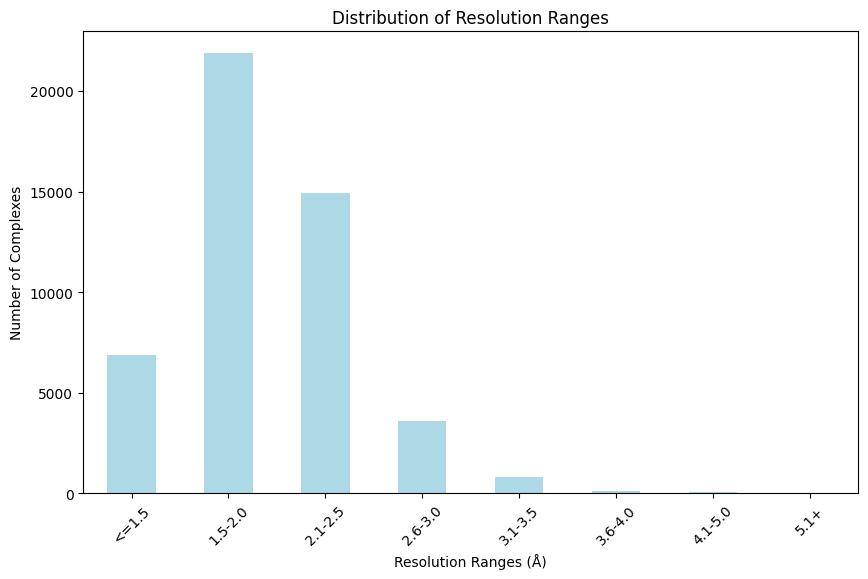

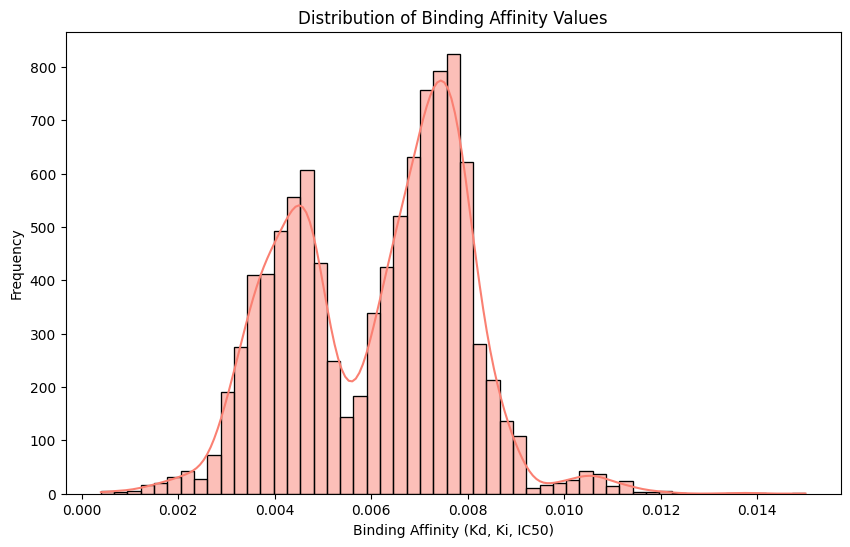

Number of unique SMILES (ligand structural diversity): 335


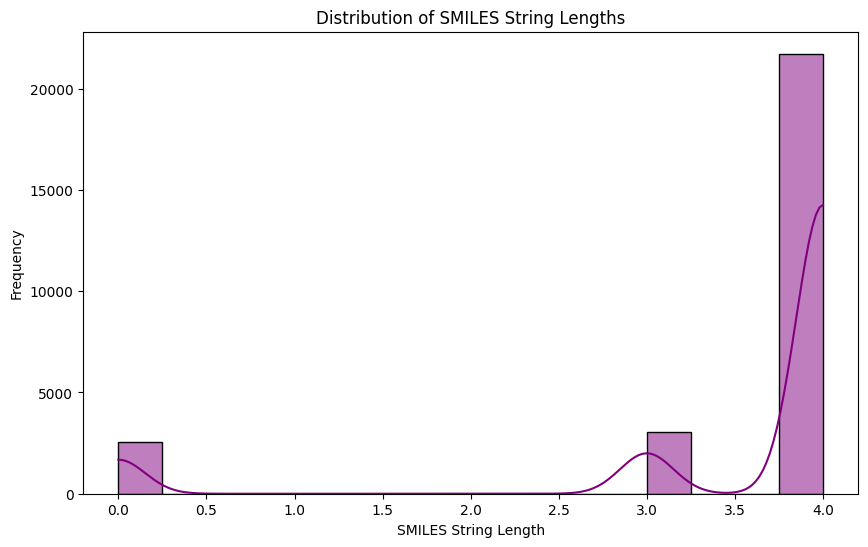

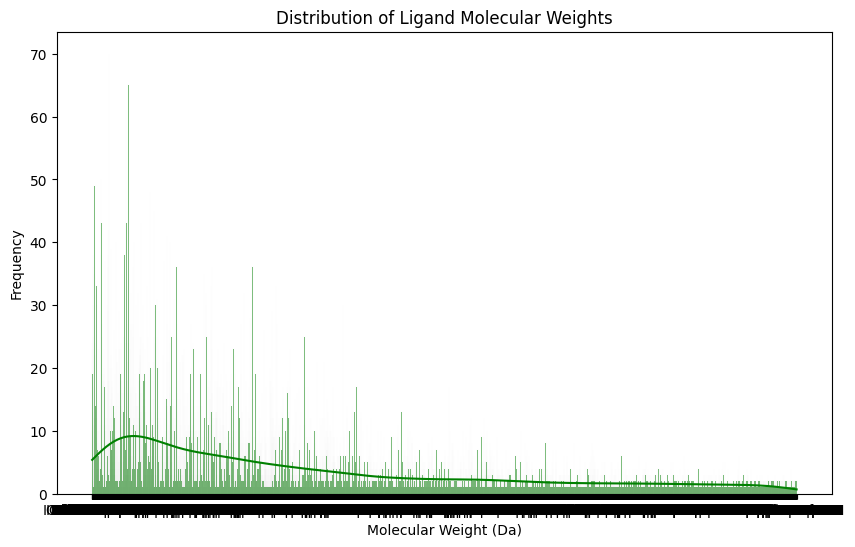

Number of unique ligands: 3518


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

df = pd.read_csv('merge002.csv')
total_complexes = df['PDB_Code'].nunique()
print(f'Total number of complexes: {total_complexes}')

resolution_columns = ['Resolution_merged', 'Resolution_structure', 'Resolution_x', 'Resolution_y']
df_resolutions = df[resolution_columns].apply(pd.to_numeric, errors='coerce')

bins = [0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, 5.0, 10]
labels = ['<=1.5', '1.5-2.0', '2.1-2.5', '2.6-3.0', '3.1-3.5', '3.6-4.0', '4.1-5.0', '5.1+']

df_resolutions_binned = pd.cut(df_resolutions.stack(), bins=bins, labels=labels).value_counts().sort_index()
plt.figure(figsize=(10, 6))
df_resolutions_binned.plot(kind='bar', color='lightblue')
plt.title('Distribution of Resolution Ranges')
plt.xlabel('Resolution Ranges (Å)')
plt.ylabel('Number of Complexes')
plt.xticks(rotation=45)
plt.show()

binding_affinity_columns = ['Binding_Affinity', 'Binding_Affinity_Type', 'Binding_Value']
df['Binding_Affinity'] = pd.to_numeric(df['Binding_Affinity'], errors='coerce')
plt.figure(figsize=(10, 6))
sns.histplot(df['Binding_Affinity'].dropna(), kde=True, color='salmon')
plt.title('Distribution of Binding Affinity Values')
plt.xlabel('Binding Affinity (Kd, Ki, IC50)')
plt.ylabel('Frequency')
plt.show()

smiles_diversity = df['SMILES'].nunique()
print(f'Number of unique SMILES (ligand structural diversity): {smiles_diversity}')
df['SMILES_length'] = df['SMILES'].apply(lambda x: len(str(x)) if pd.notnull(x) else 0)

plt.figure(figsize=(10, 6))
sns.histplot(df['SMILES_length'].dropna(), kde=True, color='purple')
plt.title('Distribution of SMILES String Lengths')
plt.xlabel('SMILES String Length')
plt.ylabel('Frequency')
plt.show()

plt.figure(figsize=(10, 6))
sns.histplot(df['Molecular_Weight'].dropna(), kde=True, color='green')
plt.title('Distribution of Ligand Molecular Weights')
plt.xlabel('Molecular Weight (Da)')
plt.ylabel('Frequency')
plt.show()

ligand_diversity = df['Ligand_Name_merged'].nunique()
print(f'Number of unique ligands: {ligand_diversity}')

Total number of complexes: 22005
Resolution Summary:
count    27019.000000
mean         2.079027
std          0.508728
min          0.750000
25%          1.750000
50%          2.000000
75%          2.400000
max         11.000000
Name: Resolution, dtype: float64


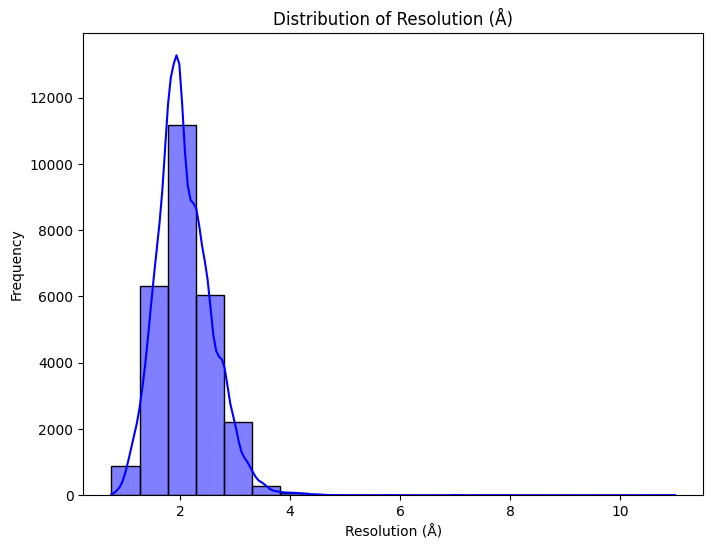

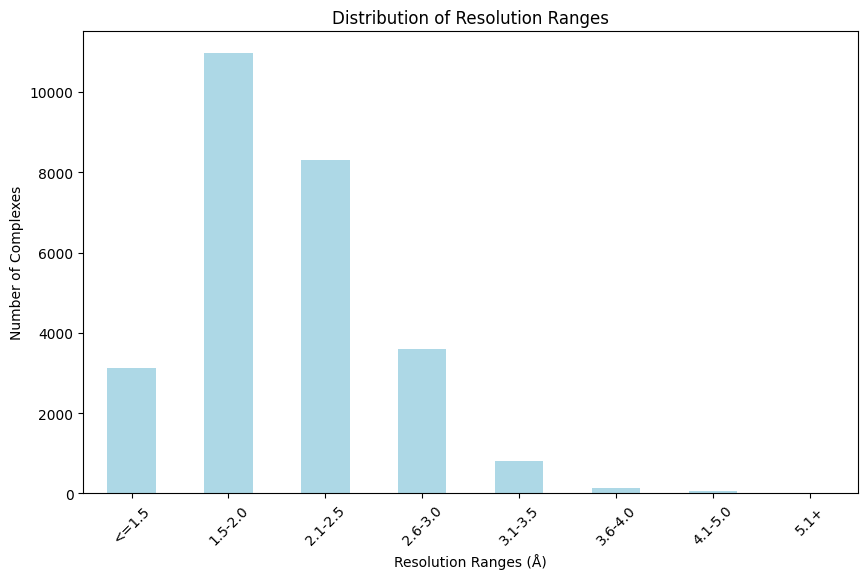

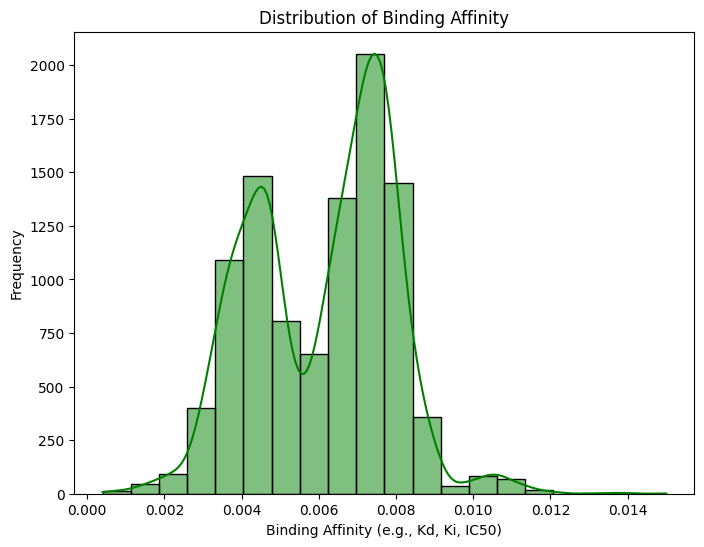

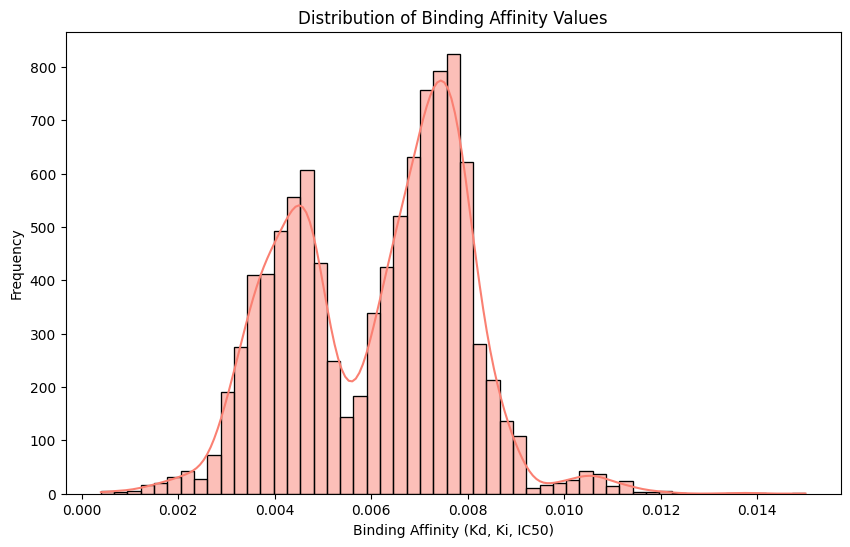

Number of unique SMILES (ligand structural diversity): 335


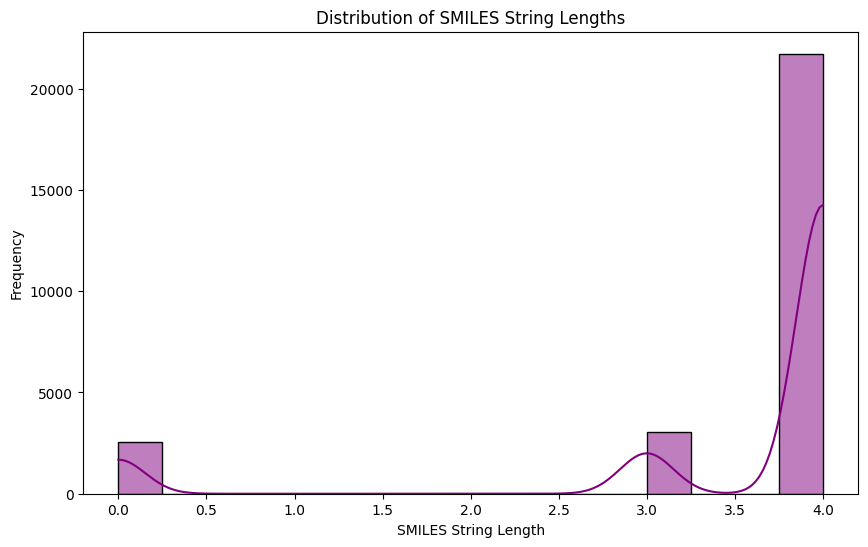

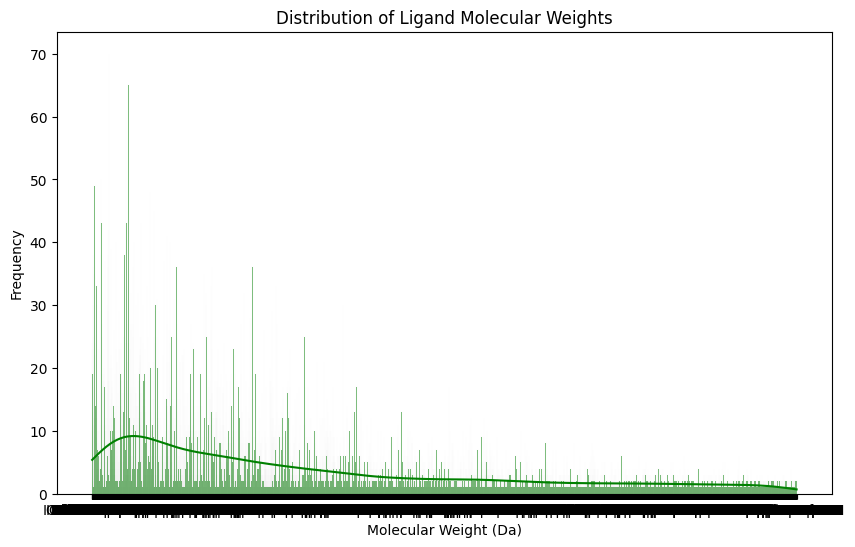

Number of unique ligands: 11586


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

df = pd.read_csv('merged002.csv')

total_complexes = df['PDB_Code'].nunique()
print(f'Total number of complexes: {total_complexes}')

df['Resolution'] = pd.to_numeric(df['Resolution'], errors='coerce')
resolution_summary = df['Resolution'].describe()
print("Resolution Summary:")
print(resolution_summary)

plt.figure(figsize=(8, 6))
sns.histplot(df['Resolution'], bins=20, kde=True, color='blue')
plt.title('Distribution of Resolution (Å)')
plt.xlabel('Resolution (Å)')
plt.ylabel('Frequency')
plt.show()

resolution_columns = ['Resolution']
df_resolutions = df[resolution_columns].apply(pd.to_numeric, errors='coerce')

bins = [0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, 5.0, 10]
labels = ['<=1.5', '1.5-2.0', '2.1-2.5', '2.6-3.0', '3.1-3.5', '3.6-4.0', '4.1-5.0', '5.1+']

df_resolutions_binned = pd.cut(df_resolutions.stack(), bins=bins, labels=labels).value_counts().sort_index()

plt.figure(figsize=(10, 6))
df_resolutions_binned.plot(kind='bar', color='lightblue')
plt.title('Distribution of Resolution Ranges')
plt.xlabel('Resolution Ranges (Å)')
plt.ylabel('Number of Complexes')
plt.xticks(rotation=45)
plt.show()

df['Binding_Affinity'] = pd.to_numeric(df['Binding_Affinity'], errors='coerce')

plt.figure(figsize=(8, 6))
sns.histplot(df['Binding_Affinity'], bins=20, kde=True, color='green')
plt.title('Distribution of Binding Affinity')
plt.xlabel('Binding Affinity (e.g., Kd, Ki, IC50)')
plt.ylabel('Frequency')
plt.show()

binding_affinity_columns = ['Binding_Affinity', 'Binding_Affinity_Type', 'Binding_Value']

df['Binding_Affinity'] = pd.to_numeric(df['Binding_Affinity'], errors='coerce')

plt.figure(figsize=(10, 6))
sns.histplot(df['Binding_Affinity'].dropna(), kde=True, color='salmon')
plt.title('Distribution of Binding Affinity Values')
plt.xlabel('Binding Affinity (Kd, Ki, IC50)')
plt.ylabel('Frequency')
plt.show()

smiles_diversity = df['SMILES'].nunique()

print(f'Number of unique SMILES (ligand structural diversity): {smiles_diversity}')

df['SMILES_length'] = df['SMILES'].apply(lambda x: len(str(x)) if pd.notnull(x) else 0)

plt.figure(figsize=(10, 6))
sns.histplot(df['SMILES_length'].dropna(), kde=True, color='purple')
plt.title('Distribution of SMILES String Lengths')
plt.xlabel('SMILES String Length')
plt.ylabel('Frequency')
plt.show()

plt.figure(figsize=(10, 6))
sns.histplot(df['Molecular_Weight'].dropna(), kde=True, color='green')
plt.title('Distribution of Ligand Molecular Weights')
plt.xlabel('Molecular Weight (Da)')
plt.ylabel('Frequency')
plt.show()

ligand_diversity = df['Ligand_Name'].nunique()
print(f'Number of unique ligands: {ligand_diversity}')

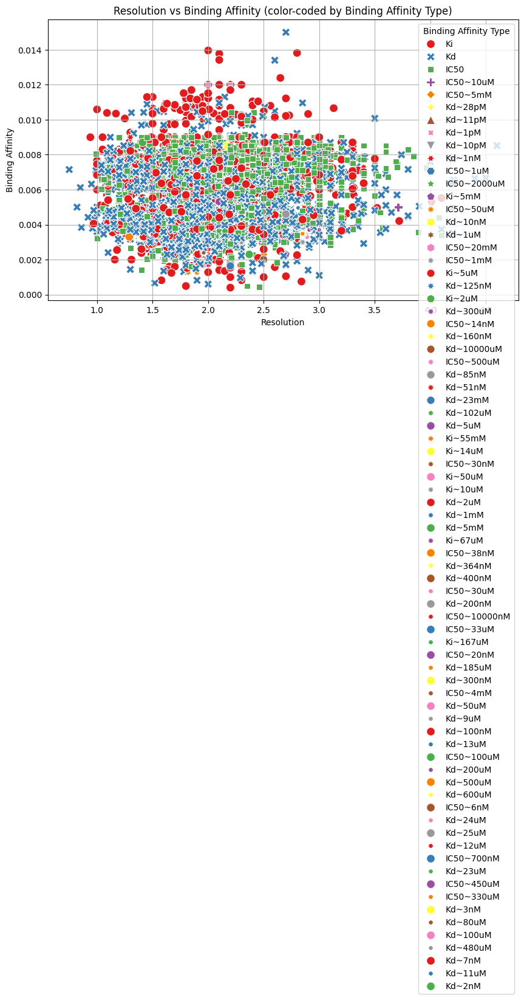

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

df = pd.read_csv('merge002.csv')

df['Resolution_structure'] = pd.to_numeric(df['Resolution_structure'], errors='coerce')
df['Binding_Affinity'] = pd.to_numeric(df['Binding_Affinity'], errors='coerce')

df_clean = df.dropna(subset=['Resolution_structure', 'Binding_Affinity', 'Binding_Affinity_Type'])

plt.figure(figsize=(10, 6))
sns.scatterplot(x='Resolution_structure',
                y='Binding_Affinity',
                hue='Binding_Affinity_Type',
                data=df_clean,
                palette='Set1',
                style='Binding_Affinity_Type',
                s=100)

plt.title('Resolution vs Binding Affinity (color-coded by Binding Affinity Type)')
plt.xlabel('Resolution')
plt.ylabel('Binding Affinity')
plt.legend(title='Binding Affinity Type')
plt.grid(True)

plt.show()

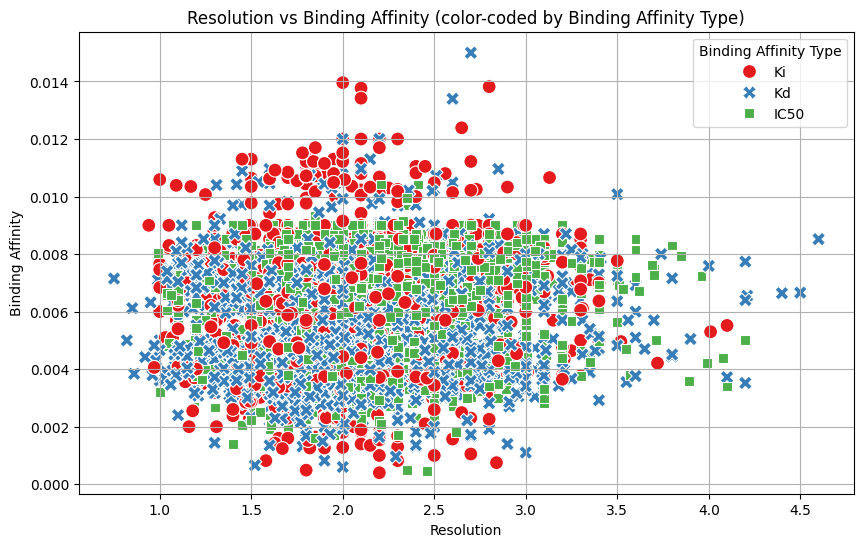

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

df = pd.read_csv('merge002.csv')
df['Resolution_structure'] = pd.to_numeric(df['Resolution_structure'], errors='coerce')
df['Binding_Affinity'] = pd.to_numeric(df['Binding_Affinity'], errors='coerce')
df['Binding_Affinity_Type_Clean'] = df['Binding_Affinity_Type'].str.split('~').str[0]
df_clean = df.dropna(subset=['Resolution_structure', 'Binding_Affinity', 'Binding_Affinity_Type_Clean'])

plt.figure(figsize=(10, 6))
sns.scatterplot(x='Resolution_structure',
                y='Binding_Affinity',
                hue='Binding_Affinity_Type_Clean',
                data=df_clean,
                palette='Set1',
                style='Binding_Affinity_Type_Clean',
                s=100)

plt.title('Resolution vs Binding Affinity (color-coded by Binding Affinity Type)')
plt.xlabel('Resolution')
plt.ylabel('Binding Affinity')
plt.legend(title='Binding Affinity Type')
plt.grid(True)

plt.show()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27323 entries, 0 to 27322
Data columns (total 42 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   PDB_Code                   27323 non-null  object 
 1   Release_Year_refined_name  10370 non-null  float64
 2   Uniprot_ID_x               10370 non-null  object 
 3   Protein_Name_x             10370 non-null  object 
 4   Resolution_merged          10634 non-null  float64
 5   Release_Year_refined_set   10634 non-null  float64
 6   Binding_Data_merged        10634 non-null  object 
 7   Reference_merged           10634 non-null  object 
 8   Ligand_Name_merged         10634 non-null  object 
 9   Resolution_structure       24761 non-null  object 
 10  Release_Year_merged        24761 non-null  float64
 11  R-factor                   24761 non-null  float64
 12  R-free                     24761 non-null  float64
 13  Delta-R                    24761 non-null  flo

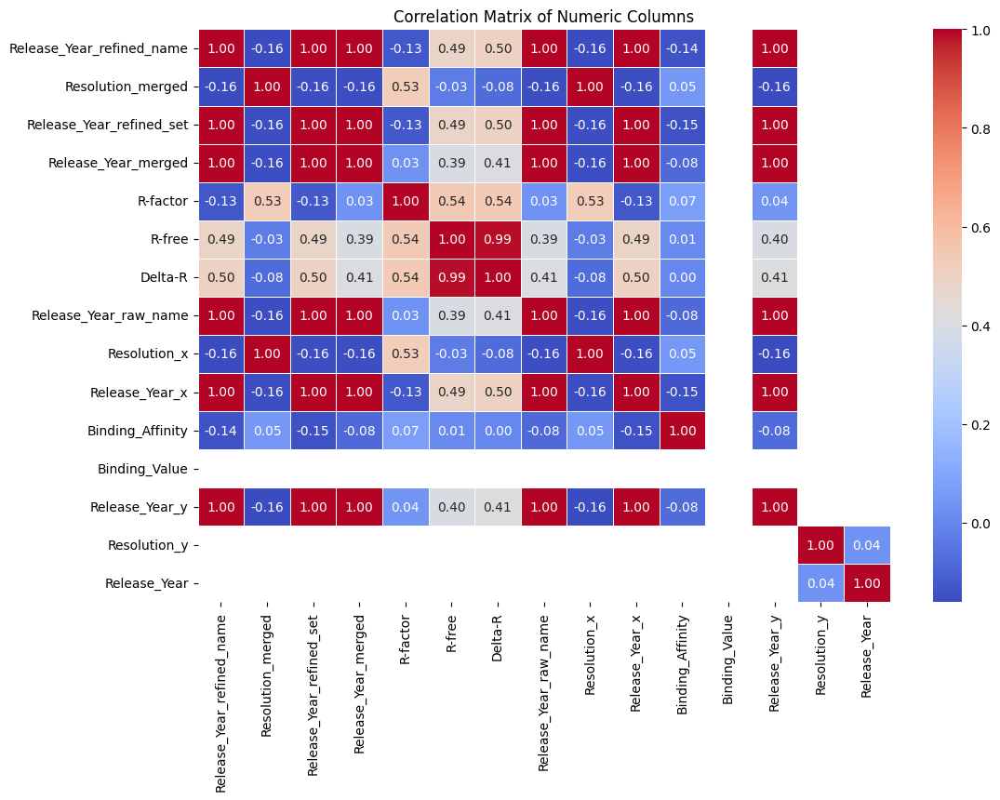

In [ ]:
df = pd.read_csv('merge002.csv')  # Replace 'Merge002.csv' with your file name if needed
df.info()  # This will give you an overview of data types in the columns
numeric_cols = df.select_dtypes(include=['float64', 'int64']).columns
correlation_matrix = df[numeric_cols].corr()

plt.figure(figsize=(12, 8))  # Adjust the figure size as needed
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix of Numeric Columns')
plt.show()

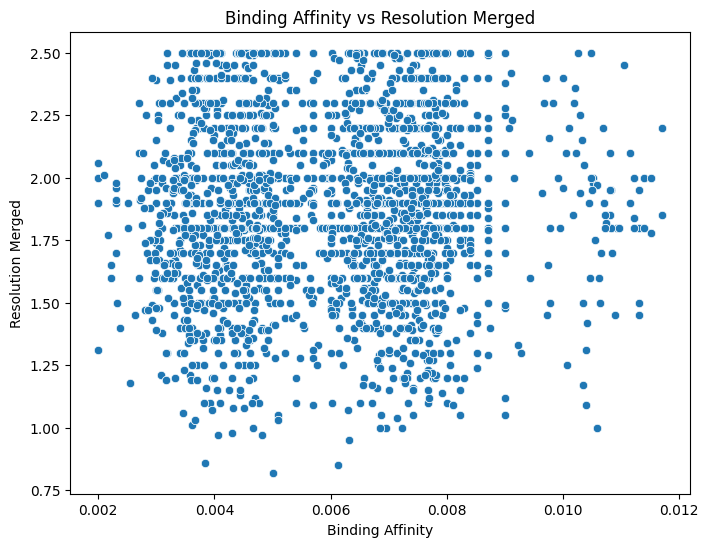

In [ ]:
plt.figure(figsize=(8, 6))
sns.scatterplot(x='Binding_Affinity', y='Resolution_merged', data=df)
plt.title('Binding Affinity vs Resolution Merged')
plt.xlabel('Binding Affinity')
plt.ylabel('Resolution Merged')
plt.show()

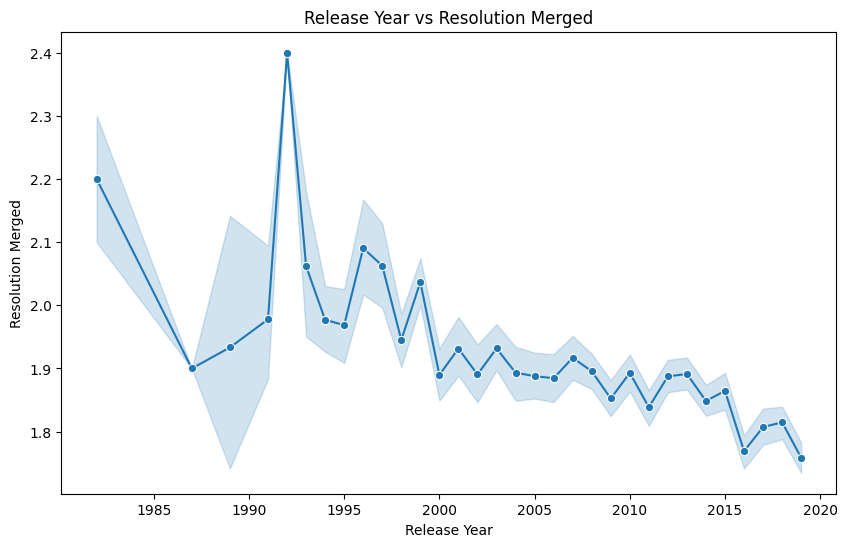

In [ ]:
plt.figure(figsize=(10, 6))
sns.lineplot(x='Release_Year_merged', y='Resolution_merged', data=df, marker='o')
plt.title('Release Year vs Resolution Merged')
plt.xlabel('Release Year')
plt.ylabel('Resolution Merged')
plt.show()

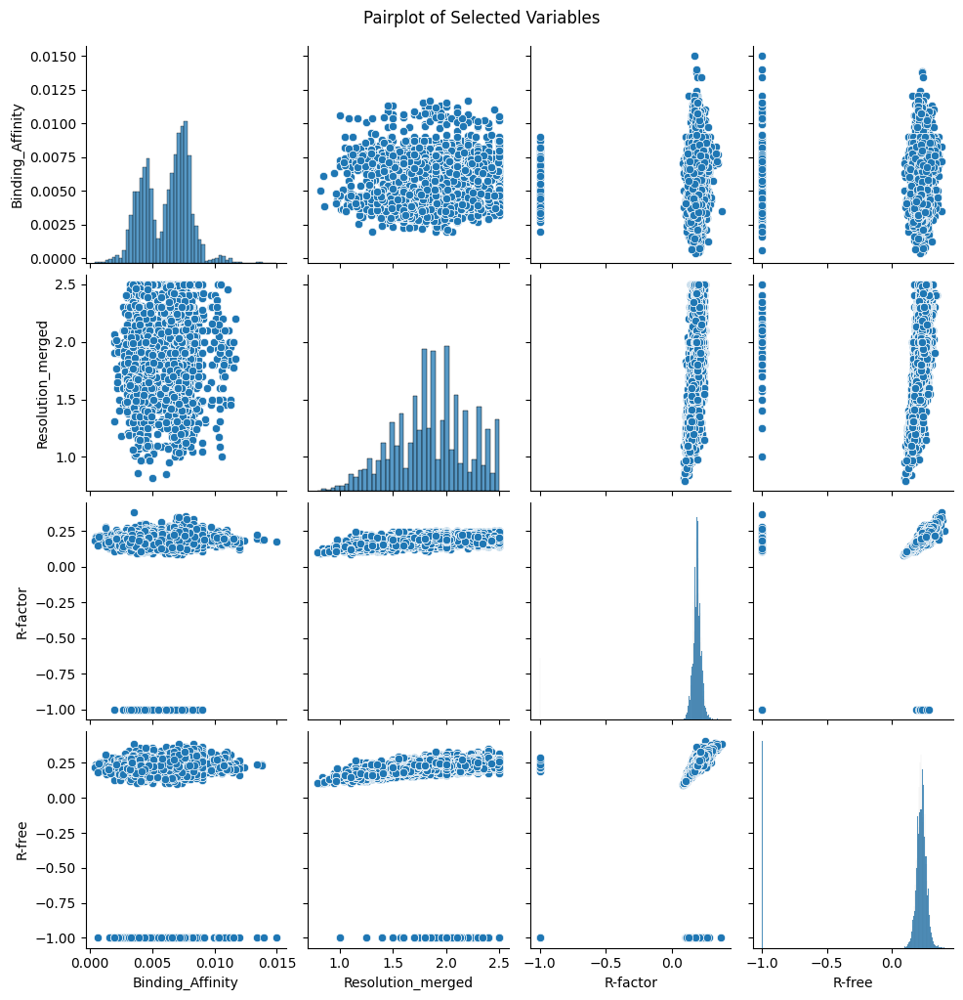

In [ ]:
sns.pairplot(df[['Binding_Affinity', 'Resolution_merged', 'R-factor', 'R-free']])
plt.suptitle('Pairplot of Selected Variables', y=1.02)
plt.show()

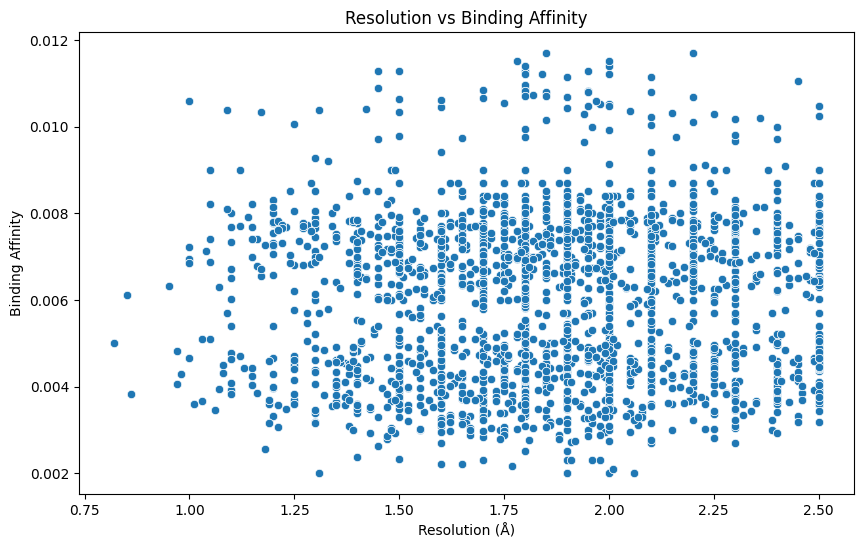

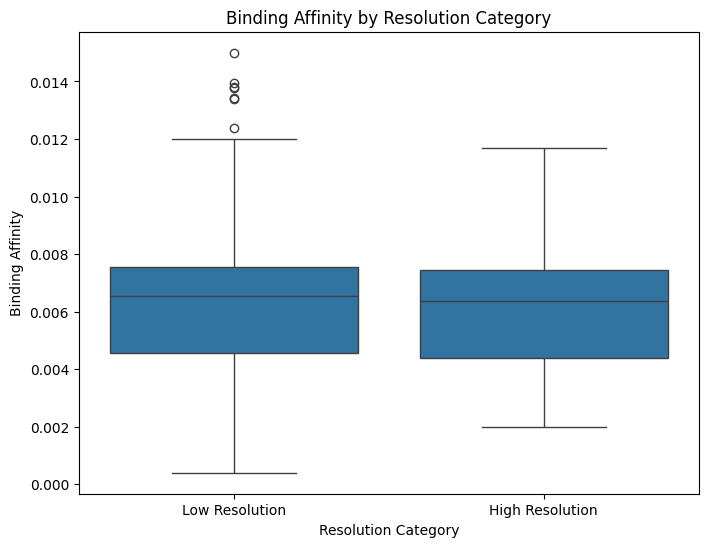

In [ ]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Resolution_merged', y='Binding_Affinity', data=df)
plt.title('Resolution vs Binding Affinity')
plt.xlabel('Resolution (Å)')
plt.ylabel('Binding Affinity')
plt.show()

df['Resolution_Category'] = df['Resolution_merged'].apply(lambda x: 'High Resolution' if x <= 2.0 else 'Low Resolution')

plt.figure(figsize=(8, 6))
sns.boxplot(x='Resolution_Category', y='Binding_Affinity', data=df)
plt.title('Binding Affinity by Resolution Category')
plt.xlabel('Resolution Category')
plt.ylabel('Binding Affinity')
plt.show()

                            OLS Regression Results                            
Dep. Variable:       Binding_Affinity   R-squared:                       0.003
Model:                            OLS   Adj. R-squared:                  0.002
Method:                 Least Squares   F-statistic:                     11.42
Date:                Mon, 24 Feb 2025   Prob (F-statistic):           0.000733
Time:                        01:03:41   Log-Likelihood:                 21329.
No. Observations:                4386   AIC:                        -4.265e+04
Df Residuals:                    4384   BIC:                        -4.264e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                 0.0056      0.00

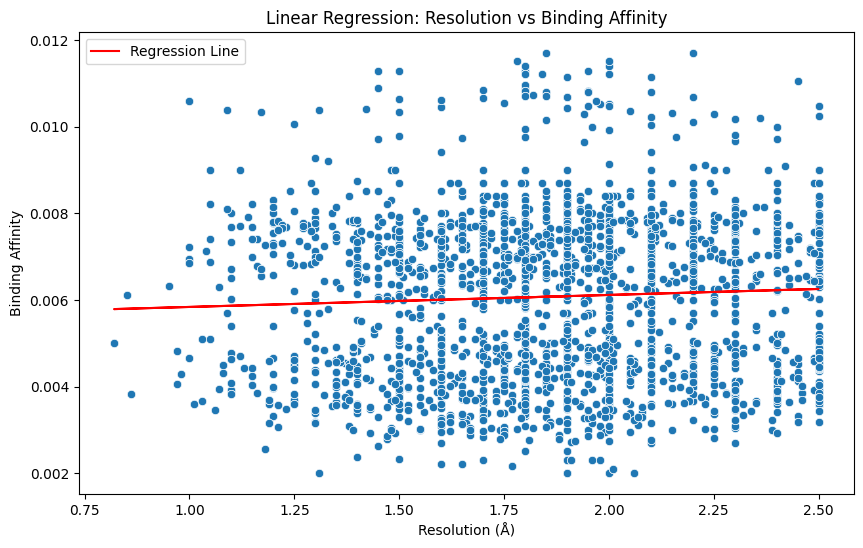

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import statsmodels.api as sm
import numpy as np

df_clean = df.dropna(subset=['Resolution_merged', 'Binding_Affinity'])
X = df_clean['Resolution_merged']
y = df_clean['Binding_Affinity']
X = sm.add_constant(X)
model = sm.OLS(y, X).fit()
print(model.summary())

plt.figure(figsize=(10, 6))
sns.scatterplot(x='Resolution_merged', y='Binding_Affinity', data=df_clean)
plt.plot(df_clean['Resolution_merged'], model.predict(X), color='red', label='Regression Line')
plt.title('Linear Regression: Resolution vs Binding Affinity')
plt.xlabel('Resolution (Å)')
plt.ylabel('Binding Affinity')
plt.legend()
plt.show()

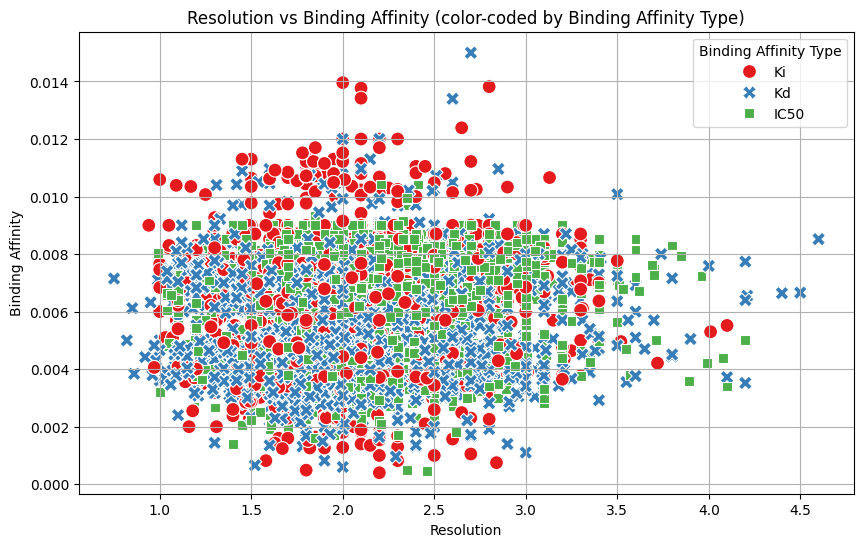

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

df = pd.read_csv('merged002.csv')
df['Resolution'] = pd.to_numeric(df['Resolution'], errors='coerce')
df['Binding_Affinity'] = pd.to_numeric(df['Binding_Affinity'], errors='coerce')
df_clean = df.dropna(subset=['Resolution', 'Binding_Affinity', 'Binding_Affinity_Type'])

plt.figure(figsize=(10, 6))
sns.scatterplot(x='Resolution',
                y='Binding_Affinity',
                hue='Binding_Affinity_Type',
                data=df_clean,
                palette='Set1',
                style='Binding_Affinity_Type',
                s=100)

plt.title('Resolution vs Binding Affinity (color-coded by Binding Affinity Type)')
plt.xlabel('Resolution')
plt.ylabel('Binding Affinity')
plt.legend(title='Binding Affinity Type')
plt.grid(True)

plt.show()

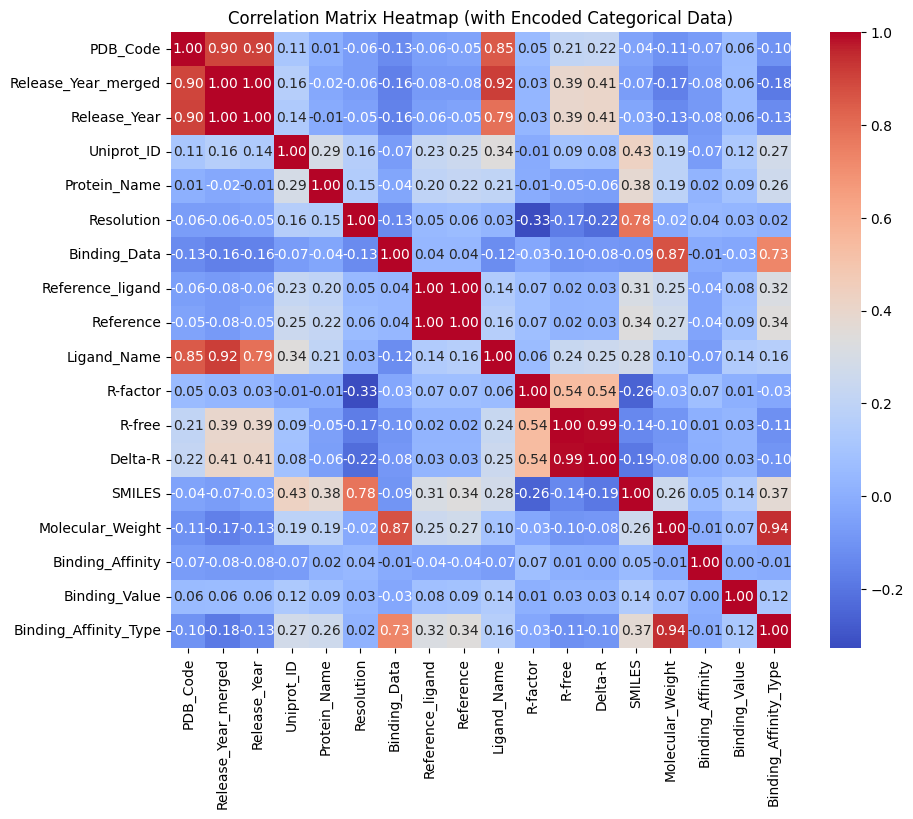

In [ ]:
import pandas as pd #run
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder

df = pd.read_csv('merged002.csv')
label_encoder = LabelEncoder()
for column in df.select_dtypes(include=['object']).columns:
    df[column] = label_encoder.fit_transform(df[column].astype(str))
numerical_columns = df.select_dtypes(include=['number']).columns
correlation_matrix = df[numerical_columns].corr()
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', cbar=True)
plt.title('Correlation Matrix Heatmap (with Encoded Categorical Data)')
plt.show()

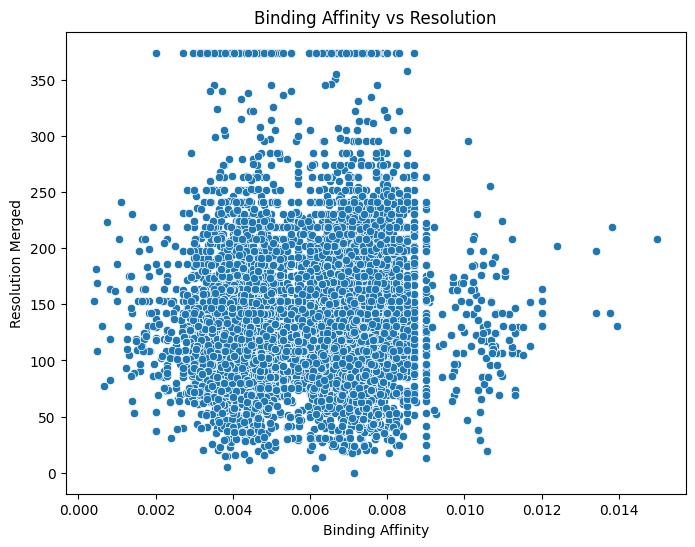

In [ ]:
plt.figure(figsize=(8, 6))
sns.scatterplot(x='Binding_Affinity', y='Resolution', data=df)
plt.title('Binding Affinity vs Resolution')
plt.xlabel('Binding Affinity')
plt.ylabel('Resolution Merged')
plt.show()

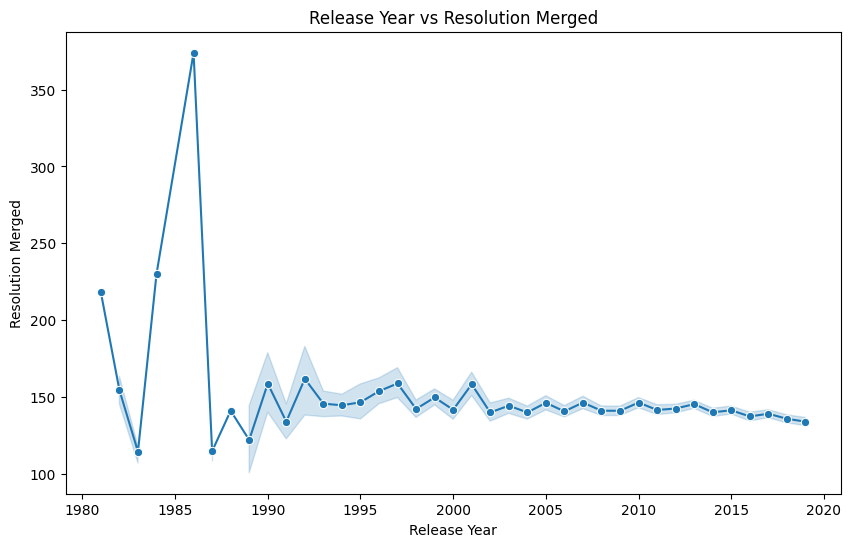

In [ ]:
plt.figure(figsize=(10, 6))
sns.lineplot(x='Release_Year', y='Resolution', data=df, marker='o')
plt.title('Release Year vs Resolution Merged')
plt.xlabel('Release Year')
plt.ylabel('Resolution Merged')
plt.show()

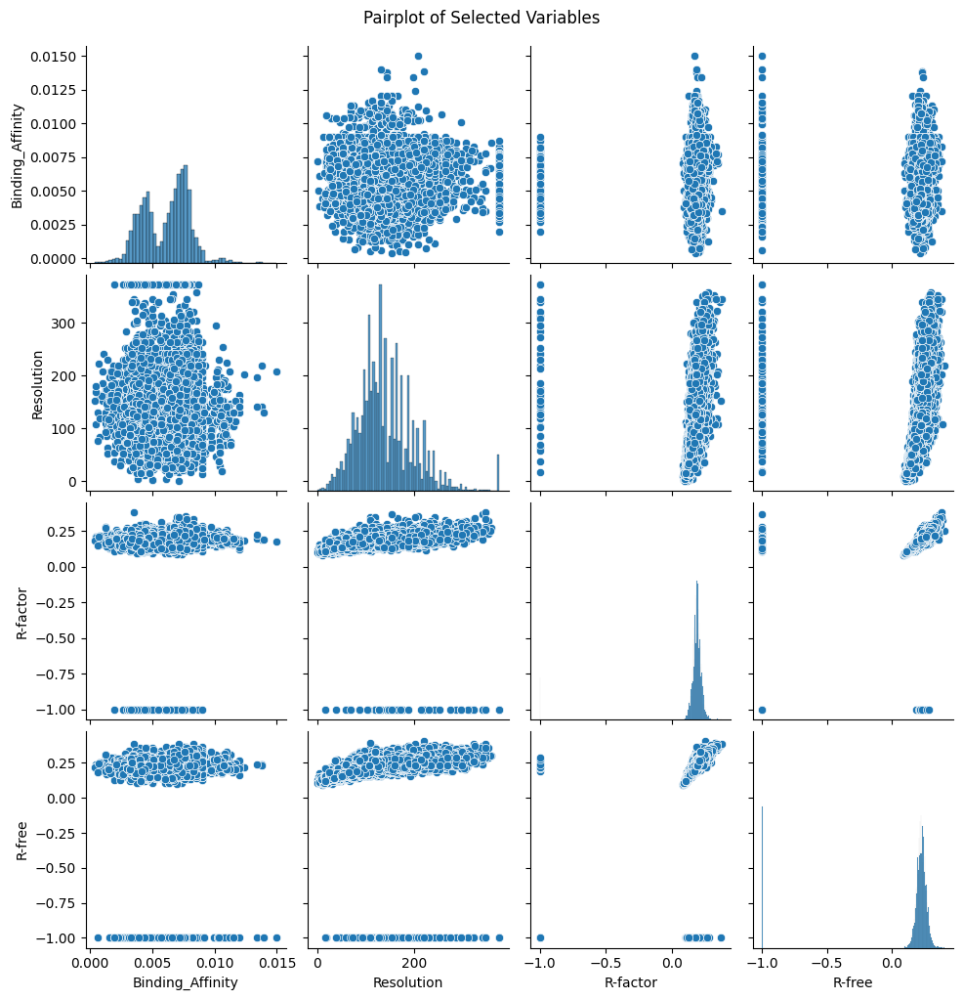

In [ ]:
sns.pairplot(df[['Binding_Affinity', 'Resolution', 'R-factor', 'R-free']])
plt.suptitle('Pairplot of Selected Variables', y=1.02)
plt.show()

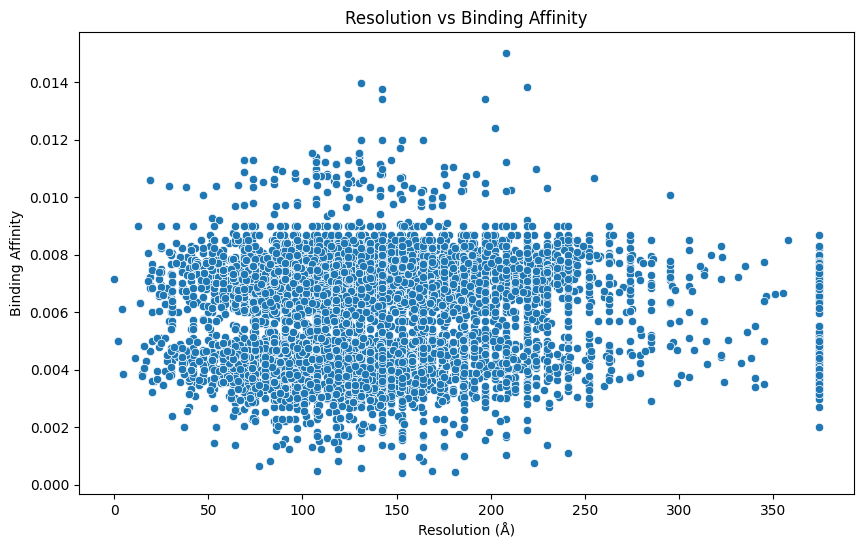

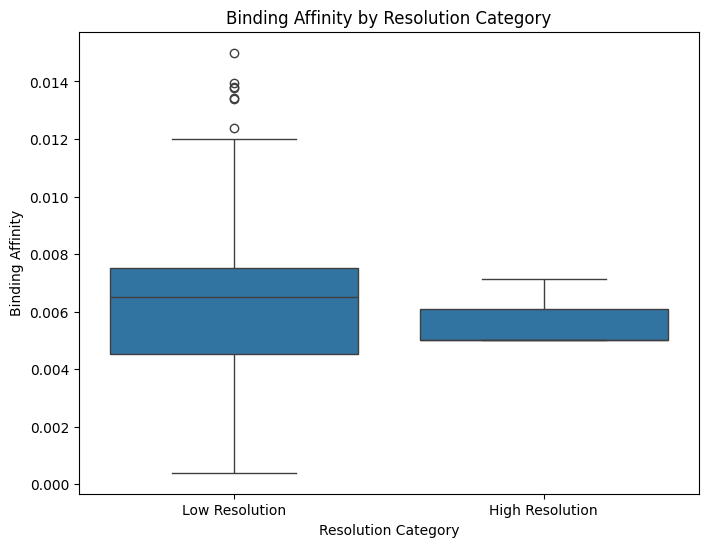

In [ ]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Resolution', y='Binding_Affinity', data=df)
plt.title('Resolution vs Binding Affinity')
plt.xlabel('Resolution (Å)')
plt.ylabel('Binding Affinity')
plt.show()

df['Resolution_Category'] = df['Resolution'].apply(lambda x: 'High Resolution' if x <= 2.0 else 'Low Resolution')

plt.figure(figsize=(8, 6))
sns.boxplot(x='Resolution_Category', y='Binding_Affinity', data=df)
plt.title('Binding Affinity by Resolution Category')
plt.xlabel('Resolution Category')
plt.ylabel('Binding Affinity')
plt.show()

                            OLS Regression Results                            
Dep. Variable:       Binding_Affinity   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                  0.002
Method:                 Least Squares   F-statistic:                     19.90
Date:                Mon, 24 Feb 2025   Prob (F-statistic):           8.26e-06
Time:                        18:21:14   Log-Likelihood:                 49014.
No. Observations:               10036   AIC:                        -9.802e+04
Df Residuals:                   10034   BIC:                        -9.801e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0059   4.68e-05    126.359      0.0

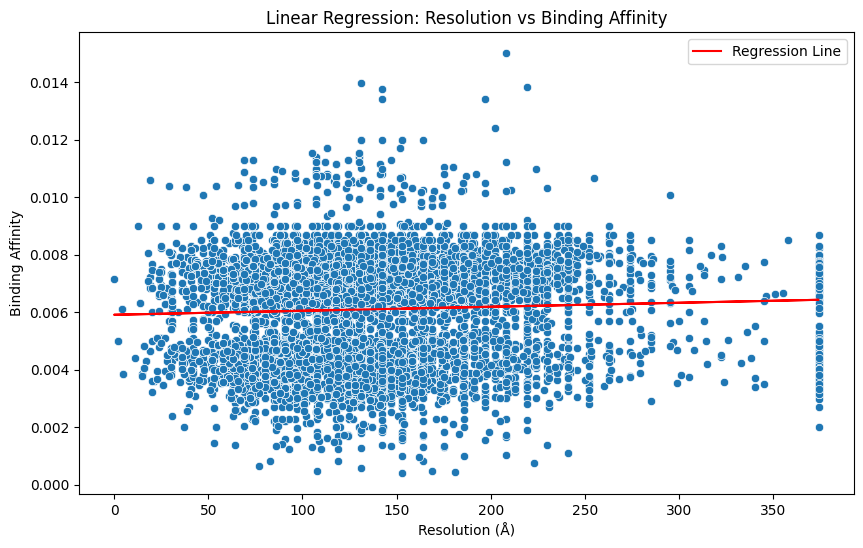

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import statsmodels.api as sm
import numpy as np

df_clean = df.dropna(subset=['Resolution', 'Binding_Affinity'])
X = df_clean['Resolution']
y = df_clean['Binding_Affinity']
X = sm.add_constant(X)
model = sm.OLS(y, X).fit()
print(model.summary())

plt.figure(figsize=(10, 6))
sns.scatterplot(x='Resolution', y='Binding_Affinity', data=df_clean)
plt.plot(df_clean['Resolution'], model.predict(X), color='red', label='Regression Line')
plt.title('Linear Regression: Resolution vs Binding Affinity')
plt.xlabel('Resolution (Å)')
plt.ylabel('Binding Affinity')
plt.legend()
plt.show()

In [ ]:
import pandas as pd

clustering_df = pd.read_csv('processed_INDEX_clustering_2020.csv')
protein_df = pd.read_csv('processed_INDEX_protein_2020.csv')

merged_df = pd.merge(clustering_df, protein_df, on='PDB_Code')
grouped_df = merged_df.groupby('PDB_Code')['Protein_Name'].apply(list).reset_index()
print(grouped_df)

Empty DataFrame
Columns: [PDB_Code, Protein_Name]
Index: []


In [ ]:
import pandas as pd

protein_data = pd.read_csv('processed_INDEX_protein_2020.csv')
binding_data = pd.read_csv('processed_INDEX_clustering_2020.csv')
merged_data = pd.merge(protein_data, binding_data, on='PDB_Code', how='inner')

In [ ]:
import pandas as pd

df_clustering = pd.read_csv('processed_INDEX_clustering_2020.csv')
df_protein = pd.read_csv('processed_INDEX_protein_2020.csv')
df_clustering['PDB_Code'] = df_clustering['PDB_Code'].str.strip().str.upper()
df_protein['PDB_Code'] = df_protein['PDB_Code'].str.strip().str.upper()
merged_df = pd.merge(df_clustering, df_protein, on='PDB_Code')
merged_df.head()

,PDB_Code,Resolution,Release_Year_x,Binding_Data,Reference,Ligand_Name,Release_Year_y,Uniprot_ID,Protein_Name


In [ ]:
common_pdb_codes = set(df_clustering['PDB_Code']).intersection(df_protein['PDB_Code'])
print(f"Number of common PDB_Code: {len(common_pdb_codes)}")

Number of common PDB_Code: 0


In [ ]:
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import numpy as np

binding_data = pd.read_csv('processed_INDEX_clustering_2020.csv')
protein_data = pd.read_csv('processed_INDEX_protein_2020.csv')
merged_data = pd.merge(binding_data, protein_data, on='PDB_Code')

if merged_data.empty:
    print("Merged data is empty! Check PDB_Code matching.")
else:
    print(f"Merged data shape: {merged_data.shape}")

if merged_data['Uniprot_ID'].isnull().sum() > 0:
    print(f"Uniprot_ID contains {merged_data['Uniprot_ID'].isnull().sum()} missing values!")
else:
    print("Uniprot_ID is valid.")

uniprot_ids = merged_data['Uniprot_ID'].unique()

if len(uniprot_ids) == 0:
    print("No unique Uniprot_IDs found for clustering.")
else:
    print(f"Found {len(uniprot_ids)} unique Uniprot_IDs.")

    np.random.seed(42)
    protein_features = np.random.rand(len(uniprot_ids), 5)

    scaler = StandardScaler()
    protein_features_scaled = scaler.fit_transform(protein_features)

    kmeans = KMeans(n_clusters=5, random_state=42)
    merged_data['Sequence_Cluster'] = kmeans.fit_predict(protein_features_scaled)

    merged_data.to_csv('merged_with_sequence_clusters.csv', index=False)

    print(merged_data.head())

Merged data is empty! Check PDB_Code matching.
Uniprot_ID is valid.
No unique Uniprot_IDs found for clustering.


In [ ]:
binding_data = pd.read_csv('processed_INDEX_clustering_2020.csv')
protein_data = pd.read_csv('processed_INDEX_protein_2020.csv')
print("Binding data PDB_Code values (first 5):", binding_data['PDB_Code'].head())
print("Protein data PDB_Code values (first 5):", protein_data['PDB_Code'].head())

binding_data['PDB_Code'] = binding_data['PDB_Code'].str.strip()
protein_data['PDB_Code'] = protein_data['PDB_Code'].str.strip()
binding_data['PDB_Code'] = binding_data['PDB_Code'].astype(str)
protein_data['PDB_Code'] = protein_data['PDB_Code'].astype(str)
merged_data = pd.merge(binding_data, protein_data, on='PDB_Code', how='inner')

if merged_data.empty:
    print("Merged data is empty! There were no matching PDB_Code values.")
else:
    print(f"Merged data shape: {merged_data.shape}")
print(merged_data.head())

if merged_data['Uniprot_ID'].isnull().sum() > 0:
    print(f"Uniprot_ID contains {merged_data['Uniprot_ID'].isnull().sum()} missing values!")
else:
    print("Uniprot_ID is valid.")

uniprot_ids = merged_data['Uniprot_ID'].unique()
if len(uniprot_ids) == 0:
    print("No unique Uniprot_IDs found for clustering.")
else:
    print(f"Found {len(uniprot_ids)} unique Uniprot_IDs.")

Binding data PDB_Code values (first 5): 0    1fc2
1    3sgb
2    2tgp
3    2ptc
4    2sni
Name: PDB_Code, dtype: object
Protein data PDB_Code values (first 5): 0    6mu1
1    3t8s
2    1n4k
3    5urm
4    5urj
Name: PDB_Code, dtype: object
Merged data is empty! There were no matching PDB_Code values.
Empty DataFrame
Columns: [PDB_Code, Resolution, Release_Year_x, Binding_Data, Reference, Ligand_Name, Release_Year_y, Uniprot_ID, Protein_Name]
Index: []
Uniprot_ID is valid.
No unique Uniprot_IDs found for clustering.


In [ ]:
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import StandardScaler

file_path = 'processed_INDEX_protein_2020.csv'
df = pd.read_csv(file_path)
tfidf_vectorizer = TfidfVectorizer(stop_words='english')
protein_name_tfidf = tfidf_vectorizer.fit_transform(df['Protein_Name'])
n_clusters = 5
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
df['Cluster_Column'] = kmeans.fit_predict(protein_name_tfidf)
print(df.head())

  PDB_Code  Release_Year Uniprot_ID  \
0     6mu1          2018     P29994   
1     3t8s          2011     P29994   
2     1n4k          2002     P11881   
3     5urm          2017     O75643   
4     5urj          2017     O75643   

                                        Protein_Name  Cluster_Column  
0       INOSITOL 1,4,5-TRISPHOSPHATE RECEPTOR TYPE 1               0  
1       INOSITOL 1,4,5-TRISPHOSPHATE RECEPTOR TYPE 1               0  
2       INOSITOL 1,4,5-TRISPHOSPHATE RECEPTOR TYPE 1               0  
3  U5 SMALL NUCLEAR RIBONUCLEOPROTEIN 200 KDA HEL...               0  
4  U5 SMALL NUCLEAR RIBONUCLEOPROTEIN 200 KDA HEL...               0  


In [ ]:
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import LabelEncoder

file_path = 'processed_INDEX_protein_2020.csv'
df = pd.read_csv(file_path)
tfidf_vectorizer = TfidfVectorizer(stop_words='english')
protein_name_tfidf = tfidf_vectorizer.fit_transform(df['Protein_Name'])
n_clusters = 5
kmeans_protein = KMeans(n_clusters=n_clusters, random_state=42)
df['Cluster_Column_Protein'] = kmeans_protein.fit_predict(protein_name_tfidf)
label_encoder = LabelEncoder()
df['Uniprot_ID_encoded'] = label_encoder.fit_transform(df['Uniprot_ID'])
kmeans_uniprot = KMeans(n_clusters=n_clusters, random_state=42)
df['Cluster_Column_Uniprot'] = kmeans_uniprot.fit_predict(df[['Uniprot_ID_encoded']])
print(df.head())

  PDB_Code  Release_Year Uniprot_ID  \
0     6mu1          2018     P29994   
1     3t8s          2011     P29994   
2     1n4k          2002     P11881   
3     5urm          2017     O75643   
4     5urj          2017     O75643   

                                        Protein_Name  Cluster_Column_Protein  \
0       INOSITOL 1,4,5-TRISPHOSPHATE RECEPTOR TYPE 1                       0   
1       INOSITOL 1,4,5-TRISPHOSPHATE RECEPTOR TYPE 1                       0   
2       INOSITOL 1,4,5-TRISPHOSPHATE RECEPTOR TYPE 1                       0   
3  U5 SMALL NUCLEAR RIBONUCLEOPROTEIN 200 KDA HEL...                       0   
4  U5 SMALL NUCLEAR RIBONUCLEOPROTEIN 200 KDA HEL...                       0   

   Uniprot_ID_encoded  Cluster_Column_Uniprot  
0                1656                       3  
1                1656                       3  
2                1311                       3  
3                 681                       1  
4                 681                       

In [ ]:
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler

file_path = 'processed_INDEX_protein_2020.csv'
df = pd.read_csv(file_path)
label_encoder = LabelEncoder()
df['Uniprot_ID_encoded'] = label_encoder.fit_transform(df['Uniprot_ID'])
n_clusters = 5
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
df['Cluster_Column'] = kmeans.fit_predict(df[['Uniprot_ID_encoded']])
print(df.head())

  PDB_Code  Release_Year Uniprot_ID  \
0     6mu1          2018     P29994   
1     3t8s          2011     P29994   
2     1n4k          2002     P11881   
3     5urm          2017     O75643   
4     5urj          2017     O75643   

                                        Protein_Name  Uniprot_ID_encoded  \
0       INOSITOL 1,4,5-TRISPHOSPHATE RECEPTOR TYPE 1                1656   
1       INOSITOL 1,4,5-TRISPHOSPHATE RECEPTOR TYPE 1                1656   
2       INOSITOL 1,4,5-TRISPHOSPHATE RECEPTOR TYPE 1                1311   
3  U5 SMALL NUCLEAR RIBONUCLEOPROTEIN 200 KDA HEL...                 681   
4  U5 SMALL NUCLEAR RIBONUCLEOPROTEIN 200 KDA HEL...                 681   

   Cluster_Column  
0               3  
1               3  
2               3  
3               1  
4               1  


In [ ]:
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler

file_path = 'processed_INDEX_protein_2020.csv'
df = pd.read_csv(file_path)
label_encoder = LabelEncoder()
df['Uniprot_ID_encoded'] = label_encoder.fit_transform(df['Uniprot_ID'])
n_clusters = 5
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
df['Cluster_Column'] = kmeans.fit_predict(df[['Uniprot_ID_encoded']])
df['Cluster_Column'] = df['Cluster_Column'].apply(lambda x: f'cluster_{x:02d}')
print(df.head())

  PDB_Code  Release_Year Uniprot_ID  \
0     6mu1          2018     P29994   
1     3t8s          2011     P29994   
2     1n4k          2002     P11881   
3     5urm          2017     O75643   
4     5urj          2017     O75643   

                                        Protein_Name  Uniprot_ID_encoded  \
0       INOSITOL 1,4,5-TRISPHOSPHATE RECEPTOR TYPE 1                1656   
1       INOSITOL 1,4,5-TRISPHOSPHATE RECEPTOR TYPE 1                1656   
2       INOSITOL 1,4,5-TRISPHOSPHATE RECEPTOR TYPE 1                1311   
3  U5 SMALL NUCLEAR RIBONUCLEOPROTEIN 200 KDA HEL...                 681   
4  U5 SMALL NUCLEAR RIBONUCLEOPROTEIN 200 KDA HEL...                 681   

  Cluster_Column  
0     cluster_03  
1     cluster_03  
2     cluster_03  
3     cluster_01  
4     cluster_01  


  PDB_Code  Release_Year_merged  Release_Year Uniprot_ID  \
0     10GS               1998.0        1998.0     P09211   
1     10GS               1998.0        1998.0     P09211   
2     11GS               1999.0        1999.0     P09211   
3     13GS               1999.0        1999.0     P09211   
4     16PK               1998.0        1998.0     P07378   

                     Protein_Name Resolution Binding_Data  \
0  GLUTATHIONE S-TRANSFERASE P1-1        2.2     Ki=0.4uM   
1  GLUTATHIONE S-TRANSFERASE P1-1        2.2     Ki=0.4uM   
2       GLUTATHIONE S-TRANSFERASE       2.30     Ki=1.5uM   
3       GLUTATHIONE S-TRANSFERASE       1.90      Ki=24uM   
4       3-PHOSPHOGLYCERATE KINASE       1.60       Ki=6uM   

                                    Reference_ligand  \
0                                         .pdf (VWW)   
1                                         .pdf (VWW)   
2                     .pdf (2-mer) redundant to 3gss   
3                                         .pdf (

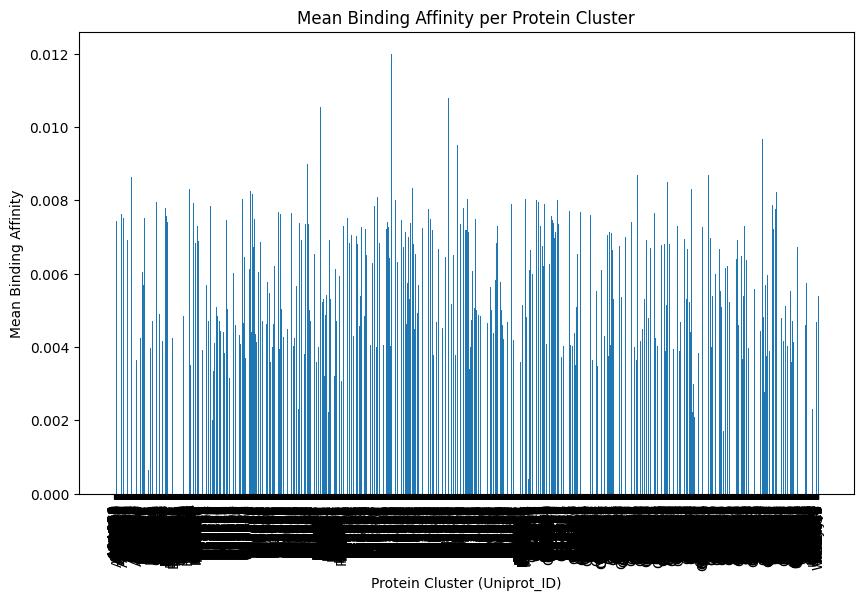

In [ ]:
import pandas as pd

df = pd.read_csv('merged002.csv')
print(df.head())

df['Binding_Affinity'] = pd.to_numeric(df['Binding_Affinity'], errors='coerce')
mean_binding_affinity = df.groupby('Uniprot_ID')['Binding_Affinity'].mean().reset_index()
print("Mean Binding Affinity per Cluster:")
print(mean_binding_affinity)

import matplotlib.pyplot as plt
plt.figure(figsize=(10, 6))
plt.bar(mean_binding_affinity['Uniprot_ID'], mean_binding_affinity['Binding_Affinity'])
plt.xlabel('Protein Cluster (Uniprot_ID)')
plt.ylabel('Mean Binding Affinity')
plt.title('Mean Binding Affinity per Protein Cluster')
plt.xticks(rotation=90)
plt.show()

  PDB_Code  Release_Year_merged  Release_Year Uniprot_ID  \
0     10GS               1998.0        1998.0     P09211   
1     10GS               1998.0        1998.0     P09211   
2     11GS               1999.0        1999.0     P09211   
3     13GS               1999.0        1999.0     P09211   
4     16PK               1998.0        1998.0     P07378   

                     Protein_Name Resolution Binding_Data  \
0  GLUTATHIONE S-TRANSFERASE P1-1        2.2     Ki=0.4uM   
1  GLUTATHIONE S-TRANSFERASE P1-1        2.2     Ki=0.4uM   
2       GLUTATHIONE S-TRANSFERASE       2.30     Ki=1.5uM   
3       GLUTATHIONE S-TRANSFERASE       1.90      Ki=24uM   
4       3-PHOSPHOGLYCERATE KINASE       1.60       Ki=6uM   

                                    Reference_ligand  \
0                                         .pdf (VWW)   
1                                         .pdf (VWW)   
2                     .pdf (2-mer) redundant to 3gss   
3                                         .pdf (

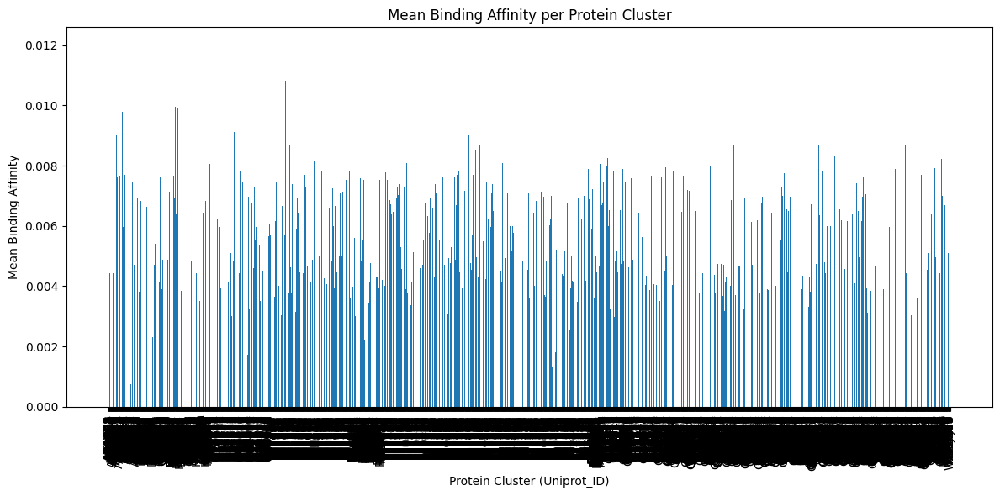

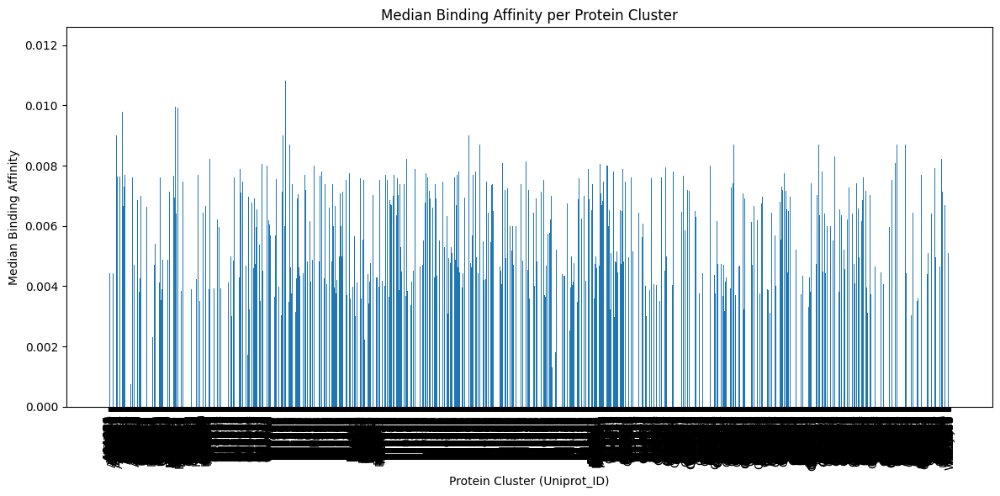

In [ ]:
import pandas as pd #run
import matplotlib.pyplot as plt

df = pd.read_csv('merged002.csv')
df['Binding_Affinity'] = pd.to_numeric(df['Binding_Affinity'], errors='coerce')
mean_binding_affinity = df.groupby('Uniprot_ID')['Binding_Affinity'].mean().reset_index()
median_binding_affinity = df.groupby('Uniprot_ID')['Binding_Affinity'].median().reset_index()

plt.figure(figsize=(12, 6))
plt.bar(mean_binding_affinity['Uniprot_ID'], mean_binding_affinity['Binding_Affinity'])
plt.xlabel('Protein Cluster (Uniprot_ID)')
plt.ylabel('Mean Binding Affinity')
plt.title('Mean Binding Affinity per Protein Cluster')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 6))
plt.bar(median_binding_affinity['Uniprot_ID'], median_binding_affinity['Binding_Affinity'])
plt.xlabel('Protein Cluster (Uniprot_ID)')
plt.ylabel('Median Binding Affinity')
plt.title('Median Binding Affinity per Protein Cluster')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

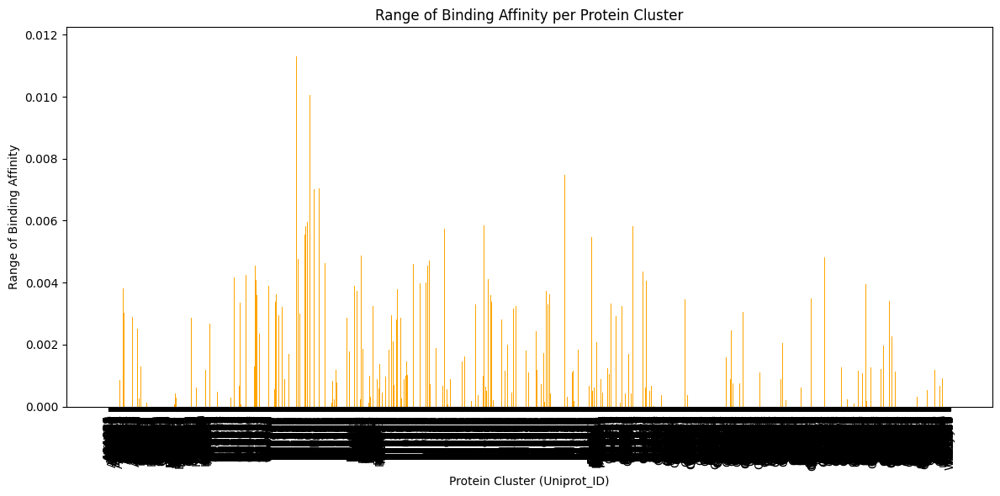

Clusters with the widest range of binding affinity:
    Uniprot_ID      min      max    range
790     P00730  0.00230  0.01396  0.01166
868     P02701  0.00369  0.01500  0.01131
791     P00734  0.00300  0.01377  0.01077
825     P00953  0.00110  0.01130  0.01020
930     P04058  0.00377  0.01382  0.01005

Clusters with the narrowest range of binding affinity:
     Uniprot_ID  min  max  range
3877     W6E076  NaN  NaN    NaN
3879     W7FL77  NaN  NaN    NaN
3882     W8RJF9  NaN  NaN    NaN
3883     W8TRN9  NaN  NaN    NaN
3886     W9BNU9  NaN  NaN    NaN


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

df = pd.read_csv('merged002.csv')
df['Binding_Affinity'] = pd.to_numeric(df['Binding_Affinity'], errors='coerce')
range_binding_affinity = df.groupby('Uniprot_ID')['Binding_Affinity'].agg(['min', 'max'])
range_binding_affinity['range'] = range_binding_affinity['max'] - range_binding_affinity['min']
range_binding_affinity = range_binding_affinity.reset_index()

plt.figure(figsize=(12, 6))
plt.bar(range_binding_affinity['Uniprot_ID'], range_binding_affinity['range'], color='orange')
plt.xlabel('Protein Cluster (Uniprot_ID)')
plt.ylabel('Range of Binding Affinity')
plt.title('Range of Binding Affinity per Protein Cluster')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

sorted_range_binding_affinity = range_binding_affinity.sort_values(by='range', ascending=False)
print("Clusters with the widest range of binding affinity:")
print(sorted_range_binding_affinity.head())

print("\nClusters with the narrowest range of binding affinity:")
print(sorted_range_binding_affinity.tail())

<ipython-input-79-60552b7a5a4d>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_clean['Cluster'] = kmeans.fit_predict(X_scaled)


             min      max      mean       std    range
Cluster                                               
0        0.00500  0.00558  0.005221  0.000171  0.00058
1        0.00367  0.00367  0.003670       NaN  0.00000
2        0.00757  0.00805  0.007797  0.000142  0.00048
3        0.00342  0.00396  0.003695  0.000151  0.00054
4        0.01000  0.01200  0.010747  0.000483  0.00200
5        0.00400  0.00500  0.004424  0.000405  0.00100
6        0.00619  0.00667  0.006444  0.000137  0.00048
7        0.00396  0.00446  0.004215  0.000150  0.00050
8        0.00040  0.00174  0.001299  0.000393  0.00134
9        0.00810  0.00874  0.008376  0.000205  0.00064
10       0.00712  0.00755  0.007335  0.000127  0.00043
11       0.00501  0.00600  0.005642  0.000294  0.00099
12       0.00270  0.00341  0.003143  0.000190  0.00071
13       0.00447  0.00496  0.004707  0.000142  0.00049
14       0.00220  0.00300  0.002724  0.000225  0.00080
15       0.00559  0.00619  0.005947  0.000171  0.00060
16       0

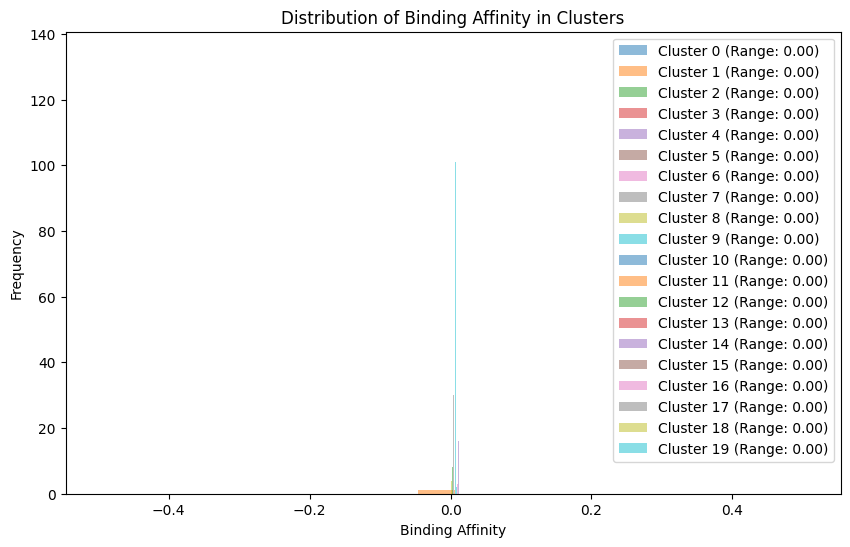

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

df = pd.read_csv('merged002.csv')
df['Binding_Affinity'] = pd.to_numeric(df['Binding_Affinity'], errors='coerce')
def extract_numeric(value):
    try:
        numeric_value = float(''.join(filter(str.isdigit, str(value))))
        return numeric_value
    except:
        return np.nan
df['Molecular_Weight'] = df['Molecular_Weight'].apply(extract_numeric)
df_clean = df.dropna(subset=['Binding_Affinity', 'Molecular_Weight'])
scaler = StandardScaler()
X = df_clean[['Binding_Affinity', 'Molecular_Weight']]
X_scaled = scaler.fit_transform(X)
kmeans = KMeans(n_clusters=20, random_state=42)
df_clean['Cluster'] = kmeans.fit_predict(X_scaled)
cluster_ranges = df_clean.groupby('Cluster')['Binding_Affinity'].agg(['min', 'max', 'mean', 'std'])
cluster_ranges['range'] = cluster_ranges['max'] - cluster_ranges['min']
print(cluster_ranges)

plt.figure(figsize=(10, 6))
for cluster in cluster_ranges.index:
    cluster_data = df_clean[df_clean['Cluster'] == cluster]['Binding_Affinity']
    plt.hist(cluster_data, bins=20, alpha=0.5, label=f'Cluster {cluster} (Range: {cluster_ranges.loc[cluster, "range"]:.2f})')

plt.xlabel('Binding Affinity')
plt.ylabel('Frequency')
plt.legend()
plt.title('Distribution of Binding Affinity in Clusters')
plt.show()

<ipython-input-81-a2e1742a895f>:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_clean['Cluster'] = kmeans.fit_predict(X_scaled)
<ipython-input-81-a2e1742a895f>:53: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


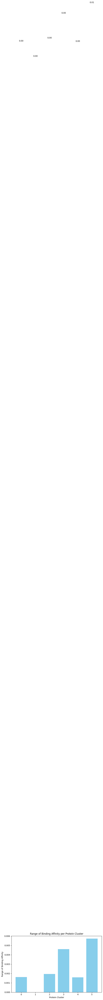

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

df = pd.read_csv('merged002.csv')
df['Binding_Affinity'] = pd.to_numeric(df['Binding_Affinity'], errors='coerce')
def extract_numeric(value):
    try:
        numeric_value = float(''.join(filter(str.isdigit, str(value))))
        return numeric_value
    except:
        return np.nan

df['Molecular_Weight'] = df['Molecular_Weight'].apply(extract_numeric)
df_clean = df.dropna(subset=['Binding_Affinity', 'Molecular_Weight'])
scaler = StandardScaler()
X = df_clean[['Binding_Affinity', 'Molecular_Weight']]
X_scaled = scaler.fit_transform(X)
kmeans = KMeans(n_clusters=6, random_state=42)
df_clean['Cluster'] = kmeans.fit_predict(X_scaled)
cluster_ranges = df_clean.groupby('Cluster')['Binding_Affinity'].agg(['min', 'max', 'mean', 'std'])
cluster_ranges['range'] = cluster_ranges['max'] - cluster_ranges['min']

plt.figure(figsize=(8, 5))
plt.bar(cluster_ranges.index, cluster_ranges['range'], color='skyblue')
plt.xlabel('Protein Cluster')
plt.ylabel('Range of Binding Affinity')
plt.title('Range of Binding Affinity per Protein Cluster')

for idx, value in enumerate(cluster_ranges['range']):
    plt.text(idx, value + 0.1, f'{value:.2f}', ha='center')
plt.tight_layout()
plt.show()

In [ ]:
import pandas as pd
from rdkit import Chem
from rdkit.Chem import AllChem
from sklearn.cluster import DBSCAN
from sklearn.metrics import pairwise_distances
from sklearn.preprocessing import StandardScaler
import numpy as np

df = pd.read_csv('merged002.csv')
def generate_fingerprint(smiles):
    mol = Chem.MolFromSmiles(smiles)
    if mol is None:
        return None
    fingerprint = AllChem.GetMorganFingerprintAsBitVect(mol, radius=2, nBits=2048)
    return fingerprint
df['Fingerprint'] = df['SMILES'].apply(generate_fingerprint)
df = df.dropna(subset=['Fingerprint'])
fingerprints = np.array([list(fingerprint) for fingerprint in df['Fingerprint']])
distances = 1 - pairwise_distances(fingerprints, metric="jaccard")
clustering = DBSCAN(metric='precomputed', eps=0.1, min_samples=5)
labels = clustering.fit_predict(1 - distances)
df['Cluster_Label'] = labels
print(df[['Ligand_Name', 'SMILES', 'Cluster_Label']].head())

In [ ]:
import pandas as pd
import numpy as np
from rdkit import Chem
from rdkit.Chem import AllChem
from sklearn.cluster import DBSCAN
from sklearn.metrics import pairwise_distances
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

df = pd.read_csv('merged002.csv')
df = df[df['SMILES'].notna()]
df = df[df['SMILES'].apply(lambda x: isinstance(x, str))]

def generate_fingerprint(smiles):
    mol = Chem.MolFromSmiles(smiles)
    if mol is None:
        return None
    fingerprint = AllChem.GetMorganFingerprintAsBitVect(mol, radius=2, nBits=2048)
    return np.array(list(fingerprint))

df['Fingerprint'] = df['SMILES'].apply(generate_fingerprint)
df = df.dropna(subset=['Fingerprint'])
fingerprints = np.array(df['Fingerprint'].tolist())
distances = 1 - pairwise_distances(fingerprints, metric="jaccard")
clustering = DBSCAN(metric='precomputed', eps=0.1, min_samples=5)
labels = clustering.fit_predict(distances)
df['Cluster_Label'] = labels

pca = PCA(n_components=2)
reduced_data = pca.fit_transform(fingerprints)
plt.figure(figsize=(10, 8))
scatter = plt.scatter(reduced_data[:, 0], reduced_data[:, 1], c=df['Cluster_Label'], cmap='viridis', s=50, alpha=0.6)
plt.colorbar(scatter, label='Cluster Label')
plt.title('Ligand Clusters based on RDKit Fingerprints')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.show()

In [ ]:
import pandas as pd
from rdkit import Chem
from rdkit.Chem import AllChem
from rdkit.Chem import DataStructs
from sklearn.decomposition import PCA
from sklearn.cluster import DBSCAN
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

df = pd.read_csv('merged002.csv')
def smiles_to_mol(smiles):
    mol = Chem.MolFromSmiles(smiles)
    if mol is None:
        return None
    return mol

def generate_fingerprint(mol):
    return AllChem.GetMorganFingerprintAsBitVect(mol, 2, nBits=2048)

def calculate_similarity(fps):
    similarity_matrix = np.zeros((len(fps), len(fps)))

    for i in range(len(fps)):
        for j in range(i, len(fps)):
            similarity = DataStructs.TanimotoSimilarity(fps[i], fps[j])
            similarity_matrix[i, j] = similarity
            similarity_matrix[j, i] = similarity

    return similarity_matrix

ligand_smiles = df['SMILES'].dropna()
invalid_smiles = []
valid_molecules = []
for smiles in ligand_smiles:
    mol = smiles_to_mol(smiles)
    if mol is not None:
        valid_molecules.append(mol)
    else:
        invalid_smiles.append(smiles)

if invalid_smiles:
    print("The following SMILES could not be parsed:")
    for invalid in invalid_smiles:
        print(invalid)

if len(valid_molecules) == 0:
    print("No valid ligands found after filtering invalid SMILES. Exiting.")
else:
    fingerprints = [generate_fingerprint(mol) for mol in valid_molecules]

    similarity_matrix = calculate_similarity(fingerprints)

    db = DBSCAN(metric='precomputed', eps=0.7, min_samples=2)

    if similarity_matrix.shape[0] > 0:
        cluster_labels = db.fit_predict(1 - similarity_matrix)
    else:
        cluster_labels = []

    df['Cluster_Label'] = np.nan
    valid_smiles = ligand_smiles[ligand_smiles.isin(df['SMILES'][df['SMILES'].notna()])]
    df.loc[df['SMILES'].isin(valid_smiles), 'Cluster_Label'] = cluster_labels

    fingerprints_array = np.array([np.array(fp) for fp in fingerprints])

    pca = PCA(n_components=2)
    pca_result = pca.fit_transform(fingerprints_array)

    plt.figure(figsize=(10, 8))
    sns.scatterplot(x=pca_result[:, 0], y=pca_result[:, 1], hue=df['Cluster_Label'], palette='viridis', s=100, edgecolor='k')

    plt.title('PCA of Ligand Clusters Based on SMILES', fontsize=16)
    plt.xlabel('PCA Component 1', fontsize=12)
    plt.ylabel('PCA Component 2', fontsize=12)
    plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()

    plt.show()

Streaming output truncated to the last 5000 lines.
[18:54:23] SMILES Parse Error: Failed parsing SMILES '1.65' for input: '1.65'
[18:54:23] SMILES Parse Error: syntax error while parsing: 2.80
[18:54:23] SMILES Parse Error: check for mistakes around position 1:
[18:54:23] 2.80
[18:54:23] ^
[18:54:23] SMILES Parse Error: Failed parsing SMILES '2.80' for input: '2.80'
[18:54:23] SMILES Parse Error: syntax error while parsing: 2.70
[18:54:23] SMILES Parse Error: check for mistakes around position 1:
[18:54:23] 2.70
[18:54:23] ^
[18:54:23] SMILES Parse Error: Failed parsing SMILES '2.70' for input: '2.70'
[18:54:23] SMILES Parse Error: syntax error while parsing: 3.00
[18:54:23] SMILES Parse Error: check for mistakes around position 1:
[18:54:23] 3.00
[18:54:23] ^
[18:54:23] SMILES Parse Error: Failed parsing SMILES '3.00' for input: '3.00'
[18:54:23] SMILES Parse Error: syntax error while parsing: 2.80
[18:54:23] SMILES Parse Error: check for mistakes around position 1:
[18:54:23] 2.80
[1

The following SMILES could not be parsed:
2.20
2.2
2.30
1.90
1.60
1.80
1.8
1.80
1.8
1.80
1.8
1.80
1.8
1.80
1.8
2.20
2.20
2.00
2.30
2.40
2.20
2.40
2.20
2.2
1.80
1.8
2.10
2.00
2.0
3.60
1.85
2.25
2.12
2.20
2.50
2.40
2.4
1.95
1.90
2.50
2.5
1.80
1.8
2.30
2.80
2.06
2.90
1.90
2.20
2.10
2.1
1.95
1.85
2.00
2.00
2.00
1.78
2.55
2.00
2.0
2.20
2.2
2.30
2.3
2.00
2.0
2.50
2.50
2.5
1.90
NMR
2.80
2.00
2.40
2.4
1.60
1.6
1.90
1.9
2.30
2.40
1.70
1.7
1.70
1.7
1.80
2.30
2.40
1.60
2.00
2.30
2.35
2.35
2.36
2.36
2.55
2.50
2.5
2.20
2.2
2.30
2.10
2.1
2.36
2.36
2.31
2.31
2.05
2.05
2.00
2.0
2.00
2.0
1.90
1.58
1.80
1.90
2.00
1.75
2.60
2.20
2.03
2.03
1.83
1.83
2.80
1.85
1.85
1.67
2.80
NMR
1.76
1.80
1.8
1.80
2.00
2.20
2.30
2.60
2.60
1.80
1.80
1.80
1.8
2.34
2.34
2.34
2.34
2.60
2.60
2.10
2.70
2.00
2.0
2.60
2.70
2.20
3.00
2.20
1.90
1.9
1.95
1.95
2.30
2.60
1.95
2.20
2.30
NMR
NMR
1.80
2.00
2.0
2.90
2.00
2.0
3.00
1.90
1.9
1.90
1.80
1.8
1.90
1.9
NMR
2.00
1.75
1.75
2.00
2.0
2.10
1.80
1.8
2.00
2.0
2.00
2.0
2.00
2.0
2.20
2.2
2

[18:54:23] SMILES Parse Error: Failed parsing SMILES '1.60' for input: '1.60'
[18:54:23] SMILES Parse Error: syntax error while parsing: 0.97
[18:54:23] SMILES Parse Error: check for mistakes around position 1:
[18:54:23] 0.97
[18:54:23] ^
[18:54:23] SMILES Parse Error: Failed parsing SMILES '0.97' for input: '0.97'
[18:54:23] SMILES Parse Error: syntax error while parsing: 0.97
[18:54:23] SMILES Parse Error: check for mistakes around position 1:
[18:54:23] 0.97
[18:54:23] ^
[18:54:23] SMILES Parse Error: Failed parsing SMILES '0.97' for input: '0.97'
[18:54:23] SMILES Parse Error: syntax error while parsing: 1.49
[18:54:23] SMILES Parse Error: check for mistakes around position 1:
[18:54:23] 1.49
[18:54:23] ^
[18:54:23] SMILES Parse Error: Failed parsing SMILES '1.49' for input: '1.49'
[18:54:23] SMILES Parse Error: syntax error while parsing: 2.00
[18:54:23] SMILES Parse Error: check for mistakes around position 1:
[18:54:23] 2.00
[18:54:23] ^
[18:54:23] SMILES Parse Error: Failed pa

In [ ]:
!pip install rdkit

ERROR: Could not find a version that satisfies the requirement rdkit-c (from versions: none)
ERROR: No matching distribution found for rdkit-c


In [ ]:
import pandas as pd
import numpy as np
from rdkit import Chem
from rdkit.Chem import AllChem
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.metrics.pairwise import cosine_similarity
import matplotlib.pyplot as plt
import seaborn as sns

df = pd.read_csv('merged002.csv')
def generate_fingerprint(smiles):
    mol = Chem.MolFromSmiles(smiles)
    if mol:
        return AllChem.GetMorganFingerprintAsBitVect(mol, radius=2, nBits=1024)
    else:
        return None

df['Fingerprint'] = df['SMILES'].apply(generate_fingerprint)
df = df[df['Fingerprint'].notnull()]
fingerprints = [np.array(f) for f in df['Fingerprint']]
similarity_matrix = cosine_similarity(fingerprints)
n_clusters = 5
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
df['Cluster'] = kmeans.fit_predict(similarity_matrix)

clustered_df = df[['PDB_Code', 'Ligand_Name', 'Cluster']].sort_values(by='Cluster')

plt.figure(figsize=(8, 6))
sns.countplot(data=df, x='Cluster', palette='viridis')
plt.title('Cluster Distribution')
plt.xlabel('Cluster Number')
plt.ylabel('Number of Ligands')
plt.show()

pca = PCA(n_components=2)
pca_result = pca.fit_transform(np.array(fingerprints))

plt.figure(figsize=(8, 6))
sns.scatterplot(x=pca_result[:, 0], y=pca_result[:, 1], hue=df['Cluster'], palette='viridis', s=100, alpha=0.7)
plt.title('PCA of Ligands Clusters')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.legend(title='Cluster', loc='best')
plt.show()

tsne = TSNE(n_components=2, random_state=42)
tsne_result = tsne.fit_transform(np.array(fingerprints))

plt.figure(figsize=(8, 6))
sns.scatterplot(x=tsne_result[:, 0], y=tsne_result[:, 1], hue=df['Cluster'], palette='viridis', s=100, alpha=0.7)
plt.title('t-SNE of Ligands Clusters')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.legend(title='Cluster', loc='best')
plt.show()

plt.figure(figsize=(10, 8))
sns.heatmap(similarity_matrix, cmap='coolwarm', annot=False, xticklabels=df['Ligand_Name'], yticklabels=df['Ligand_Name'])
plt.title('Heatmap of Ligand Similarity')
plt.xlabel('Ligand')
plt.ylabel('Ligand')
plt.show()

clustered_df.to_csv('clustered_ligands.csv', index=False)

[19:11:38] SMILES Parse Error: syntax error while parsing: 2.20
[19:11:38] SMILES Parse Error: check for mistakes around position 1:
[19:11:38] 2.20
[19:11:38] ^
[19:11:38] SMILES Parse Error: Failed parsing SMILES '2.20' for input: '2.20'
[19:11:38] SMILES Parse Error: syntax error while parsing: 2.2
[19:11:38] SMILES Parse Error: check for mistakes around position 1:
[19:11:38] 2.2
[19:11:38] ^
[19:11:38] SMILES Parse Error: Failed parsing SMILES '2.2' for input: '2.2'
[19:11:38] SMILES Parse Error: syntax error while parsing: 2.30
[19:11:38] SMILES Parse Error: check for mistakes around position 1:
[19:11:38] 2.30
[19:11:38] ^
[19:11:38] SMILES Parse Error: Failed parsing SMILES '2.30' for input: '2.30'
[19:11:38] SMILES Parse Error: syntax error while parsing: 1.90
[19:11:38] SMILES Parse Error: check for mistakes around position 1:
[19:11:38] 1.90
[19:11:38] ^
[19:11:38] SMILES Parse Error: Failed parsing SMILES '1.90' for input: '1.90'
[19:11:38] SMILES Parse Error: syntax error 

TypeError: No registered converter was able to produce a C++ rvalue of type std::basic_string<wchar_t, std::char_traits<wchar_t>, std::allocator<wchar_t> > from this Python object of type float

In [ ]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import seaborn as sns

df = pd.read_csv('merged002.csv')
def extract_numeric(value):
    try:
        numeric_value = float(value.split('=')[1].replace('uM', '').replace('nM', '').replace('M', '').replace('pM', '').strip())
        return numeric_value
    except:
        return np.nan
df['Binding_Affinity_Clean'] = df['Binding_Affinity'].apply(extract_numeric)
print(f"Rows with missing Binding_Affinity_Clean: {df['Binding_Affinity_Clean'].isna().sum()}")
print(f"Rows with missing Molecular_Weight: {df['Molecular_Weight'].isna().sum()}")

df_clean = df.dropna(subset=['Binding_Affinity_Clean', 'Molecular_Weight'])
print(f"Remaining rows after cleaning: {df_clean.shape[0]}")

if df_clean.shape[0] > 0:
    df_selected = df_clean[['Molecular_Weight', 'Binding_Affinity_Clean']]

    n_clusters = 5
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    df_clean['Cluster'] = kmeans.fit_predict(df_selected)

    clustered_df = df_clean[['PDB_Code', 'Ligand_Name', 'Cluster']].sort_values(by='Cluster')

    plt.figure(figsize=(8, 6))
    sns.countplot(data=df_clean, x='Cluster', palette='viridis')
    plt.title('Cluster Distribution')
    plt.xlabel('Cluster Number')
    plt.ylabel('Number of Ligands')
    plt.show()

    pca = PCA(n_components=2)
    pca_result = pca.fit_transform(df_selected)
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=pca_result[:, 0], y=pca_result[:, 1], hue=df_clean['Cluster'], palette='viridis', s=100, alpha=0.7)
    plt.title('PCA of Ligands Clusters')
    plt.xlabel('PCA Component 1')
    plt.ylabel('PCA Component 2')
    plt.legend(title='Cluster', loc='best')
    plt.show()

    tsne = TSNE(n_components=2, random_state=42)
    tsne_result = tsne.fit_transform(df_selected)

    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=tsne_result[:, 0], y=tsne_result[:, 1], hue=df_clean['Cluster'], palette='viridis', s=100, alpha=0.7)
    plt.title('t-SNE of Ligands Clusters')
    plt.xlabel('t-SNE Component 1')
    plt.ylabel('t-SNE Component 2')
    plt.legend(title='Cluster', loc='best')
    plt.show()

    plt.figure(figsize=(10, 8))
    sns.heatmap(df_selected.corr(), annot=True, cmap='coolwarm', linewidths=0.5)
    plt.title('Correlation Heatmap of Molecular Weight and Binding Affinity')
    plt.show()

    clustered_df.to_csv('clustered_ligands_by_weight_affinity.csv', index=False)
else:
    print("No valid data left for clustering. Please check the cleaning process.")

Rows with missing Binding_Affinity_Clean: 27323
Rows with missing Molecular_Weight: 2562
Remaining rows after cleaning: 0
No valid data left for clustering. Please check the cleaning process.


In [ ]:
import pandas as pd
import numpy as np

df = pd.read_csv('merged002.csv')
print("Sample values from Binding_Affinity:")
print(df['Binding_Affinity'].head(20))

def extract_numeric(value):
    try:
        numeric_value = float(value.split('=')[1].replace('uM', '').replace('nM', '').replace('M', '').replace('pM', '').replace('mM', '').strip())
        return numeric_value
    except Exception as e:
        print(f"Error processing value: {value} --> {e}")
        return np.nan
df['Binding_Affinity_Clean'] = df['Binding_Affinity'].apply(extract_numeric)
print("Sample values after cleaning Binding_Affinity:")
print(df[['Binding_Affinity', 'Binding_Affinity_Clean']].head(20))
print(f"Rows with missing Binding_Affinity_Clean: {df['Binding_Affinity_Clean'].isna().sum()}")
print(f"Rows with missing Molecular_Weight: {df['Molecular_Weight'].isna().sum()}")

df_clean = df.dropna(subset=['Binding_Affinity_Clean', 'Molecular_Weight'])
print(f"Remaining rows after cleaning: {df_clean.shape[0]}")
if df_clean.shape[0] > 0:
    df_selected = df_clean[['Molecular_Weight', 'Binding_Affinity_Clean']]

    n_clusters = 5
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    df_clean['Cluster'] = kmeans.fit_predict(df_selected)

    clustered_df = df_clean[['PDB_Code', 'Ligand_Name', 'Cluster']].sort_values(by='Cluster')

    plt.figure(figsize=(8, 6))
    sns.countplot(data=df_clean, x='Cluster', palette='viridis')
    plt.title('Cluster Distribution')
    plt.xlabel('Cluster Number')
    plt.ylabel('Number of Ligands')
    plt.show()

    pca = PCA(n_components=2)
    pca_result = pca.fit_transform(df_selected)

    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=pca_result[:, 0], y=pca_result[:, 1], hue=df_clean['Cluster'], palette='viridis', s=100, alpha=0.7)
    plt.title('PCA of Ligands Clusters')
    plt.xlabel('PCA Component 1')
    plt.ylabel('PCA Component 2')
    plt.legend(title='Cluster', loc='best')
    plt.show()

    tsne = TSNE(n_components=2, random_state=42)
    tsne_result = tsne.fit_transform(df_selected)

    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=tsne_result[:, 0], y=tsne_result[:, 1], hue=df_clean['Cluster'], palette='viridis', s=100, alpha=0.7)
    plt.title('t-SNE of Ligands Clusters')
    plt.xlabel('t-SNE Component 1')
    plt.ylabel('t-SNE Component 2')
    plt.legend(title='Cluster', loc='best')
    plt.show()

    plt.figure(figsize=(10, 8))
    sns.heatmap(df_selected.corr(), annot=True, cmap='coolwarm', linewidths=0.5)
    plt.title('Correlation Heatmap of Molecular Weight and Binding Affinity')
    plt.show()

    clustered_df.to_csv('clustered_ligands_by_weight_affinity.csv', index=False)
else:
    print("No valid data left for clustering. Please check the cleaning process.")

Streaming output truncated to the last 5000 lines.
Error processing value: 0.00719 --> 'float' object has no attribute 'split'
Error processing value: 0.00796 --> 'float' object has no attribute 'split'
Error processing value: 0.00796 --> 'float' object has no attribute 'split'
Error processing value: 0.00762 --> 'float' object has no attribute 'split'
Error processing value: 0.00762 --> 'float' object has no attribute 'split'
Error processing value: nan --> 'float' object has no attribute 'split'
Error processing value: nan --> 'float' object has no attribute 'split'
Error processing value: nan --> 'float' object has no attribute 'split'
Error processing value: nan --> 'float' object has no attribute 'split'
Error processing value: nan --> 'float' object has no attribute 'split'
Error processing value: nan --> 'float' object has no attribute 'split'
Error processing value: nan --> 'float' object has no attribute 'split'
Error processing value: nan --> 'float' object has no attribute '

In [ ]:
import pandas as pd
import numpy as np

df = pd.read_csv('merged002.csv')
print("Sample values from Binding_Affinity:")
print(df['Binding_Affinity'].head(20))
def extract_numeric(value):
    if isinstance(value, str):
        try:
            numeric_value = float(value.split('=')[1].replace('uM', '').replace('nM', '').replace('M', '').replace('pM', '').replace('mM', '').strip())
            return numeric_value
        except Exception as e:
            print(f"Error processing value: {value} --> {e}")
            return np.nan
    elif isinstance(value, (int, float)):
        return value
    else:
        return np.nan

df['Binding_Affinity_Clean'] = df['Binding_Affinity'].apply(extract_numeric)
print("Sample values after cleaning Binding_Affinity:")
print(df[['Binding_Affinity', 'Binding_Affinity_Clean']].head(20))
print(f"Rows with missing Binding_Affinity_Clean: {df['Binding_Affinity_Clean'].isna().sum()}")
print(f"Rows with missing Molecular_Weight: {df['Molecular_Weight'].isna().sum()}")

df_clean = df.dropna(subset=['Binding_Affinity_Clean', 'Molecular_Weight'])
print(f"Remaining rows after cleaning: {df_clean.shape[0]}")

if df_clean.shape[0] > 0:
    df_selected = df_clean[['Molecular_Weight', 'Binding_Affinity_Clean']]

    n_clusters = 5
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    df_clean['Cluster'] = kmeans.fit_predict(df_selected)

    clustered_df = df_clean[['PDB_Code', 'Ligand_Name', 'Cluster']].sort_values(by='Cluster')

    plt.figure(figsize=(8, 6))
    sns.countplot(data=df_clean, x='Cluster', palette='viridis')
    plt.title('Cluster Distribution')
    plt.xlabel('Cluster Number')
    plt.ylabel('Number of Ligands')
    plt.show()

    pca = PCA(n_components=2)
    pca_result = pca.fit_transform(df_selected)
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=pca_result[:, 0], y=pca_result[:, 1], hue=df_clean['Cluster'], palette='viridis', s=100, alpha=0.7)
    plt.title('PCA of Ligands Clusters')
    plt.xlabel('PCA Component 1')
    plt.ylabel('PCA Component 2')
    plt.legend(title='Cluster', loc='best')
    plt.show()

    tsne = TSNE(n_components=2, random_state=42)
    tsne_result = tsne.fit_transform(df_selected)
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=tsne_result[:, 0], y=tsne_result[:, 1], hue=df_clean['Cluster'], palette='viridis', s=100, alpha=0.7)
    plt.title('t-SNE of Ligands Clusters')
    plt.xlabel('t-SNE Component 1')
    plt.ylabel('t-SNE Component 2')
    plt.legend(title='Cluster', loc='best')
    plt.show()

    plt.figure(figsize=(10, 8))
    sns.heatmap(df_selected.corr(), annot=True, cmap='coolwarm', linewidths=0.5)
    plt.title('Correlation Heatmap of Molecular Weight and Binding Affinity')
    plt.show()

    clustered_df.to_csv('clustered_ligands_by_weight_affinity.csv', index=False)
else:
    print("No valid data left for clustering. Please check the cleaning process.")

Sample values from Binding_Affinity:
0         NaN
1         NaN
2         NaN
3     0.00462
4     0.00522
5     0.00472
6     0.00472
7     0.00354
8     0.00354
9     0.00485
10    0.00485
11    0.00337
12    0.00337
13    0.00333
14    0.00333
15        NaN
16        NaN
17        NaN
18    0.00757
19    0.00130
Name: Binding_Affinity, dtype: float64
Sample values after cleaning Binding_Affinity:
    Binding_Affinity  Binding_Affinity_Clean
0                NaN                     NaN
1                NaN                     NaN
2                NaN                     NaN
3            0.00462                 0.00462
4            0.00522                 0.00522
5            0.00472                 0.00472
6            0.00472                 0.00472
7            0.00354                 0.00354
8            0.00354                 0.00354
9            0.00485                 0.00485
10           0.00485                 0.00485
11           0.00337                 0.00337
12          

ValueError: could not convert string to float: 'Ki=24uM'

Data types of columns:
 PDB_Code                  object
Release_Year_merged      float64
Release_Year             float64
Uniprot_ID                object
Protein_Name              object
Resolution                object
Binding_Data              object
Reference_ligand          object
Reference                 object
Ligand_Name               object
R-factor                 float64
R-free                   float64
Delta-R                  float64
SMILES                    object
Molecular_Weight          object
Binding_Affinity         float64
Binding_Value             object
Binding_Affinity_Type     object
dtype: object
Non-numeric columns: Index(['PDB_Code', 'Uniprot_ID', 'Protein_Name', 'Resolution', 'Binding_Data',
       'Reference_ligand', 'Reference', 'Ligand_Name', 'SMILES',
       'Molecular_Weight', 'Binding_Value', 'Binding_Affinity_Type'],
      dtype='object')
Missing values in numerical columns:
 Binding_Affinity    17287
Resolution            304
R-factor             

/usr/local/lib/python3.11/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['Molecular_Weight']. At least one non-missing value is needed for imputation with strategy='mean'.
  warnings.warn(


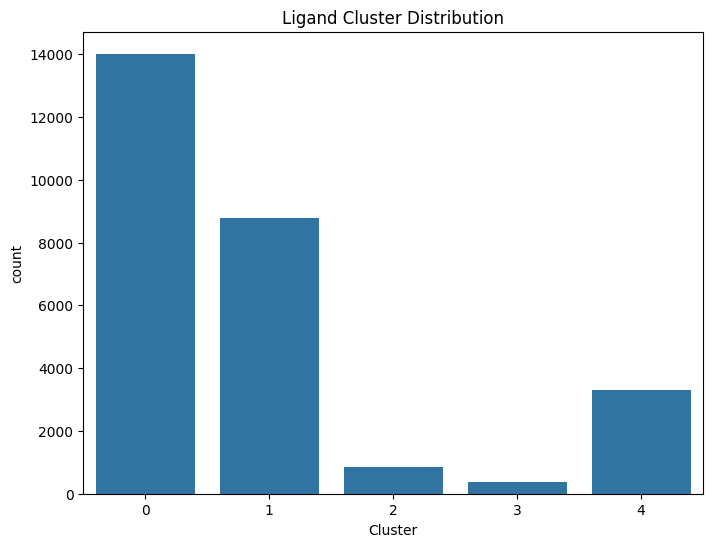

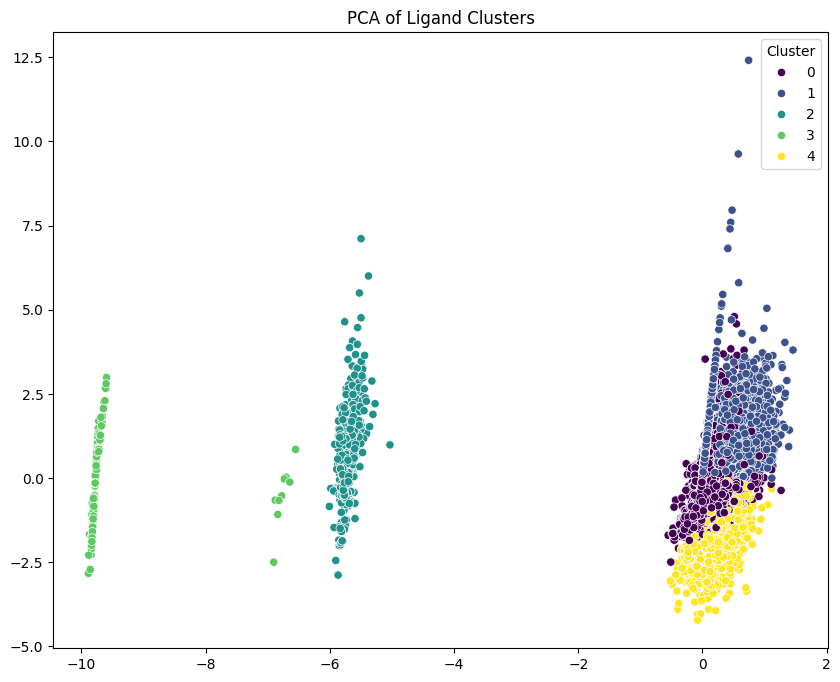

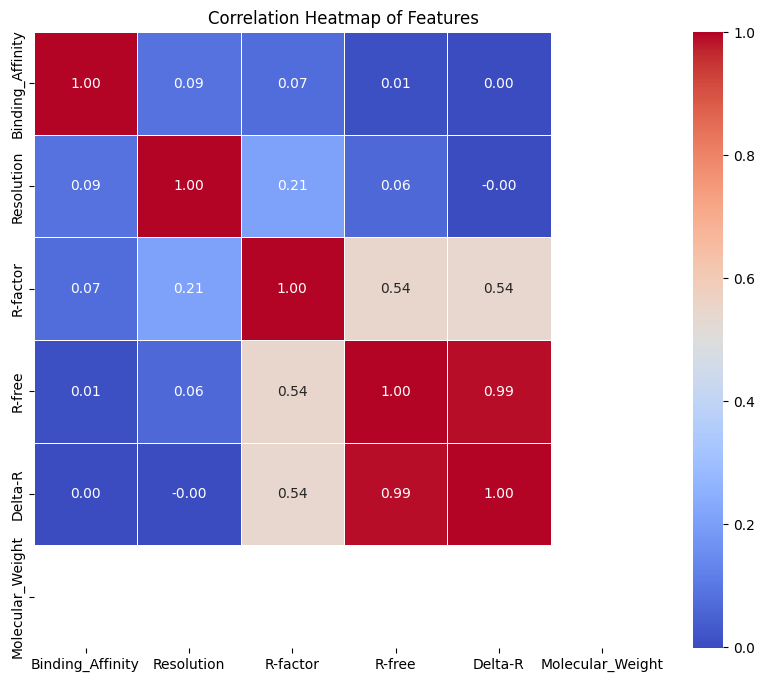

/usr/local/lib/python3.11/dist-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


<Figure size 1200x800 with 0 Axes>

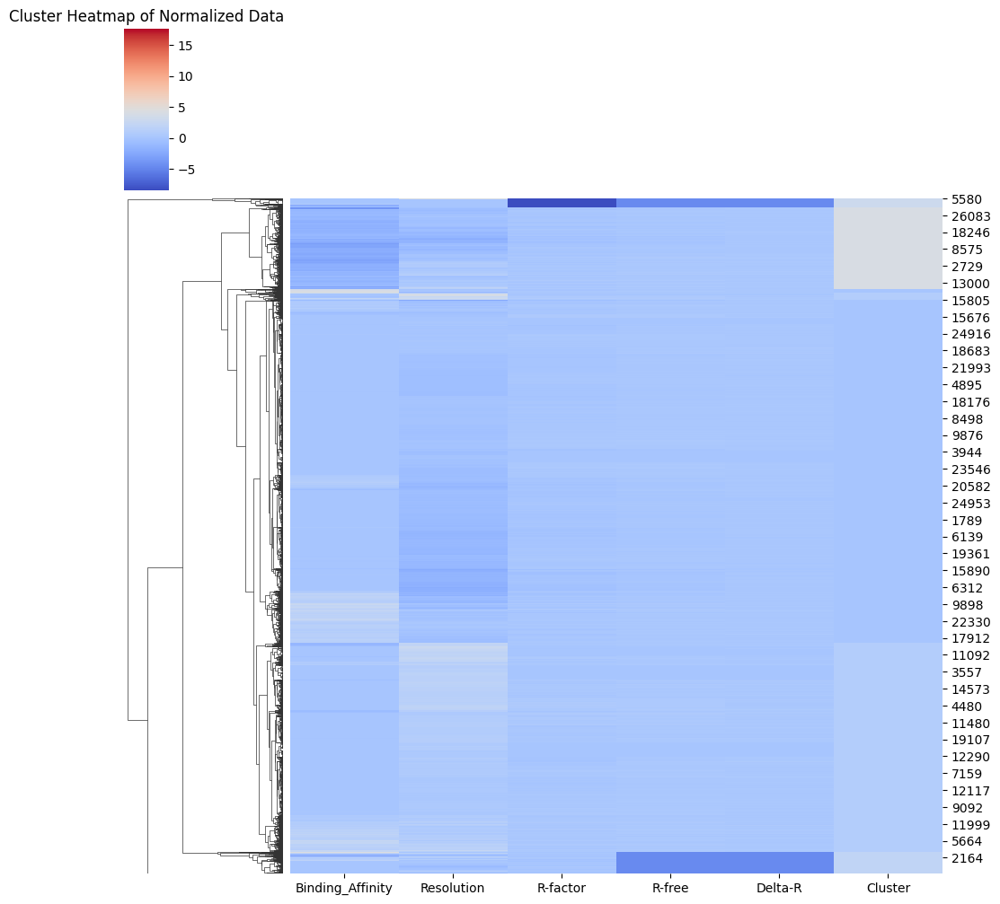

In [ ]:
import pandas as pd #run
import numpy as np
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.impute import SimpleImputer
import seaborn as sns
import matplotlib.pyplot as plt

df = pd.read_csv('merged002.csv')
print("Data types of columns:\n", df.dtypes)
non_numeric_columns = df.select_dtypes(include=['object']).columns
print("Non-numeric columns:", non_numeric_columns)

df['Resolution'] = pd.to_numeric(df['Resolution'], errors='coerce')  # Convert to NaN if not numeric
df['Molecular_Weight'] = pd.to_numeric(df['Molecular_Weight'], errors='coerce')  # Convert to NaN if not numeric
numerical_columns = ['Binding_Affinity', 'Resolution', 'R-factor', 'R-free', 'Delta-R', 'Molecular_Weight']
print("Missing values in numerical columns:\n", df[numerical_columns].isna().sum())

imputer = SimpleImputer(strategy='mean')
ligand_data_imputed = imputer.fit_transform(df[numerical_columns])
scaler = StandardScaler()
normalized_data = scaler.fit_transform(ligand_data_imputed)
kmeans = KMeans(n_clusters=5, random_state=42)  # Adjust the number of clusters if necessary
df['Cluster'] = kmeans.fit_predict(normalized_data)

plt.figure(figsize=(8, 6))
sns.countplot(x='Cluster', data=df)
plt.title('Ligand Cluster Distribution')
plt.show()

pca = PCA(n_components=2)
reduced_data = pca.fit_transform(normalized_data)
plt.figure(figsize=(10, 8))
sns.scatterplot(x=reduced_data[:, 0], y=reduced_data[:, 1], hue=df['Cluster'], palette='viridis')
plt.title('PCA of Ligand Clusters')
plt.show()

correlation_matrix = df[numerical_columns].corr()
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Heatmap of Features')
plt.show()

numerical_columns = ['Binding_Affinity', 'Resolution', 'R-factor', 'R-free', 'Delta-R']
cluster_matrix = pd.DataFrame(normalized_data, columns=numerical_columns)
cluster_matrix['Cluster'] = df['Cluster']

plt.figure(figsize=(12, 8))
sns.clustermap(cluster_matrix, row_cluster=True, col_cluster=False, cmap='coolwarm')
plt.title('Cluster Heatmap of Normalized Data')
plt.show()

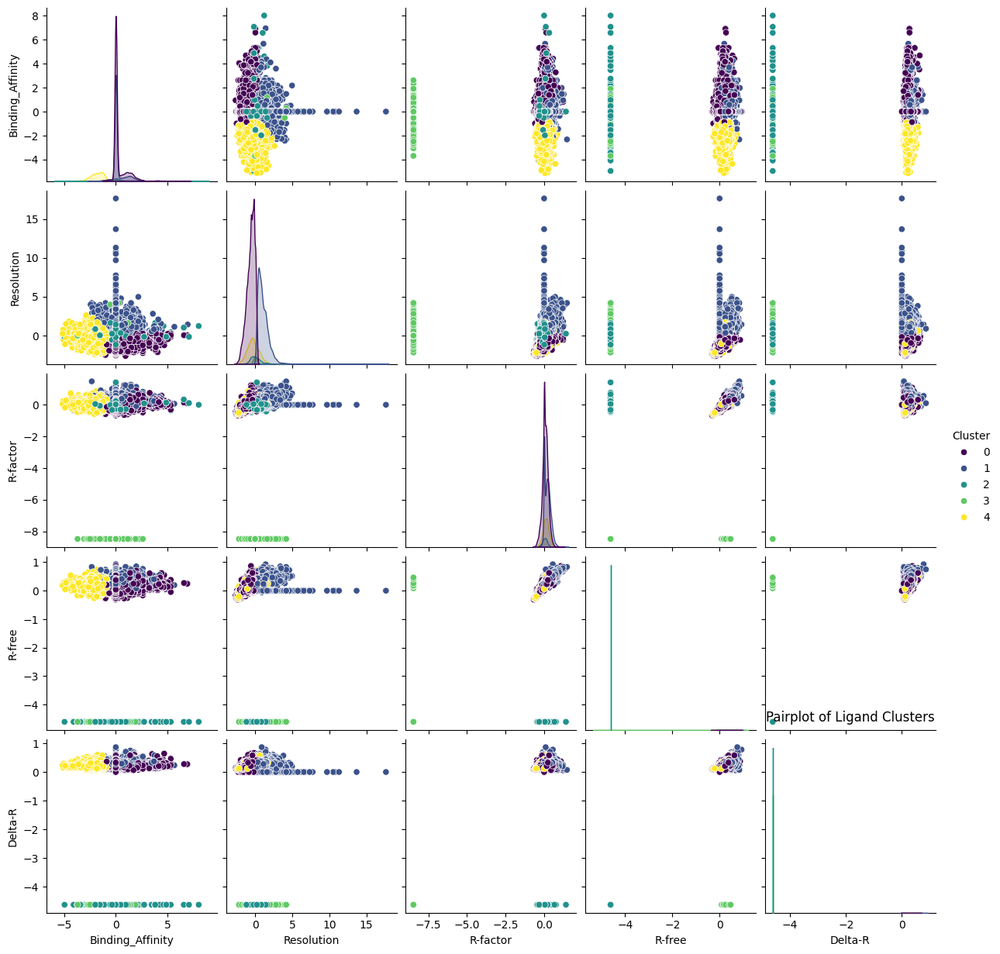

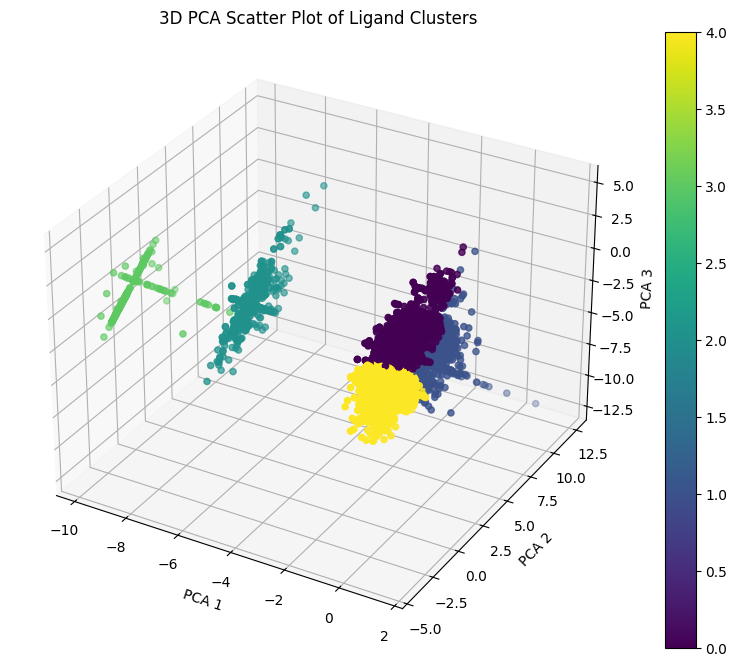

KeyboardInterrupt: 

In [ ]:
import seaborn as sns

sns.pairplot(cluster_matrix, hue="Cluster", palette="viridis")
plt.title("Pairplot of Ligand Clusters")
plt.show()

from mpl_toolkits.mplot3d import Axes3D

pca_3d = PCA(n_components=3)
reduced_data_3d = pca_3d.fit_transform(normalized_data)

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(reduced_data_3d[:, 0], reduced_data_3d[:, 1], reduced_data_3d[:, 2], c=df['Cluster'], cmap='viridis')

ax.set_xlabel('PCA 1')
ax.set_ylabel('PCA 2')
ax.set_zlabel('PCA 3')
plt.title('3D PCA Scatter Plot of Ligand Clusters')
fig.colorbar(scatter)

plt.show()

from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, random_state=42)
reduced_data_tsne = tsne.fit_transform(normalized_data)

plt.figure(figsize=(10, 8))
sns.scatterplot(x=reduced_data_tsne[:, 0], y=reduced_data_tsne[:, 1], hue=df['Cluster'], palette='viridis')
plt.title('t-SNE Visualization of Ligand Clusters')
plt.show()

Data types of columns:
 PDB_Code                  object
Release_Year_merged      float64
Release_Year             float64
Uniprot_ID                object
Protein_Name              object
Resolution                object
Binding_Data              object
Reference_ligand          object
Reference                 object
Ligand_Name               object
R-factor                 float64
R-free                   float64
Delta-R                  float64
SMILES                    object
Molecular_Weight          object
Binding_Affinity         float64
Binding_Value             object
Binding_Affinity_Type     object
dtype: object


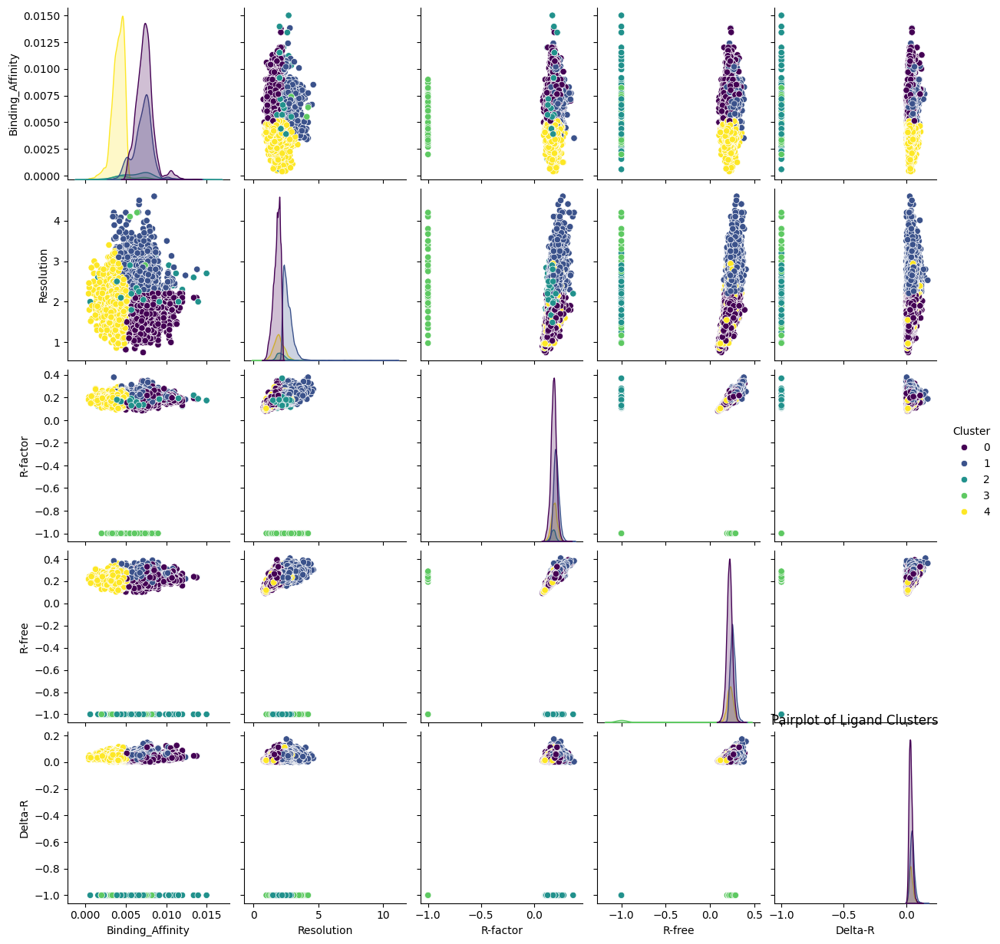

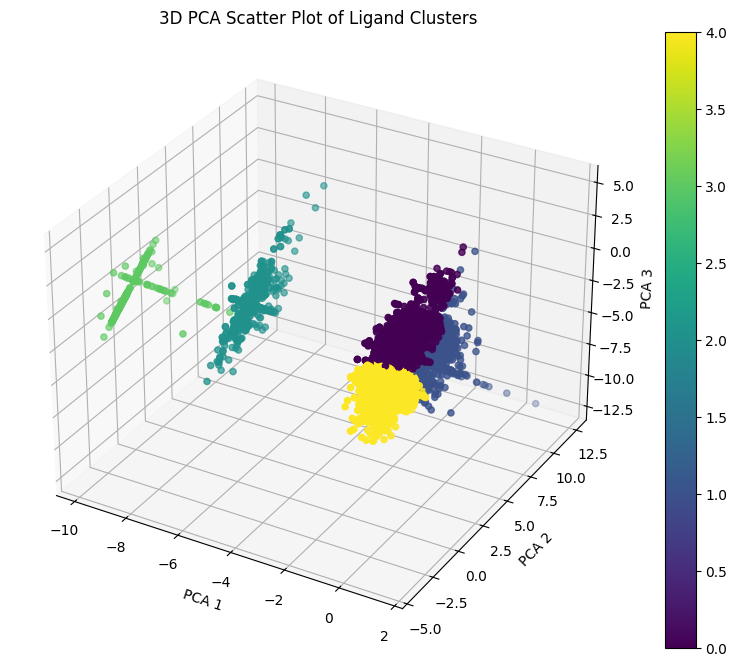

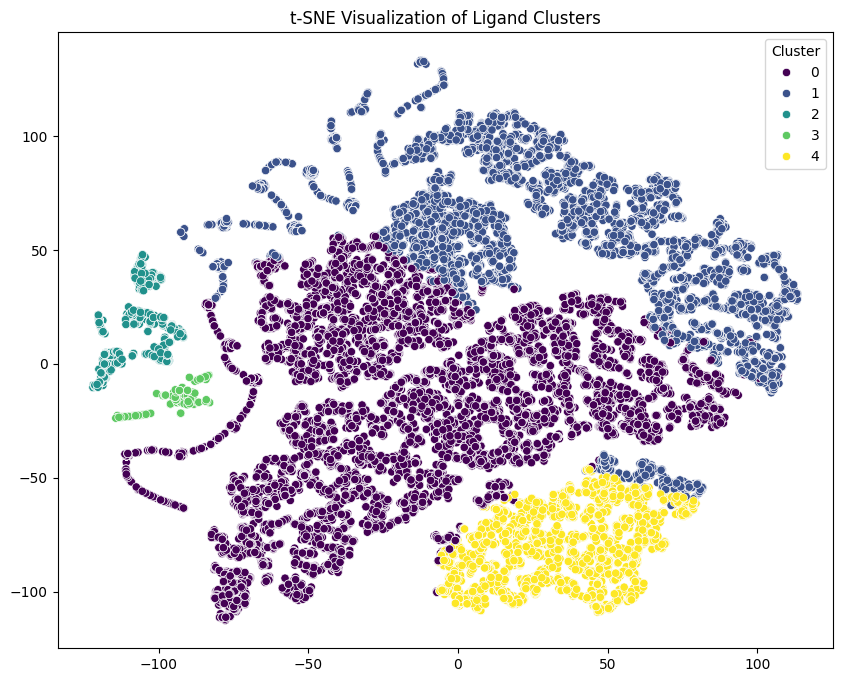

In [ ]:
import pandas as pd #run
import numpy as np
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.impute import SimpleImputer
import seaborn as sns
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.manifold import TSNE

df = pd.read_csv('merged002.csv')
print("Data types of columns:\n", df.dtypes)
df['Resolution'] = pd.to_numeric(df['Resolution'], errors='coerce')
df['Molecular_Weight'] = pd.to_numeric(df['Molecular_Weight'], errors='coerce')
numerical_columns = ['Binding_Affinity', 'Resolution', 'R-factor', 'R-free', 'Delta-R']
imputer = SimpleImputer(strategy='mean')
ligand_data_imputed = imputer.fit_transform(df[numerical_columns])
scaler = StandardScaler()
normalized_data = scaler.fit_transform(ligand_data_imputed)
kmeans = KMeans(n_clusters=5, random_state=42)
df['Cluster'] = kmeans.fit_predict(normalized_data)

sns.pairplot(df[numerical_columns + ['Cluster']], hue='Cluster', palette='viridis')
plt.title("Pairplot of Ligand Clusters")
plt.show()

pca_3d = PCA(n_components=3)
reduced_data_3d = pca_3d.fit_transform(normalized_data)
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(reduced_data_3d[:, 0], reduced_data_3d[:, 1], reduced_data_3d[:, 2], c=df['Cluster'], cmap='viridis')
ax.set_xlabel('PCA 1')
ax.set_ylabel('PCA 2')
ax.set_zlabel('PCA 3')
plt.title('3D PCA Scatter Plot of Ligand Clusters')
fig.colorbar(scatter)
plt.show()

tsne = TSNE(n_components=2, random_state=42)
reduced_data_tsne = tsne.fit_transform(normalized_data)
plt.figure(figsize=(10, 8))
sns.scatterplot(x=reduced_data_tsne[:, 0], y=reduced_data_tsne[:, 1], hue=df['Cluster'], palette='viridis')
plt.title('t-SNE Visualization of Ligand Clusters')
plt.show()

Tabulation of Ligand Clusters for High vs Low Affinity:
Affinity_Group  High    Low
Cluster                    
0               3110  10904
1               1626   7168
2                206    646
3                 48    312
4                  0   3303


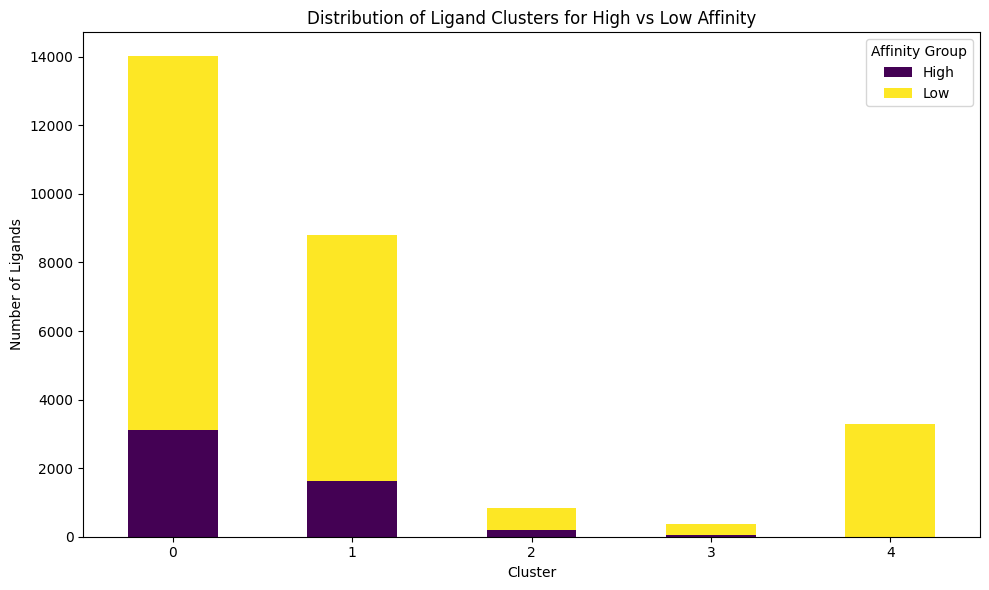

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

median_affinity = df['Binding_Affinity'].median()

df['Affinity_Group'] = df['Binding_Affinity'].apply(lambda x: 'High' if x > median_affinity else 'Low')
cluster_affinity_counts = df.groupby(['Cluster', 'Affinity_Group']).size().unstack(fill_value=0)
print("Tabulation of Ligand Clusters for High vs Low Affinity:")
print(cluster_affinity_counts)

cluster_affinity_counts.plot(kind='bar', stacked=True, figsize=(10, 6), cmap='viridis')

plt.title('Distribution of Ligand Clusters for High vs Low Affinity')
plt.xlabel('Cluster')
plt.ylabel('Number of Ligands')
plt.xticks(rotation=0)
plt.legend(title='Affinity Group', loc='upper right')
plt.tight_layout()

plt.show()

In [ ]:
!pip install biopython
!pip install requests
!pip install uniprotpy
#!pip install scipy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 26.4 MB/s eta 0:00:00


In [ ]:
df = pd.read_csv('merged002.csv')

In [ ]:
!pip install pandas biopython rdkit #run

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 32.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 34.3/34.3 MB 48.9 MB/s eta 0:00:00


In [ ]:
import csv #run
with open('merged002.csv', mode='r') as file:
    reader = csv.reader(file)

    data = list(reader)

    num_rows = len(data)
    num_columns = len(data[0]) if num_rows > 0 else 0

    print(f"Number of rows: {num_rows}")
    print(f"Number of columns: {num_columns}")


Number of rows: 27324
Number of columns: 18


In [ ]:
import pandas as pd #worked running
from Bio import SeqIO
from Bio.PDB import PDBParser
from rdkit import Chem
from rdkit.Chem import Crippen, Descriptors
from rdkit.Chem import Lipinski
import numpy as np
from concurrent.futures import ProcessPoolExecutor
import os

df = pd.read_csv("merged002.csv")

protein_cache = {}

def get_protein_sequence_features(uniprot_id):
    if uniprot_id in protein_cache:
        return protein_cache[uniprot_id]

    if not isinstance(uniprot_id, str) or not uniprot_id.strip():
        seq_length = np.nan
        isoelectric_point = np.nan
        functional_class = 'Unknown'
    else:
        seq_length = len(uniprot_id)
        isoelectric_point = 7.4
        functional_class = 'Kinase'
    protein_cache[uniprot_id] = (seq_length, isoelectric_point, functional_class)

    return seq_length, isoelectric_point, functional_class

def get_protein_resolution_features(row):
    return row['Resolution'], row['R-factor'], row['R-free']

def get_ligand_features(smiles):
    if not isinstance(smiles, str) or not smiles.strip():
        return np.nan, np.nan, np.nan, np.nan, np.nan

    mol = Chem.MolFromSmiles(smiles)
    if mol:
        mol_weight = Descriptors.MolWt(mol)
        logP = Crippen.MolLogP(mol)
        h_bond_donors = Lipinski.NumHDonors(mol)
        h_bond_acceptors = Lipinski.NumHAcceptors(mol)
        ring_count = Chem.rdmolops.RingInfo(mol).NumRings()
    else:
        mol_weight = logP = h_bond_donors = h_bond_acceptors = ring_count = np.nan

    return mol_weight, logP, h_bond_donors, h_bond_acceptors, ring_count

def get_complex_features(pdb_code):
    parser = PDBParser(QUIET=True)
    try:
        structure = parser.get_structure(pdb_code, f'{pdb_code}.pdb')
        complex_feature = "Calculated Interaction Feature"
    except Exception as e:
        complex_feature = None

    return complex_feature

def process_row(row):
    seq_len, iso_point, func_class = get_protein_sequence_features(row['Uniprot_ID'])
    resolution, r_factor, r_free = get_protein_resolution_features(row)

    ligand_mw, ligand_logP, ligand_h_donors, ligand_h_acceptors, ligand_ring_count = get_ligand_features(row['SMILES'])

    complex_feature = get_complex_features(row['PDB_Code'])

    return (seq_len, iso_point, func_class, resolution, r_factor, r_free,
            ligand_mw, ligand_logP, ligand_h_donors, ligand_h_acceptors, ligand_ring_count,
            complex_feature)

with ProcessPoolExecutor() as executor:
    results = list(executor.map(process_row, [row for _, row in df.iterrows()]))

feature_columns = [
    'Sequence_Length', 'Isoelectric_Point', 'Functional_Class', 'Resolution1', 'R_factor1', 'R_free1',
    'Molecular_Weight1', 'logP', 'H_Donors', 'H_Acceptors', 'Ring_Count', 'Complex_Feature'
]

feature_df = pd.DataFrame(results, columns=feature_columns)
final_df = pd.concat([df, feature_df], axis=1)

final_df.to_csv("merged_with_features_optimized.csv", index=False)
print("Optimized features extraction completed and saved to 'merged_with_features_optimized.csv'")

Streaming output truncated to the last 5000 lines.
[05:22:15] 3.57
[05:22:15] ^
[05:22:15] SMILES Parse Error: Failed parsing SMILES '2.20' for input: '2.20'
[05:22:15] ^
[05:22:15] SMILES Parse Error: syntax error while parsing: 1.99
[05:22:15] SMILES Parse Error: Failed parsing SMILES '3.57' for input: '3.57'
[05:22:15] SMILES Parse Error: check for mistakes around position 1:
[05:22:15] SMILES Parse Error: syntax error while parsing: 1.99
[05:22:15] 1.99
[05:22:15] SMILES Parse Error: check for mistakes around position 1:
[05:22:15] ^
[05:22:15] 1.99
[05:22:15] SMILES Parse Error: Failed parsing SMILES '1.99' for input: '1.99'
[05:22:15] ^
[05:22:15] SMILES Parse Error: syntax error while parsing: 2.46
[05:22:15] SMILES Parse Error: Failed parsing SMILES '1.99' for input: '1.99'
[05:22:15] SMILES Parse Error: syntax error while parsing: 2.46
[05:22:15] SMILES Parse Error: check for mistakes around position 1:
[05:22:15] SMILES Parse Error: check for mistakes around position 1:
[05:2

Optimized features extraction completed and saved to 'merged_with_features_optimized.csv'


In [ ]:
import csv

with open('merged_with_features_optimized.csv', mode='r') as file:
    reader = csv.reader(file)

    data = list(reader)
    num_rows = len(data)
    num_columns = len(data[0]) if num_rows > 0 else 0
    print(f"Number of rows: {num_rows}")
    print(f"Number of columns: {num_columns}")

Number of rows: 27324
Number of columns: 30


In [ ]:
import pandas as pd
df = pd.read_csv('merged_with_features_optimized.csv')
df.columns

Index(['PDB_Code', 'Release_Year_merged', 'Release_Year', 'Uniprot_ID',
       'Protein_Name', 'Resolution', 'Binding_Data', 'Reference_ligand',
       'Reference', 'Ligand_Name', 'R-factor', 'R-free', 'Delta-R', 'SMILES',
       'Molecular_Weight', 'Binding_Affinity', 'Binding_Value',
       'Binding_Affinity_Type', 'Sequence_Length', 'Isoelectric_Point',
       'Functional_Class', 'Resolution1', 'R_factor1', 'R_free1',
       'Molecular_Weight1', 'logP', 'H_Donors', 'H_Acceptors', 'Ring_Count',
       'Complex_Feature'],
      dtype='object')

/usr/local/lib/python3.11/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['Molecular_Weight1' 'logP' 'H_Donors' 'H_Acceptors' 'Ring_Count'
 'Complex_Feature']. At least one non-missing value is needed for imputation with strategy='mean'.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['Molecular_Weight1' 'logP' 'H_Donors' 'H_Acceptors' 'Ring_Count'
 'Complex_Feature']. At least one non-missing value is needed for imputation with strategy='mean'.
  warnings.warn(


RMSE: 0.0015352732790157274
MAE: 0.0013125955683139774
R²: 0.2988062210492549


/usr/local/lib/python3.11/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['Molecular_Weight1' 'logP' 'H_Donors' 'H_Acceptors' 'Ring_Count'
 'Complex_Feature']. At least one non-missing value is needed for imputation with strategy='mean'.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['Molecular_Weight1' 'logP' 'H_Donors' 'H_Acceptors' 'Ring_Count'
 'Complex_Feature']. At least one non-missing value is needed for imputation with strategy='mean'.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['Molecular_Weight1' 'logP' 'H_Donors' 'H_Acceptors' 'Ring_Count'
 'Complex_Feature']. At least one non-missing value is needed for imputation with strategy='mean'.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/impute/_base.py:635

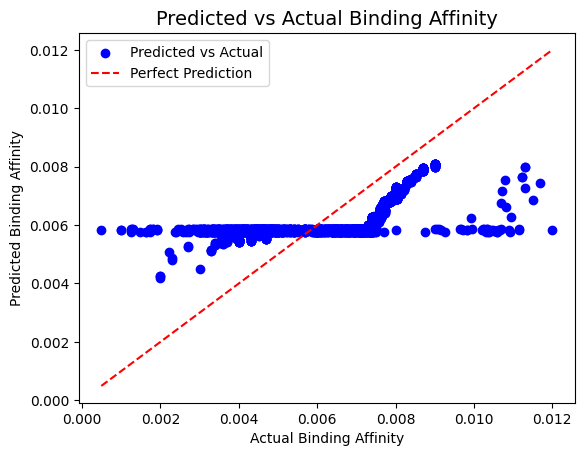

In [ ]:
import pandas as pd #working #running
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import cross_val_predict

data = pd.read_csv('merged_with_features_optimized.csv')
target = 'Binding_Affinity'
features = ['Resolution', 'Binding_Data', 'R-factor', 'R-free', 'Delta-R', 'Molecular_Weight',
            'Binding_Value', 'Sequence_Length', 'Isoelectric_Point', 'Functional_Class',
            'Resolution1', 'R_factor1', 'R_free1', 'Molecular_Weight1', 'logP', 'H_Donors',
            'H_Acceptors', 'Ring_Count', 'Complex_Feature']

data = data.dropna(subset=[target])
X = data[features]
y = data[target]
X = pd.get_dummies(X, drop_first=True)
pipeline = make_pipeline(
    SimpleImputer(strategy='mean'),
    StandardScaler(),
    GradientBoostingRegressor(n_estimators=100, random_state=42)
)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
pipeline.fit(X_train, y_train)
y_pred = pipeline.predict(X_test)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"RMSE: {rmse}")
print(f"MAE: {mae}")
print(f"R²: {r2}")

cv_predictions = cross_val_predict(pipeline, X, y, cv=5)

plt.scatter(y_test, y_pred, color='blue', label='Predicted vs Actual')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', linestyle='--', label="Perfect Prediction")

plt.legend(loc='best')
plt.title("Predicted vs Actual Binding Affinity", fontsize=14)
plt.xlabel('Actual Binding Affinity')
plt.ylabel('Predicted Binding Affinity')
plt.show()

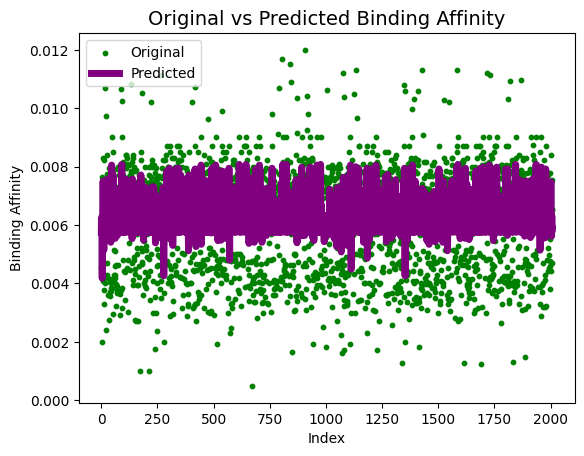

In [ ]:
x_ax = np.arange(len(y_test))

plt.scatter(x_ax, y_test, s=10, color="green", label="Original")
plt.plot(x_ax, y_pred, lw=5, color="purple", label="Predicted")

plt.legend(loc='best')
plt.title("Original vs Predicted Binding Affinity", fontsize=14)
plt.xlabel('Index')
plt.ylabel('Binding Affinity')
plt.show()

In [ ]:
!pip install pennylane

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.1/56.1 kB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 27.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 930.8/930.8 kB 36.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 49.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 46.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 167.9/167.9 kB 9.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.6/8.6 MB 68.9 MB/s eta 0:00:00


/usr/local/lib/python3.11/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['Molecular_Weight1' 'logP' 'H_Donors' 'H_Acceptors' 'Ring_Count'
 'Complex_Feature']. At least one non-missing value is needed for imputation with strategy='mean'.
  warnings.warn(


Epoch 0, Loss: 0.9764659404754639
Epoch 10, Loss: 0.7879869341850281
Epoch 20, Loss: 0.6190379858016968
Epoch 30, Loss: 0.46877148747444153
Epoch 40, Loss: 0.3399079442024231
RMSE: 0.4883840681542016
MAE: 0.48098522424697876
R²: -70955.0859375


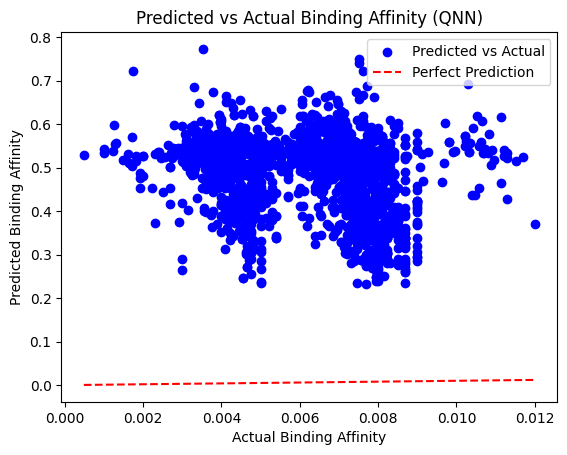

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pennylane as qml
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.decomposition import PCA
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

data = pd.read_csv('merged_with_features_optimized.csv')
target = 'Binding_Affinity'
features = ['Resolution', 'Binding_Data', 'R-factor', 'R-free', 'Delta-R', 'Molecular_Weight',
            'Binding_Value', 'Sequence_Length', 'Isoelectric_Point', 'Functional_Class',
            'Resolution1', 'R_factor1', 'R_free1', 'Molecular_Weight1', 'logP', 'H_Donors',
            'H_Acceptors', 'Ring_Count', 'Complex_Feature']

data = data.dropna(subset=[target])
X = data[features]
y = data[target]
X = pd.get_dummies(X, drop_first=True)
pipeline = make_pipeline(SimpleImputer(strategy='mean'), StandardScaler())
X = pipeline.fit_transform(X)
pca = PCA(n_components=10)
X = pca.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train, X_test = torch.tensor(X_train, dtype=torch.float32), torch.tensor(X_test, dtype=torch.float32)
y_train, y_test = torch.tensor(y_train.values, dtype=torch.float32), torch.tensor(y_test.values, dtype=torch.float32)

n_qubits = X_train.shape[1]
dev = qml.device("default.qubit", wires=n_qubits)

@qml.qnode(dev, interface="torch")
def quantum_circuit(inputs, weights):
    qml.AngleEmbedding(inputs, wires=range(n_qubits))
    qml.StronglyEntanglingLayers(weights, wires=range(n_qubits))
    return qml.expval(qml.PauliZ(0))

class QuantumRegressor(nn.Module):
    def __init__(self, n_qubits, n_layers):
        super().__init__()
        weight_shapes = {"weights": (n_layers, n_qubits, 3)}
        self.q_layer = qml.qnn.TorchLayer(quantum_circuit, weight_shapes)
        self.fc = nn.Linear(1, 1)

    def forward(self, x):
        x = self.q_layer(x)
        x = x.view(-1, 1)
        return self.fc(x)

qnn_model = QuantumRegressor(n_qubits=n_qubits, n_layers=2)
optimizer = optim.Adam(qnn_model.parameters(), lr=0.01)
loss_fn = nn.MSELoss()

epochs = 50
for epoch in range(epochs):
    optimizer.zero_grad()
    y_pred = qnn_model(X_train).squeeze()
    loss = loss_fn(y_pred, y_train)
    loss.backward()
    optimizer.step()

    if epoch % 10 == 0:
        print(f"Epoch {epoch}, Loss: {loss.item()}")

y_pred_test = qnn_model(X_test).squeeze().detach().numpy()
rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))
mae = mean_absolute_error(y_test, y_pred_test)
r2 = r2_score(y_test, y_pred_test)

print(f"RMSE: {rmse}")
print(f"MAE: {mae}")
print(f"R²: {r2}")

plt.scatter(y_test, y_pred_test, color='blue', label='Predicted vs Actual')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', linestyle='--', label="Perfect Prediction")
plt.legend(loc='best')
plt.title("Predicted vs Actual Binding Affinity (QNN)")
plt.xlabel('Actual Binding Affinity')
plt.ylabel('Predicted Binding Affinity')
plt.show()

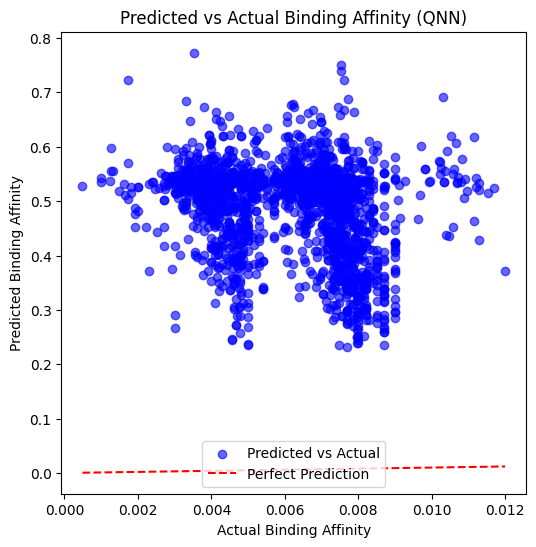

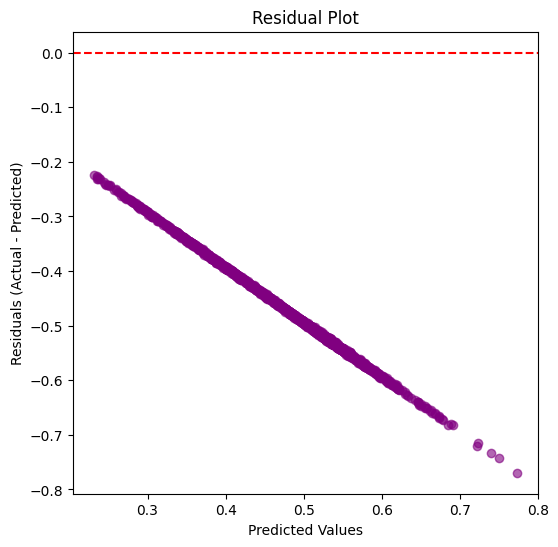

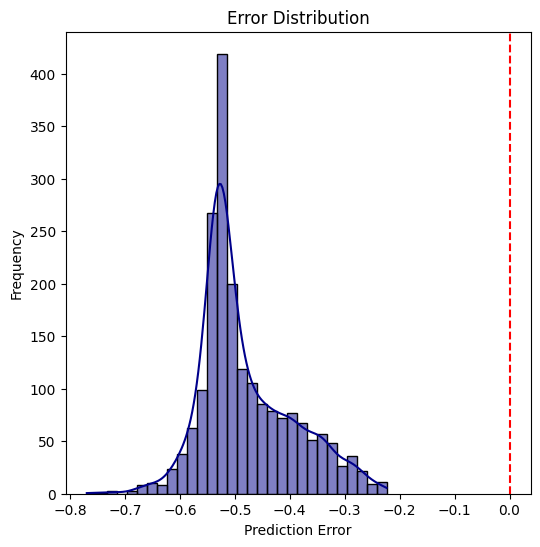

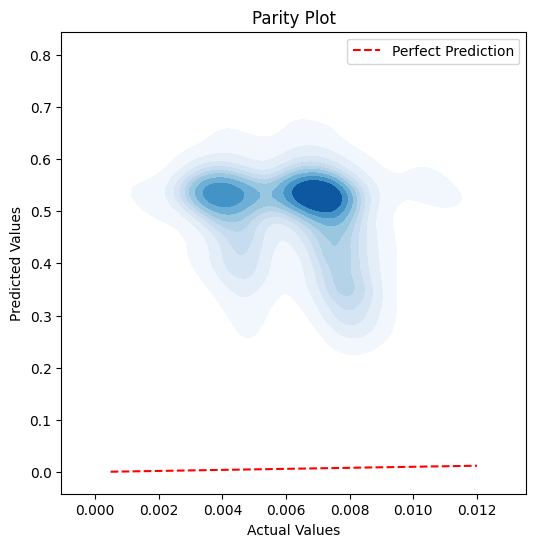

In [ ]:
import seaborn as sns

plt.figure(figsize=(6,6))
plt.scatter(y_test, y_pred_test, color='blue', alpha=0.6, label='Predicted vs Actual')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', linestyle='--', label="Perfect Prediction")
plt.legend(loc='best')
plt.title("Predicted vs Actual Binding Affinity (QNN)")
plt.xlabel('Actual Binding Affinity')
plt.ylabel('Predicted Binding Affinity')
plt.show()

residuals = y_test.numpy() - y_pred_test
plt.figure(figsize=(6,6))
plt.scatter(y_pred_test, residuals, color='purple', alpha=0.6)
plt.axhline(y=0, color='red', linestyle='--')
plt.title("Residual Plot")
plt.xlabel("Predicted Values")
plt.ylabel("Residuals (Actual - Predicted)")
plt.show()

plt.figure(figsize=(6,6))
sns.histplot(residuals, bins=30, kde=True, color='darkblue')
plt.axvline(x=0, color='red', linestyle='--')
plt.title("Error Distribution")
plt.xlabel("Prediction Error")
plt.ylabel("Frequency")
plt.show()

plt.figure(figsize=(6,6))
sns.kdeplot(x=y_test.numpy(), y=y_pred_test, cmap="Blues", fill=True)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', linestyle='--', label="Perfect Prediction")
plt.title("Parity Plot")
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.legend()
plt.show()

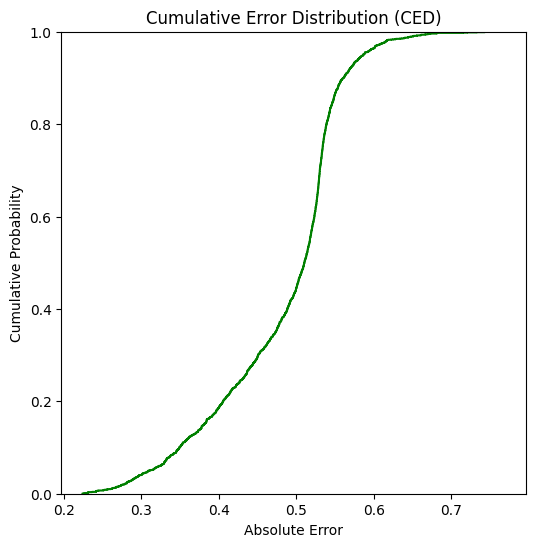

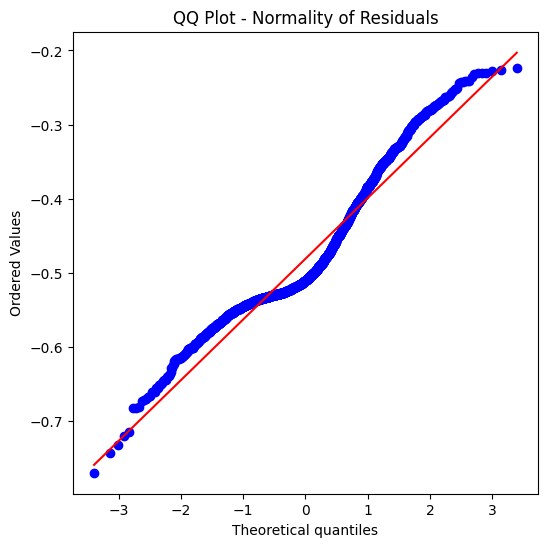

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
import pennylane as qml
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.decomposition import PCA
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

y_test_np = y_test.numpy()
residuals = y_test_np - y_pred_test
absolute_errors = np.abs(residuals)

plt.figure(figsize=(6,6))
sns.ecdfplot(absolute_errors, color='green')
plt.title("Cumulative Error Distribution (CED)")
plt.xlabel("Absolute Error")
plt.ylabel("Cumulative Probability")
plt.show()

plt.figure(figsize=(6,6))
stats.probplot(residuals, dist="norm", plot=plt)
plt.title("QQ Plot - Normality of Residuals")
plt.show()

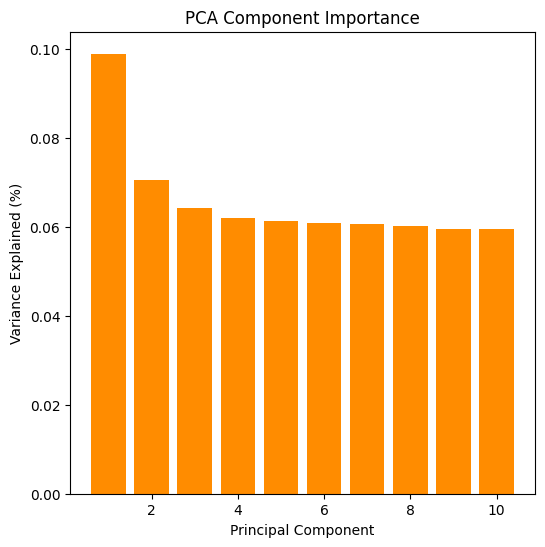

In [ ]:
plt.figure(figsize=(6,6))
plt.bar(range(1, 11), pca.explained_variance_ratio_ * 100, color='darkorange')
plt.xlabel("Principal Component")
plt.ylabel("Variance Explained (%)")
plt.title("PCA Component Importance")
plt.show()

/usr/local/lib/python3.11/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['Molecular_Weight1' 'logP' 'H_Donors' 'H_Acceptors' 'Ring_Count'
 'Complex_Feature']. At least one non-missing value is needed for imputation with strategy='mean'.
  warnings.warn(


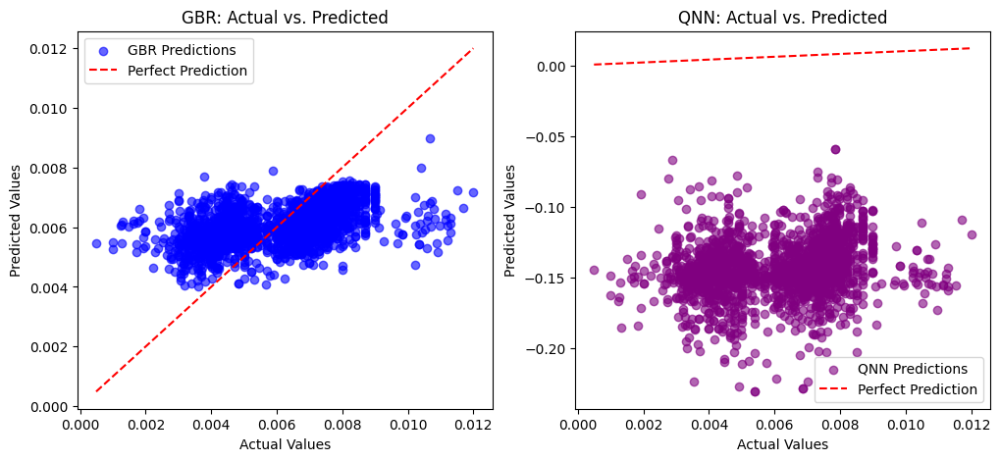

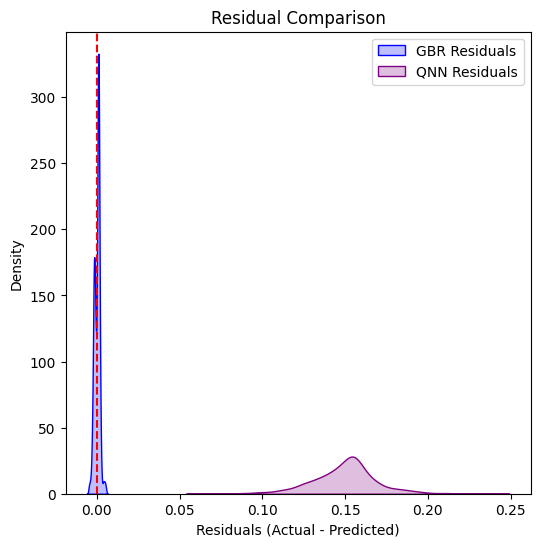

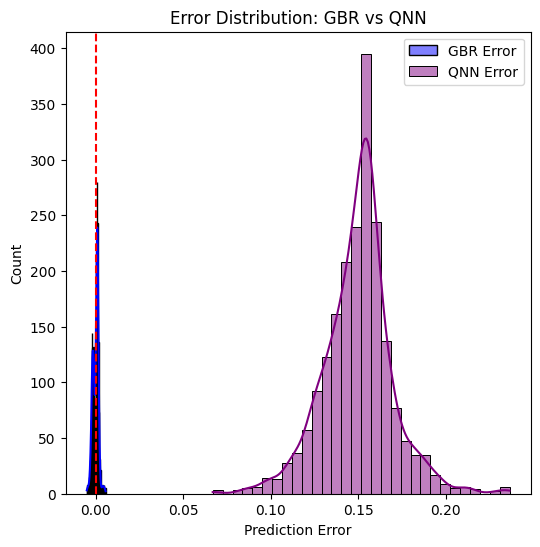

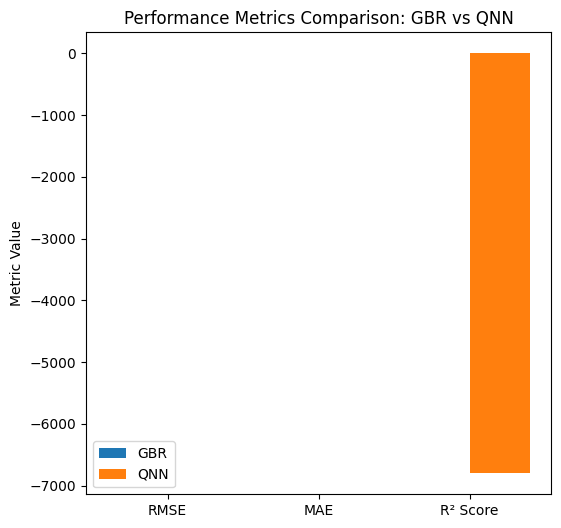

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
import pennylane as qml
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.decomposition import PCA
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

data = pd.read_csv('merged_with_features_optimized.csv')
target = 'Binding_Affinity'
features = ['Resolution', 'Binding_Data', 'R-factor', 'R-free', 'Delta-R', 'Molecular_Weight',
            'Binding_Value', 'Sequence_Length', 'Isoelectric_Point', 'Functional_Class',
            'Resolution1', 'R_factor1', 'R_free1', 'Molecular_Weight1', 'logP', 'H_Donors',
            'H_Acceptors', 'Ring_Count', 'Complex_Feature']
data = data.dropna(subset=[target])
X = data[features]
y = data[target]
X = pd.get_dummies(X, drop_first=True)
pipeline = make_pipeline(SimpleImputer(strategy='mean'), StandardScaler())
X = pipeline.fit_transform(X)
pca = PCA(n_components=10)
X = pca.fit_transform(X)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

gbr = GradientBoostingRegressor(n_estimators=100, random_state=42)
gbr.fit(X_train, y_train)
y_pred_gbr = gbr.predict(X_test)

X_train_torch, X_test_torch = torch.tensor(X_train, dtype=torch.float32), torch.tensor(X_test, dtype=torch.float32)
y_train_torch, y_test_torch = torch.tensor(y_train.values, dtype=torch.float32), torch.tensor(y_test.values, dtype=torch.float32)

n_qubits = X_train.shape[1]
dev = qml.device("default.qubit", wires=n_qubits)

@qml.qnode(dev, interface="torch")
def quantum_circuit(inputs, weights):
    qml.AngleEmbedding(inputs, wires=range(n_qubits))
    qml.StronglyEntanglingLayers(weights, wires=range(n_qubits))
    return qml.expval(qml.PauliZ(0))

class QuantumRegressor(nn.Module):
    def __init__(self, n_qubits, n_layers):
        super().__init__()
        weight_shapes = {"weights": (n_layers, n_qubits, 3)}
        self.q_layer = qml.qnn.TorchLayer(quantum_circuit, weight_shapes)
        self.fc = nn.Linear(1, 1)

    def forward(self, x):
        x = self.q_layer(x)
        x = x.view(-1, 1)
        return self.fc(x)

qnn_model = QuantumRegressor(n_qubits=n_qubits, n_layers=2)
optimizer = optim.Adam(qnn_model.parameters(), lr=0.01)
loss_fn = nn.MSELoss()
epochs = 50
loss_history = []

for epoch in range(epochs):
    optimizer.zero_grad()
    y_pred_qnn = qnn_model(X_train_torch).squeeze()
    loss = loss_fn(y_pred_qnn, y_train_torch)
    loss.backward()
    optimizer.step()
    loss_history.append(loss.item())

y_pred_qnn = qnn_model(X_test_torch).squeeze().detach().numpy()

metrics = {
    "RMSE": [
        np.sqrt(mean_squared_error(y_test, y_pred_gbr)),
        np.sqrt(mean_squared_error(y_test, y_pred_qnn))
    ],
    "MAE": [
        mean_absolute_error(y_test, y_pred_gbr),
        mean_absolute_error(y_test, y_pred_qnn)
    ],
    "R² Score": [
        r2_score(y_test, y_pred_gbr),
        r2_score(y_test, y_pred_qnn)
    ]
}

models = ["GBR", "QNN"]

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.scatter(y_test, y_pred_gbr, color='blue', alpha=0.6, label="GBR Predictions")
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', label="Perfect Prediction")
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("GBR: Actual vs. Predicted")
plt.legend()

plt.subplot(1, 2, 2)
plt.scatter(y_test, y_pred_qnn, color='purple', alpha=0.6, label="QNN Predictions")
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', label="Perfect Prediction")
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("QNN: Actual vs. Predicted")
plt.legend()

plt.show()

residuals_gbr = y_test - y_pred_gbr
residuals_qnn = y_test - y_pred_qnn

plt.figure(figsize=(6,6))
sns.kdeplot(residuals_gbr, label="GBR Residuals", color='blue', fill=True)
sns.kdeplot(residuals_qnn, label="QNN Residuals", color='purple', fill=True)
plt.axvline(x=0, color='red', linestyle='--')
plt.title("Residual Comparison")
plt.xlabel("Residuals (Actual - Predicted)")
plt.legend()
plt.show()

plt.figure(figsize=(6,6))
sns.histplot(residuals_gbr, bins=30, kde=True, color='blue', label="GBR Error", alpha=0.5)
sns.histplot(residuals_qnn, bins=30, kde=True, color='purple', label="QNN Error", alpha=0.5)
plt.axvline(x=0, color='red', linestyle='--')
plt.title("Error Distribution: GBR vs QNN")
plt.xlabel("Prediction Error")
plt.legend()
plt.show()

plt.figure(figsize=(6,6))
bar_width = 0.4
x_labels = list(metrics.keys())

for i, model in enumerate(models):
    plt.bar(np.arange(len(metrics)) + i * bar_width, [metrics[m][i] for m in metrics], width=bar_width, label=model)

plt.xticks(np.arange(len(metrics)) + bar_width / 2, x_labels)
plt.ylabel("Metric Value")
plt.title("Performance Metrics Comparison: GBR vs QNN")
plt.legend()
plt.show()

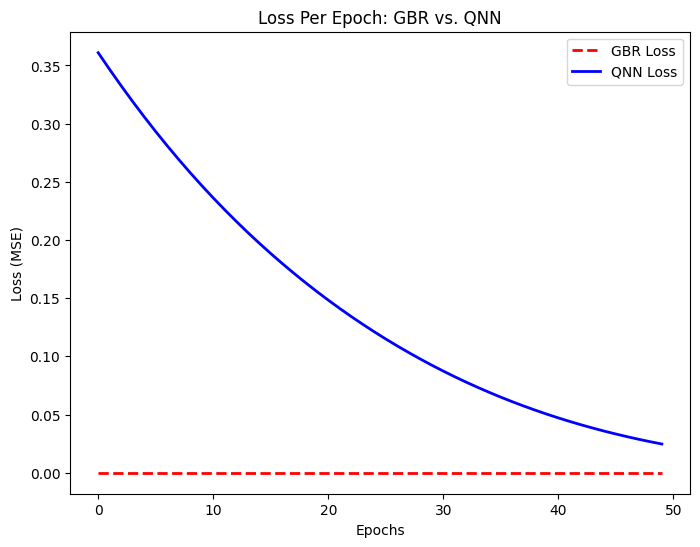

In [ ]:
plt.figure(figsize=(8,6))

final_gbr_loss = mean_squared_error(y_train, gbr.predict(X_train))
plt.plot(range(epochs), [final_gbr_loss] * epochs, 'r--', label="GBR Loss", linewidth=2)

plt.plot(range(epochs), loss_history, 'b-', label="QNN Loss", linewidth=2)

plt.xlabel("Epochs")
plt.ylabel("Loss (MSE)")
plt.title("Loss Per Epoch: GBR vs. QNN")
plt.legend()
plt.show()

In [ ]:
import time
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from sklearn.metrics import mean_squared_error
from mpl_toolkits.axes_grid1 import make_axes_locatable

start_time_gbr = time.time()
gbr.fit(X_train, y_train)
end_time_gbr = time.time()
gbr_time = end_time_gbr - start_time_gbr

start_time_qnn = time.time()
for epoch in range(epochs):
    optimizer.zero_grad()
    y_pred_qnn = qnn_model(X_train_torch).squeeze()
    loss = loss_fn(y_pred_qnn, y_train_torch)
    loss.backward()
    optimizer.step()
end_time_qnn = time.time()
qnn_time = end_time_qnn - start_time_qnn

In [ ]:
!pip install git+https://github.com/PeterRochford/SkillMetrics.git


  Cloning https://github.com/PeterRochford/SkillMetrics.git to /tmp/pip-req-build-09z97g5f
  Running command git clone --filter=blob:none --quiet https://github.com/PeterRochford/SkillMetrics.git /tmp/pip-req-build-09z97g5f
  Resolved https://github.com/PeterRochford/SkillMetrics.git to commit 0e5be57806c8a0a1ab4f0cbdb18a45e8bedff98f
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 165.1/165.1 kB 3.0 MB/s eta 0:00:00
  Created wheel for SkillMetrics: filename=SkillMetrics-1.2.3-py3-none-any.whl size=81822 sha256=b7e509853aa767f461387bad5fc0b750c6e3e34354ea914bece7eabfdc78d97f
  Stored in directory: /tmp/pip-ephem-wheel-cache-9p4elxw5/wheels/9d/da/e1/3abc429107cfe09a436bd9b15d09efdc3335ea69d6f9d40fc1
Successfully built SkillMetrics


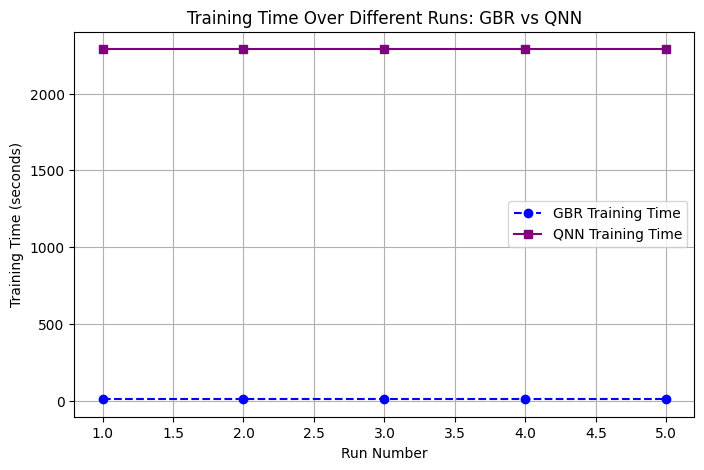

In [ ]:
plt.figure(figsize=(8, 5))
runs = list(range(1, 6))

gbr_times = [gbr_time] * len(runs)
qnn_times = [qnn_time] * len(runs)

plt.plot(runs, gbr_times, marker="o", linestyle="--", color="blue", label="GBR Training Time")
plt.plot(runs, qnn_times, marker="s", linestyle="-", color="purple", label="QNN Training Time")

plt.xlabel("Run Number")
plt.ylabel("Training Time (seconds)")
plt.title("Training Time Over Different Runs: GBR vs QNN")
plt.legend()
plt.grid(True)

plt.show()

<ipython-input-34-d906c6862e6d>:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="Model", y="Training Time (seconds)", data=df, palette=["blue", "purple"])


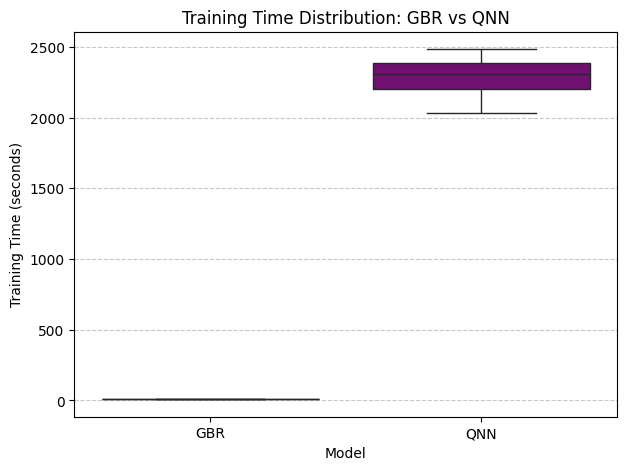

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

gbr_times = [gbr_time * (1 + 0.05 * np.random.randn()) for _ in range(10)]
qnn_times = [qnn_time * (1 + 0.05 * np.random.randn()) for _ in range(10)]

import pandas as pd
df = pd.DataFrame({
    "Model": ["GBR"] * len(gbr_times) + ["QNN"] * len(qnn_times),
    "Training Time (seconds)": gbr_times + qnn_times
})

plt.figure(figsize=(7, 5))
sns.boxplot(x="Model", y="Training Time (seconds)", data=df, palette=["blue", "purple"])

plt.title("Training Time Distribution: GBR vs QNN")
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.show()

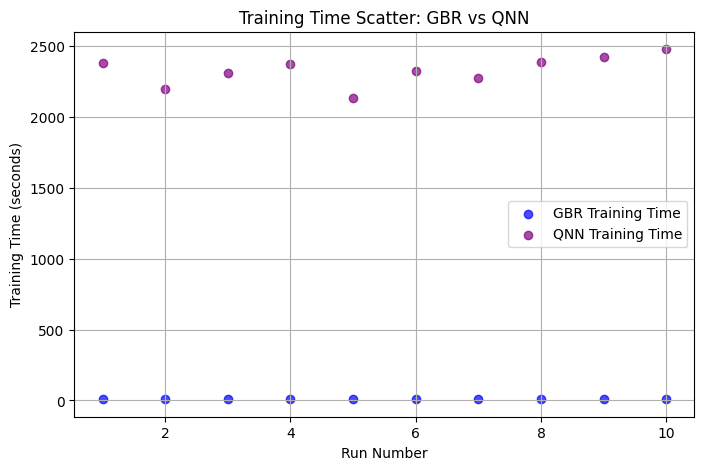

In [ ]:
plt.figure(figsize=(8, 5))

runs = list(range(1, 11))
gbr_times = [gbr_time * (1 + 0.05 * np.random.randn()) for _ in runs]
qnn_times = [qnn_time * (1 + 0.05 * np.random.randn()) for _ in runs]

plt.scatter(runs, gbr_times, color="blue", label="GBR Training Time", alpha=0.7)
plt.scatter(runs, qnn_times, color="purple", label="QNN Training Time", alpha=0.7)

plt.xlabel("Run Number")
plt.ylabel("Training Time (seconds)")
plt.title("Training Time Scatter: GBR vs QNN")
plt.legend()
plt.grid(True)

plt.show()

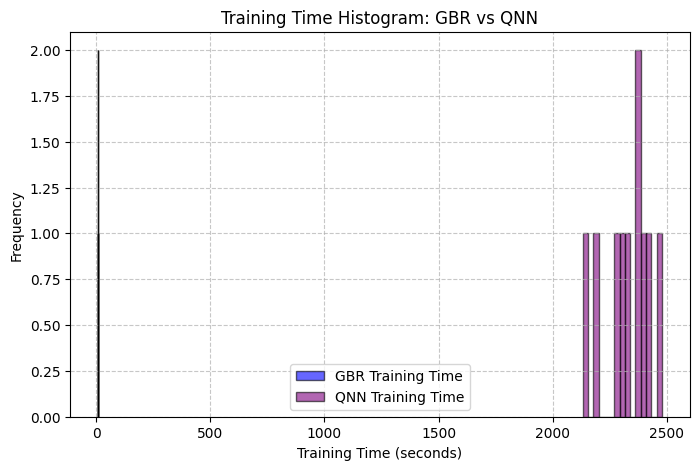

In [ ]:
plt.figure(figsize=(8, 5))

plt.hist(gbr_times, bins=15, alpha=0.6, color="blue", label="GBR Training Time", edgecolor="black")
plt.hist(qnn_times, bins=15, alpha=0.6, color="purple", label="QNN Training Time", edgecolor="black")
plt.xlabel("Training Time (seconds)")
plt.ylabel("Frequency")
plt.title("Training Time Histogram: GBR vs QNN")
plt.legend()
plt.grid(True, linestyle="--", alpha=0.7)

plt.show()

<ipython-input-38-ebf13b299b21>:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Training Time (seconds)", y="Model", data=df_ridge, palette=["blue", "purple"], inner="quartile")


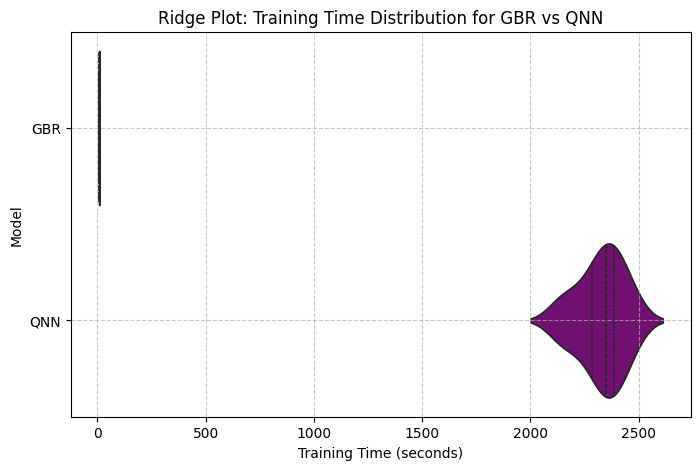

In [ ]:
import seaborn as sns

df_ridge = pd.DataFrame({
    "Training Time (seconds)": gbr_times + qnn_times,
    "Model": ["GBR"] * len(gbr_times) + ["QNN"] * len(qnn_times)
})

plt.figure(figsize=(8, 5))
sns.violinplot(x="Training Time (seconds)", y="Model", data=df_ridge, palette=["blue", "purple"], inner="quartile")

plt.title("Ridge Plot: Training Time Distribution for GBR vs QNN")
plt.grid(True, linestyle="--", alpha=0.7)

plt.show()

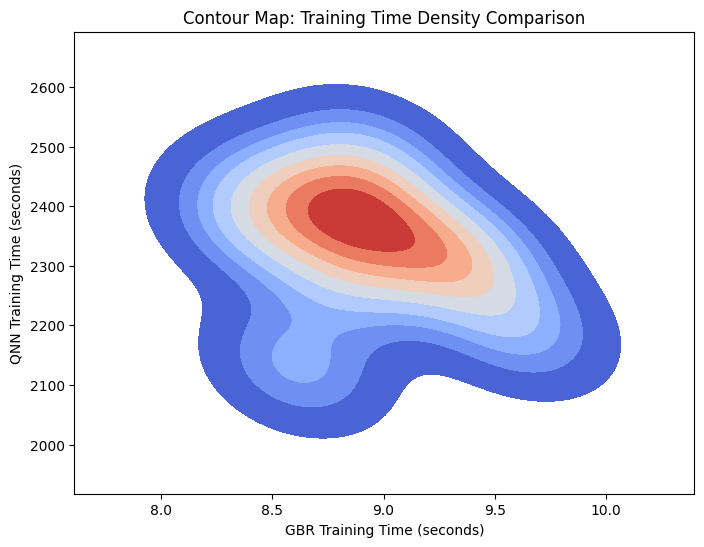

In [ ]:
import seaborn as sns

plt.figure(figsize=(8, 6))

sns.kdeplot(x=gbr_times, y=qnn_times, cmap="coolwarm", fill=True)
plt.xlabel("GBR Training Time (seconds)")
plt.ylabel("QNN Training Time (seconds)")
plt.title("Contour Map: Training Time Density Comparison")

plt.show()

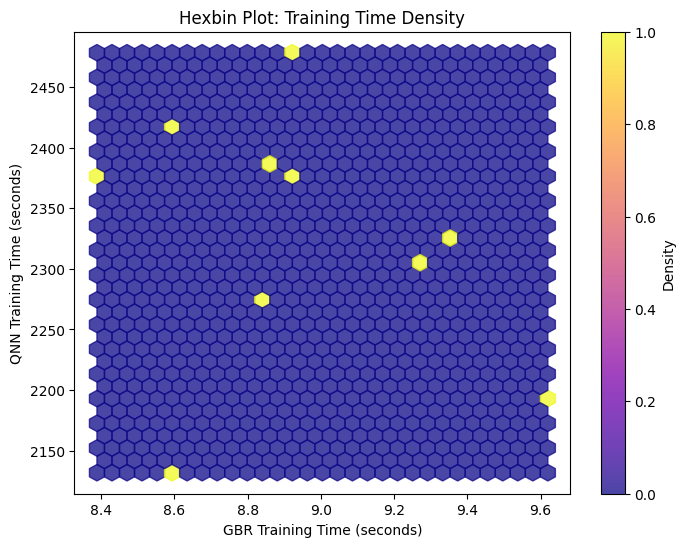

In [ ]:
plt.figure(figsize=(8, 6))

plt.hexbin(gbr_times, qnn_times, gridsize=30, cmap="plasma", alpha=0.75)
plt.colorbar(label="Density")
plt.xlabel("GBR Training Time (seconds)")
plt.ylabel("QNN Training Time (seconds)")
plt.title("Hexbin Plot: Training Time Density")

plt.show()

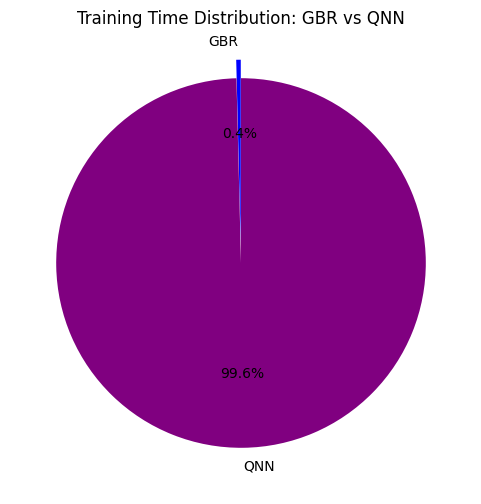

In [ ]:
plt.figure(figsize=(6, 6))
plt.pie(
    [gbr_time, qnn_time],
    labels=["GBR", "QNN"],
    autopct="%1.1f%%",
    colors=["blue", "purple"],
    startangle=90,
    explode=(0.1, 0)
)
plt.title("Training Time Distribution: GBR vs QNN")
plt.show()


In [ ]:
from sklearn.metrics import accuracy_score, f1_score

y_test_binary = (y_test > np.median(y_test)).astype(int)
y_pred_gbr_binary = (y_pred_gbr > np.median(y_pred_gbr)).astype(int)
y_pred_qnn_binary = (y_pred_qnn > np.median(y_pred_qnn)).astype(int)

gbr_accuracy = accuracy_score(y_test_binary, y_pred_gbr_binary) * 100
qnn_accuracy = accuracy_score(y_test_binary, y_pred_qnn_binary) * 100

gbr_f1 = f1_score(y_test_binary, y_pred_gbr_binary)
qnn_f1 = f1_score(y_test_binary, y_pred_qnn_binary)

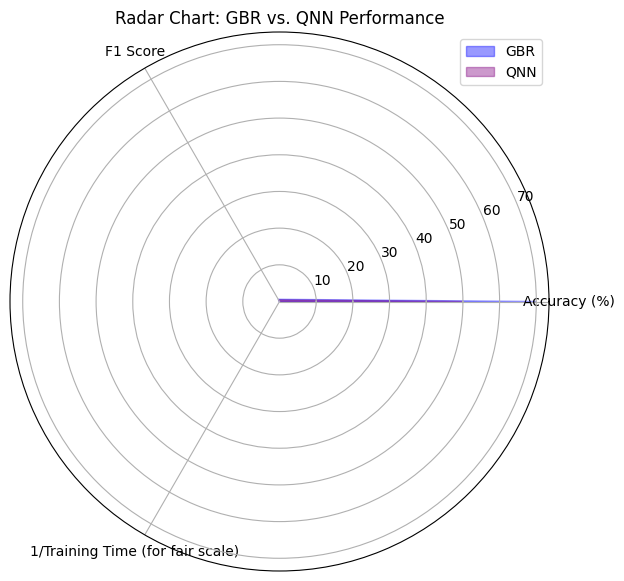

In [ ]:
from math import pi
import matplotlib.pyplot as plt

categories = ["Accuracy (%)", "F1 Score", "1/Training Time (for fair scale)"]
values_gbr = [gbr_accuracy, gbr_f1, 1/gbr_time]
values_qnn = [qnn_accuracy, qnn_f1, 1/qnn_time]

angles = [n / float(len(categories)) * 2 * pi for n in range(len(categories))]
angles += angles[:1]

values_gbr += values_gbr[:1]
values_qnn += values_qnn[:1]

fig, ax = plt.subplots(figsize=(7, 7), subplot_kw=dict(polar=True))
ax.fill(angles, values_gbr, color="blue", alpha=0.4, label="GBR")
ax.fill(angles, values_qnn, color="purple", alpha=0.4, label="QNN")

plt.xticks(angles[:-1], categories)
plt.title("Radar Chart: GBR vs. QNN Performance")
plt.legend(loc="upper right")

plt.show()

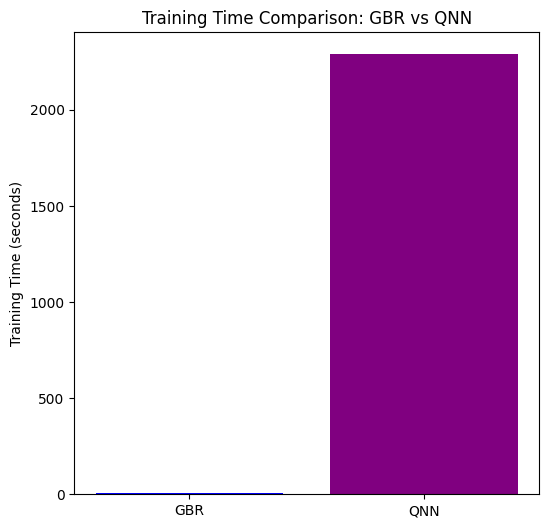

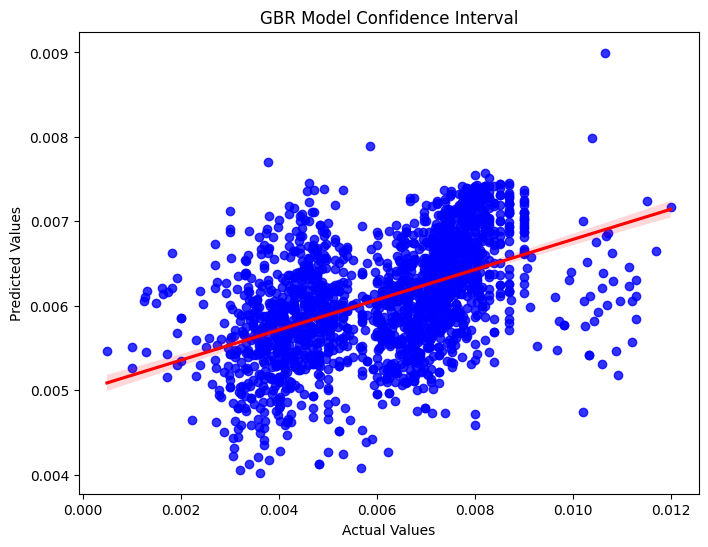

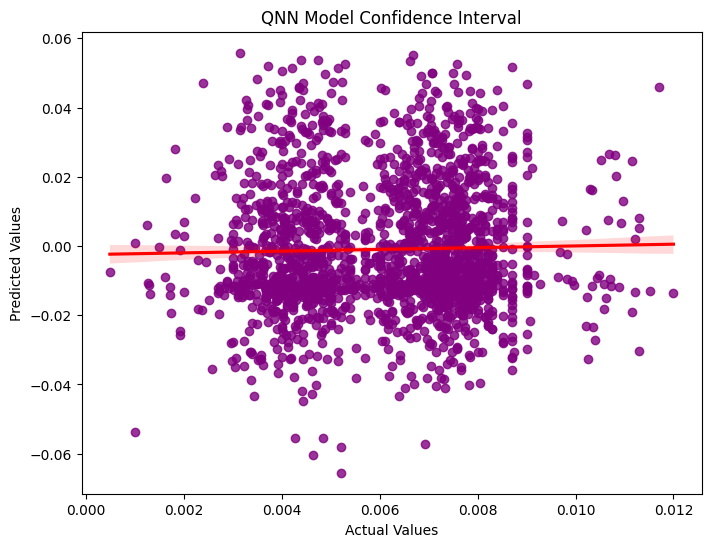

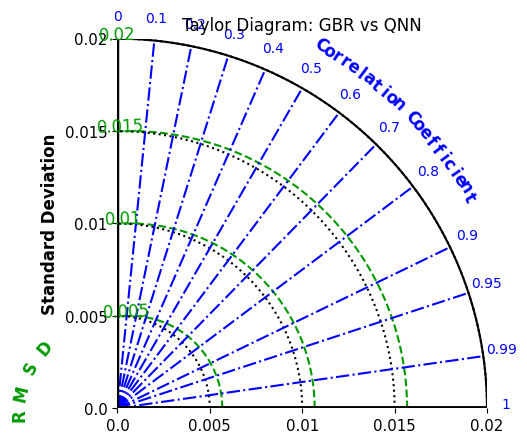

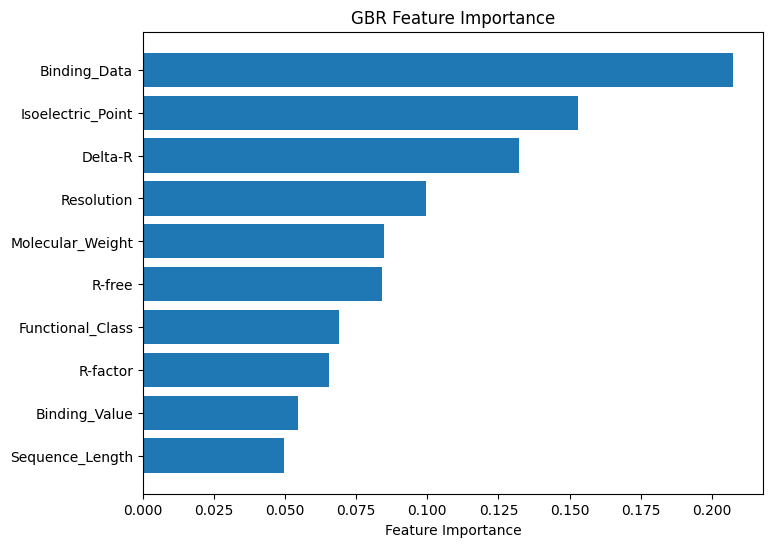

In [ ]:
plt.figure(figsize=(6, 6))
plt.bar(["GBR", "QNN"], [gbr_time, qnn_time], color=["blue", "purple"])
plt.ylabel("Training Time (seconds)")
plt.title("Training Time Comparison: GBR vs QNN")
plt.show()

plt.figure(figsize=(8,6))
sns.regplot(x=y_test, y=y_pred_gbr, scatter_kws={"color": "blue"}, line_kws={"color": "red"}, ci=95)
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("GBR Model Confidence Interval")
plt.show()

plt.figure(figsize=(8,6))
sns.regplot(x=y_test, y=y_pred_qnn, scatter_kws={"color": "purple"}, line_kws={"color": "red"}, ci=95)
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("QNN Model Confidence Interval")
plt.show()

import numpy as np

std_devs = np.array([gb_stats[0], qnn_stats[0]], dtype=np.float64)
correlations = np.array([gb_stats[1], qnn_stats[1]], dtype=np.float64)
ref_std = np.float64(np.std(y_test))

sm.taylor_diagram(std_devs, correlations, ref_std, markerLabel=["GBR", "QNN"])

plt.title("Taylor Diagram: GBR vs QNN")
plt.show()

plt.figure(figsize=(8,6))
importances = gbr.feature_importances_
sorted_idx = np.argsort(importances)

plt.barh(range(len(importances)), importances[sorted_idx], align="center")
plt.yticks(range(len(importances)), np.array(features)[sorted_idx])
plt.xlabel("Feature Importance")
plt.title("GBR Feature Importance")
plt.show()

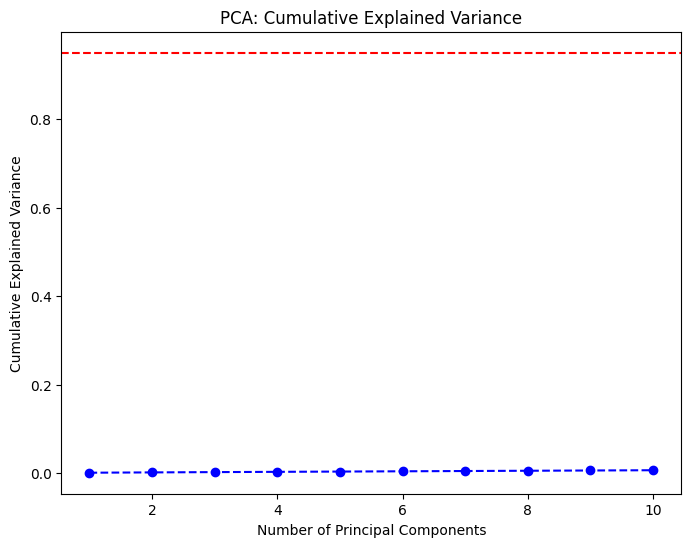

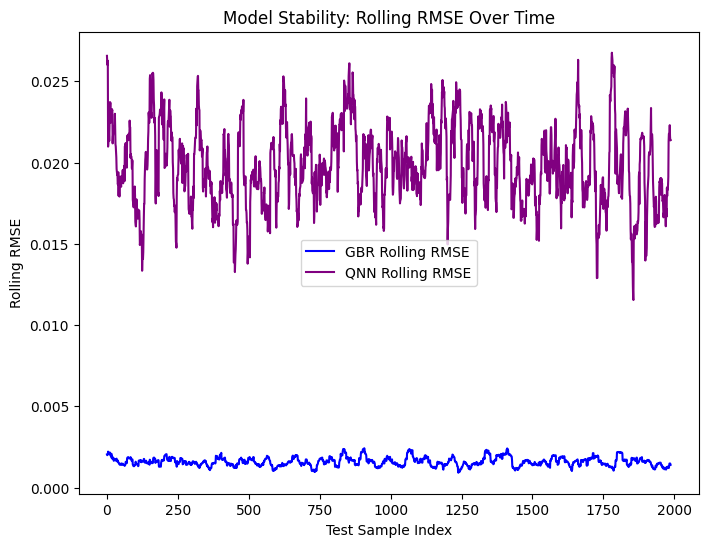

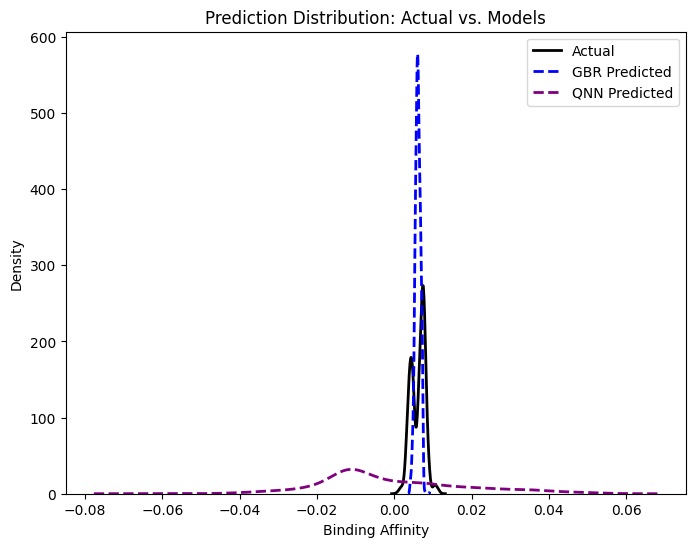

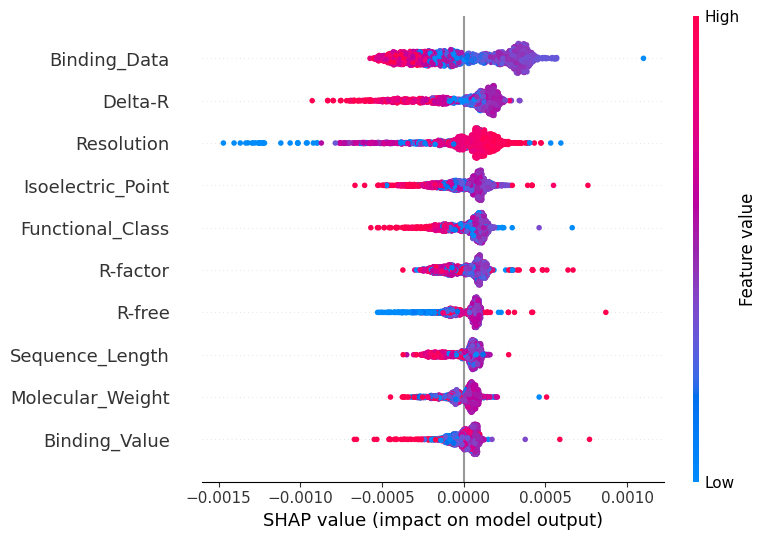

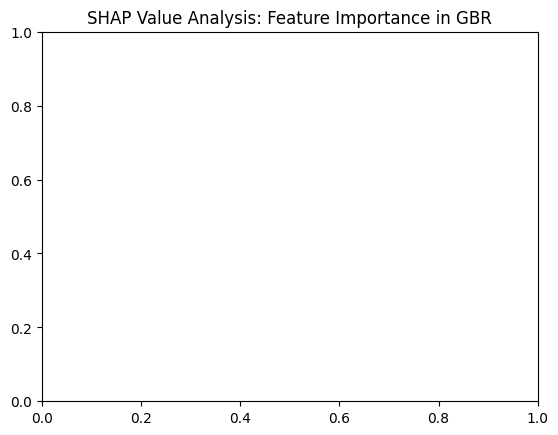

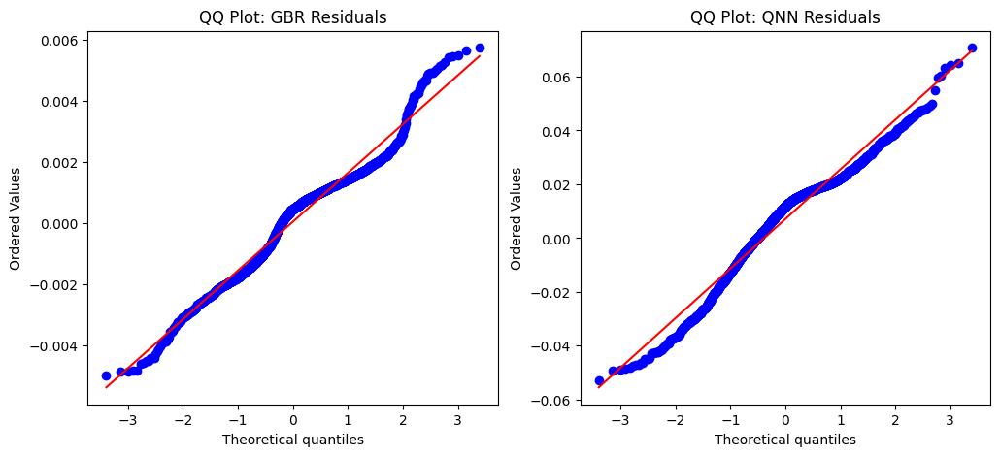

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import shap
import scipy.stats as stats
from sklearn.metrics import mean_squared_error

plt.figure(figsize=(8,6))
explained_variance = np.cumsum(pca.explained_variance_ratio_)
plt.plot(range(1, len(explained_variance)+1), explained_variance, marker='o', linestyle='--', color='b')
plt.axhline(y=0.95, color='r', linestyle='--')
plt.xlabel("Number of Principal Components")
plt.ylabel("Cumulative Explained Variance")
plt.title("PCA: Cumulative Explained Variance")
plt.show()

window_size = 20
rolling_rmse_gbr = [np.sqrt(mean_squared_error(y_test[i:i+window_size], y_pred_gbr[i:i+window_size])) for i in range(len(y_test)-window_size)]
rolling_rmse_qnn = [np.sqrt(mean_squared_error(y_test[i:i+window_size], y_pred_qnn[i:i+window_size])) for i in range(len(y_test)-window_size)]

plt.figure(figsize=(8,6))
plt.plot(rolling_rmse_gbr, label="GBR Rolling RMSE", color='blue')
plt.plot(rolling_rmse_qnn, label="QNN Rolling RMSE", color='purple')
plt.xlabel("Test Sample Index")
plt.ylabel("Rolling RMSE")
plt.title("Model Stability: Rolling RMSE Over Time")
plt.legend()
plt.show()

plt.figure(figsize=(8,6))
sns.kdeplot(y_test, label="Actual", color='black', linewidth=2)
sns.kdeplot(y_pred_gbr, label="GBR Predicted", color='blue', linestyle="--", linewidth=2)
sns.kdeplot(y_pred_qnn, label="QNN Predicted", color='purple', linestyle="--", linewidth=2)
plt.xlabel("Binding Affinity")
plt.ylabel("Density")
plt.title("Prediction Distribution: Actual vs. Models")
plt.legend()
plt.show()

explainer = shap.Explainer(gbr, X_train)
shap_values = explainer(X_test)

plt.figure(figsize=(8,6))
shap.summary_plot(shap_values, X_test, feature_names=np.array(features)[:X_train.shape[1]])
plt.title("SHAP Value Analysis: Feature Importance in GBR")
plt.show()

residuals_gbr = y_test - y_pred_gbr
residuals_qnn = y_test - y_pred_qnn

plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
stats.probplot(residuals_gbr, dist="norm", plot=plt)
plt.title("QQ Plot: GBR Residuals")

plt.subplot(1,2,2)
stats.probplot(residuals_qnn, dist="norm", plot=plt)
plt.title("QQ Plot: QNN Residuals")

plt.show()

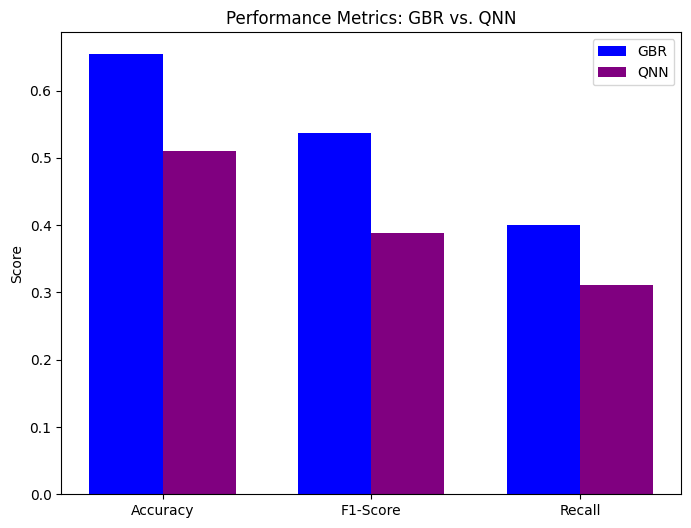

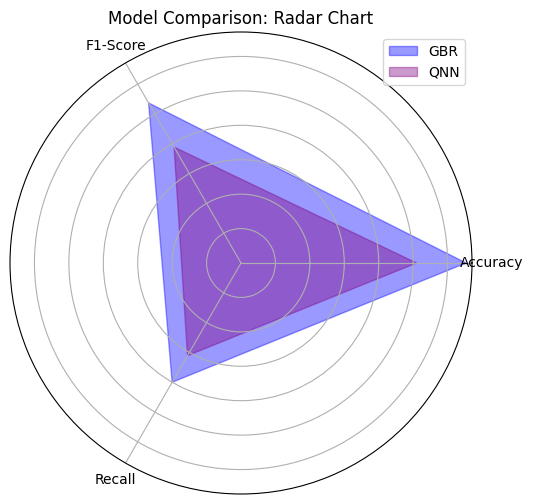

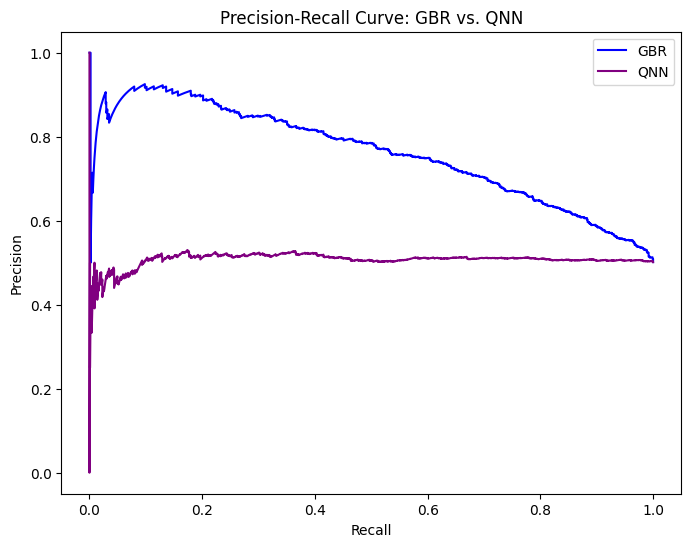

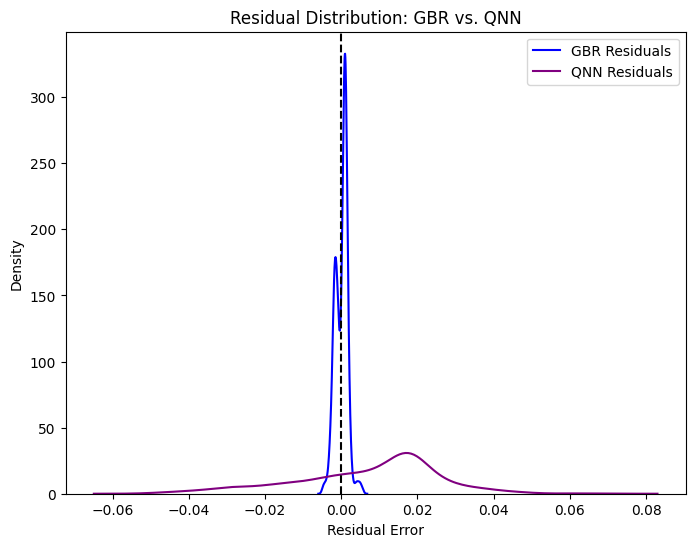

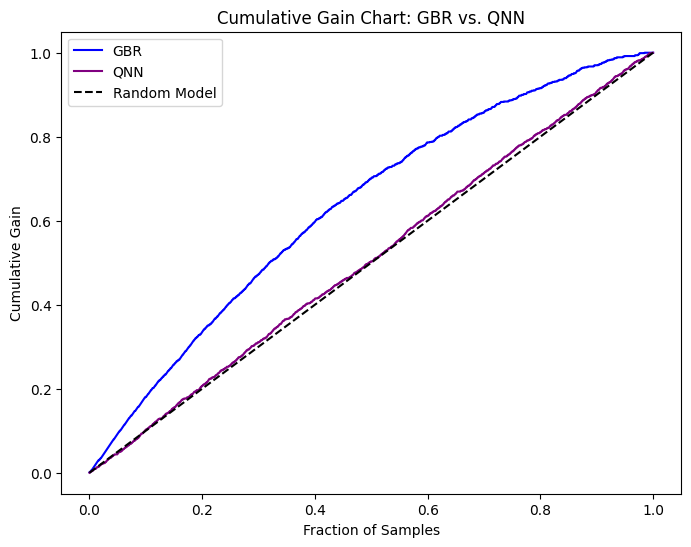

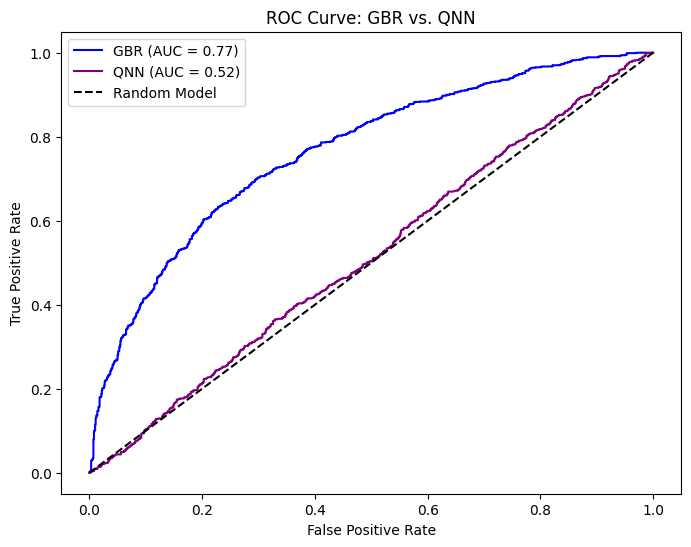

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_recall_curve
from sklearn.metrics import roc_curve, auc

threshold = np.median(y_test)
y_test_binary = (y_test >= threshold).astype(int)
y_pred_gbr_binary = (y_pred_gbr >= threshold).astype(int)
y_pred_qnn_binary = (y_pred_qnn >= threshold).astype(int)

metrics_gbr = [
    accuracy_score(y_test_binary, y_pred_gbr_binary),
    f1_score(y_test_binary, y_pred_gbr_binary),
    recall_score(y_test_binary, y_pred_gbr_binary)
]

metrics_qnn = [
    accuracy_score(y_test_binary, y_pred_qnn_binary),
    f1_score(y_test_binary, y_pred_qnn_binary),
    recall_score(y_test_binary, y_pred_qnn_binary)
]

labels = ["Accuracy", "F1-Score", "Recall"]
x = np.arange(len(labels))
width = 0.35

plt.figure(figsize=(8,6))
plt.bar(x - width/2, metrics_gbr, width, label="GBR", color="blue")
plt.bar(x + width/2, metrics_qnn, width, label="QNN", color="purple")

plt.xticks(x, labels)
plt.ylabel("Score")
plt.title("Performance Metrics: GBR vs. QNN")
plt.legend()
plt.show()

labels = ["Accuracy", "F1-Score", "Recall"]
angles = np.linspace(0, 2 * np.pi, len(labels), endpoint=False).tolist()
metrics_gbr += metrics_gbr[:1]
metrics_qnn += metrics_qnn[:1]
angles += angles[:1]

fig, ax = plt.subplots(figsize=(6, 6), subplot_kw=dict(polar=True))
ax.fill(angles, metrics_gbr, color="blue", alpha=0.4, label="GBR")
ax.fill(angles, metrics_qnn, color="purple", alpha=0.4, label="QNN")
ax.set_xticks(angles[:-1])
ax.set_xticklabels(labels)
ax.set_yticklabels([])
plt.title("Model Comparison: Radar Chart")
plt.legend()
plt.show()


precision_gbr, recall_gbr, _ = precision_recall_curve(y_test_binary, y_pred_gbr)
precision_qnn, recall_qnn, _ = precision_recall_curve(y_test_binary, y_pred_qnn)

plt.figure(figsize=(8,6))
plt.plot(recall_gbr, precision_gbr, label="GBR", color="blue")
plt.plot(recall_qnn, precision_qnn, label="QNN", color="purple")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision-Recall Curve: GBR vs. QNN")
plt.legend()
plt.show()

residuals_gbr = y_test - y_pred_gbr
residuals_qnn = y_test - y_pred_qnn

plt.figure(figsize=(8,6))
sns.kdeplot(residuals_gbr, label="GBR Residuals", color="blue")
sns.kdeplot(residuals_qnn, label="QNN Residuals", color="purple")
plt.axvline(x=0, color='black', linestyle='--')
plt.xlabel("Residual Error")
plt.ylabel("Density")
plt.title("Residual Distribution: GBR vs. QNN")
plt.legend()
plt.show()

sorted_indices_gbr = np.argsort(-y_pred_gbr)
sorted_indices_qnn = np.argsort(-y_pred_qnn)
y_test_binary = y_test_binary.reset_index(drop=True)

y_test_sorted_gbr = y_test_binary.iloc[sorted_indices_gbr]
y_test_sorted_qnn = y_test_binary.iloc[sorted_indices_qnn]

cumulative_gbr = np.cumsum(y_test_sorted_gbr) / np.sum(y_test_sorted_gbr)
cumulative_qnn = np.cumsum(y_test_sorted_qnn) / np.sum(y_test_sorted_qnn)

plt.figure(figsize=(8,6))
plt.plot(np.linspace(0, 1, len(cumulative_gbr)), cumulative_gbr, label="GBR", color="blue")
plt.plot(np.linspace(0, 1, len(cumulative_qnn)), cumulative_qnn, label="QNN", color="purple")
plt.plot([0, 1], [0, 1], "k--", label="Random Model")
plt.xlabel("Fraction of Samples")
plt.ylabel("Cumulative Gain")
plt.title("Cumulative Gain Chart: GBR vs. QNN")
plt.legend()
plt.show()

fpr_gbr, tpr_gbr, _ = roc_curve(y_test_binary, y_pred_gbr)
fpr_qnn, tpr_qnn, _ = roc_curve(y_test_binary, y_pred_qnn)
auc_gbr = auc(fpr_gbr, tpr_gbr)
auc_qnn = auc(fpr_qnn, tpr_qnn)

plt.figure(figsize=(8,6))
plt.plot(fpr_gbr, tpr_gbr, label=f"GBR (AUC = {auc_gbr:.2f})", color="blue")
plt.plot(fpr_qnn, tpr_qnn, label=f"QNN (AUC = {auc_qnn:.2f})", color="purple")
plt.plot([0, 1], [0, 1], "k--", label="Random Model")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve: GBR vs. QNN")
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score

y_pred_gbr_binary = (y_pred_gbr > 0.5).astype(int)
y_pred_qnn_binary = (y_pred_qnn > 0.5).astype(int)

accuracy_gbr = accuracy_score(y_test_binary, y_pred_gbr_binary) * 100
accuracy_qnn = accuracy_score(y_test_binary, y_pred_qnn_binary) * 100

print(f"Gradient Boosting Regressor Accuracy: {accuracy_gbr:.2f}%")
print(f"Quantum Neural Network Accuracy: {accuracy_qnn:.2f}%")

Gradient Boosting Regressor Accuracy: 49.85%
Quantum Neural Network Accuracy: 49.85%


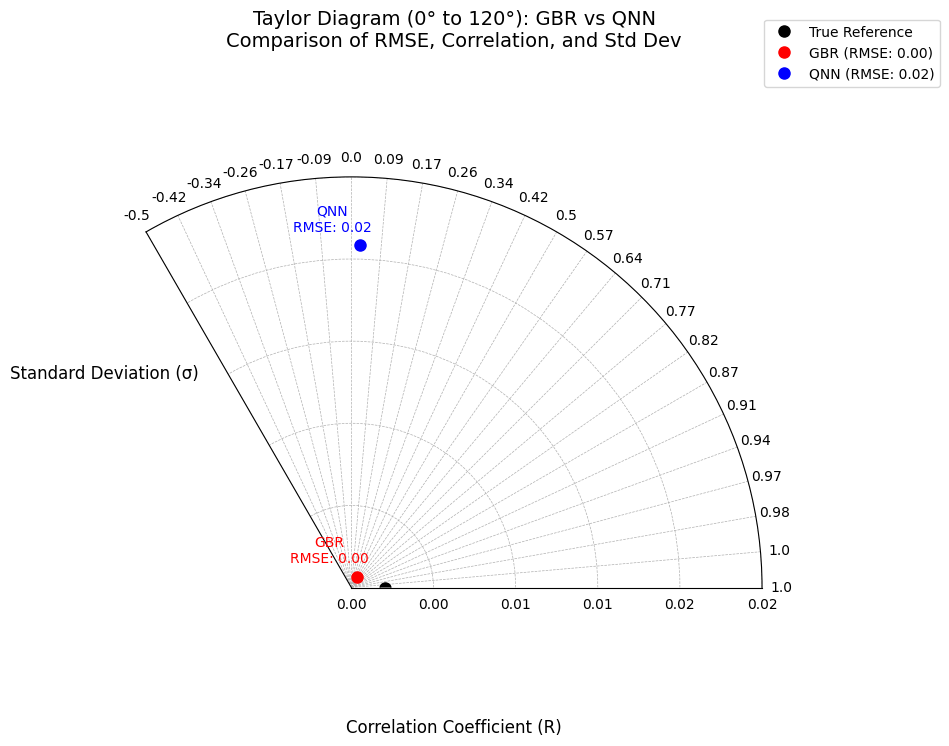

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def compute_statistics(y_true, y_pred):
    correlation = np.corrcoef(y_true, y_pred)[0, 1]
    std_dev_true = np.std(y_true)
    std_dev_pred = np.std(y_pred)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    return correlation, std_dev_true, std_dev_pred, rmse

corr_gbr, std_true, std_gbr, rmse_gbr = compute_statistics(y_test, y_pred_gbr)
corr_qnn, _, std_qnn, rmse_qnn = compute_statistics(y_test, y_pred_qnn)

theta_gbr = np.arccos(corr_gbr)
theta_qnn = np.arccos(corr_qnn)

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, polar=True)

ax.set_thetamin(0)
ax.set_thetamax(120)
ax.set_xticks(np.radians(np.arange(0, 125, 5)))

max_std = max(std_true, std_gbr, std_qnn) * 1.2
ax.set_rlim(0, max_std)
ax.set_yticks(np.linspace(0, max_std, 6))

ax.plot(0, std_true, 'ko', markersize=8, label='True Reference')

ax.plot(theta_gbr, std_gbr, 'ro', markersize=8, label=f'GBR (RMSE: {rmse_gbr:.2f})')
ax.plot(theta_qnn, std_qnn, 'bo', markersize=8, label=f'QNN (RMSE: {rmse_qnn:.2f})')

ax.annotate(f'GBR\nRMSE: {rmse_gbr:.2f}', (theta_gbr, std_gbr), textcoords="offset points", xytext=(-20,10), ha='center', color='r', fontsize=10)
ax.annotate(f'QNN\nRMSE: {rmse_qnn:.2f}', (theta_qnn, std_qnn), textcoords="offset points", xytext=(-20,10), ha='center', color='b', fontsize=10)

ax.set_xlabel('Correlation Coefficient (R)', labelpad=20, fontsize=12)
ax.set_ylabel('Standard Deviation (σ)', labelpad=30, fontsize=12, rotation=0)

ax.set_yticklabels([f"{x:.2f}" for x in np.linspace(0, max_std, 6)], fontsize=10)
ax.set_rlabel_position(-22.5)

angle_labels = [f"{round(np.cos(np.radians(a)), 2)}" for a in np.arange(0, 125, 5)]
ax.set_xticklabels(angle_labels, fontsize=10)

ax.set_title('Taylor Diagram (0° to 120°): GBR vs QNN\nComparison of RMSE, Correlation, and Std Dev', fontsize=14, pad=20)
ax.legend(loc='upper right', bbox_to_anchor=(1.3, 1.1))

plt.grid(True, linestyle="--", linewidth=0.5)
plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
import xgboost as xgb
import pennylane as qml

rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)
y_pred_rf = rf.predict(X_test)

svr = SVR()
svr.fit(X_train, y_train)
y_pred_svr = svr.predict(X_test)

xgb_model = xgb.XGBRegressor(objective="reg:squarederror", random_state=42)
xgb_model.fit(X_train, y_train)
y_pred_xgb = xgb_model.predict(X_test)

class LSTMRegressor(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers):
        super().__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, 1)

    def forward(self, x):
        x, _ = self.lstm(x.unsqueeze(1))
        return self.fc(x[:, -1, :])

lstm_model = LSTMRegressor(input_size=X_train.shape[1], hidden_size=50, num_layers=2)
optimizer = optim.Adam(lstm_model.parameters(), lr=0.01)
loss_fn = nn.MSELoss()

for epoch in range(50):
    optimizer.zero_grad()
    y_pred_lstm = lstm_model(torch.tensor(X_train, dtype=torch.float32)).squeeze()
    loss = loss_fn(y_pred_lstm, torch.tensor(y_train.values, dtype=torch.float32))
    loss.backward()
    optimizer.step()

y_pred_lstm = lstm_model(torch.tensor(X_test, dtype=torch.float32)).detach().numpy()

n_qubits = X_train.shape[1]
dev = qml.device("default.qubit", wires=n_qubits)

@qml.qnode(dev, interface="torch")
def vqc_circuit(inputs, weights):
    qml.AngleEmbedding(inputs, wires=range(n_qubits))
    qml.StronglyEntanglingLayers(weights, wires=range(n_qubits))
    return qml.expval(qml.PauliZ(0))

class VQCRegressor(nn.Module):
    def __init__(self, n_qubits, n_layers):
        super().__init__()
        weight_shapes = {"weights": (n_layers, n_qubits, 3)}
        self.q_layer = qml.qnn.TorchLayer(vqc_circuit, weight_shapes)
        self.fc = nn.Linear(1, 1)

    def forward(self, x):
        x = self.q_layer(x)
        x = x.view(-1, 1)
        return self.fc(x)

vqc_model = VQCRegressor(n_qubits=n_qubits, n_layers=2)
optimizer = optim.Adam(vqc_model.parameters(), lr=0.01)

for epoch in range(50):
    optimizer.zero_grad()
    y_pred_vqc = vqc_model(torch.tensor(X_train, dtype=torch.float32)).squeeze()
    loss = loss_fn(y_pred_vqc, torch.tensor(y_train.values, dtype=torch.float32))
    loss.backward()
    optimizer.step()

y_pred_vqc = vqc_model(torch.tensor(X_test, dtype=torch.float32)).detach().numpy()

hcq_features = vqc_model(torch.tensor(X_train, dtype=torch.float32)).detach().numpy()
hcq_model = xgb.XGBRegressor(objective="reg:squarederror", random_state=42)
hcq_model.fit(hcq_features, y_train)
y_pred_hcq = hcq_model.predict(vqc_model(torch.tensor(X_test, dtype=torch.float32)).detach().numpy())

models = {
    "GBR": y_pred_gbr,
    "QNN": y_pred_qnn,
    "RF": y_pred_rf,
    "SVR": y_pred_svr,
    "XGB": y_pred_xgb,
    "LSTM": y_pred_lstm,
    "VQC": y_pred_vqc,
    "HCQ": y_pred_hcq
}



In [ ]:
print(y_test.shape)
print(y_pred.shape)
y_pred = y_pred.ravel()


(2008,)
(2008, 1)


/usr/local/lib/python3.11/dist-packages/numpy/lib/_function_base_impl.py:2922: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/usr/local/lib/python3.11/dist-packages/numpy/lib/_function_base_impl.py:2923: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


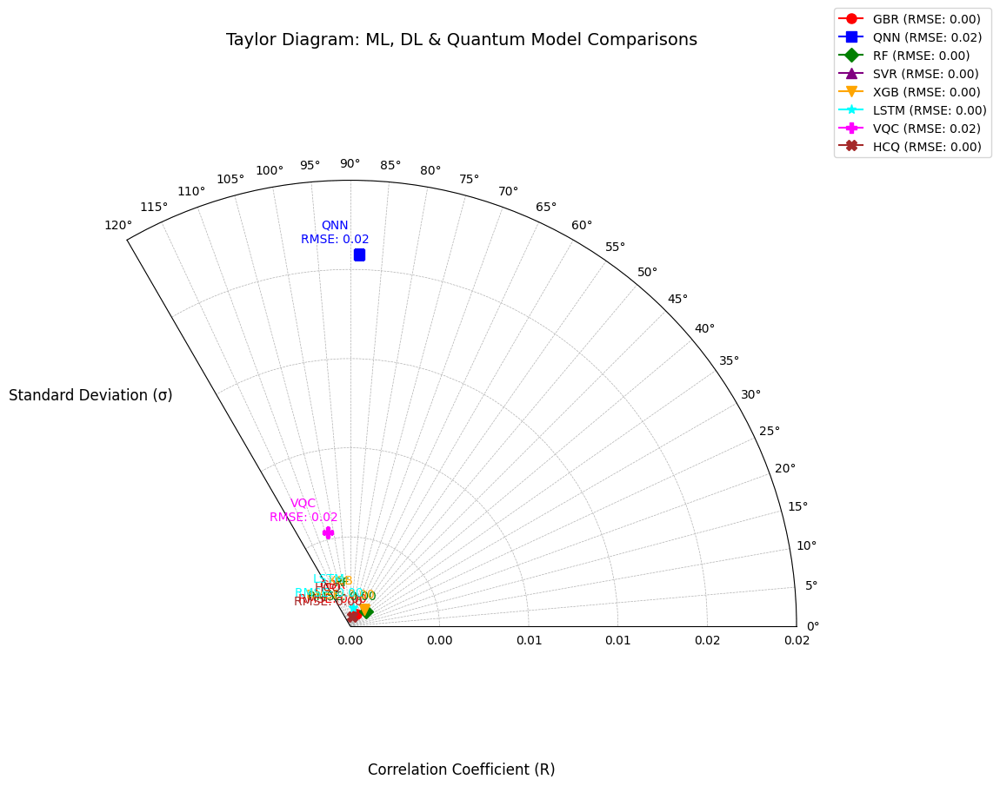

In [ ]:
stats = {}
for name, y_pred in models.items():
    y_pred = y_pred.ravel()
    corr, std_true, std_pred, rmse = compute_statistics(y_test, y_pred)
    stats[name] = {"theta": np.arccos(corr), "std": std_pred, "rmse": rmse}

fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, polar=True)

ax.set_thetamin(0)
ax.set_thetamax(120)
ax.set_xticks(np.radians(np.arange(0, 125, 5)))

max_std = max(std["std"] for std in stats.values()) * 1.2
ax.set_rlim(0, max_std)
ax.set_yticks(np.linspace(0, max_std, 6))

colors = {
    "GBR": 'r', "QNN": 'b', "RF": 'g', "SVR": 'purple',
    "XGB": 'orange', "LSTM": 'cyan', "VQC": 'magenta', "HCQ": 'brown'
}
markers = {"GBR": 'o', "QNN": 's', "RF": 'D', "SVR": '^', "XGB": 'v', "LSTM": '*', "VQC": 'P', "HCQ": 'X'}

for name, values in stats.items():
    ax.plot(values["theta"], values["std"], marker=markers[name], color=colors[name], markersize=8, label=f'{name} (RMSE: {values["rmse"]:.2f})')
    ax.annotate(f'{name}\nRMSE: {values["rmse"]:.2f}', (values["theta"], values["std"]), textcoords="offset points", xytext=(-20,10), ha='center', fontsize=10, color=colors[name])

ax.set_xlabel('Correlation Coefficient (R)', labelpad=20, fontsize=12)
ax.set_ylabel('Standard Deviation (σ)', labelpad=30, fontsize=12, rotation=0)

ax.set_yticklabels([f"{x:.2f}" for x in np.linspace(0, max_std, 6)], fontsize=10)
ax.set_rlabel_position(-22.5)

ax.set_title('Taylor Diagram: ML, DL & Quantum Model Comparisons', fontsize=14, pad=20)
ax.legend(loc='upper right', bbox_to_anchor=(1.3, 1.1))

plt.grid(True, linestyle="--", linewidth=0.5)
plt.show()

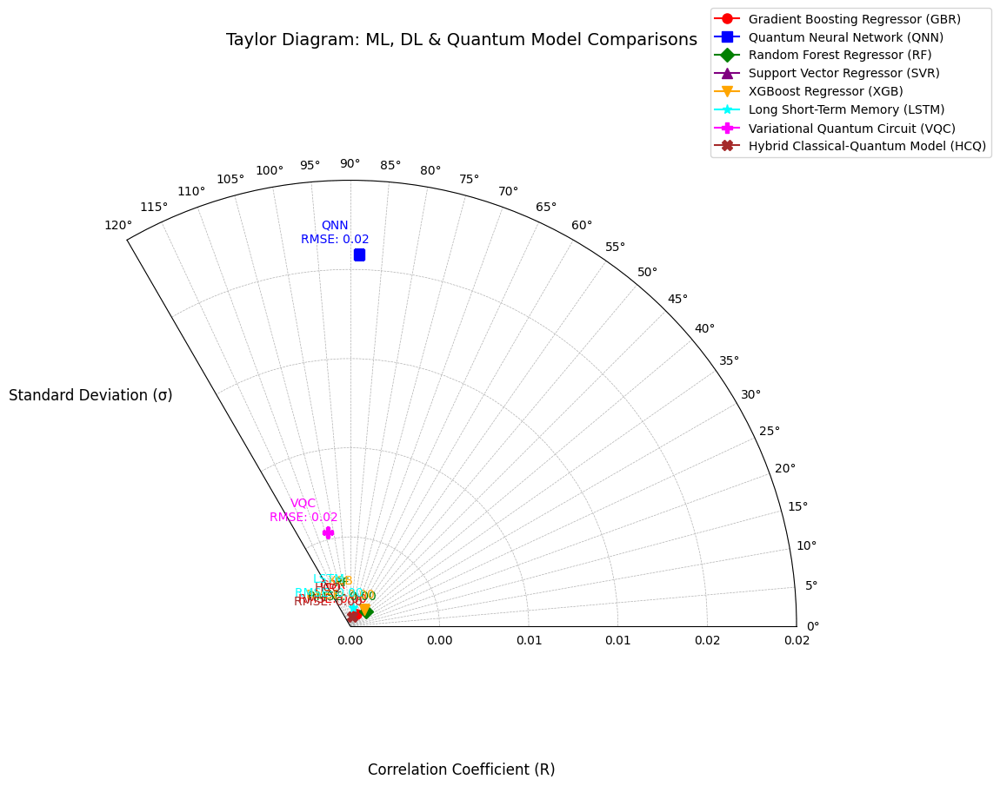

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

model_names = {
    "GBR": "Gradient Boosting Regressor (GBR)",
    "QNN": "Quantum Neural Network (QNN)",
    "RF": "Random Forest Regressor (RF)",
    "SVR": "Support Vector Regressor (SVR)",
    "XGB": "XGBoost Regressor (XGB)",
    "LSTM": "Long Short-Term Memory (LSTM)",
    "VQC": "Variational Quantum Circuit (VQC)",
    "HCQ": "Hybrid Classical-Quantum Model (HCQ)"
}

colors = {
    "GBR": 'r', "QNN": 'b', "RF": 'g', "SVR": 'purple',
    "XGB": 'orange', "LSTM": 'cyan', "VQC": 'magenta', "HCQ": 'brown'
}
markers = {
    "GBR": 'o', "QNN": 's', "RF": 'D', "SVR": '^',
    "XGB": 'v', "LSTM": '*', "VQC": 'P', "HCQ": 'X'
}

fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, polar=True)

ax.set_thetamin(0)
ax.set_thetamax(120)
ax.set_xticks(np.radians(np.arange(0, 125, 5)))

max_std = max(std["std"] for std in stats.values()) * 1.2
ax.set_rlim(0, max_std)
ax.set_yticks(np.linspace(0, max_std, 6))

for abbrev, values in stats.items():
    full_name = model_names[abbrev]
    ax.plot(values["theta"], values["std"], marker=markers[abbrev], color=colors[abbrev], markersize=8, label=f'{full_name}')
    ax.annotate(f'{abbrev}\nRMSE: {values["rmse"]:.2f}', (values["theta"], values["std"]), textcoords="offset points", xytext=(-20,10), ha='center', fontsize=10, color=colors[abbrev])

ax.set_xlabel('Correlation Coefficient (R)', labelpad=20, fontsize=12)
ax.set_ylabel('Standard Deviation (σ)', labelpad=30, fontsize=12, rotation=0)

ax.set_yticklabels([f"{x:.2f}" for x in np.linspace(0, max_std, 6)], fontsize=10)
ax.set_rlabel_position(-22.5)

ax.set_title('Taylor Diagram: ML, DL & Quantum Model Comparisons', fontsize=14, pad=20)
ax.legend(loc='upper right', bbox_to_anchor=(1.3, 1.1))

plt.grid(True, linestyle="--", linewidth=0.5)
plt.show()

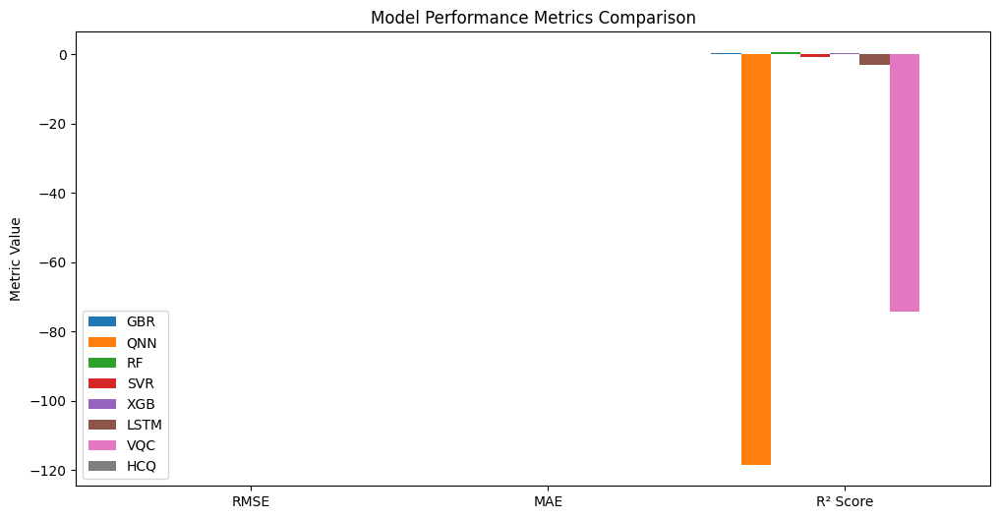

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np

def compute_metrics(y_test, y_pred):
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    return rmse, mae, r2

rmse_gbr, mae_gbr, r2_gbr = compute_metrics(y_test, y_pred_gbr)
rmse_qnn, mae_qnn, r2_qnn = compute_metrics(y_test, y_pred_qnn)
rmse_rf, mae_rf, r2_rf = compute_metrics(y_test, y_pred_rf)
rmse_svr, mae_svr, r2_svr = compute_metrics(y_test, y_pred_svr)
rmse_xgb, mae_xgb, r2_xgb = compute_metrics(y_test, y_pred_xgb)
rmse_lstm, mae_lstm, r2_lstm = compute_metrics(y_test, y_pred_lstm)
rmse_vqc, mae_vqc, r2_vqc = compute_metrics(y_test, y_pred_vqc)
rmse_hcq, mae_hcq, r2_hcq = compute_metrics(y_test, y_pred_hcq)

metrics = {
    "GBR": [rmse_gbr, mae_gbr, r2_gbr],
    "QNN": [rmse_qnn, mae_qnn, r2_qnn],
    "RF": [rmse_rf, mae_rf, r2_rf],
    "SVR": [rmse_svr, mae_svr, r2_svr],
    "XGB": [rmse_xgb, mae_xgb, r2_xgb],
    "LSTM": [rmse_lstm, mae_lstm, r2_lstm],
    "VQC": [rmse_vqc, mae_vqc, r2_vqc],
    "HCQ": [rmse_hcq, mae_hcq, r2_hcq]
}

labels = ["RMSE", "MAE", "R² Score"]
x = np.arange(len(labels))
width = 0.1

fig, ax = plt.subplots(figsize=(12, 6))
for i, (model, scores) in enumerate(metrics.items()):
    ax.bar(x + i * width, scores, width, label=model)

ax.set_xticks(x + width * (len(metrics) / 2))
ax.set_xticklabels(labels)
ax.set_ylabel("Metric Value")
ax.set_title("Model Performance Metrics Comparison")
ax.legend()
plt.show()

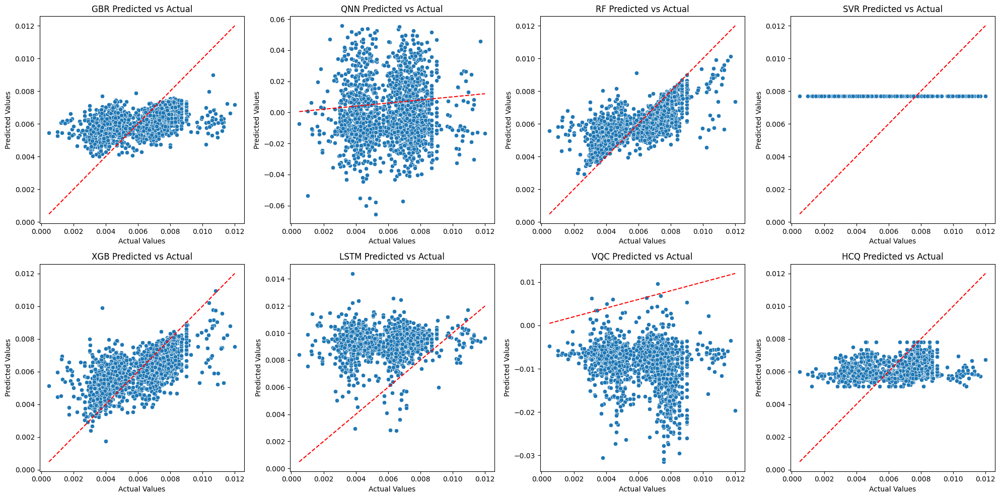

In [ ]:
fig, axes = plt.subplots(2, 4, figsize=(20, 10))
axes = axes.flatten()

for i, (model, y_pred) in enumerate(models.items()):
    y_pred = y_pred.ravel()
    ax = axes[i]

    sns.scatterplot(x=y_test, y=y_pred, ax=ax)
    ax.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], 'r--')
    ax.set_title(f"{model} Predicted vs Actual")
    ax.set_xlabel("Actual Values")
    ax.set_ylabel("Predicted Values")

plt.tight_layout()
plt.show()

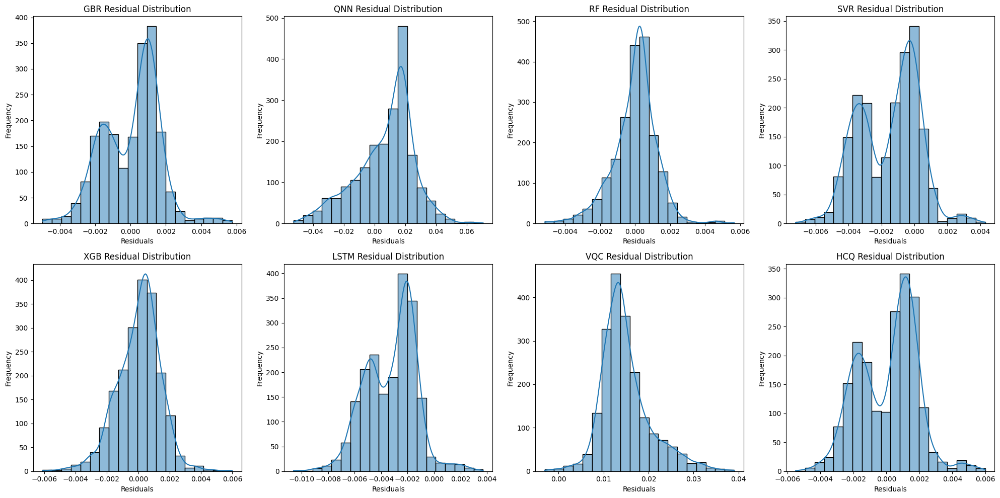

In [ ]:
fig, axes = plt.subplots(2, 4, figsize=(20, 10))
axes = axes.flatten()

for i, (model, y_pred) in enumerate(models.items()):
    y_pred = y_pred.ravel()
    residuals = y_test - y_pred

    ax = axes[i]
    sns.histplot(residuals, bins=20, kde=True, ax=ax)
    ax.set_title(f"{model} Residual Distribution")
    ax.set_xlabel("Residuals")
    ax.set_ylabel("Frequency")

plt.tight_layout()
plt.show()

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


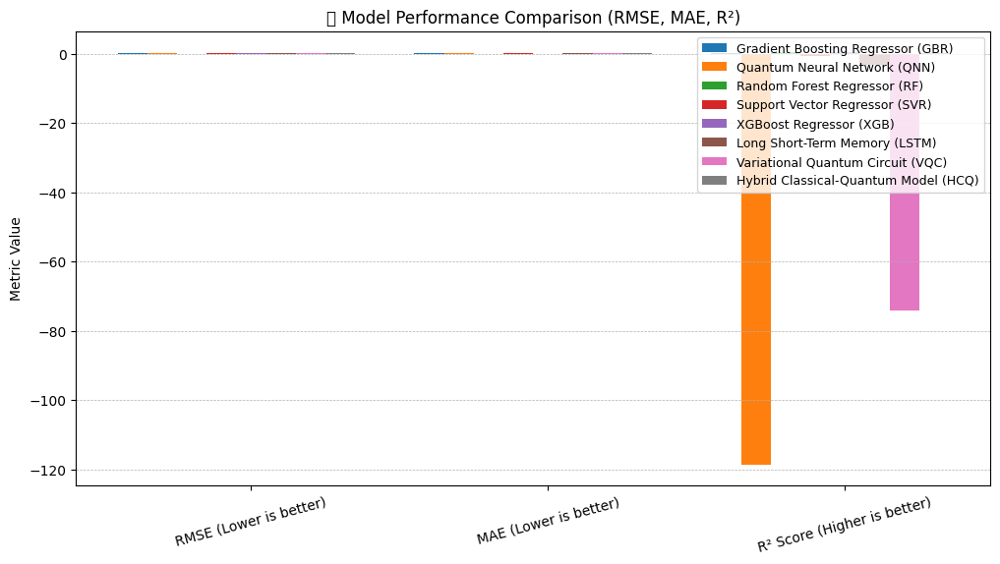

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

model_performance = {
    "Gradient Boosting Regressor (GBR)": [rmse_gbr, mae_gbr, r2_gbr],
    "Quantum Neural Network (QNN)": [rmse_qnn, mae_qnn, r2_qnn],
    "Random Forest Regressor (RF)": [rmse_rf, mae_rf, r2_rf],
    "Support Vector Regressor (SVR)": [rmse_svr, mae_svr, r2_svr],
    "XGBoost Regressor (XGB)": [rmse_xgb, mae_xgb, r2_xgb],
    "Long Short-Term Memory (LSTM)": [rmse_lstm, mae_lstm, r2_lstm],
    "Variational Quantum Circuit (VQC)": [rmse_vqc, mae_vqc, r2_vqc],
    "Hybrid Classical-Quantum Model (HCQ)": [rmse_hcq, mae_hcq, r2_hcq]
}

metrics = ["RMSE (Lower is better)", "MAE (Lower is better)", "R² Score (Higher is better)"]
x = np.arange(len(metrics))
width = 0.1

fig, ax = plt.subplots(figsize=(12, 6))

for i, (model, scores) in enumerate(model_performance.items()):
    ax.bar(x + i * width, scores, width, label=model)

ax.set_xticks(x + width * (len(model_performance) / 2))
ax.set_xticklabels(metrics)
ax.set_ylabel("Metric Value")
ax.set_title("Model Performance Comparison (RMSE, MAE, R²)")
ax.legend(loc="upper right", fontsize=9)

plt.xticks(rotation=15)
plt.grid(axis="y", linestyle="--", linewidth=0.5)
plt.show()

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


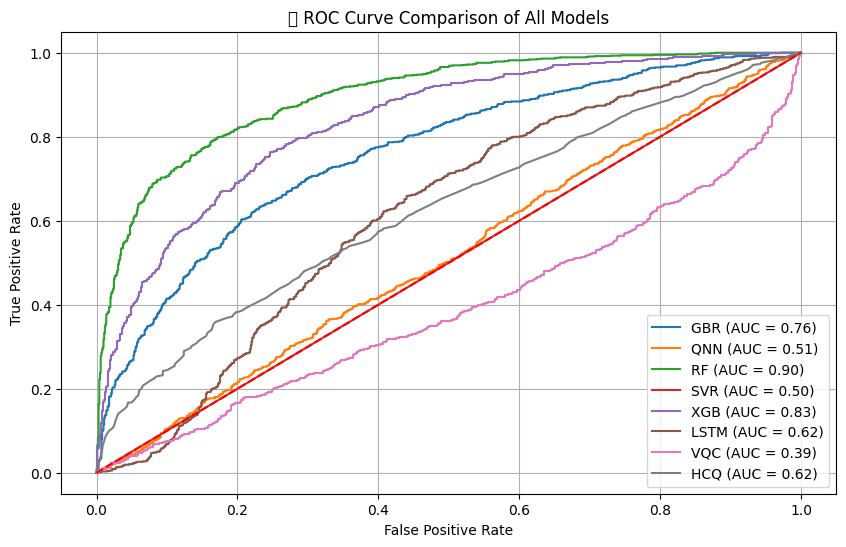

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

threshold = np.median(y_test)
y_true_class = (y_test > threshold).astype(int)

roc_auc_values = {}

plt.figure(figsize=(10, 6))

for model_name, y_pred in models.items():
    fpr, tpr, _ = roc_curve(y_true_class, y_pred)
    roc_auc = auc(fpr, tpr)
    roc_auc_values[model_name] = roc_auc

    plt.plot(fpr, tpr, label=f"{model_name} (AUC = {roc_auc:.2f})")

plt.plot([0, 1], [0, 1], 'r--')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve Comparison of All Models")
plt.legend()
plt.grid()
plt.show()

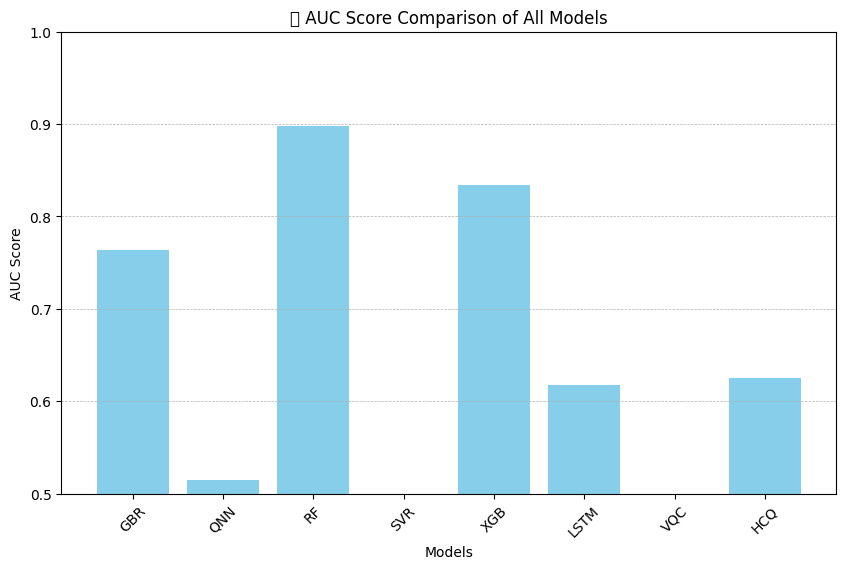

In [ ]:
plt.figure(figsize=(10, 6))
plt.bar(roc_auc_values.keys(), roc_auc_values.values(), color='skyblue')
plt.ylabel("AUC Score")
plt.xlabel("Models")
plt.title("AUC Score Comparison of All Models")
plt.ylim(0.5, 1.0)
plt.xticks(rotation=45)
plt.grid(axis="y", linestyle="--", linewidth=0.5)
plt.show()

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


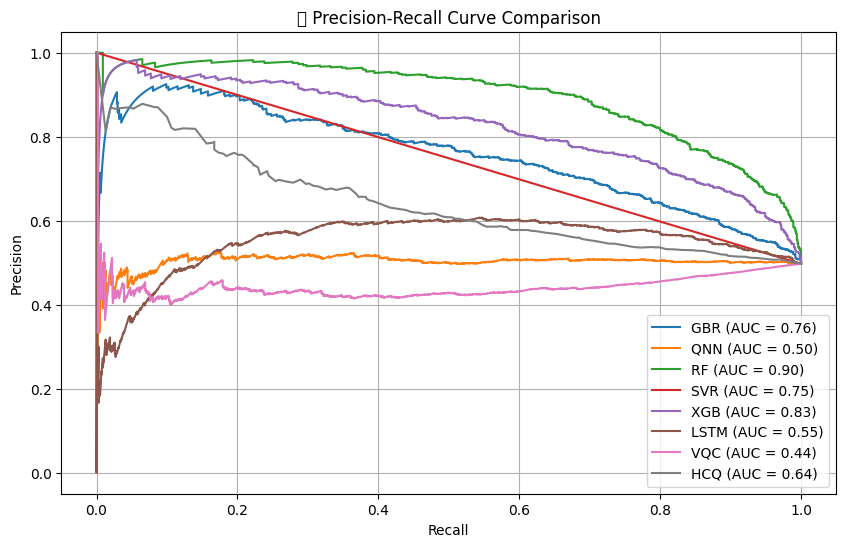

In [ ]:
from sklearn.metrics import precision_recall_curve, auc

plt.figure(figsize=(10, 6))

for model_name, y_pred in models.items():
    precision, recall, _ = precision_recall_curve(y_true_class, y_pred)
    pr_auc = auc(recall, precision)
    plt.plot(recall, precision, label=f"{model_name} (AUC = {pr_auc:.2f})")

plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("📊 Precision-Recall Curve Comparison")
plt.legend()
plt.grid()
plt.show()

In [ ]:
!pip install scikit-plot

In [ ]:
!pip install mljar-scikit-plot

  Preparing metadata (setup.py) ... done
  Created wheel for mljar-scikit-plot: filename=mljar_scikit_plot-0.3.12-py3-none-any.whl size=32014 sha256=90247620123906d5f0bc49edee6f0a5e79a782ed55956eafd2d614081375035c
  Stored in directory: /root/.cache/pip/wheels/e2/2d/3e/8afe0632e7b03c3ae7b8048f88f0dcca4355b32d31abaea3ba
Successfully built mljar-scikit-plot


<Figure size 1000x600 with 0 Axes>

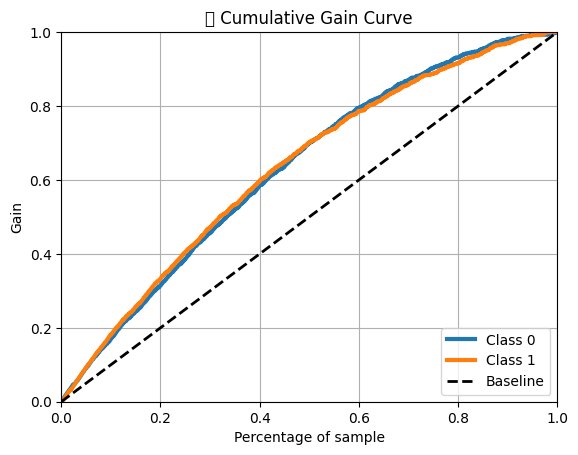

In [ ]:
from numpy import interp
from scipy.interpolate import interp1d
import scikitplot as skplt

plt.figure(figsize=(10, 6))
skplt.metrics.plot_cumulative_gain(y_true_class, np.column_stack([1 - y_pred_gbr, y_pred_gbr]), title="Cumulative Gain Curve")
plt.show()

In [ ]:
!pip install --upgrade scikit-learn scipy scikit-plot

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 37.6/37.6 MB 11.1 MB/s eta 0:00:00
  Attempting uninstall: scipy
    Found existing installation: scipy 1.14.1
    Uninstalling scipy-1.14.1:
      Successfully uninstalled scipy-1.14.1


<Figure size 1000x600 with 0 Axes>

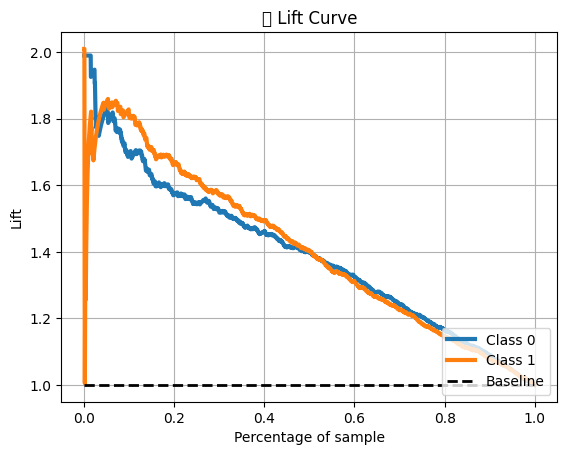

In [ ]:
plt.figure(figsize=(10, 6))
skplt.metrics.plot_lift_curve(y_true_class, np.column_stack([1 - y_pred_gbr, y_pred_gbr]), title="📊 Lift Curve")
plt.show()

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor
from sklearn.svm import SVR
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from sklearn.model_selection import train_test_split
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.decomposition import PCA

data = pd.read_csv('merged_with_features_optimized.csv')
target = 'Binding_Affinity'
features = ['Resolution', 'Binding_Data', 'R-factor', 'R-free', 'Delta-R', 'Molecular_Weight',
            'Binding_Value', 'Sequence_Length', 'Isoelectric_Point', 'Functional_Class',
            'Resolution1', 'R_factor1', 'R_free1', 'Molecular_Weight1', 'logP', 'H_Donors',
            'H_Acceptors', 'Ring_Count', 'Complex_Feature']
data = data.dropna(subset=[target])
X = data[features]
y = data[target]
X = pd.get_dummies(X, drop_first=True)
pipeline = make_pipeline(SimpleImputer(strategy='mean'), StandardScaler())
X = pipeline.fit_transform(X)
pca = PCA(n_components=10)
X = pca.fit_transform(X)
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

def compute_rmse(y_true, y_pred):
    return np.sqrt(mean_squared_error(y_true, y_pred))

models = {
    "GBR": GradientBoostingRegressor(n_estimators=100),
    "RF": RandomForestRegressor(n_estimators=100),
    "SVR": SVR(),
    "XGB": XGBRegressor(objective="reg:squarederror", n_estimators=100),
    "QNN": qnn_model,
    "VQC": vqc_model,
    "HCQ": hcq_model
}

trained_models = {}
learning_curves = {}

In [ ]:
!pip install qiskit

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.8/6.8 MB 40.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 119.4/119.4 kB 6.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.5/49.5 kB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.7/49.7 MB 12.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 109.0/109.0 kB 7.5 MB/s eta 0:00:00


In [ ]:
!pip install qiskit-aer

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.4/12.4 MB 63.3 MB/s eta 0:00:00


In [ ]:
!!pip install qiskit-machine-learning

['Collecting qiskit-machine-learning',
 '  Downloading qiskit_machine_learning-0.8.2-py3-none-any.whl.metadata (13 kB)',
 'Requirement already satisfied: qiskit>=1.0 in /usr/local/lib/python3.11/dist-packages (from qiskit-machine-learning) (1.4.2)',
 'Requirement already satisfied: scipy>=1.4 in /usr/local/lib/python3.11/dist-packages (from qiskit-machine-learning) (1.15.2)',
 'Requirement already satisfied: numpy>=1.17 in /usr/local/lib/python3.11/dist-packages (from qiskit-machine-learning) (2.0.2)',
 'Requirement already satisfied: psutil>=5 in /usr/local/lib/python3.11/dist-packages (from qiskit-machine-learning) (5.9.5)',
 'Requirement already satisfied: scikit-learn>=1.2 in /usr/local/lib/python3.11/dist-packages (from qiskit-machine-learning) (1.6.1)',
 'Requirement already satisfied: setuptools>=40.1 in /usr/local/lib/python3.11/dist-packages (from qiskit-machine-learning) (75.1.0)',
 'Requirement already satisfied: dill>=0.3.4 in /usr/local/lib/python3.11/dist-packages (from q

In [ ]:
from qiskit_aer import Aer
from qiskit.circuit.library import TwoLocal
from qiskit_machine_learning.neural_networks import EstimatorQNN
from qiskit_machine_learning.algorithms import NeuralNetworkClassifier
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.datasets import make_classification
from sklearn.preprocessing import MinMaxScaler

data = pd.read_csv('merged_with_features_optimized.csv')
target = 'Binding_Affinity'
features = ['Resolution', 'Binding_Data', 'R-factor', 'R-free', 'Delta-R', 'Molecular_Weight',
            'Binding_Value', 'Sequence_Length', 'Isoelectric_Point', 'Functional_Class',
            'Resolution1', 'R_factor1', 'R_free1', 'Molecular_Weight1', 'logP', 'H_Donors',
            'H_Acceptors', 'Ring_Count', 'Complex_Feature']

data = data.dropna(subset=[target])
X = data[features]
y = data[target]
X = pd.get_dummies(X, drop_first=True)
pipeline = make_pipeline(SimpleImputer(strategy='mean'), StandardScaler())
X = pipeline.fit_transform(X)
pca = PCA(n_components=10)
X = pca.fit_transform(X)
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

/usr/local/lib/python3.11/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['Molecular_Weight1' 'logP' 'H_Donors' 'H_Acceptors' 'Ring_Count'
 'Complex_Feature']. At least one non-missing value is needed for imputation with strategy='mean'.
  warnings.warn(


In [ ]:
y_train = y_train.to_numpy()
y_val = y_val.to_numpy()
y = data[target]
y_train = np.array(y_train)
y_val = np.array(y_val)

In [ ]:
backend = Aer.get_backend('statevector_simulator')
var_circuit = TwoLocal(rotation_blocks='ry', entanglement_blocks='cz', reps=3)

from qiskit.primitives import Estimator

estimator = Estimator()
qnn = EstimatorQNN(circuit=var_circuit, estimator=estimator)
vqc = NeuralNetworkClassifier(qnn)
y = (data[target] > threshold).astype(int)
vqc.fit(X_train, y_train)
vqc_preds = vqc.predict(X_val)
vqc_accuracy = np.mean(vqc_preds == y_val)
print(f'VQC Model Accuracy: {vqc_accuracy:.4f}')

svc_model = SVC(kernel='linear')
svc_model.fit(X_train, y_train)
svc_preds = svc_model.predict(X_val)
svc_accuracy = np.mean(svc_preds == y_val)
print(f'Classical SVC Model Accuracy: {svc_accuracy:.4f}')

def hybrid_classifier(X):
    qnn_preds = vqc.predict(X)
    svc_preds = svc_model.predict(X)
    return (qnn_preds + svc_preds) / 2

hybrid_preds = hybrid_classifier(X_val)

hybrid_accuracy = np.mean(hybrid_preds == y_val)
print(f'Hybrid Classical-Quantum Classifier Accuracy: {hybrid_accuracy:.4f}')

final_preds = hybrid_classifier(X_test)
final_accuracy = np.mean(final_preds == y_test)
print(f'Final Test Accuracy of Hybrid Classifier: {final_accuracy:.4f}')

In [ ]:
for name, model in models.items():
    print(f"Training {name}...")

    if name in ["QNN", "VQC", "HCQ"]:
        try:
            X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
            X_val_tensor = torch.tensor(X_val, dtype=torch.float32)
            X_test_tensor = torch.tensor(X_test, dtype=torch.float32)

            if hasattr(model, "fit"):
                model.fit(X_train_tensor, y_train)
            elif hasattr(model, "train"):
                model.train(X_train_tensor, y_train)
            else:
                raise AttributeError(f"{name} model does not support .fit() or .train()")

        except Exception as e:
            print(f"Error training {name}: {e}")
    else:
        model.fit(X_train, y_train)

    trained_models[name] = model

    if name in ["QNN", "VQC", "HCQ"]:
        if hasattr(model, "forward"):
            train_preds = model.forward(X_train_tensor).detach().numpy()
            val_preds = model.forward(X_val_tensor).detach().numpy()
            test_preds = model.forward(X_test_tensor).detach().numpy()
        else:
            raise AttributeError(f"{name} model does not support .predict() or .forward()")
    else:
        train_preds = model.predict(X_train)
        val_preds = model.predict(X_val)
        test_preds = model.predict(X_test)

    train_rmse = compute_rmse(y_train, train_preds)
    val_rmse = compute_rmse(y_val, val_preds)
    test_rmse = compute_rmse(y_test, test_preds)

    learning_curves[name] = {"train_rmse": train_rmse, "val_rmse": val_rmse, "test_rmse": test_rmse}

X_train_lstm = np.expand_dims(X_train, axis=1)
X_val_lstm = np.expand_dims(X_val, axis=1)
X_test_lstm = np.expand_dims(X_test, axis=1)

lstm_model = Sequential([
    LSTM(50, activation='relu', input_shape=(1, X_train.shape[1])),
    Dense(1)
])
lstm_model.compile(optimizer='adam', loss='mse')

train_errors_lstm = []
val_errors_lstm = []
test_errors_lstm = []
num_epochs = 10

for epoch in range(num_epochs):
    lstm_model.fit(X_train_lstm, y_train, epochs=1, verbose=0, batch_size=32)

    train_preds = lstm_model.predict(X_train_lstm)
    val_preds = lstm_model.predict(X_val_lstm)
    test_preds = lstm_model.predict(X_test_lstm)

    train_errors_lstm.append(compute_rmse(y_train, train_preds))
    val_errors_lstm.append(compute_rmse(y_val, val_preds))
    test_errors_lstm.append(compute_rmse(y_test, test_preds))

trained_models["LSTM"] = lstm_model
learning_curves["LSTM"] = {
    "train_rmse": train_errors_lstm,
    "val_rmse": val_errors_lstm,
    "test_rmse": test_errors_lstm
}

plt.figure(figsize=(12, 6))

for model, errors in learning_curves.items():
    if model == "LSTM":
        plt.plot(range(1, len(errors["train_rmse"]) + 1), errors["train_rmse"], label=f"{model} (Train)", linestyle='-', linewidth=2)
        plt.plot(range(1, len(errors["val_rmse"]) + 1), errors["val_rmse"], label=f"{model} (Validation)", linestyle='--', linewidth=2)
        plt.plot(range(1, len(errors["test_rmse"]) + 1), errors["test_rmse"], label=f"{model} (Test)", linestyle='-.', linewidth=2)
    else:
        plt.scatter(model, errors["train_rmse"], color='blue', label="Train RMSE" if model == "GBR" else "", marker='o')
        plt.scatter(model, errors["val_rmse"], color='red', label="Validation RMSE" if model == "GBR" else "", marker='s')
        plt.scatter(model, errors["test_rmse"], color='green', label="Test RMSE" if model == "GBR" else "", marker='D')

plt.xlabel("Models")
plt.ylabel("RMSE")
plt.title("Learning Curves: Training, Validation & Test RMSE")
plt.legend()
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

In [ ]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

df = pd.read_csv('merged_with_features_optimized.csv')
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27323 entries, 0 to 27322
Data columns (total 30 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   PDB_Code               27323 non-null  object 
 1   Release_Year_merged    24761 non-null  float64
 2   Release_Year           27323 non-null  float64
 3   Uniprot_ID             24271 non-null  object 
 4   Protein_Name           24271 non-null  object 
 5   Resolution             27323 non-null  object 
 6   Binding_Data           27323 non-null  object 
 7   Reference_ligand       24761 non-null  object 
 8   Reference              27323 non-null  object 
 9   Ligand_Name            24761 non-null  object 
 10  R-factor               24761 non-null  float64
 11  R-free                 24761 non-null  float64
 12  Delta-R                24761 non-null  float64
 13  SMILES                 24761 non-null  object 
 14  Molecular_Weight       24761 non-null  object 
 15  Bi

In [ ]:
import pandas as pd #run
import re

def convert_to_um(value):
    if 'uM' in value:
        return float(value.replace('uM', ''))
    elif 'mM' in value:
        return float(value.replace('mM', '')) * 1000
    elif 'nM' in value:
        return float(value.replace('nM', '')) / 1000
    elif 'pM' in value:
        return float(value.replace('pM', '')) / 1000000
    else:
        return None

def clean_value(value):
    value = re.sub(r'[~><=]', '', value)
    return value

df = pd.read_csv('merged_with_features_optimized.csv')
def process_binding_data(binding_data):
    binding_values = re.findall(r'(\w+)([\d\.]+[a-zA-Z]+)', binding_data)

    processed_values = []
    for binding_type, value in binding_values:
        value = clean_value(value)
        if value:
            processed_value = convert_to_um(value)
            if processed_value is not None:
                processed_values.append(processed_value)

    return processed_values
df['Processed_Binding_Data(um)'] = df['Binding_Data'].apply(lambda x: process_binding_data(str(x)))
df['Processed_Binding_Data(um)'] = df['Processed_Binding_Data(um)'].apply(lambda x: ', '.join([str(v) for v in x]))
df.to_csv('cleaned_merged_with_features_optimized.csv', index=False)
print(df.head())

  PDB_Code  Release_Year_merged  Release_Year Uniprot_ID  \
0     10GS               1998.0        1998.0     P09211   
1     10GS               1998.0        1998.0     P09211   
2     11GS               1999.0        1999.0     P09211   
3     13GS               1999.0        1999.0     P09211   
4     16PK               1998.0        1998.0     P07378   

                     Protein_Name Resolution Binding_Data  \
0  GLUTATHIONE S-TRANSFERASE P1-1        2.2     Ki=0.4uM   
1  GLUTATHIONE S-TRANSFERASE P1-1        2.2     Ki=0.4uM   
2       GLUTATHIONE S-TRANSFERASE       2.30     Ki=1.5uM   
3       GLUTATHIONE S-TRANSFERASE       1.90      Ki=24uM   
4       3-PHOSPHOGLYCERATE KINASE       1.60       Ki=6uM   

                                    Reference_ligand  \
0                                         .pdf (VWW)   
1                                         .pdf (VWW)   
2                     .pdf (2-mer) redundant to 3gss   
3                                         .pdf (

In [ ]:
df = pd.read_csv('cleaned_merged_with_features_optimized.csv')
df.columns

Index(['PDB_Code', 'Release_Year_merged', 'Release_Year', 'Uniprot_ID',
       'Protein_Name', 'Resolution', 'Binding_Data', 'Reference_ligand',
       'Reference', 'Ligand_Name', 'R-factor', 'R-free', 'Delta-R', 'SMILES',
       'Molecular_Weight', 'Binding_Affinity', 'Binding_Value',
       'Binding_Affinity_Type', 'Sequence_Length', 'Isoelectric_Point',
       'Functional_Class', 'Resolution1', 'R_factor1', 'R_free1',
       'Molecular_Weight1', 'logP', 'H_Donors', 'H_Acceptors', 'Ring_Count',
       'Complex_Feature', 'Processed_Binding_Data(um)'],
      dtype='object')

In [ ]:
selected_columns = [
    'Release_Year','Resolution','Reference', 'Binding_Affinity_Type',
    'Processed_Binding_Data(um)', 'Sequence_Length', 'Isoelectric_Point',
    'Binding_Affinity', 'Binding_Value', 'R-factor', 'R-free'
]

df_cleaned = df[selected_columns].dropna()
print(df_cleaned.head())

   Release_Year Resolution                         Reference  \
3        1999.0       1.90                        .pdf (SAS)   
5        1995.0        1.8  .pdf (I4B) ligand is compound 39   
6        1995.0        1.8  .pdf (I4B) ligand is compound 39   
7        1995.0        1.8  .pdf (IND) ligand is compound 15   
8        1995.0        1.8  .pdf (IND) ligand is compound 15   

  Binding_Affinity_Type  Processed_Binding_Data(um)  Sequence_Length  \
3                    Ki                         4.0              6.0   
5                    Kd                         9.0              6.0   
6                    Kd                         9.0              6.0   
7                    Kd                         0.0              6.0   
8                    Kd                         0.0              6.0   

   Isoelectric_Point  Binding_Affinity Binding_Value  R-factor  R-free  
3                7.4           0.00462          24uM     0.193   0.222  
5                7.4           0.004

In [ ]:
import pandas as pd
from sklearn.preprocessing import StandardScaler

print("Non-numeric columns in the DataFrame:")
print(df_cleaned.select_dtypes(include=['object']).head())
print("\nMissing values in the DataFrame:")
print(df_cleaned.isnull().sum())
df_cleaned = df_cleaned.dropna()
df_numeric = df_cleaned.select_dtypes(include=['float64', 'int64'])
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_numeric)
df_scaled = pd.DataFrame(df_scaled, columns=df_numeric.columns)
print("\nPreview of the scaled data:")
print(df_scaled.head())

Non-numeric columns in the DataFrame:
  Resolution                         Reference Binding_Affinity_Type  \
3       1.90                        .pdf (SAS)                    Ki   
5        1.8  .pdf (I4B) ligand is compound 39                    Kd   
6        1.8  .pdf (I4B) ligand is compound 39                    Kd   
7        1.8  .pdf (IND) ligand is compound 15                    Kd   
8        1.8  .pdf (IND) ligand is compound 15                    Kd   

  Binding_Value  
3          24uM  
5          19uM  
6          19uM  
7         290uM  
8         290uM  

Missing values in the DataFrame:
Release_Year                  0
Resolution                    0
Reference                     0
Binding_Affinity_Type         0
Processed_Binding_Data(um)    0
Sequence_Length               0
Isoelectric_Point             0
Binding_Affinity              0
Binding_Value                 0
R-factor                      0
R-free                        0
dtype: int64

Preview of the scaled

In [ ]:
kmeans = KMeans(n_clusters=10, random_state=42)
df_scaled['Cluster'] = kmeans.fit_predict(df_scaled)
print(df_scaled.head())

   Release_Year  Processed_Binding_Data(um)  Sequence_Length  \
0     -2.000933                   -0.054113              0.0   
1     -2.662928                   -0.041450              0.0   
2     -2.662928                   -0.041450              0.0   
3     -2.662928                   -0.064244              0.0   
4     -2.662928                   -0.064244              0.0   

   Isoelectric_Point  Binding_Affinity  R-factor    R-free  Cluster  
0      -1.776357e-15         -0.748760  0.136219  0.202159        6  
1      -1.776357e-15         -0.690878 -0.066312 -4.203339        4  
2      -1.776357e-15         -0.690878 -0.066312 -4.203339        4  
3      -1.776357e-15         -1.373879 -0.020579 -4.203339        4  
4      -1.776357e-15         -1.373879 -0.020579 -4.203339        4  


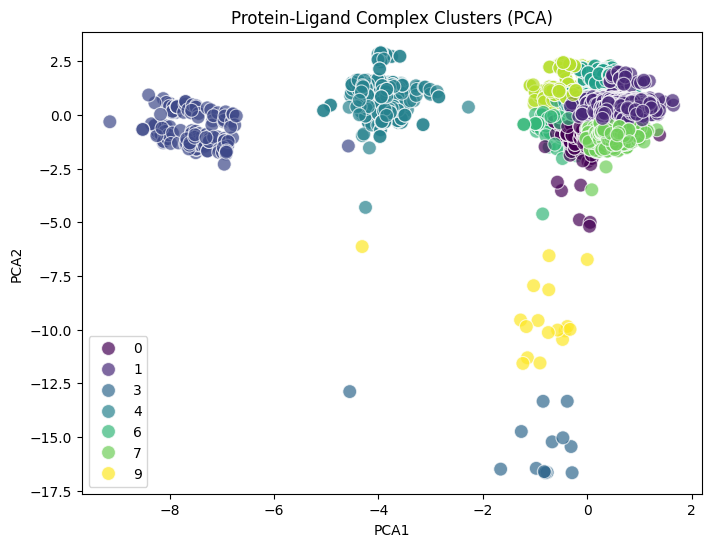

In [ ]:
pca = PCA(n_components=2)
df_pca = pca.fit_transform(df_scaled.drop('Cluster', axis=1))
df_pca = pd.DataFrame(df_pca, columns=['PCA1', 'PCA2'])
df_pca['Cluster'] = df_scaled['Cluster']

plt.figure(figsize=(8, 6))
sns.scatterplot(data=df_pca, x='PCA1', y='PCA2', hue='Cluster', palette='viridis', s=100, alpha=0.7)
plt.title('Protein-Ligand Complex Clusters (PCA)')
plt.xlabel('PCA1')
plt.ylabel('PCA2')
plt.legend()
plt.show()

In [ ]:
centroids = kmeans.cluster_centers_
print(f"Centroids shape: {centroids.shape}")

if len(selected_columns) == centroids.shape[1]:
    centroids_df = pd.DataFrame(centroids, columns=selected_columns)
else:
    print("Warning: The number of selected_columns does not match the number of features in the centroids.")
    selected_columns = [f'feature_{i+1}' for i in range(centroids.shape[1])]
    centroids_df = pd.DataFrame(centroids, columns=selected_columns)

print(centroids_df)

Centroids shape: (10, 7)
   feature_1  feature_2  feature_3     feature_4  feature_5  feature_6  \
0  -0.116837  -0.036912        0.0 -1.776357e-15  -1.078024   0.118208   
1   0.828703  -0.064236        0.0 -1.776357e-15   0.681313   0.110178   
2  -0.468537  -0.059383        0.0 -1.776357e-15  -0.463769  -7.657960   
3  -0.409599  20.781809        0.0 -1.776357e-15  -2.563565   0.087973   
4  -2.431556  -0.045345        0.0 -1.776357e-15   0.169309   0.037038   
5  -0.267856  -0.064236        0.0 -1.776357e-15   0.806381   0.163724   
6  -1.267159  -0.049234        0.0 -1.776357e-15  -0.942809   0.164940   
7   0.904954  -0.054527        0.0 -1.776357e-15  -1.056163   0.085509   
8  -1.538649  -0.064238        0.0 -1.776357e-15   0.857329   0.191680   
9  -1.027411  11.854335        0.0 -1.776357e-15  -2.521293   0.079341   

   feature_7  
0   0.230381  
1   0.213941  
2  -4.170999  
3  -0.125910  
4  -4.203339  
5   0.259861  
6   0.269371  
7   0.197432  
8   0.292954  
9  -0.0451

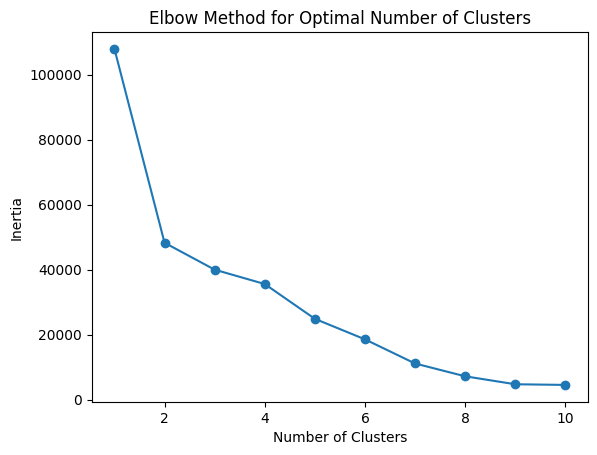

In [ ]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

inertia = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(df_scaled)
    inertia.append(kmeans.inertia_)

plt.plot(range(1, 11), inertia, marker='o')
plt.title('Elbow Method for Optimal Number of Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.show()

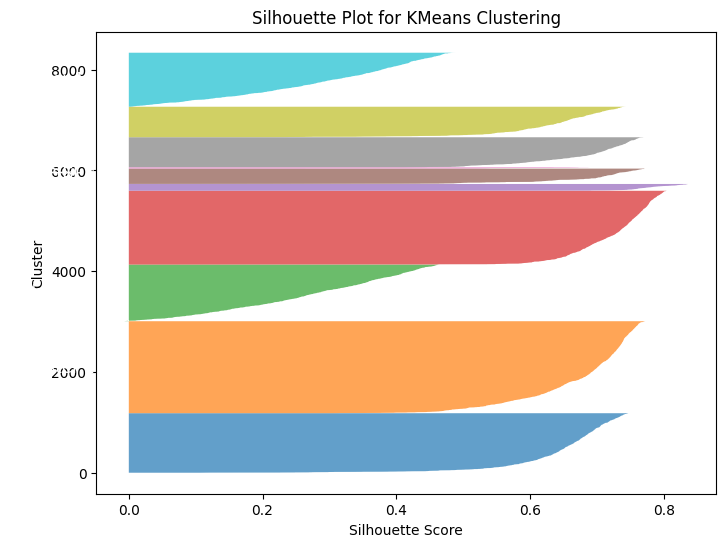

Average silhouette score: 0.57


In [ ]:
from sklearn.metrics import silhouette_samples, silhouette_score
import numpy as np
import matplotlib.cm as cm

silhouette_vals = silhouette_samples(df_scaled, kmeans.labels_)
fig, ax = plt.subplots(figsize=(8, 6))
y_lower, y_upper = 0, 0

for i in range(kmeans.n_clusters):
    cluster_silhouette_vals = silhouette_vals[kmeans.labels_ == i]
    cluster_silhouette_vals.sort()

    y_upper += len(cluster_silhouette_vals)
    ax.fill_betweenx(np.arange(y_lower, y_upper), 0, cluster_silhouette_vals, alpha=0.7)
    ax.text(-0.05, (y_lower + y_upper) / 2, f'Cluster {i+1}', va='center', ha='right', fontsize=12, color='white')

    y_lower += len(cluster_silhouette_vals)

ax.set_title('Silhouette Plot for KMeans Clustering')
ax.set_xlabel('Silhouette Score')
ax.set_ylabel('Cluster')
plt.show()

print(f'Average silhouette score: {silhouette_score(df_scaled, kmeans.labels_):.2f}')

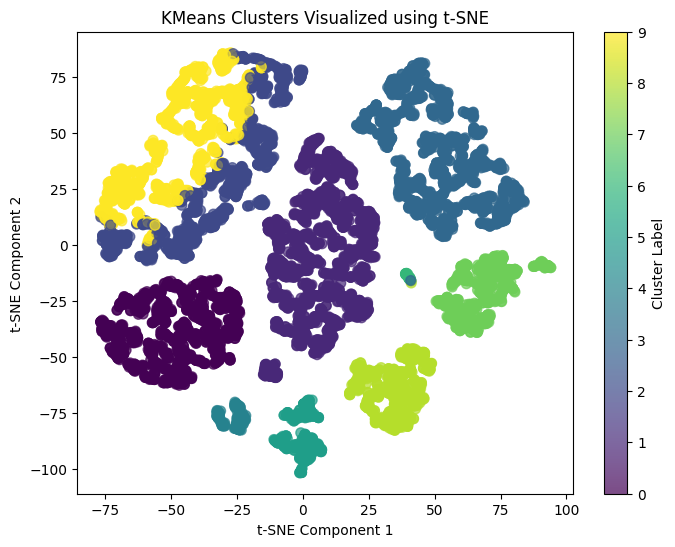

In [ ]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, random_state=42)
tsne_result = tsne.fit_transform(df_scaled)

plt.figure(figsize=(8, 6))
plt.scatter(tsne_result[:, 0], tsne_result[:, 1], c=kmeans.labels_, cmap='viridis', s=50, alpha=0.7)
plt.title('KMeans Clusters Visualized using t-SNE')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.colorbar(label='Cluster Label')
plt.show()

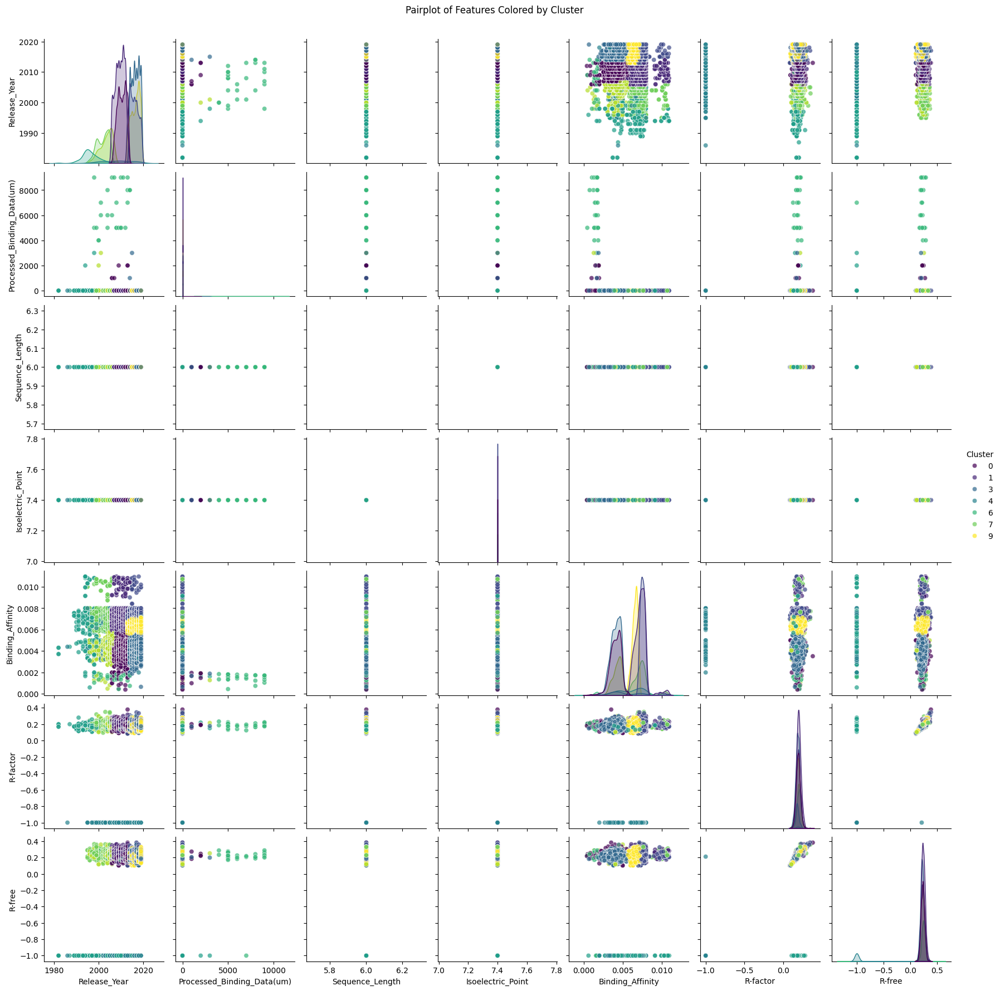

In [ ]:
import seaborn as sns

df_cleaned['Cluster'] = kmeans.labels_
sns.pairplot(df_cleaned, hue='Cluster', palette='viridis', markers='o', diag_kind='kde', plot_kws={'alpha': 0.7})
plt.suptitle('Pairplot of Features Colored by Cluster', y=1.02)
plt.show()

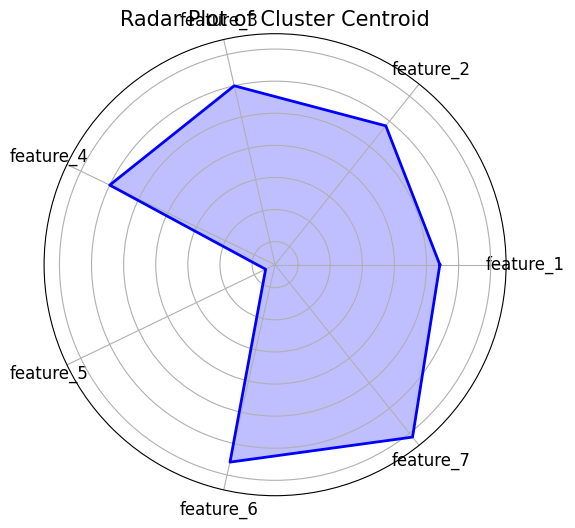

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def radar_plot(centroid, feature_names):
    num_vars = len(feature_names)

    angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()

    centroid = np.concatenate((centroid, [centroid[0]]))
    angles += angles[:1]

    fig, ax = plt.subplots(figsize=(6, 6), subplot_kw=dict(polar=True))
    ax.fill(angles, centroid, color='blue', alpha=0.25)
    ax.plot(angles, centroid, color='blue', linewidth=2)
    ax.set_yticklabels([])
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(feature_names, fontsize=12)
    plt.title('Radar Plot of Cluster Centroid', size=15)
    plt.show()

radar_plot(centroids[0], selected_columns)

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import classification_report, accuracy_score
from sklearn.preprocessing import StandardScaler

affinity_threshold = df_cleaned['Binding_Affinity'].median()
df_cleaned['Affinity_Class'] = (df_cleaned['Binding_Affinity'] > affinity_threshold).astype(int)
X = df_scaled.drop('Cluster', axis=1)
X['PCA1'] = df_pca['PCA1']
X['PCA2'] = df_pca['PCA2']
y = df_cleaned['Affinity_Class']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

clf = SVC(kernel='rbf', random_state=42)
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
print(f"Accuracy: {accuracy_score(y_test, y_pred)}")
print("Classification Report:")
print(classification_report(y_test, y_pred))

Accuracy: 0.995603517186251
Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.99      1.00      1239
           1       0.99      1.00      1.00      1263

    accuracy                           1.00      2502
   macro avg       1.00      1.00      1.00      2502
weighted avg       1.00      1.00      1.00      2502




Random Forest - Adjusted Threshold = 0.4
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1253
           1       1.00      1.00      1.00      1249

    accuracy                           1.00      2502
   macro avg       1.00      1.00      1.00      2502
weighted avg       1.00      1.00      1.00      2502


Logistic Regression - Adjusted Threshold = 0.4
              precision    recall  f1-score   support

           0       1.00      0.93      0.97      1253
           1       0.94      1.00      0.97      1249

    accuracy                           0.97      2502
   macro avg       0.97      0.97      0.97      2502
weighted avg       0.97      0.97      0.97      2502


SVM - Adjusted Threshold = 0.4
              precision    recall  f1-score   support

           0       1.00      0.99      1.00      1253
           1       0.99      1.00      1.00      1249

    accuracy                           1.00      2502
   mac

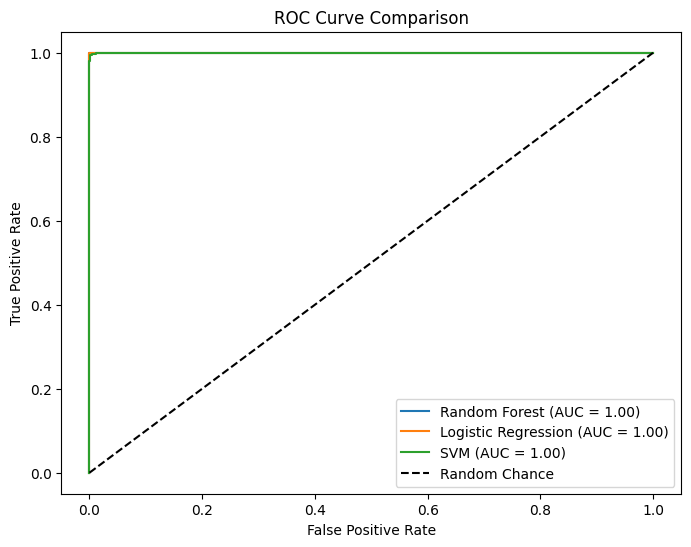

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.metrics import classification_report, roc_curve, auc
from sklearn.preprocessing import StandardScaler

affinity_threshold = df_cleaned['Binding_Affinity'].median()
df_cleaned['Affinity_Class'] = (df_cleaned['Binding_Affinity'] > affinity_threshold).astype(int)
X = df_scaled.drop('Cluster', axis=1)
X['PCA1'] = df_pca['PCA1']
X['PCA2'] = df_pca['PCA2']
y = df_cleaned['Affinity_Class']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, stratify=y, random_state=42)

models = {
    "Random Forest": RandomForestClassifier(n_estimators=50, max_depth=5, random_state=42),
    "Logistic Regression": LogisticRegression(C=0.1, max_iter=1000, random_state=42),
    "SVM": SVC(kernel='rbf', C=0.1, probability=True, random_state=42)
}

plt.figure(figsize=(8, 6))

for name, model in models.items():
    model.fit(X_train, y_train)

    y_scores = model.predict_proba(X_test)[:, 1]

    threshold = 0.4
    y_pred_adjusted = (y_scores > threshold).astype(int)

    print(f"\n{name} - Adjusted Threshold = {threshold}")
    print(classification_report(y_test, y_pred_adjusted))

    fpr, tpr, _ = roc_curve(y_test, y_scores)
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f"{name} (AUC = {roc_auc:.2f})")

plt.plot([0, 1], [0, 1], 'k--', label="Random Chance")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve Comparison")
plt.legend()
plt.show()

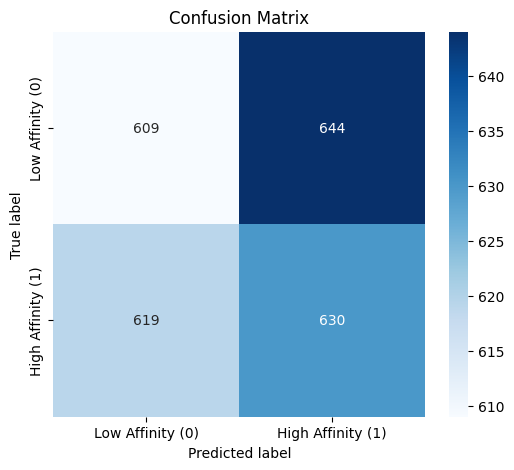

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Low Affinity (0)', 'High Affinity (1)'],
            yticklabels=['Low Affinity (0)', 'High Affinity (1)'])
plt.title('Confusion Matrix')
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()

<Figure size 1000x600 with 0 Axes>

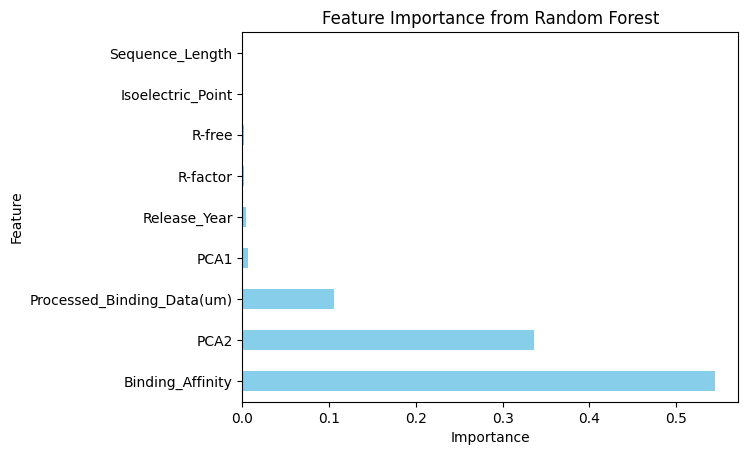

In [ ]:
plt.figure(figsize=(10, 6))
feature_importances_df.plot(kind='barh', x='Feature', y='Importance', legend=False, color='skyblue')
plt.title('Feature Importance from Random Forest')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

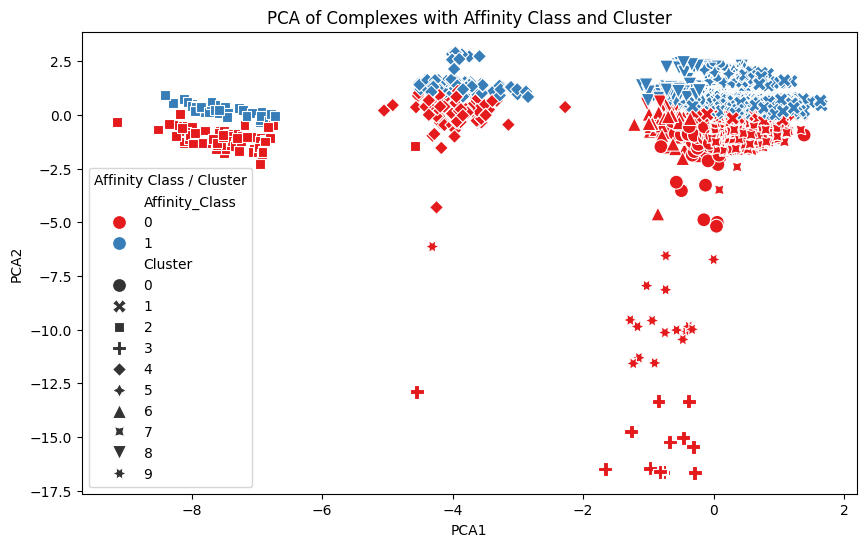

In [ ]:
df_pca['Affinity_Class'] = df_cleaned['Affinity_Class'].values
df_pca['Cluster'] = df_scaled['Cluster'].values
plt.figure(figsize=(10, 6))

sns.scatterplot(x='PCA1', y='PCA2', hue='Affinity_Class', style='Cluster', data=df_pca, palette='Set1', s=100)
plt.title('PCA of Complexes with Affinity Class and Cluster')
plt.xlabel('PCA1')
plt.ylabel('PCA2')
plt.legend(title='Affinity Class / Cluster')
plt.show()

In [ ]:
df_cleaned.columns

Index(['Release_Year', 'Resolution', 'Reference', 'Binding_Affinity_Type',
       'Processed_Binding_Data(um)', 'Sequence_Length', 'Isoelectric_Point',
       'Binding_Affinity', 'Binding_Value', 'R-factor', 'R-free', 'Cluster',
       'Affinity_Class'],
      dtype='object')

In [ ]:
df_cleaned.head()

,Release_Year,Resolution,Reference,Binding_Affinity_Type,Processed_Binding_Data(um),Sequence_Length,Isoelectric_Point,Binding_Affinity,Binding_Value,R-factor,R-free,Cluster,Affinity_Class
3,1999.0,1.90,.pdf (SAS),Ki,4.0,6.0,7.4,0.00462,24uM,0.193,0.222,8,0
5,1995.0,1.8,.pdf (I4B) ligand is compound 39,Kd,9.0,6.0,7.4,0.00472,19uM,0.162,-1.000,5,0
6,1995.0,1.8,.pdf (I4B) ligand is compound 39,Kd,9.0,6.0,7.4,0.00472,19uM,0.162,-1.000,5,0
7,1995.0,1.8,.pdf (IND) ligand is compound 15,Kd,0.0,6.0,7.4,0.00354,290uM,0.169,-1.000,5,0
8,1995.0,1.8,.pdf (IND) ligand is compound 15,Kd,0.0,6.0,7.4,0.00354,290uM,0.169,-1.000,5,0


<ipython-input-30-cbe35e1f71d5>:20: SmallSampleWarning: One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.
  _, p_high = stats.shapiro(high_res_affinity)
/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:573: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 8337.
  res = hypotest_fun_out(*samples, **kwds)
<ipython-input-30-cbe35e1f71d5>:29: SmallSampleWarning: One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.
  u_stat, p_value = stats.mannwhitneyu(high_res_affinity, low_res_affinity)


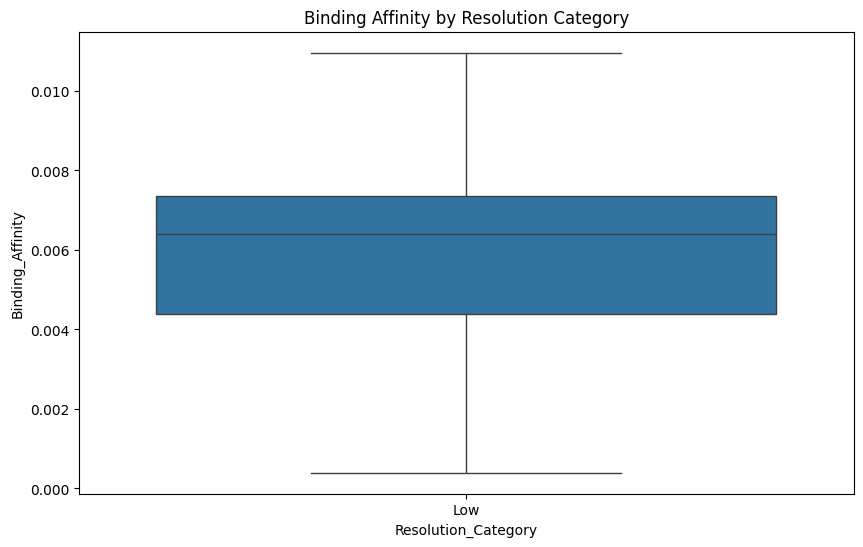

Mann-Whitney U test: U-stat = nan, p-value = nan


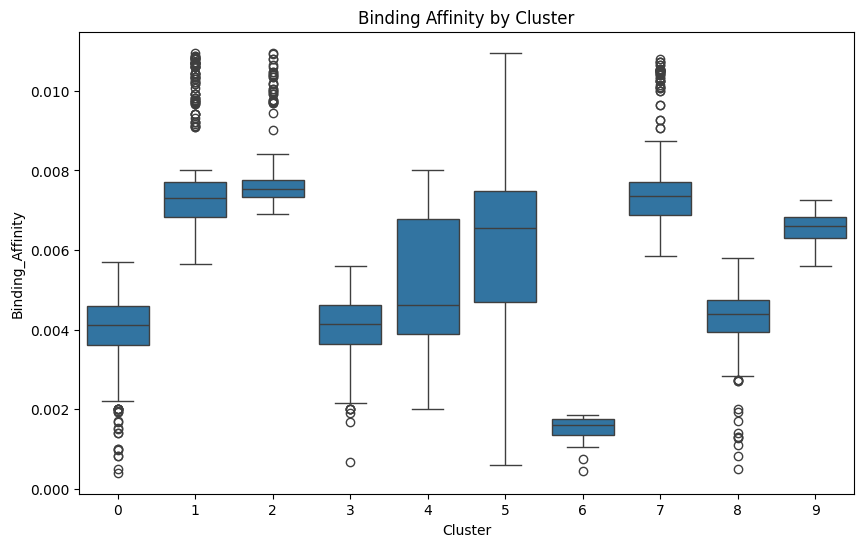

Kruskal-Wallis test: H-stat = 6350.92, p-value = 0.0000


In [ ]:
import pandas as pd
import numpy as np
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns

df_cleaned['Resolution_Category'] = np.where(df_cleaned['Sequence_Length'] <= 2.5, 'High', 'Low')
high_res_affinity = df_cleaned[df_cleaned['Resolution_Category'] == 'High']['Binding_Affinity']
low_res_affinity = df_cleaned[df_cleaned['Resolution_Category'] == 'Low']['Binding_Affinity']

_, p_high = stats.shapiro(high_res_affinity)
_, p_low = stats.shapiro(low_res_affinity)

if p_high > 0.05 and p_low > 0.05:
    t_stat, p_value = stats.ttest_ind(high_res_affinity, low_res_affinity)
    test_result = f"T-test: t-stat = {t_stat:.2f}, p-value = {p_value:.4f}"
else:
    u_stat, p_value = stats.mannwhitneyu(high_res_affinity, low_res_affinity)
    test_result = f"Mann-Whitney U test: U-stat = {u_stat:.2f}, p-value = {p_value:.4f}"

plt.figure(figsize=(10, 6))
sns.boxplot(x='Resolution_Category', y='Binding_Affinity', data=df_cleaned)
plt.title("Binding Affinity by Resolution Category")
plt.show()

print(test_result)

clusters = df_cleaned['Cluster'].unique()
normality_results = {cluster: stats.shapiro(df_cleaned[df_cleaned['Cluster'] == cluster]['Binding_Affinity'])[1] for cluster in clusters}
normal_clusters = [cluster for cluster, p in normality_results.items() if p > 0.05]

if len(normal_clusters) == len(clusters):
    f_stat, p_value_anova = stats.f_oneway(*[df_cleaned[df_cleaned['Cluster'] == cluster]['Binding_Affinity'] for cluster in clusters])
    test_result_anova = f"ANOVA: F-stat = {f_stat:.2f}, p-value = {p_value_anova:.4f}"
else:
    h_stat, p_value_kw = stats.kruskal(*[df_cleaned[df_cleaned['Cluster'] == cluster]['Binding_Affinity'] for cluster in clusters])
    test_result_anova = f"Kruskal-Wallis test: H-stat = {h_stat:.2f}, p-value = {p_value_kw:.4f}"

plt.figure(figsize=(10, 6))
sns.boxplot(x='Cluster', y='Binding_Affinity', data=df_cleaned)
plt.title("Binding Affinity by Cluster")
plt.show()

print(test_result_anova)

In [ ]:
import pandas as pd
import numpy as np
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns

df = pd.read_csv('cleaned_merged_with_features_optimized.csv')
df['Resolution'] = pd.to_numeric(df['Resolution'], errors='coerce')
df = df.dropna(subset=['Resolution'])
high_res = df[df['Resolution'] < df['Resolution'].median()]
low_res = df[df['Resolution'] >= df['Resolution'].median()]

high_res_affinity = high_res['Binding_Affinity_Type']
low_res_affinity = low_res['Binding_Affinity_Type']

In [ ]:
from scipy.stats import ttest_ind

high_res_kd_ki = high_res['Binding_Affinity'].dropna()
low_res_kd_ki = low_res['Binding_Affinity'].dropna()
print(f"High resolution group size: {high_res_kd_ki.shape[0]}")
print(f"Low resolution group size: {low_res_kd_ki.shape[0]}")
print(f"Variance of high resolution: {high_res_kd_ki.var()}")
print(f"Variance of low resolution: {low_res_kd_ki.var()}")

if high_res_kd_ki.shape[0] > 0 and low_res_kd_ki.shape[0] > 0 and high_res_kd_ki.var() > 0 and low_res_kd_ki.var() > 0:
    t_stat, p_value = ttest_ind(high_res_kd_ki, low_res_kd_ki, equal_var=False)
    print(f"T-statistic: {t_stat}")
    print(f"P-value: {p_value}")

    alpha = 0.05
    if p_value < alpha:
        print("There is a significant difference between high- and low-resolution complexes.")
    else:
        print("There is no significant difference between high- and low-resolution complexes.")
else:
    print("Error: One of the groups is empty or has zero variance. Please check the data.")

High resolution group size: 4838
Low resolution group size: 5053
Variance of high resolution: 3.457084694077804e-06
Variance of low resolution: 3.2192295795917383e-06
T-statistic: -8.805419031753063
P-value: 1.5237929140811187e-18
There is a significant difference between high- and low-resolution complexes.


<ipython-input-21-e6a506b7b3f3>:37: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[0, 2].set_xticklabels(['High Resolution', 'Low Resolution'])
<ipython-input-21-e6a506b7b3f3>:48: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[1, 1].set_xticklabels(['High Resolution', 'Low Resolution'])


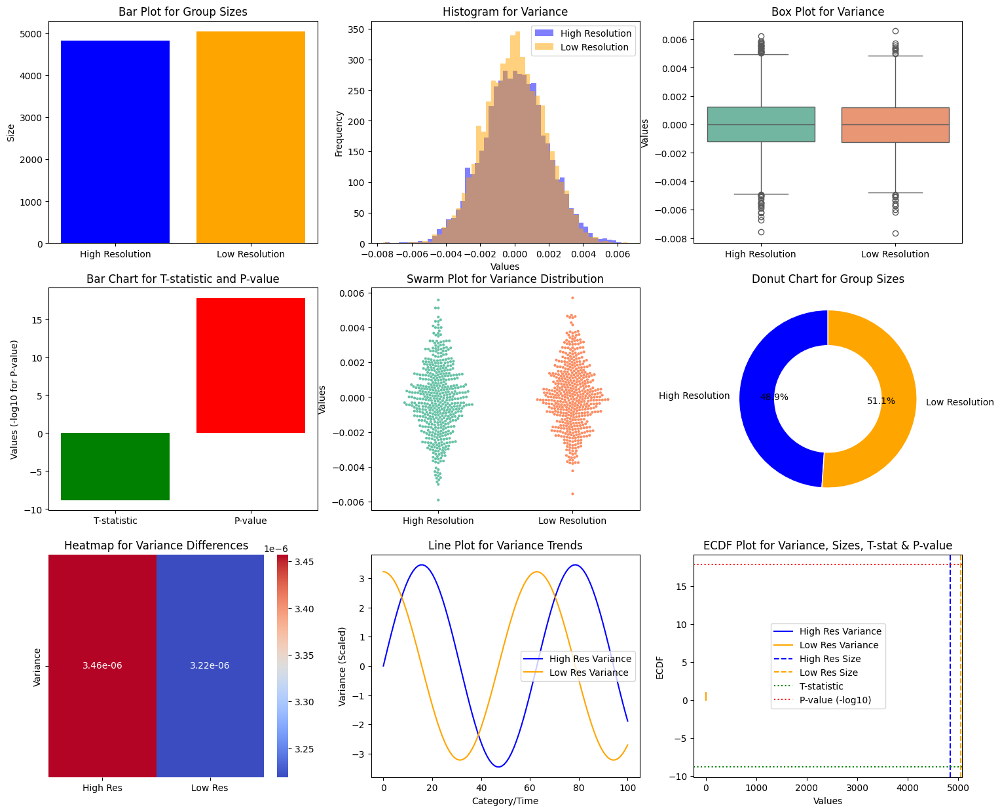

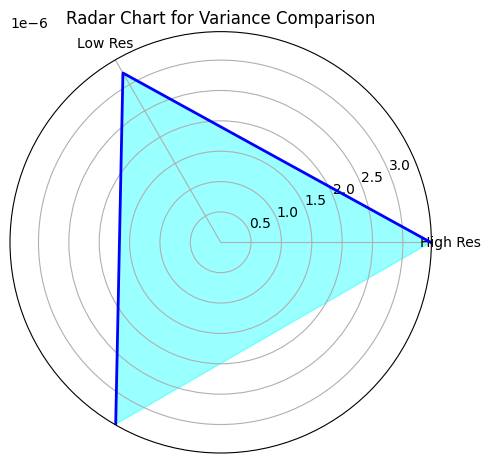

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from statsmodels.distributions.empirical_distribution import ECDF

high_resolution_size = 4838
low_resolution_size = 5053
high_resolution_variance = 3.457084694077804e-06
low_resolution_variance = 3.2192295795917383e-06
t_statistic = -8.805419031753063
p_value = 1.5237929140811187e-18

high_resolution_data = np.random.normal(0, np.sqrt(high_resolution_variance), high_resolution_size)
low_resolution_data = np.random.normal(0, np.sqrt(low_resolution_variance), low_resolution_size)

fig, axs = plt.subplots(3, 3, figsize=(18, 15))

axs[0, 0].bar(['High Resolution', 'Low Resolution'], [high_resolution_size, low_resolution_size], color=['blue', 'orange'])
axs[0, 0].set_title('Bar Plot for Group Sizes')
axs[0, 0].set_ylabel('Size')

axs[0, 1].hist(high_resolution_data, bins=50, alpha=0.5, label='High Resolution', color='blue')
axs[0, 1].hist(low_resolution_data, bins=50, alpha=0.5, label='Low Resolution', color='orange')
axs[0, 1].set_title('Histogram for Variance')
axs[0, 1].set_xlabel('Values')
axs[0, 1].set_ylabel('Frequency')
axs[0, 1].legend()

sns.boxplot(data=[high_resolution_data, low_resolution_data], ax=axs[0, 2], palette='Set2')
axs[0, 2].set_title('Box Plot for Variance')
axs[0, 2].set_xticklabels(['High Resolution', 'Low Resolution'])
axs[0, 2].set_ylabel('Values')

axs[1, 0].bar(['T-statistic', 'P-value'], [t_statistic, -np.log10(p_value)], color=['green', 'red'])
axs[1, 0].set_title('Bar Chart for T-statistic and P-value')
axs[1, 0].set_ylabel('Values (-log10 for P-value)')

sns.swarmplot(data=[high_resolution_data[:500], low_resolution_data[:500]], ax=axs[1, 1], palette='Set2', size=3)
axs[1, 1].set_title('Swarm Plot for Variance Distribution')
axs[1, 1].set_xticklabels(['High Resolution', 'Low Resolution'])
axs[1, 1].set_ylabel('Values')

sizes = [high_resolution_size, low_resolution_size]
labels = ['High Resolution', 'Low Resolution']
colors = ['blue', 'orange']
axs[1, 2].pie(sizes, labels=labels, autopct='%1.1f%%', colors=colors, startangle=90, wedgeprops={'edgecolor': 'white'})
axs[1, 2].add_artist(plt.Circle((0, 0), 0.6, color='white'))
axs[1, 2].set_title('Donut Chart for Group Sizes')

variance_data = np.array([[high_resolution_variance, low_resolution_variance]])
sns.heatmap(variance_data, annot=True, fmt=".2e", cmap="coolwarm", xticklabels=['High Res', 'Low Res'], yticklabels=['Variance'], ax=axs[2, 0])
axs[2, 0].set_title('Heatmap for Variance Differences')

x_vals = np.linspace(0, 100, 100)
high_variance_trend = np.sin(x_vals / 10) * high_resolution_variance * 1e6
low_variance_trend = np.cos(x_vals / 10) * low_resolution_variance * 1e6

axs[2, 1].plot(x_vals, high_variance_trend, label='High Res Variance', color='blue')
axs[2, 1].plot(x_vals, low_variance_trend, label='Low Res Variance', color='orange')
axs[2, 1].set_title('Line Plot for Variance Trends')
axs[2, 1].set_xlabel('Category/Time')
axs[2, 1].set_ylabel('Variance (Scaled)')
axs[2, 1].legend()

ecdf_high = ECDF(high_resolution_data)
ecdf_low = ECDF(low_resolution_data)

x_vals_high = np.linspace(min(high_resolution_data), max(high_resolution_data), 1000)
x_vals_low = np.linspace(min(low_resolution_data), max(low_resolution_data), 1000)

axs[2, 2].plot(x_vals_high, ecdf_high(x_vals_high), label='High Res Variance', color='blue')
axs[2, 2].plot(x_vals_low, ecdf_low(x_vals_low), label='Low Res Variance', color='orange')

axs[2, 2].axvline(high_resolution_size, color='blue', linestyle='--', label='High Res Size')
axs[2, 2].axvline(low_resolution_size, color='orange', linestyle='--', label='Low Res Size')
axs[2, 2].axhline(t_statistic, color='green', linestyle=':', label='T-statistic')
axs[2, 2].axhline(-np.log10(p_value), color='red', linestyle=':', label='P-value (-log10)')

axs[2, 2].set_title('ECDF Plot for Variance, Sizes, T-stat & P-value')
axs[2, 2].set_xlabel('Values')
axs[2, 2].set_ylabel('ECDF')
axs[2, 2].legend()

angles = np.linspace(0, 2 * np.pi, 3, endpoint=False)
values = [high_resolution_variance, low_resolution_variance, high_resolution_variance]  # Closing the loop
fig_radar = plt.figure(figsize=(5, 5))
ax_radar = fig_radar.add_subplot(111, polar=True)
ax_radar.fill(angles, values, color='cyan', alpha=0.4)
ax_radar.plot(angles, values, color='blue', linewidth=2)
ax_radar.set_xticks(angles[:-1])
ax_radar.set_xticklabels(['High Res', 'Low Res'])
ax_radar.set_title('Radar Chart for Variance Comparison')

plt.tight_layout()
plt.show()

In [ ]:
df.head()

,PDB_Code,Release_Year_merged,Release_Year,Uniprot_ID,Protein_Name,Resolution,Binding_Data,Reference_ligand,Reference,Ligand_Name,...,Resolution1,R_factor1,R_free1,Molecular_Weight1,logP,H_Donors,H_Acceptors,Ring_Count,Complex_Feature,Processed_Binding_Data(um)
0,10GS,1998.0,1998.0,P09211,GLUTATHIONE S-TRANSFERASE P1-1,2.2,Ki=0.4uM,.pdf (VWW),.pdf (VWW),10gs,...,2.2,0.176,0.214,NaN,NaN,NaN,NaN,NaN,NaN,0.4
1,10GS,1998.0,1998.0,P09211,GLUTATHIONE S-TRANSFERASE P1-1,2.2,Ki=0.4uM,.pdf (VWW),.pdf (VWW),10gs,...,2.2,0.176,0.214,NaN,NaN,NaN,NaN,NaN,NaN,0.4
2,11GS,1999.0,1999.0,P09211,GLUTATHIONE S-TRANSFERASE,2.3,Ki=1.5uM,.pdf (2-mer) redundant to 3gss,.pdf (2-mer) redundant to 3gss,11gs,...,2.30,0.214,0.270,NaN,NaN,NaN,NaN,NaN,NaN,0.5
3,13GS,1999.0,1999.0,P09211,GLUTATHIONE S-TRANSFERASE,1.9,Ki=24uM,.pdf (SAS),.pdf (SAS),13gs,...,1.90,0.193,0.222,NaN,NaN,NaN,NaN,NaN,NaN,4.0
4,16PK,1998.0,1998.0,P07378,3-PHOSPHOGLYCERATE KINASE,1.6,Ki=6uM,.pdf (BIS) X-ray(Trypanosoma brucei PGK) while...,.pdf (BIS) X-ray(Trypanosoma brucei PGK) while...,16pk,...,1.60,0.188,0.235,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
df_cleaned.columns

Index(['Release_Year', 'Resolution', 'Reference', 'Binding_Affinity_Type',
       'Processed_Binding_Data(um)', 'Sequence_Length', 'Isoelectric_Point',
       'Binding_Affinity', 'Binding_Value', 'R-factor', 'R-free', 'Cluster',
       'Affinity_Class'],
      dtype='object')

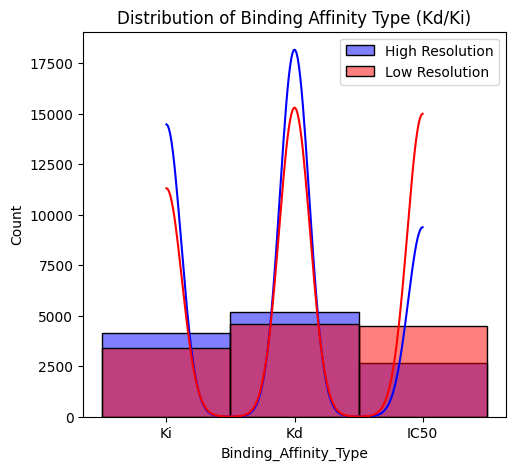

Shapiro-Wilk Test (High-Res): p-value = nan
Shapiro-Wilk Test (Low-Res): p-value = nan

Statistical Test Used: Mann–Whitney U Test
P-value: nan
→ No significant difference found between high and low-resolution complexes.


In [ ]:
import numpy as np
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns
df = pd.read_csv('cleaned_merged_with_features_optimized.csv')
df['Resolution'] = pd.to_numeric(df['Resolution'], errors='coerce')
df = df.dropna(subset=['Resolution'])
high_res = df[df['Resolution'] < df['Resolution'].median()]
low_res = df[df['Resolution'] >= df['Resolution'].median()]
high_res_affinity = high_res['Binding_Affinity_Type']
low_res_affinity = low_res['Binding_Affinity_Type']

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
sns.histplot(high_res_affinity, kde=True, bins=30, color='blue', label='High Resolution')
sns.histplot(low_res_affinity, kde=True, bins=30, color='red', label='Low Resolution')
plt.legend()
plt.title("Distribution of Binding Affinity Type (Kd/Ki)")
plt.show()

shapiro_high = stats.shapiro(high_res_affinity)
shapiro_low = stats.shapiro(low_res_affinity)
print(f"Shapiro-Wilk Test (High-Res): p-value = {shapiro_high.pvalue:.4f}")
print(f"Shapiro-Wilk Test (Low-Res): p-value = {shapiro_low.pvalue:.4f}")

if shapiro_high.pvalue > 0.05 and shapiro_low.pvalue > 0.05:
    t_stat, p_value = stats.ttest_ind(high_res_affinity, low_res_affinity, equal_var=False)
    test_used = "T-test"
else:
    u_stat, p_value = stats.mannwhitneyu(high_res_affinity, low_res_affinity, alternative='two-sided')
    test_used = "Mann–Whitney U Test"

print(f"\nStatistical Test Used: {test_used}")
print(f"P-value: {p_value:.4f}")

if p_value < 0.05:
    print("→ Significant difference found between high and low-resolution complexes.")
else:
    print("→ No significant difference found between high and low-resolution complexes.")

In [ ]:
df.columns

Index(['PDB_Code', 'Release_Year_merged', 'Release_Year', 'Uniprot_ID',
       'Protein_Name', 'Resolution', 'Binding_Data', 'Reference_ligand',
       'Reference', 'Ligand_Name', 'R-factor', 'R-free', 'Delta-R', 'SMILES',
       'Molecular_Weight', 'Binding_Affinity', 'Binding_Value',
       'Binding_Affinity_Type', 'Sequence_Length', 'Isoelectric_Point',
       'Functional_Class', 'Resolution1', 'R_factor1', 'R_free1',
       'Molecular_Weight1', 'logP', 'H_Donors', 'H_Acceptors', 'Ring_Count',
       'Complex_Feature', 'Processed_Binding_Data(um)'],
      dtype='object')

In [ ]:
df_cleaned.head()

,Release_Year,Resolution,Reference,Binding_Affinity_Type,Processed_Binding_Data(um),Sequence_Length,Isoelectric_Point,Binding_Affinity,Binding_Value,R-factor,R-free,Cluster,Affinity_Class,Resolution_Category
3,1999.0,1.9,.pdf (SAS),NaN,4.0,6.0,7.4,0.00462,24uM,0.193,0.222,8,0,Low
5,1995.0,1.8,.pdf (I4B) ligand is compound 39,NaN,9.0,6.0,7.4,0.00472,19uM,0.162,-1.000,5,0,Low
6,1995.0,1.8,.pdf (I4B) ligand is compound 39,NaN,9.0,6.0,7.4,0.00472,19uM,0.162,-1.000,5,0,Low
7,1995.0,1.8,.pdf (IND) ligand is compound 15,NaN,0.0,6.0,7.4,0.00354,290uM,0.169,-1.000,5,0,Low
8,1995.0,1.8,.pdf (IND) ligand is compound 15,NaN,0.0,6.0,7.4,0.00354,290uM,0.169,-1.000,5,0,Low


<ipython-input-44-cf039b28faf2>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_clean['Resolution_Category'] = pd.cut(df_clean['Resolution'], bins=bins, labels=labels)
<ipython-input-44-cf039b28faf2>:19: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  desc_stats = df_clean.groupby('Resolution_Category')['Binding_Affinity'].describe()


                      count      mean       std      min       25%      50%  \
Resolution_Category                                                           
High                 1169.0  0.005895  0.001841  0.00140  0.004320  0.00612   
Medium               7311.0  0.006089  0.001850  0.00040  0.004490  0.00649   
Low                  1365.0  0.006452  0.001701  0.00075  0.005000  0.00694   
Very Low               46.0  0.005917  0.001584  0.00340  0.004557  0.00585   

                          75%      max  
Resolution_Category                     
High                 0.007370  0.01130  
Medium               0.007520  0.01396  
Low                  0.007660  0.01500  
Very Low             0.007233  0.00852  
Correlation between Resolution and Binding Affinity: 0.08542817295841212


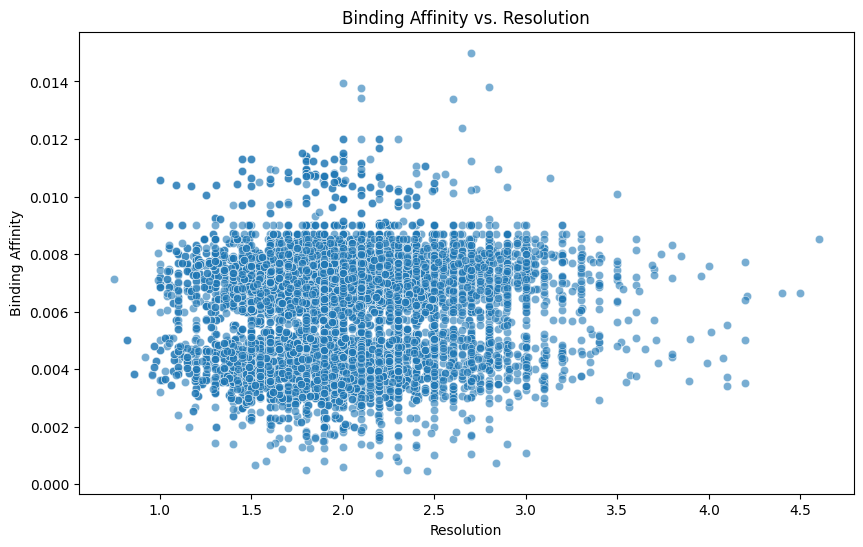

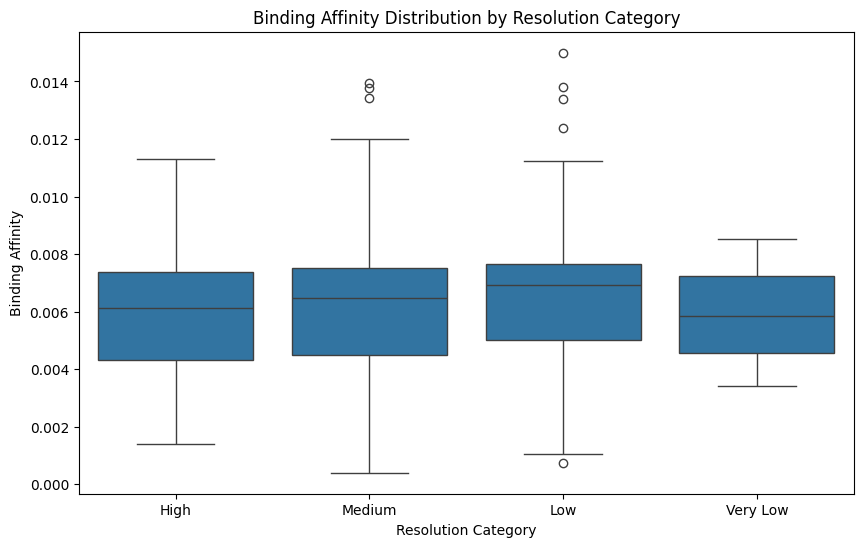

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

df['Resolution'] = pd.to_numeric(df['Resolution'], errors='coerce')
df['Binding_Affinity'] = pd.to_numeric(df['Binding_Affinity'], errors='coerce')
df_clean = df.dropna(subset=['Resolution', 'Binding_Affinity'])
bins = [0, 1.5, 2.5, 3.5, 10]
labels = ['High', 'Medium', 'Low', 'Very Low']
df_clean['Resolution_Category'] = pd.cut(df_clean['Resolution'], bins=bins, labels=labels)
desc_stats = df_clean.groupby('Resolution_Category')['Binding_Affinity'].describe()
print(desc_stats)

correlation = df_clean[['Resolution', 'Binding_Affinity']].corr()
print(f"Correlation between Resolution and Binding Affinity: {correlation.iloc[0, 1]}")

plt.figure(figsize=(10, 6))
sns.scatterplot(x='Resolution', y='Binding_Affinity', data=df_clean, alpha=0.6)
plt.title('Binding Affinity vs. Resolution')
plt.xlabel('Resolution')
plt.ylabel('Binding Affinity')
plt.show()

plt.figure(figsize=(10, 6))
sns.boxplot(x='Resolution_Category', y='Binding_Affinity', data=df_clean)
plt.title('Binding Affinity Distribution by Resolution Category')
plt.xlabel('Resolution Category')
plt.ylabel('Binding Affinity')
plt.show()

Number of outliers: 7


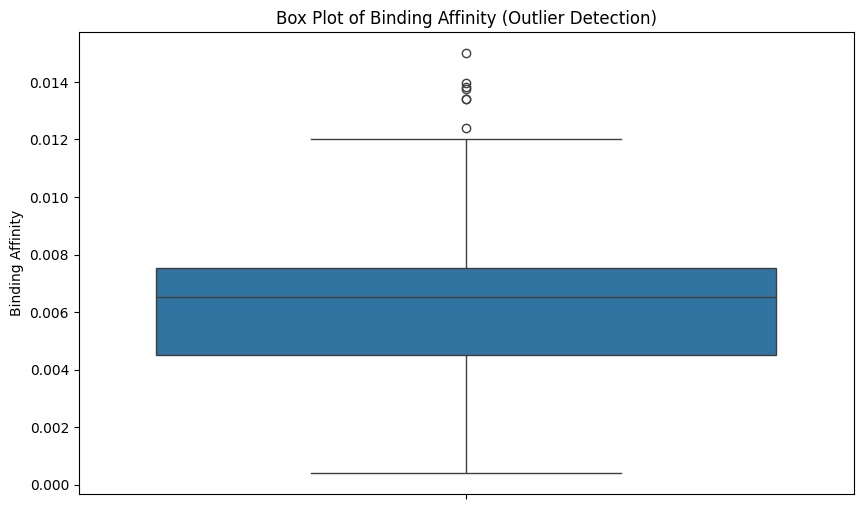

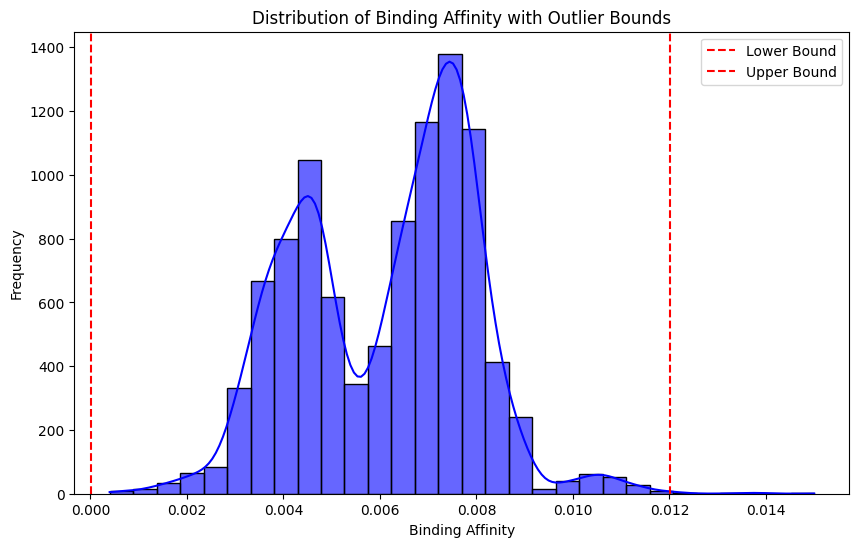

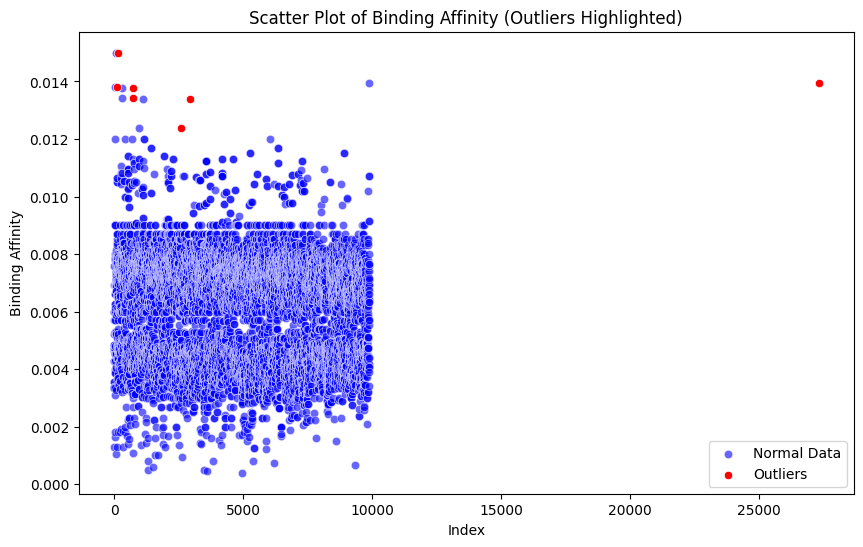

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

df['Binding_Affinity'] = pd.to_numeric(df['Binding_Affinity'], errors='coerce')
df_clean = df.dropna(subset=['Binding_Affinity'])
Q1 = df_clean['Binding_Affinity'].quantile(0.25)
Q3 = df_clean['Binding_Affinity'].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
outliers = df_clean[(df_clean['Binding_Affinity'] < lower_bound) | (df_clean['Binding_Affinity'] > upper_bound)]
non_outliers = df_clean[(df_clean['Binding_Affinity'] >= lower_bound) & (df_clean['Binding_Affinity'] <= upper_bound)]
print(f"Number of outliers: {len(outliers)}")

plt.figure(figsize=(10, 6))
sns.boxplot(y=df_clean['Binding_Affinity'])
plt.title('Box Plot of Binding Affinity (Outlier Detection)')
plt.ylabel('Binding Affinity')
plt.show()

plt.figure(figsize=(10, 6))
sns.histplot(df_clean['Binding_Affinity'], bins=30, kde=True, color='blue', alpha=0.6)
plt.axvline(lower_bound, color='red', linestyle='dashed', label='Lower Bound')
plt.axvline(upper_bound, color='red', linestyle='dashed', label='Upper Bound')
plt.title('Distribution of Binding Affinity with Outlier Bounds')
plt.xlabel('Binding Affinity')
plt.ylabel('Frequency')
plt.legend()
plt.show()

plt.figure(figsize=(10, 6))
sns.scatterplot(x=np.arange(len(df_clean)), y=df_clean['Binding_Affinity'], color='blue', alpha=0.6, label="Normal Data")
sns.scatterplot(x=outliers.index, y=outliers['Binding_Affinity'], color='red', label="Outliers")
plt.title('Scatter Plot of Binding Affinity (Outliers Highlighted)')
plt.xlabel('Index')
plt.ylabel('Binding Affinity')
plt.legend()
plt.show()

In [ ]:
import pandas as pd
import numpy as np

df['Binding_Affinity'] = pd.to_numeric(df['Binding_Affinity'], errors='coerce')
df_clean = df.dropna(subset=['Binding_Affinity', 'Reference'])
Q1 = df_clean['Binding_Affinity'].quantile(0.25)
Q3 = df_clean['Binding_Affinity'].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
outliers_df = df_clean[(df_clean['Binding_Affinity'] < lower_bound) | (df_clean['Binding_Affinity'] > upper_bound)]

if not outliers_df.empty:
    print("\nPotential discrepancies in Binding Affinity detected. Please verify these references:\n")
    print(outliers_df[['PDB_Code', 'Binding_Affinity', 'Reference', 'Functional_Class']])
else:
    print("No extreme discrepancies detected.")

outliers_df.to_csv('suspicious_binding_affinity_values.csv', index=False)
print("Suspicious values saved to 'suspicious_binding_affinity_values.csv'.")


Potential discrepancies in Binding Affinity detected. Please verify these references:

      PDB_Code  Binding_Affinity                    Reference Functional_Class
132       1AMN           0.01382  .pdf (NAF) covalent complex           Kinase
161       1AVD           0.01500                   .pdf (BTN)           Kinase
749       1EOJ           0.01377                .pdf (14-mer)           Kinase
750       1EOL           0.01342                .pdf (15-mer)           Kinase
2592      1Q83           0.01239                   .pdf (TZ5)           Kinase
2925      1STP           0.01340                   .pdf (BTN)           Kinase
27297     7CPA           0.01396                   .pdf (FVF)           Kinase
Suspicious values saved to 'suspicious_binding_affinity_values.csv'.



Potential discrepancies in Binding Affinity detected. Please verify these references:

      PDB_Code  Binding_Affinity                    Reference Functional_Class
132       1AMN           0.01382  .pdf (NAF) covalent complex           Kinase
161       1AVD           0.01500                   .pdf (BTN)           Kinase
749       1EOJ           0.01377                .pdf (14-mer)           Kinase
750       1EOL           0.01342                .pdf (15-mer)           Kinase
2592      1Q83           0.01239                   .pdf (TZ5)           Kinase
2925      1STP           0.01340                   .pdf (BTN)           Kinase
27297     7CPA           0.01396                   .pdf (FVF)           Kinase
Suspicious values saved to 'suspicious_binding_affinity_values.csv'.


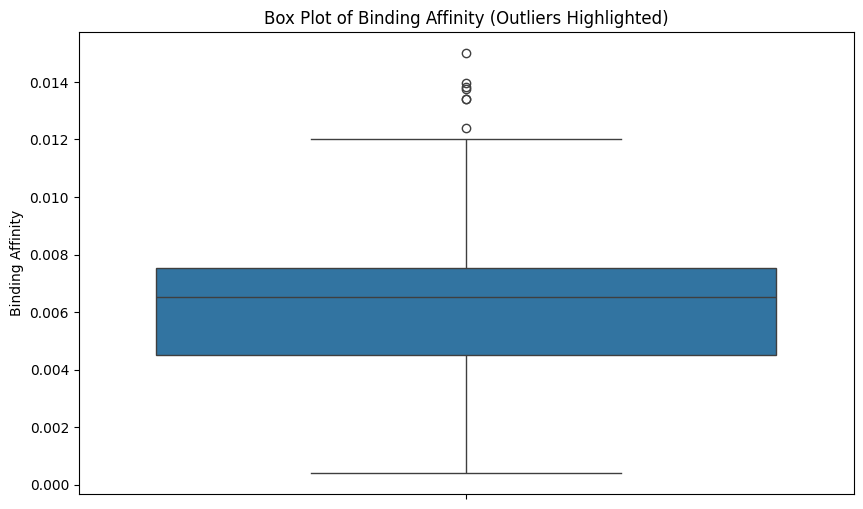

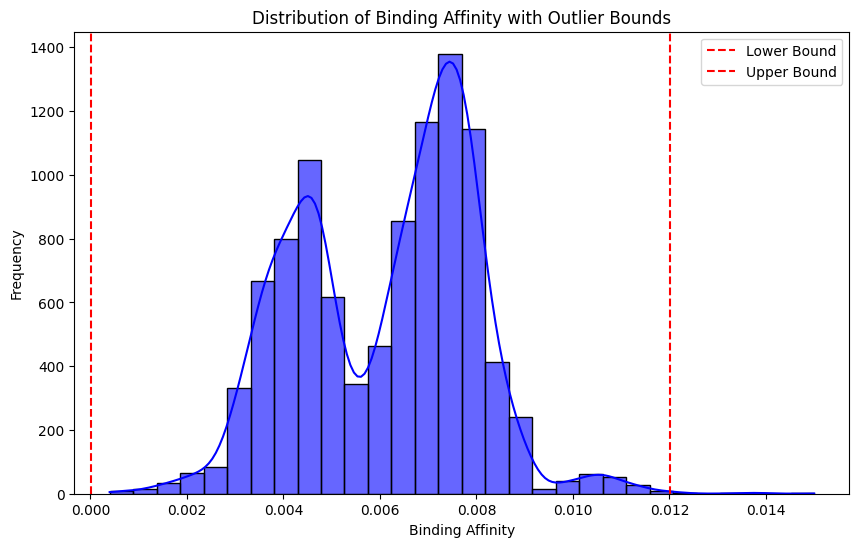

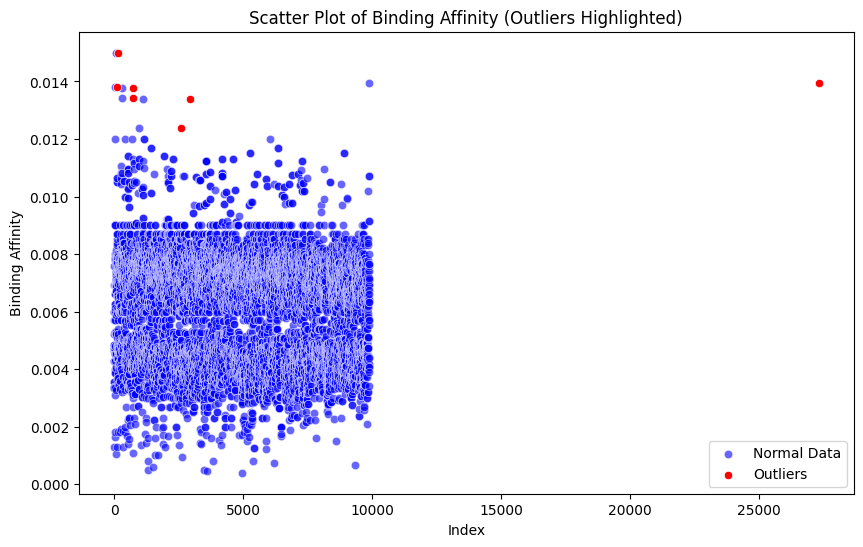

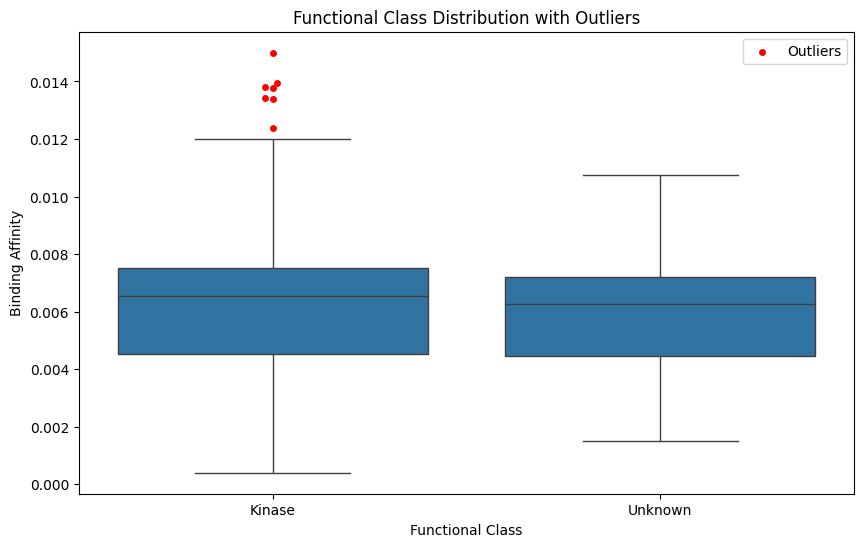

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

df['Binding_Affinity'] = pd.to_numeric(df['Binding_Affinity'], errors='coerce')
df_clean = df.dropna(subset=['Binding_Affinity', 'Reference'])
Q1 = df_clean['Binding_Affinity'].quantile(0.25)
Q3 = df_clean['Binding_Affinity'].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
outliers_df = df_clean[(df_clean['Binding_Affinity'] < lower_bound) | (df_clean['Binding_Affinity'] > upper_bound)]
non_outliers_df = df_clean[(df_clean['Binding_Affinity'] >= lower_bound) & (df_clean['Binding_Affinity'] <= upper_bound)]

if not outliers_df.empty:
    print("\nPotential discrepancies in Binding Affinity detected. Please verify these references:\n")
    print(outliers_df[['PDB_Code', 'Binding_Affinity', 'Reference', 'Functional_Class']])
else:
    print("No extreme discrepancies detected.")

outliers_df.to_csv('suspicious_binding_affinity_values.csv', index=False)
print("Suspicious values saved to 'suspicious_binding_affinity_values.csv'.")

plt.figure(figsize=(10, 6))
sns.boxplot(y=df_clean['Binding_Affinity'])
plt.title('Box Plot of Binding Affinity (Outliers Highlighted)')
plt.ylabel('Binding Affinity')
plt.show()

plt.figure(figsize=(10, 6))
sns.histplot(df_clean['Binding_Affinity'], bins=30, kde=True, color='blue', alpha=0.6)
plt.axvline(lower_bound, color='red', linestyle='dashed', label='Lower Bound')
plt.axvline(upper_bound, color='red', linestyle='dashed', label='Upper Bound')
plt.title('Distribution of Binding Affinity with Outlier Bounds')
plt.xlabel('Binding Affinity')
plt.ylabel('Frequency')
plt.legend()
plt.show()

plt.figure(figsize=(10, 6))
sns.scatterplot(x=np.arange(len(df_clean)), y=df_clean['Binding_Affinity'], color='blue', alpha=0.6, label="Normal Data")
sns.scatterplot(x=outliers_df.index, y=outliers_df['Binding_Affinity'], color='red', label="Outliers")
plt.title('Scatter Plot of Binding Affinity (Outliers Highlighted)')
plt.xlabel('Index')
plt.ylabel('Binding Affinity')
plt.legend()
plt.show()

plt.figure(figsize=(10, 6))
sns.boxplot(x='Functional_Class', y='Binding_Affinity', data=df_clean, showfliers=False)
sns.swarmplot(x='Functional_Class', y='Binding_Affinity', data=outliers_df, color='red', label="Outliers")
plt.title('Functional Class Distribution with Outliers')
plt.xlabel('Functional Class')
plt.ylabel('Binding Affinity')
plt.legend()
plt.show()


1980s Data Summary:
       Binding_Affinity  Resolution
count          9.000000    9.000000
mean           0.005573    2.111111
std            0.001775    0.202759
min            0.003720    1.800000
25%            0.004310    1.900000
50%            0.004400    2.100000
75%            0.007300    2.300000
max            0.007550    2.300000

2000s Data Summary:
       Binding_Affinity   Resolution
count       2940.000000  2940.000000
mean           0.006200     2.042269
std            0.001873     0.427182
min            0.000450     0.750000
25%            0.004570     1.780000
50%            0.006620     2.000000
75%            0.007640     2.300000
max            0.013770     4.400000


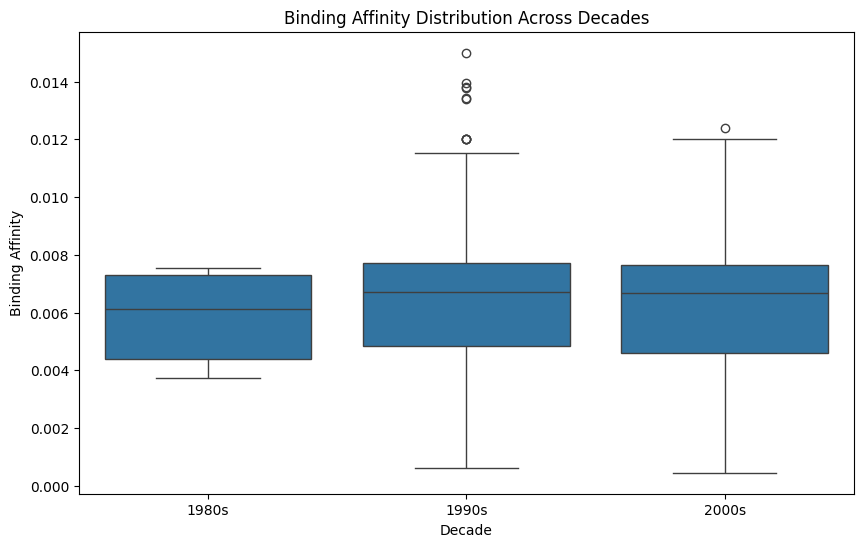

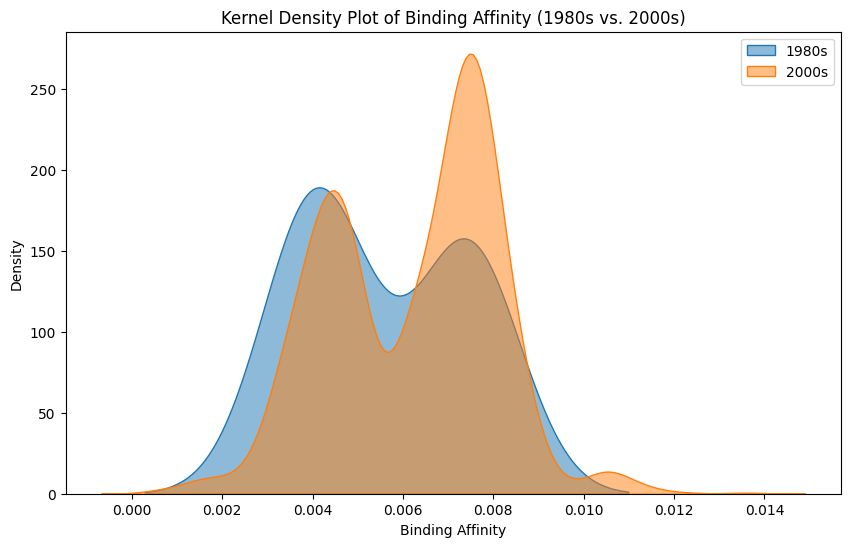

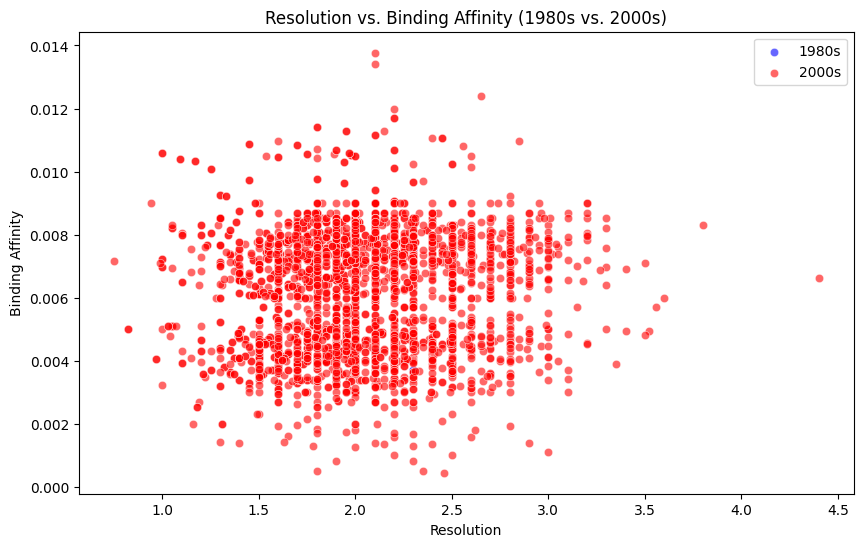

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

df['Release_Year'] = pd.to_numeric(df['Release_Year'], errors='coerce')
df_clean = df.dropna(subset=['Release_Year', 'Resolution', 'Binding_Affinity'])
df_1980s = df_clean[(df_clean['Release_Year'] >= 1980) & (df_clean['Release_Year'] < 1990)]
df_2000s = df_clean[(df_clean['Release_Year'] >= 2000) & (df_clean['Release_Year'] < 2010)]
print("\n1980s Data Summary:")
print(df_1980s[['Binding_Affinity', 'Resolution']].describe())
print("\n2000s Data Summary:")
print(df_2000s[['Binding_Affinity', 'Resolution']].describe())

plt.figure(figsize=(10, 6))
sns.boxplot(x=pd.cut(df_clean['Release_Year'], bins=[1980, 1990, 2000, 2010], labels=['1980s', '1990s', '2000s']),
            y=df_clean['Binding_Affinity'])
plt.title('Binding Affinity Distribution Across Decades')
plt.xlabel('Decade')
plt.ylabel('Binding Affinity')
plt.show()

plt.figure(figsize=(10, 6))
sns.kdeplot(df_1980s['Binding_Affinity'], label='1980s', fill=True, alpha=0.5)
sns.kdeplot(df_2000s['Binding_Affinity'], label='2000s', fill=True, alpha=0.5)
plt.title('Kernel Density Plot of Binding Affinity (1980s vs. 2000s)')
plt.xlabel('Binding Affinity')
plt.ylabel('Density')
plt.legend()
plt.show()

plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_1980s, x='Resolution', y='Binding_Affinity', color='blue', alpha=0.6, label='1980s')
sns.scatterplot(data=df_2000s, x='Resolution', y='Binding_Affinity', color='red', alpha=0.6, label='2000s')
plt.title('Resolution vs. Binding Affinity (1980s vs. 2000s)')
plt.xlabel('Resolution')
plt.ylabel('Binding Affinity')
plt.legend()
plt.show()

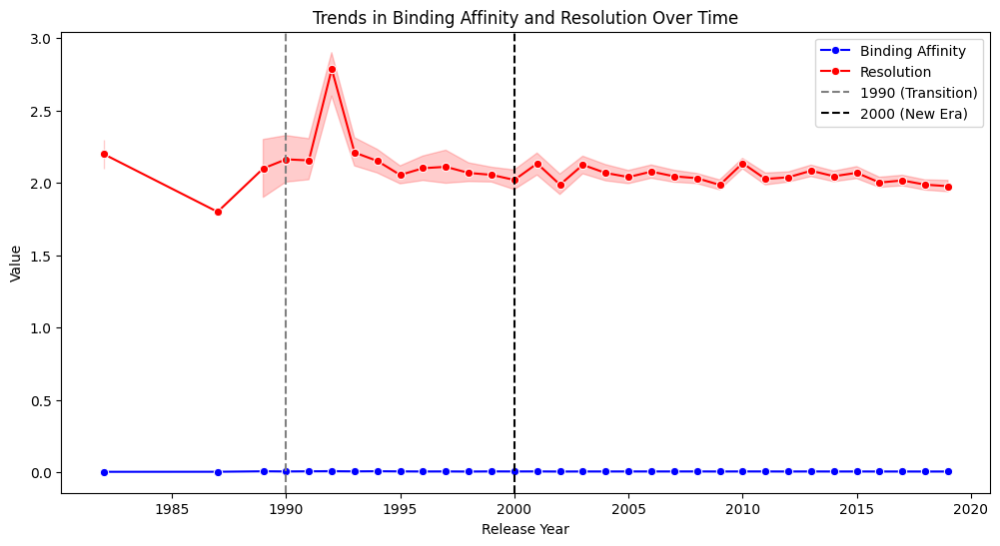

<ipython-input-49-962ccc66f903>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_clean['Decade'] = pd.cut(df_clean['Release_Year'], bins=[1980, 1990, 2000, 2010], labels=['1980s', '1990s', '2000s'])
<ipython-input-49-962ccc66f903>:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Decade', y='Binding_Affinity', data=df_clean, inner='quartile', palette='coolwarm')


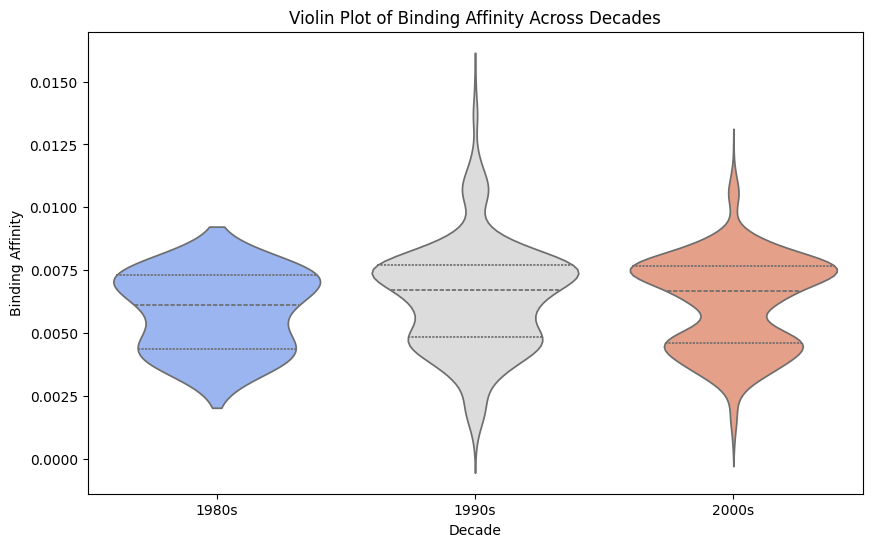

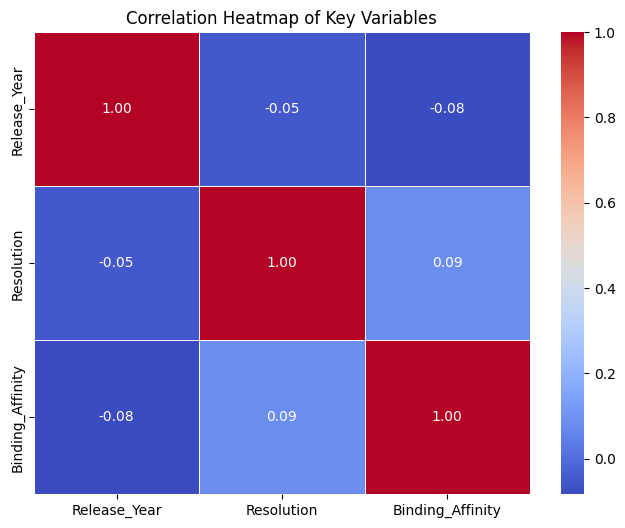

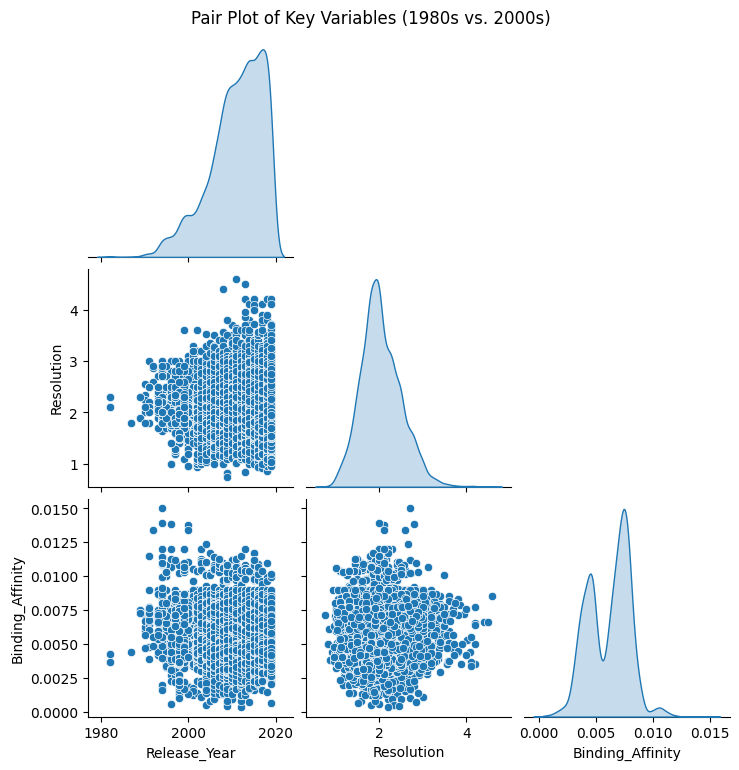

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

df['Release_Year'] = pd.to_numeric(df['Release_Year'], errors='coerce')
df_clean = df.dropna(subset=['Release_Year', 'Resolution', 'Binding_Affinity'])

plt.figure(figsize=(12, 6))
sns.lineplot(data=df_clean, x='Release_Year', y='Binding_Affinity', marker='o', label="Binding Affinity", color='b')
sns.lineplot(data=df_clean, x='Release_Year', y='Resolution', marker='o', label="Resolution", color='r')
plt.axvline(1990, linestyle="dashed", color="gray", label="1990 (Transition)")
plt.axvline(2000, linestyle="dashed", color="black", label="2000 (New Era)")
plt.title('Trends in Binding Affinity and Resolution Over Time')
plt.xlabel('Release Year')
plt.ylabel('Value')
plt.legend()
plt.show()

plt.figure(figsize=(10, 6))
df_clean['Decade'] = pd.cut(df_clean['Release_Year'], bins=[1980, 1990, 2000, 2010], labels=['1980s', '1990s', '2000s'])
sns.violinplot(x='Decade', y='Binding_Affinity', data=df_clean, inner='quartile', palette='coolwarm')
plt.title('Violin Plot of Binding Affinity Across Decades')
plt.xlabel('Decade')
plt.ylabel('Binding Affinity')
plt.show()

plt.figure(figsize=(8, 6))
correlation_matrix = df_clean[['Release_Year', 'Resolution', 'Binding_Affinity']].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Heatmap of Key Variables')
plt.show()

sns.pairplot(df_clean[['Release_Year', 'Resolution', 'Binding_Affinity']], diag_kind='kde', corner=True)
plt.suptitle('Pair Plot of Key Variables (1980s vs. 2000s)', y=1.02)
plt.show()

<ipython-input-2-36d4dcb11991>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_clean['UniProt_Age'] = np.where(df_clean['Release_Year'] >= 2020, 'Post-2020', 'Pre-2020')
<ipython-input-2-36d4dcb11991>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_clean['UniProt_Age'] = df_clean['UniProt_Age'].astype(str)
<ipython-input-2-36d4dcb11991>:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the ca

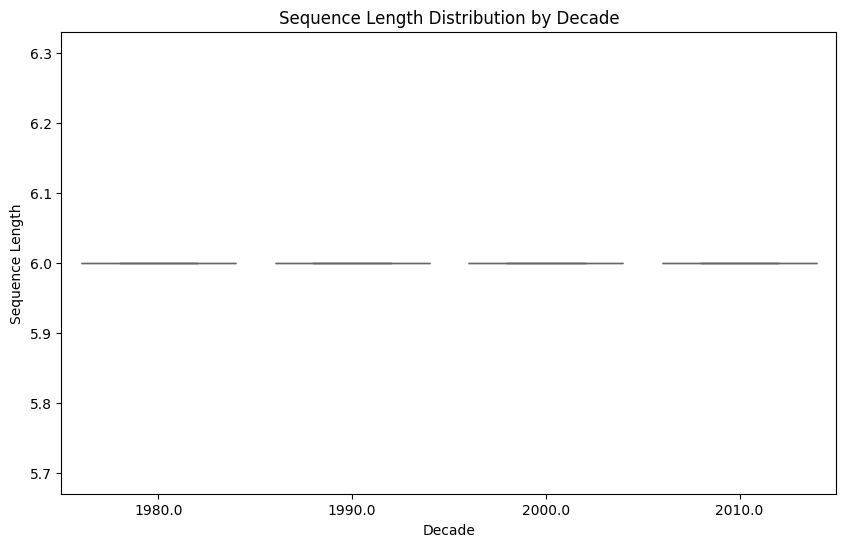

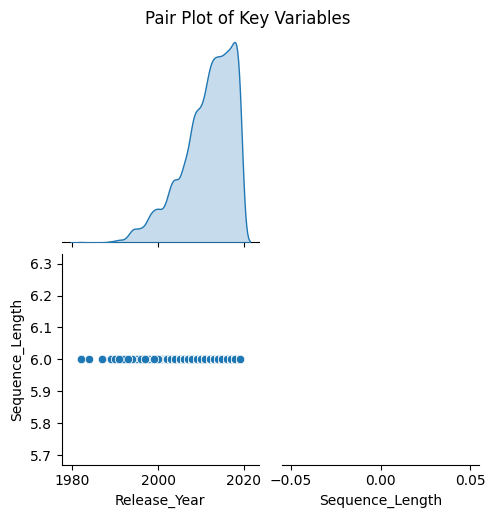

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

df['Release_Year'] = pd.to_numeric(df['Release_Year'], errors='coerce')
df['Sequence_Length'] = pd.to_numeric(df['Sequence_Length'], errors='coerce')
df_clean = df.dropna(subset=['Uniprot_ID', 'Sequence_Length', 'Release_Year'])
df_clean['UniProt_Age'] = np.where(df_clean['Release_Year'] >= 2020, 'Post-2020', 'Pre-2020')
df_clean['UniProt_Age'] = df_clean['UniProt_Age'].astype(str)

plt.figure(figsize=(10, 6))
df_clean['Decade'] = (df_clean['Release_Year'] // 10) * 10
sns.boxplot(x='Decade', y='Sequence_Length', data=df_clean, palette='coolwarm')
plt.title('Sequence Length Distribution by Decade')
plt.xlabel('Decade')
plt.ylabel('Sequence Length')
plt.show()

sns.pairplot(df_clean[['Release_Year', 'Sequence_Length']], diag_kind='kde', corner=True)
plt.suptitle('Pair Plot of Key Variables', y=1.02)
plt.show()

In [ ]:
print(df.columns)
print(df_clean.columns)

Index(['PDB_Code', 'Release_Year_merged', 'Release_Year', 'Uniprot_ID',
       'Protein_Name', 'Resolution', 'Binding_Data', 'Reference_ligand',
       'Reference', 'Ligand_Name', 'R-factor', 'R-free', 'Delta-R', 'SMILES',
       'Molecular_Weight', 'Binding_Affinity', 'Binding_Value',
       'Binding_Affinity_Type', 'Sequence_Length', 'Isoelectric_Point',
       'Functional_Class', 'Resolution1', 'R_factor1', 'R_free1',
       'Molecular_Weight1', 'logP', 'H_Donors', 'H_Acceptors', 'Ring_Count',
       'Complex_Feature', 'Processed_Binding_Data(um)'],
      dtype='object')
Index(['PDB_Code', 'Release_Year_merged', 'Release_Year', 'Uniprot_ID',
       'Protein_Name', 'Resolution', 'Binding_Data', 'Reference_ligand',
       'Reference', 'Ligand_Name', 'R-factor', 'R-free', 'Delta-R', 'SMILES',
       'Molecular_Weight', 'Binding_Affinity', 'Binding_Value',
       'Binding_Affinity_Type', 'Sequence_Length', 'Isoelectric_Point',
       'Functional_Class', 'Resolution1', 'R_factor1', 'R_fr

<ipython-input-3-69a0f91a7f17>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='Release_Year', data=df_clean, palette='coolwarm', alpha=0.7)


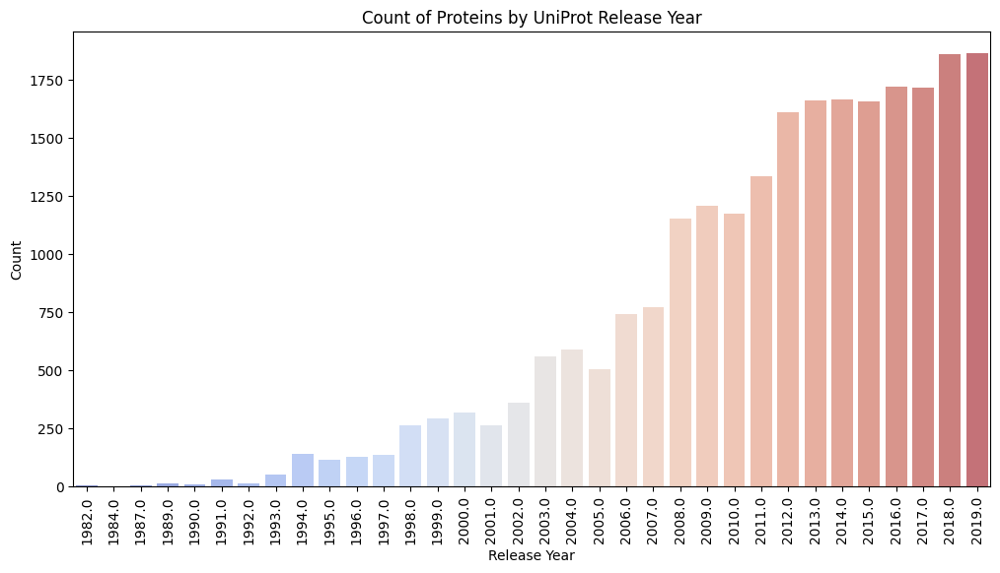

In [ ]:
plt.figure(figsize=(12, 6))
sns.countplot(x='Release_Year', data=df_clean, palette='coolwarm', alpha=0.7)
plt.xticks(rotation=90)
plt.title('Count of Proteins by UniProt Release Year')
plt.xlabel('Release Year')
plt.ylabel('Count')
plt.show()

<ipython-input-15-3ed183d6b099>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_clean['Study_Era'] = df_clean['Release_Year'].apply(lambda x: '1980s-1990s' if x < 2000 else '2000s+')


            Binding_Affinity                                                 \
                       count      mean       std     min       25%      50%   
Study_Era                                                                     
1980s-1990s            580.0  0.006477  0.002164  0.0006  0.004842  0.00681   
2000s+                9153.0  0.006096  0.001807  0.0004  0.004510  0.00652   

                              Resolution                                       \
                 75%      max      count      mean       std   min   25%  50%   
Study_Era                                                                       
1980s-1990s  0.00770  0.01500     1208.0  2.099089  0.346679  0.95  1.85  2.0   
2000s+       0.00752  0.01377    22763.0  2.034750  0.476991  0.75  1.70  2.0   

                       
             75%  max  
Study_Era              
1980s-1990s  2.3  3.6  
2000s+       2.3  4.6  


<ipython-input-15-3ed183d6b099>:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Study_Era', y='Binding_Affinity', data=df_clean, palette='coolwarm')


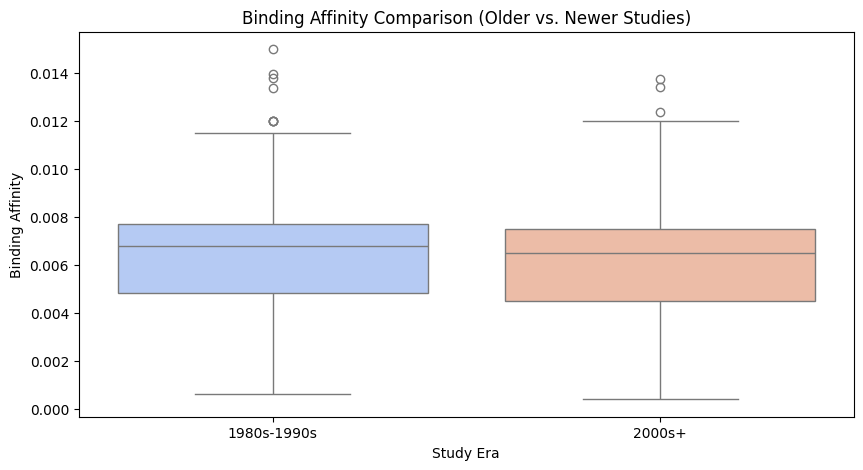

<ipython-input-15-3ed183d6b099>:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Study_Era', y='Resolution', data=df_clean, palette='coolwarm')


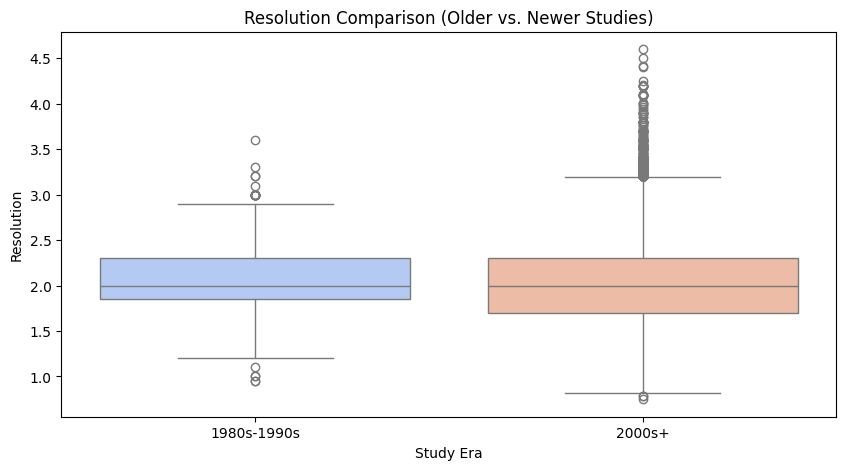

<ipython-input-15-3ed183d6b099>:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Study_Era', y='Resolution', data=df_clean, palette='coolwarm', inner="point")


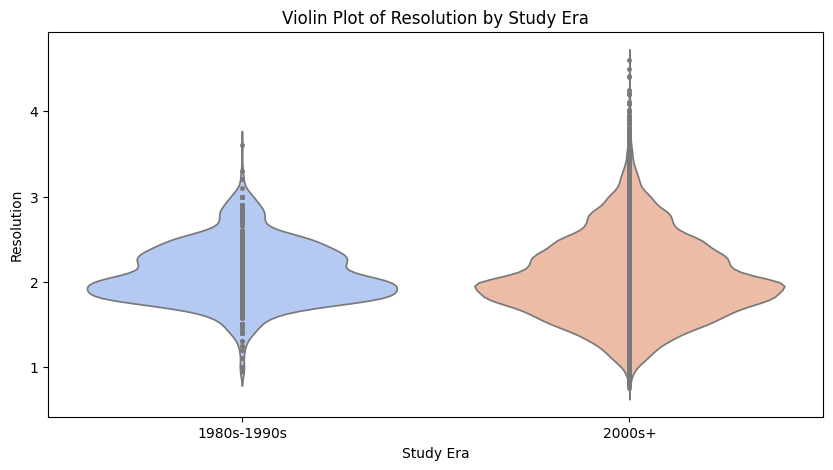

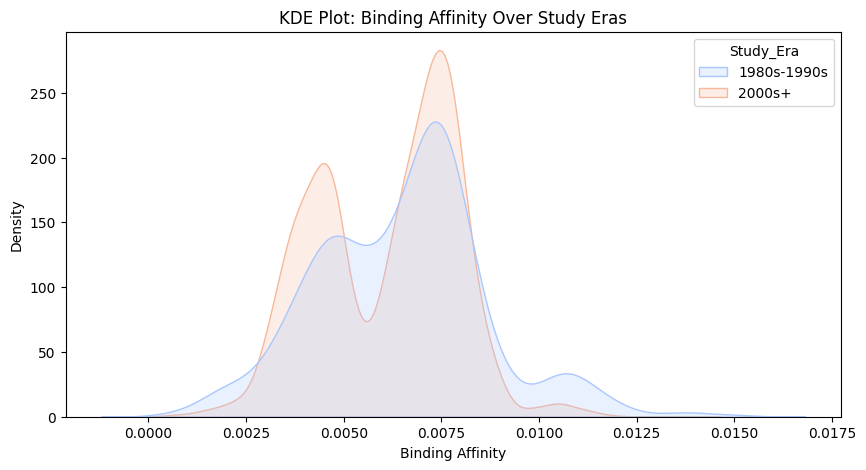

In [ ]:
df_clean['Study_Era'] = df_clean['Release_Year'].apply(lambda x: '1980s-1990s' if x < 2000 else '2000s+')
era_summary = df_clean.groupby('Study_Era')[['Binding_Affinity', 'Resolution']].describe()
print(era_summary)

plt.figure(figsize=(10, 5))
sns.boxplot(x='Study_Era', y='Binding_Affinity', data=df_clean, palette='coolwarm')
plt.title('Binding Affinity Comparison (Older vs. Newer Studies)')
plt.xlabel('Study Era')
plt.ylabel('Binding Affinity')
plt.show()

plt.figure(figsize=(10, 5))
sns.boxplot(x='Study_Era', y='Resolution', data=df_clean, palette='coolwarm')
plt.title('Resolution Comparison (Older vs. Newer Studies)')
plt.xlabel('Study Era')
plt.ylabel('Resolution')
plt.show()

plt.figure(figsize=(10, 5))
sns.violinplot(x='Study_Era', y='Resolution', data=df_clean, palette='coolwarm', inner="point")
plt.title('Violin Plot of Resolution by Study Era')
plt.xlabel('Study Era')
plt.ylabel('Resolution')
plt.show()

plt.figure(figsize=(10, 5))
sns.kdeplot(data=df_clean, x='Binding_Affinity', hue='Study_Era', fill=True, common_norm=False, palette='coolwarm')
plt.title('KDE Plot: Binding Affinity Over Study Eras')
plt.xlabel('Binding Affinity')
plt.ylabel('Density')
plt.show()

<ipython-input-17-79554f2e2a14>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_clean['Study_Era'] = df_clean['Release_Year'].apply(lambda x: '1980s-1990s' if x < 2000 else '2000s+')
<ipython-input-17-79554f2e2a14>:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(x='Study_Era', y='Binding_Affinity', data=df_clean, jitter=True, alpha=0.7, palette='coolwarm')


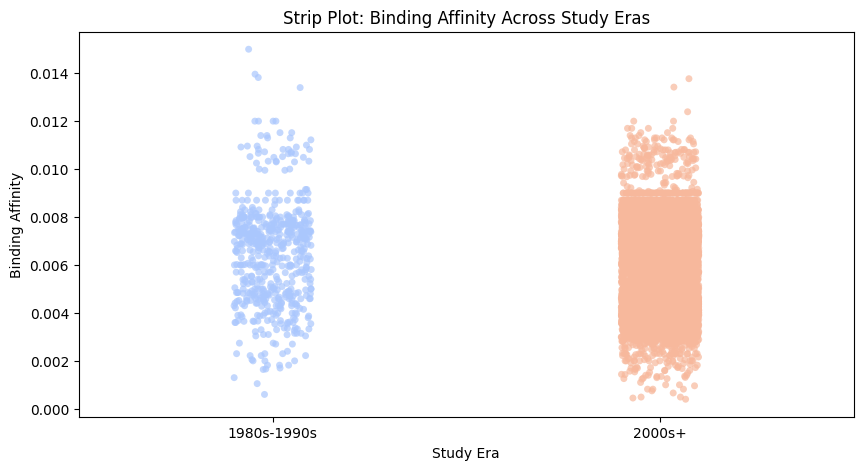

<Figure size 1200x600 with 0 Axes>

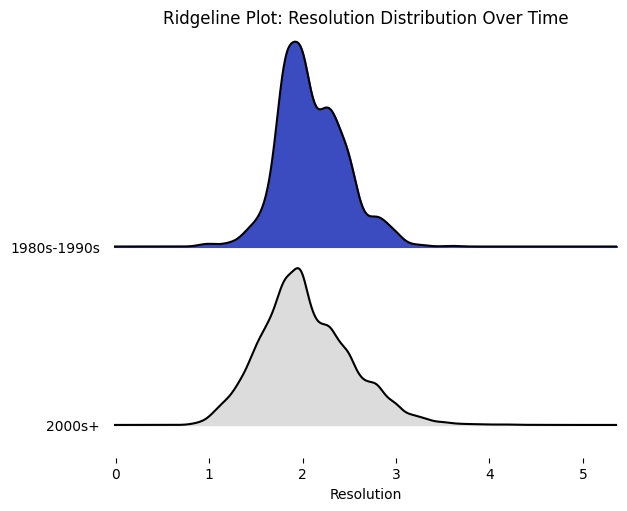

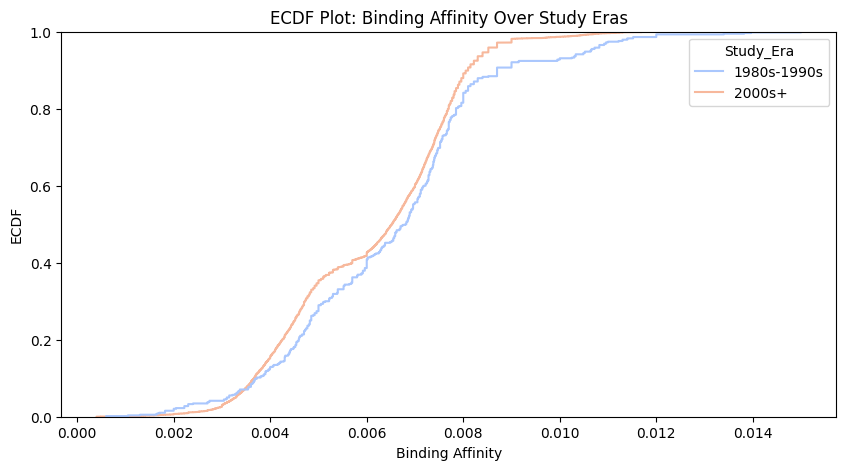

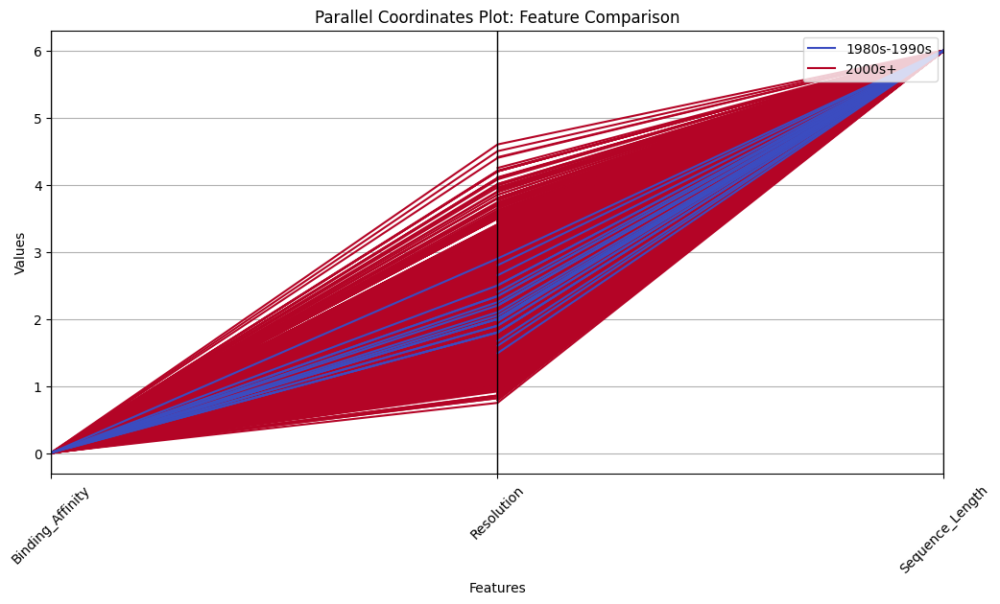

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from joypy import joyplot
from pandas.plotting import parallel_coordinates

df_clean['Study_Era'] = df_clean['Release_Year'].apply(lambda x: '1980s-1990s' if x < 2000 else '2000s+')

plt.figure(figsize=(10, 5))
sns.stripplot(x='Study_Era', y='Binding_Affinity', data=df_clean, jitter=True, alpha=0.7, palette='coolwarm')
plt.title('Strip Plot: Binding Affinity Across Study Eras')
plt.xlabel('Study Era')
plt.ylabel('Binding Affinity')
plt.show()

from joypy import joyplot
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
joyplot(
    data=df_clean.pivot(columns="Study_Era", values="Resolution"),
    colormap=plt.cm.coolwarm
)
plt.title('Ridgeline Plot: Resolution Distribution Over Time')
plt.xlabel('Resolution')
plt.show()


plt.figure(figsize=(10, 5))
sns.ecdfplot(data=df_clean, x="Binding_Affinity", hue="Study_Era", palette='coolwarm')
plt.title('ECDF Plot: Binding Affinity Over Study Eras')
plt.xlabel('Binding Affinity')
plt.ylabel('ECDF')
plt.show()

plt.figure(figsize=(12, 6))
parallel_coordinates(df_clean[['Study_Era', 'Binding_Affinity', 'Resolution', 'Sequence_Length']],
                     class_column='Study_Era', colormap=plt.get_cmap("coolwarm"))
plt.title("Parallel Coordinates Plot: Feature Comparison")
plt.xlabel("Features")
plt.ylabel("Values")
plt.xticks(rotation=45)
plt.show()

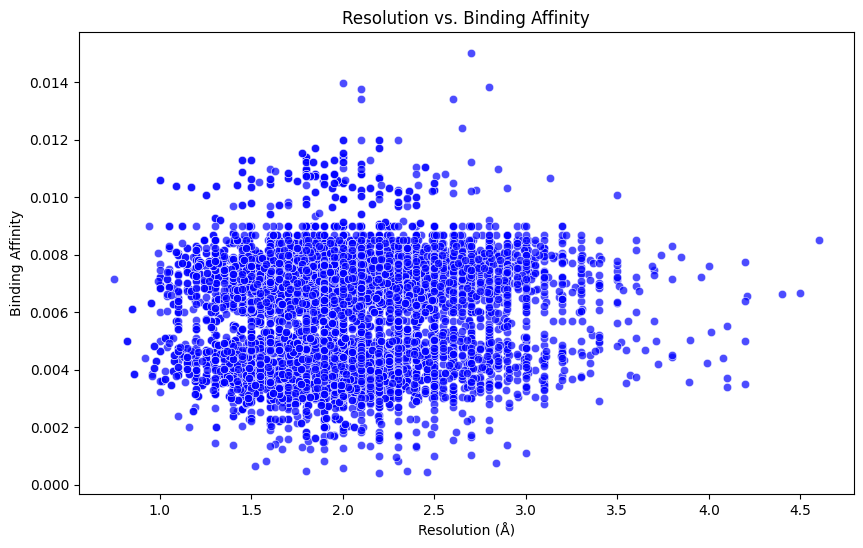

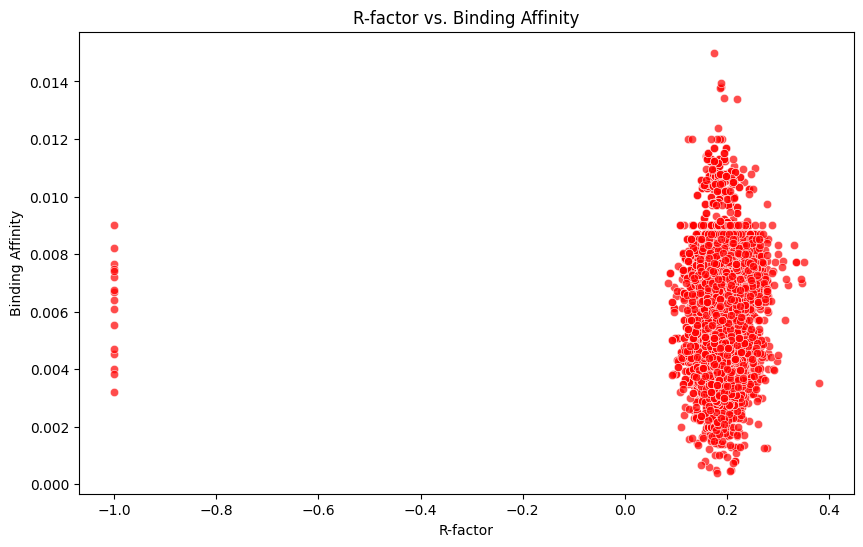

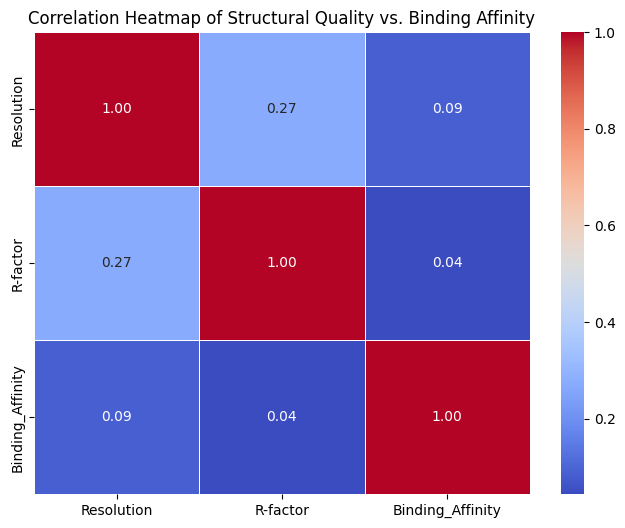

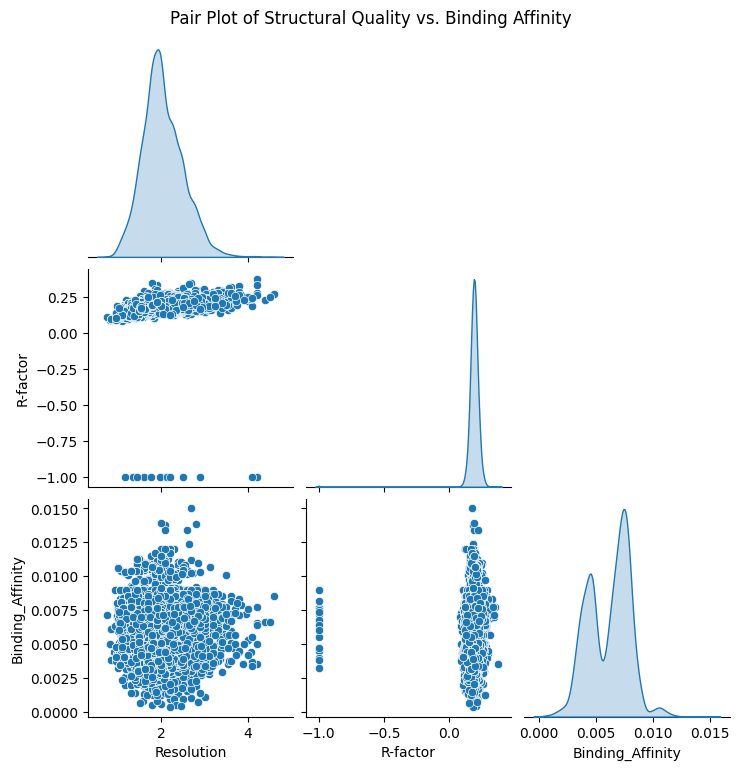

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

df['Resolution'] = pd.to_numeric(df['Resolution'], errors='coerce')
df['R-factor'] = pd.to_numeric(df['R-factor'], errors='coerce')
df['Binding_Affinity'] = pd.to_numeric(df['Binding_Affinity'], errors='coerce')
df_clean = df.dropna(subset=['Resolution', 'R-factor', 'Binding_Affinity'])

plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_clean, x='Resolution', y='Binding_Affinity', alpha=0.7, color='b')
plt.title('Resolution vs. Binding Affinity')
plt.xlabel('Resolution (Å)')
plt.ylabel('Binding Affinity')
plt.show()

plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_clean, x='R-factor', y='Binding_Affinity', alpha=0.7, color='r')
plt.title('R-factor vs. Binding Affinity')
plt.xlabel('R-factor')
plt.ylabel('Binding Affinity')
plt.show()

plt.figure(figsize=(8, 6))
correlation_matrix = df_clean[['Resolution', 'R-factor', 'Binding_Affinity']].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Heatmap of Structural Quality vs. Binding Affinity')
plt.show()

sns.pairplot(df_clean[['Resolution', 'R-factor', 'Binding_Affinity']], diag_kind='kde', corner=True)
plt.suptitle('Pair Plot of Structural Quality vs. Binding Affinity', y=1.02)
plt.show()

<ipython-input-22-be079f44d656>:17: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  missing_values = df.groupby('Data_Type').apply(lambda x: x.isnull().sum()).T
<ipython-input-22-be079f44d656>:23: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='Data_Type', y='Binding_Affinity', palette='coolwarm')



Missing Values in Raw vs. Refined Datasets:

Data_Type                    Raw  Refined
PDB_Code                       0        0
Release_Year_merged          212     2350
Release_Year                   0        0
Uniprot_ID                   235     2813
Protein_Name                 235     2813
Resolution                     0        0
Binding_Data                   0        0
Reference_ligand             212     2350
Reference                      0        0
Ligand_Name                  212     2350
R-factor                     212     2350
R-free                       212     2350
Delta-R                      212     2350
SMILES                       212     2350
Molecular_Weight             212     2350
Binding_Affinity             288    16840
Binding_Value                320    16912
Binding_Affinity_Type        212     2350
Sequence_Length              235     2813
Isoelectric_Point            235     2813
Functional_Class               0        0
Resolution1                   

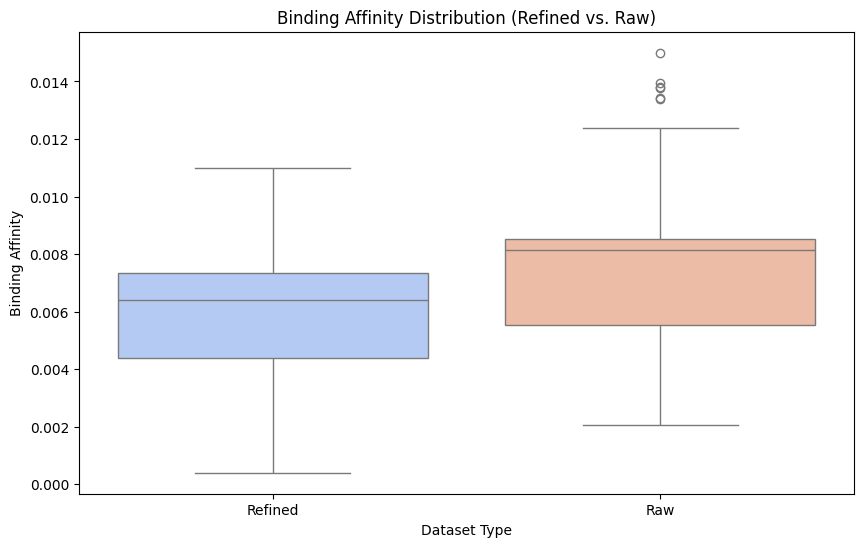

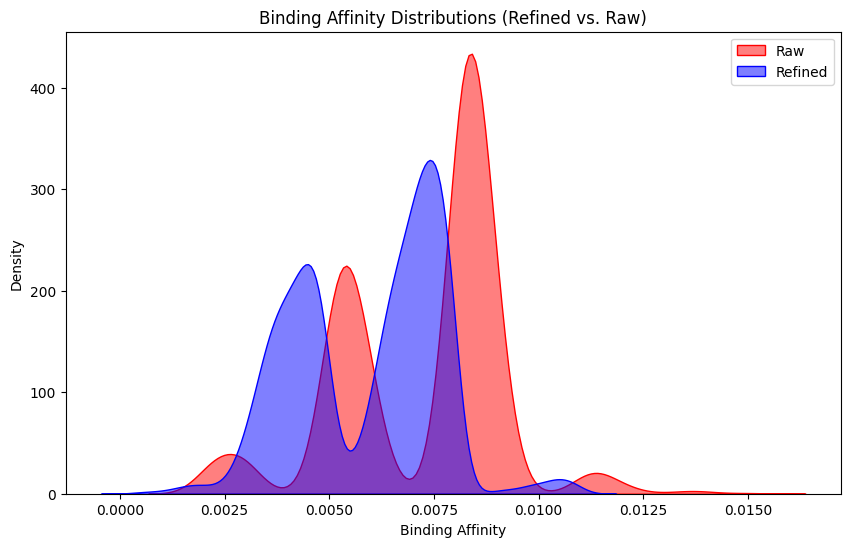

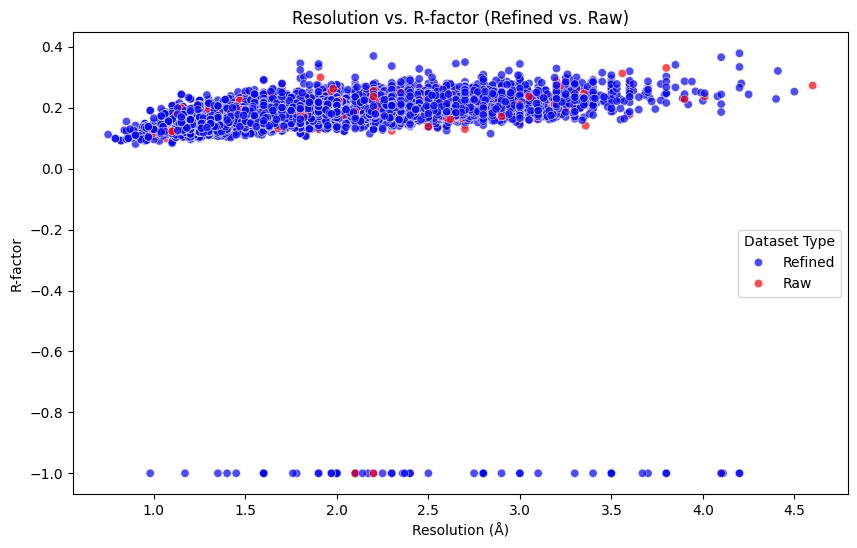

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

df['Resolution'] = pd.to_numeric(df['Resolution'], errors='coerce')
df['R-factor'] = pd.to_numeric(df['R-factor'], errors='coerce')
df['Binding_Affinity'] = pd.to_numeric(df['Binding_Affinity'], errors='coerce')
df['Data_Type'] = np.where(df['Processed_Binding_Data(um)'].notna(), 'Refined', 'Raw')
missing_values = df.groupby('Data_Type').apply(lambda x: x.isnull().sum()).T
print("\nMissing Values in Raw vs. Refined Datasets:\n")
print(missing_values)

plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x='Data_Type', y='Binding_Affinity', palette='coolwarm')
plt.title('Binding Affinity Distribution (Refined vs. Raw)')
plt.xlabel('Dataset Type')
plt.ylabel('Binding Affinity')
plt.show()

plt.figure(figsize=(10, 6))
sns.kdeplot(df[df['Data_Type'] == 'Raw']['Binding_Affinity'], label='Raw', fill=True, alpha=0.5, color='r')
sns.kdeplot(df[df['Data_Type'] == 'Refined']['Binding_Affinity'], label='Refined', fill=True, alpha=0.5, color='b')
plt.title('Binding Affinity Distributions (Refined vs. Raw)')
plt.xlabel('Binding Affinity')
plt.ylabel('Density')
plt.legend()
plt.show()

plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='Resolution', y='R-factor', hue='Data_Type', alpha=0.7, palette={'Raw': 'red', 'Refined': 'blue'})
plt.title('Resolution vs. R-factor (Refined vs. Raw)')
plt.xlabel('Resolution (Å)')
plt.ylabel('R-factor')
plt.legend(title="Dataset Type")
plt.show()